In [1]:
# depending on where you run this, this may have to be %matplotlib notebook
%matplotlib inline

import os
import astropy
import requests
import pandas as pd
import numpy as np
import lightkurve as lk 
from scipy.interpolate import interp1d
from astropy.modeling import models, fitting
import matplotlib.pyplot as plt
import emcee
import sys
import csv
from astropy.timeseries import LombScargle
from os.path import basename, exists

# change these paths to wherever you have the files
# sys.path.insert(1,'/Users/neisner/Documents/code/utils/')
import filters # Suzanne's functions
import norm

# change these paths to wherever you have the files
# sys.path.insert(1,'/Users/neisner/Documents/code/ETV')
import etv_functions # Nora's functions 

%matplotlib inline

In [2]:
from IPython.display import display, HTML, Javascript, clear_output

display(HTML("<style>.container { width:99% !important; }</style>"))  # Jupyter 6
display(HTML("<style>.jp-Notebook { --jp-notebook-max-width: 98%; }</style>"))  # Jupyter 7

# define the paths where the data will be stores - NEED TO CHANGE THIS TO YOUR OWN PATH
outfile_base = './etv_out'  # for ETV
lk_download_dir = 'C:/dev/_juypter/PH_TESS_LightCurveViewer/data'  

# A command from shell that can be run to notify users, e.g., fitting is finished. Use "echo" if you do not have one
NOTIFY_CMD = "win-notify.bat"

if hasattr(lk, "conf"):  # default download dir
    lk.conf.cache_dir = lk_download_dir
if hasattr(lk.search, "sr_cache"):   # PR for persistent query result cache
    lk.search.sr_cache.cache_dir = lk_download_dir  # None
    lk.search.sr_cache.expire_second = 86400

In [3]:
# define the plotting parameters

figsize = (8,4)

In [4]:
# import the data

# choose a TIC ID to analyze
ticid =  382101519

# define the paths where the data will be stores - NEED TO CHANGE THIS TO YOUR OWN PATH
outfile_path = f"{outfile_base}/tic{ticid}_etv_primary.csv"
outfile_path_s = f"{outfile_base}/tic{ticid}_etv_secondary.csv"


# import data using Lightkurve
# sr = lk.search_lightcurve('TIC {}'.format(ticid), author = 'SPOC')  
if not "../.." in sys.path:
    sys.path.append("../..")
import lightkurve_ext as lke  # at ../../
import astropy.units as u

sr = lk.search_lightcurve('TIC {}'.format(ticid))  # get long cadence data too
sr = lke.filter_by_priority(sr, author_priority=['SPOC', 'TESS-SPOC'], exptime_priority=['short', 'long', 'fast'])
sr = sr[sr.exptime != 1800 *u.s]  # exclude 30min cadence data for now (sectors 1-13)
sr = sr[np.isin(sr.author, ['SPOC', 'TESS-SPOC'])]  # exclude QLP to ensure for uniformity in the data
sr = lke._sort_chronologically(sr)  # workaround lightkurve v2.4.2+ change in sort order
display(sr)
search_result = sr.download_all().stitch()

time = search_result.time.value
flux = search_result.flux.value
fluxerr = search_result.flux_err.value
len(search_result)

#,mission,year,author,exptime,target_name,distance,proposal_id
,,,,s,,arcsec,
0,TESS Sector 27,2020,SPOC,120,382101519,0.0,G03251
1,TESS Sector 28,2020,SPOC,120,382101519,0.0,G03251
2,TESS Sector 29,2020,SPOC,120,382101519,0.0,G03251
3,TESS Sector 30,2020,SPOC,120,382101519,0.0,G03251
4,TESS Sector 31,2020,SPOC,120,382101519,0.0,G03251
5,TESS Sector 32,2020,SPOC,120,382101519,0.0,G03251
6,TESS Sector 33,2020,SPOC,120,382101519,0.0,G03251
7,TESS Sector 34,2021,SPOC,120,382101519,0.0,G03251
8,TESS Sector 35,2021,SPOC,120,382101519,0.0,G03251


305641

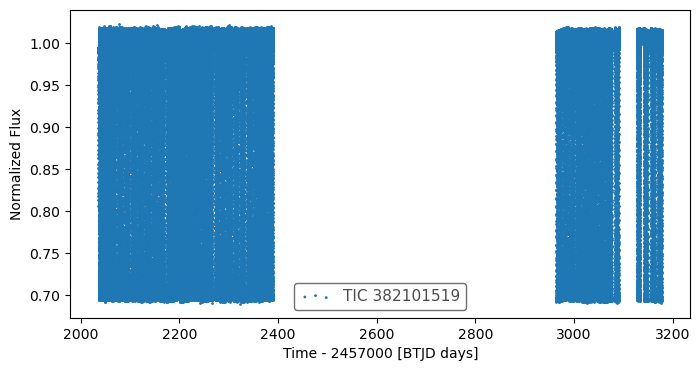

In [5]:
%matplotlib inline
# %matplotlib widget

# mask out data you don't like...

fig, ax = plt.subplots(figsize=figsize)
search_result.scatter(ax = ax)

# t0 = 2337.376
# period_triple = 0.774

mask = time < 0  # (time > 2893.16-1) & (time < 2893.16+1) 

time = time[~mask]
flux = flux[~mask]
fluxerr = fluxerr[~mask]

# make sure that therte are no nans!

finite_mask = np.isfinite(time) * np.isfinite(flux) * np.isfinite(fluxerr)

# make a dictionary of the data 

data = pd.DataFrame({'time': time[finite_mask], 'flux': flux[finite_mask], 'err': fluxerr[finite_mask]})


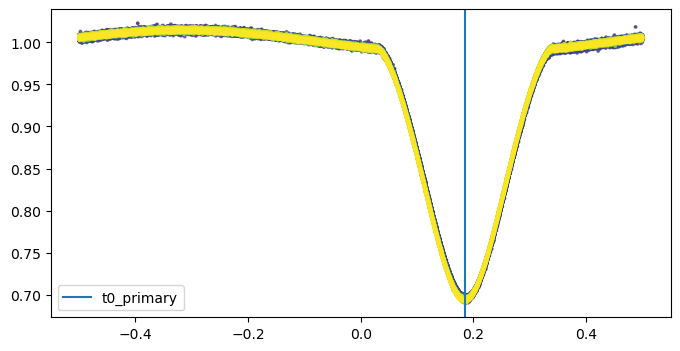

In [6]:
%matplotlib inline
# %matplotlib widget

# define the orbital period and the t0 

# FILL-IN THE eclipse epoch / period, 
# epoch=2036.4003, duration_hr=2.0000, period=0.672261, label="s0001-s0039:TCE1", depth_pct=30.16
# epoch=2036.9324, duration_hr=8.0676, period=0.672297, label="s0001-s0039:TCE2", depth_pct=10.32
period = 0.672261  # TCE1
period = 0.672259  # MCMC Period, 0.6722592432003386
period = 0.672260  # Average between TCE1 and MCMC Period


t0_primary = 2036.4003
t0_secondary = None

duration_hr_primary = 2.0000  # used for the window to cut the lighcurve around eclipses in later cells
duration_hr_secondary = None


t0_for_plotting = 0  # keep 0 for plotting purposes
# t0_for_plotting = t0_primary - np.abs(t0_primary - t0_secondary) * 0.25  # use a custom one so that the eclipses are not near the edge (-0.5 or +0.5)

phase = etv_functions.phase_data(data['time'], t0_for_plotting, period)

fig, ax = plt.subplots(figsize = (8,4))

plt.scatter(phase,data['flux'], s = 3, alpha = 0.7, c = data['time'])

# add the phase to the dataframe
data['phase'] = phase

plt.axvline(etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0], label="t0_primary")
if t0_secondary is not None:
    plt.axvline(etv_functions.phase_data([t0_secondary], t0_for_plotting, period)[0], linestyle="--", label="t0_secondary")
plt.legend()
# plt.ylim(0.535, 0.55)
# plt.xlim(-0.5, 0.1)
plt.show();

### Now that the data is ready we can start 

In [ ]:
# show data to visualize what's changed in each step below
data  

In [ ]:
# phase fold the data and create an appoximate binary model (top) and subtract it from the data (bottom)
#_, _ , flux_sub_binary, model, _, _ = etv_functions.trend_removal_interact(period, 0, data['time'], data['flux'], data['time'], data['flux'])

data = etv_functions.trend_removal_interact(period, t0_for_plotting, data)
data

In [ ]:
# if you want to detrend the data run this line!

data = etv_functions.detrend_suz(data, T_dur = 10, plot = True)
data

In [ ]:
# plot the phase folded data here so that you know at what phase you want to cut the data to model 
fig, ax = plt.subplots(figsize = figsize)
plt.scatter(data.phase, data.flux_detrended, s = 1)
plt.show()

Primary:   2036.4003 0.18558295897450172
window_width_p (phase): 0.1735439661242178


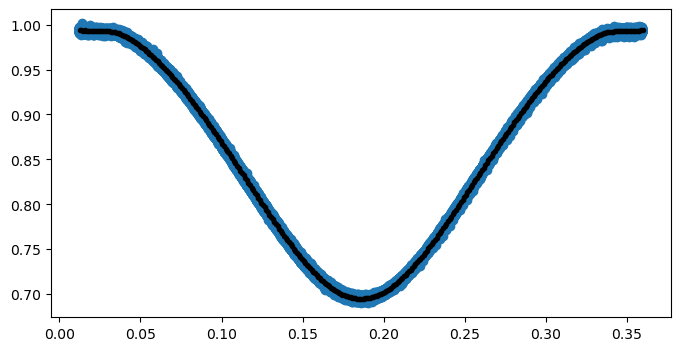

In [7]:
# define the midpoints of the primary and secondary eclipses and the window width

# if these don't look central - change them!! the eclipses should be central
midpoint_p =  etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0]  # convet to time in phase
print('Primary:  ', t0_primary, midpoint_p)

# change depending on the width of the eclipses, default to be slightly larger than the primary eclipse
window_width_p = 1.4 * duration_hr_primary / 24 / period
print("window_width_p (phase):", window_width_p)

data_primary = data[(data['phase'] > midpoint_p - window_width_p) & (data['phase'] < midpoint_p + window_width_p) ]
ph_binned,flux_binned,err_binned = etv_functions.run_binning_phased(data_primary.phase, data_primary.flux, yerr=data_primary.err,nbins=1000)


# -- -- -- -- -- -- -- -- -- 

fig = plt.subplots(figsize=figsize, sharex=True)
plt.errorbar(ph_binned, flux_binned, yerr=err_binned, fmt=".k", capsize=0, zorder = 2)
plt.scatter(data_primary.phase, data_primary.flux, zorder = -2)
plt.show()

if t0_secondary is not None:
    midpoint_s =  etv_functions.phase_data([t0_secondary], t0_for_plotting, period)[0]
    print('Secondary:', t0_secondary, midpoint_s)
    
    window_width_s = 1.2 * duration_hr_secondary / 24 / period
    print("window_width_s (phase):", window_width_s)
    
    data_secondary = data[(data['phase'] > midpoint_s - window_width_s) & (data['phase'] < midpoint_s + window_width_s) ]
    ph_binned_s,flux_binned_s,err_binned_s = etv_functions.run_binning_phased(data_secondary.phase, data_secondary.flux, yerr=data_secondary.err,nbins=1000)

    # -- -- -- -- -- -- -- -- -- 
    fig = plt.subplots(figsize=figsize, sharex=True)
    plt.errorbar(ph_binned_s, flux_binned_s, yerr=err_binned_s, fmt=".k", capsize=0, zorder = 2)
    plt.scatter(data_secondary.phase, data_secondary.flux, zorder = -2)
    plt.show() 

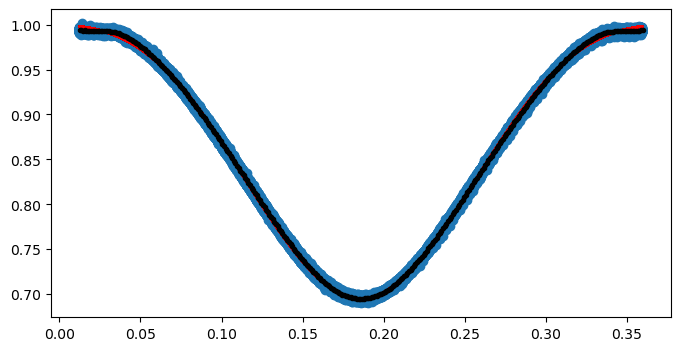

In [10]:
### # you need initial guesses!! The order is :
# alpha0, alpha1, t0, d, Tau - CHANGE THESE TO YOUR OWN INITIAL GUESSES
# median flux, -eclipse depth, t0, related to duration, related to shape (U or V) 
# t0 in normalixed phase
start_vals = [1.002, -0.308, midpoint_p, 0.073, 0.91]
start_vals_s = None

# - - -- - 

etv_functions.plot_initial_guess(data_primary, ph_binned, flux_binned, err_binned, *start_vals)
if t0_secondary is not None:
    etv_functions.plot_initial_guess(data_secondary, ph_binned_s, flux_binned_s, err_binned_s, *start_vals_s)


In [ ]:
# use MCMC to refine the period

use_mcmc_to_fit_period = False

if use_mcmc_to_fit_period:
    import etv_functions_with_period as etvp

    etv_functions.enable_info_log_for_jupyter()
        
    # MCMC result: 
    # mean_alpha0, mean_alpha1, mean_t0_time, mean_d, mean_Tau, mean_p = 1.001996186061453, -0.3075331280142441, 2036.4009796377825, 0.0731111676841226, 0.9098156201201393, 0.6722592432003386
    # std_p: 1.928246543598284e-09
    mean_alpha0, mean_alpha1, mean_t0_time, mean_d, mean_Tau, mean_p, fit_params_p_stats = etvp.run_mcmc_initial_fit_p(
        data_primary[:],
        [1, -0.3, t0_primary, 0.07, 1.1, period],
        nruns=1000, discard=600, 
        # nruns=20, discard=1, 
        pool=-1,
        plot_chains=True,
        plot=True,
        also_return_stats=True,
    )
    print("mean_alpha0, mean_alpha1, mean_t0_time, mean_d, mean_Tau, mean_p = " + ", ".join([str(v) for v in [mean_alpha0, mean_alpha1, mean_t0_time, mean_d, mean_Tau, mean_p]]))
    print("std_p:", fit_params_p_stats["std_p"])


100%|██████████████████████████████████████████████████████████| 1000/1000 [10:42<00:00,  1.56it/s]


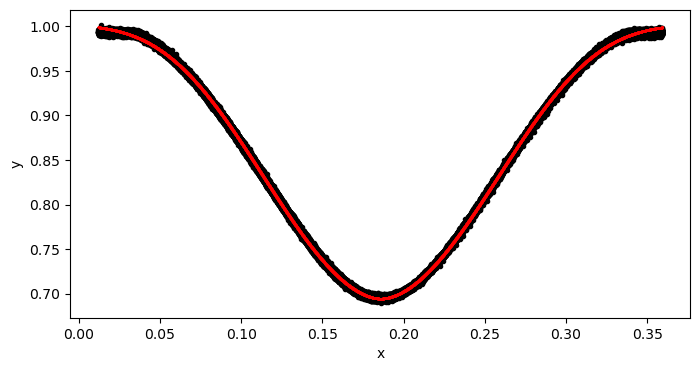

In [11]:
# run the initial model fit using MCMC for the primary and secondary eclipses 

mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau = etv_functions.run_mcmc_initial_fit(data_primary, start_vals, nruns = 1000, pool=-1, plot_chains = False, plot = True)
if t0_secondary is not None:
    mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s = etv_functions.run_mcmc_initial_fit(data_secondary, start_vals_s, nruns = 1000, pool=-1, plot_chains = False, plot = True)
!$NOTIFY_CMD "Initial fit done"

In [13]:
# Initial fit params
# mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau = 1.0019893158108606, -0.3074318350805525, 0.18030609273784778, 0.07313067337191818, 0.9099527924331019  # TCE1 Period
# mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau = 1.0020126665954763, -0.3075515503730368, 0.19134333600479636, 0.07311812402167404, 0.9097144222335216  # MCMC Period
mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau = 1.0020241557448426, -0.30754700709979943, 0.18582470803863016, 0.0731272288961789, 0.9096597541270673  # Average of TCE1 and MCMC

In [14]:
print("Initial model params:")  # For information, and they can be copied to the cell above for future reuse

print("mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau = " + ", ".join([str(v) for v in [mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau]]))

Initial model params:
mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau = 1.0020241557448426, -0.30754700709979943, 0.18582470803863016, 0.0731272288961789, 0.9096597541270673


1699

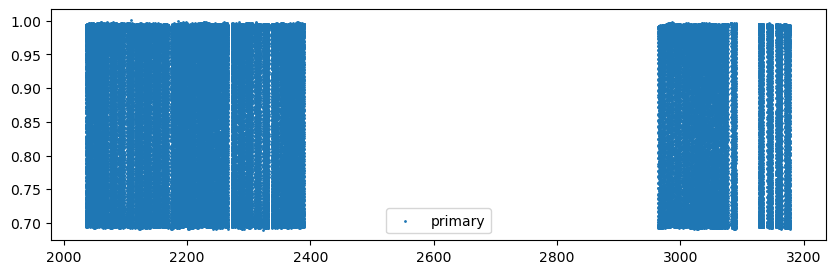

In [15]:
fig = plt.subplots(figsize=(10, 3), sharex=True)
plt.scatter(data_primary.time,data_primary.flux , s = 1, label = 'primary')
if t0_secondary is not None:
    plt.scatter(data_secondary.time,data_secondary.flux , s = 1, label = 'secondary')
plt.legend()

# calculate the number of transits there are within the data 
n_transits = int((max(data_primary.time) - min(data_primary.time)) / period)
n_transits

2036.4003 0.67226 2036.4003


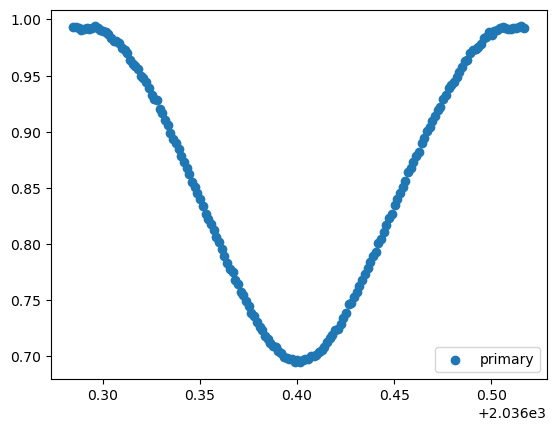

2036.4003 0.67226 2037.07256


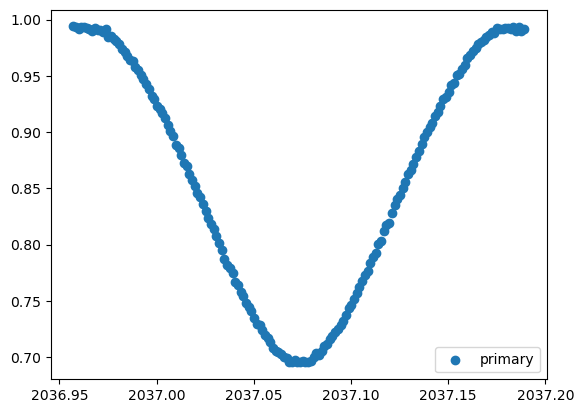

2036.4003 0.67226 2037.7448200000001


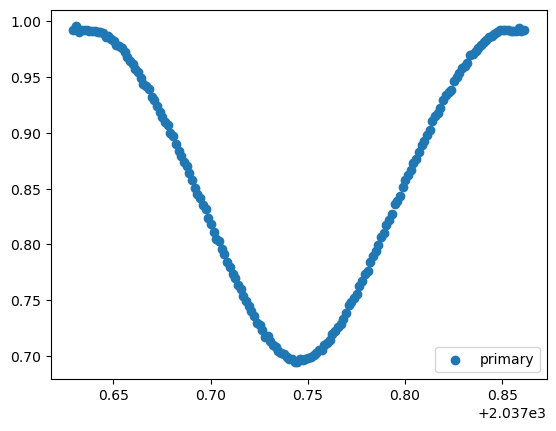

In [16]:
tr_index = range(0,n_transits)

for i in tr_index[0:3]:        
    transit_time = t0_primary+(period*i)
    x = np.array(data_primary.time)
    y = np.array(data_primary.flux) 
    yerr = np.array(data_primary.err)
    
    print (t0_primary, period, transit_time)
    
    mask = (x > (transit_time - (0.2*period))) & (x < (transit_time + (0.2*period))) 
    
    x = np.array(x[mask])
    y = np.array(y[mask]) 
    yerr = np.array(yerr[mask])
    fig, ax = plt.subplots()
    plt.scatter(x,y, label="primary")
    plt.legend(loc="lower right")
    plt.show()
    

if t0_secondary is not None:
    for i in tr_index[0:3]:        
        transit_time = t0_secondary+(period*i)
        x = np.array(data_secondary.time)
        y = np.array(data_secondary.flux) 
        yerr = np.array(data_secondary.err)
        
        print (t0_secondary, period, transit_time)
        
        mask = (x > (transit_time - (0.2*period))) & (x < (transit_time + (0.2*period))) 
        
        x = np.array(x[mask])
        y = np.array(y[mask]) 
        yerr = np.array(yerr[mask])
        fig, ax = plt.subplots()
        plt.scatter(x,y, label="secondary")
        plt.legend(loc="lower right")
        plt.show()

Fitting individual primary eclipses...
Existing manifest file found, will skip previously processed LCs and append to end of manifest file
Number 0 has already been completed -- skip
2037.07256 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 318.49it/s]


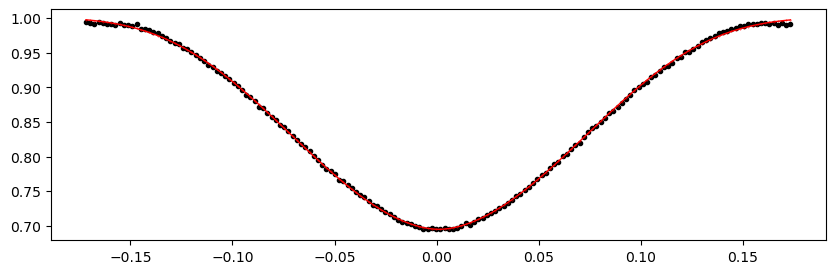

2037.7448200000001 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:34<00:00, 292.34it/s]


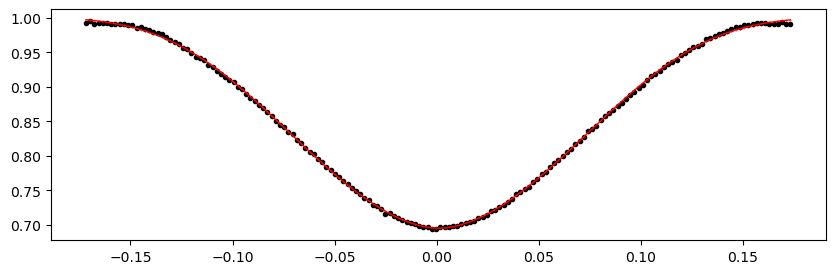

2038.41708 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 319.52it/s]


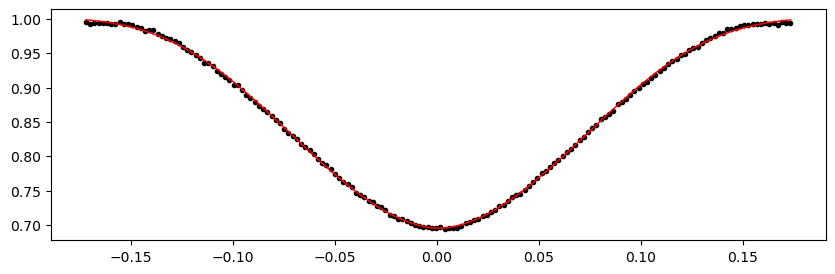

2039.08934 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 319.17it/s]


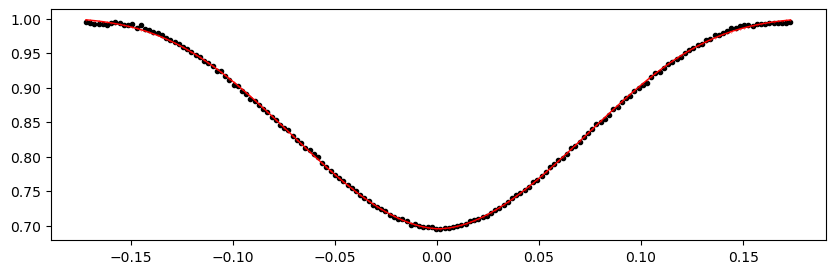

2039.7616 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:32<00:00, 308.11it/s]


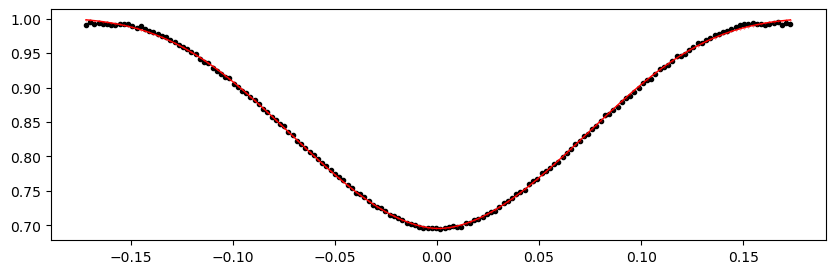

2040.43386 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 316.45it/s]


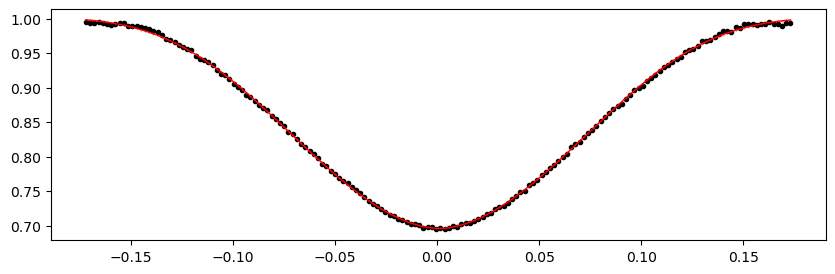

2041.10612 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:32<00:00, 311.39it/s]


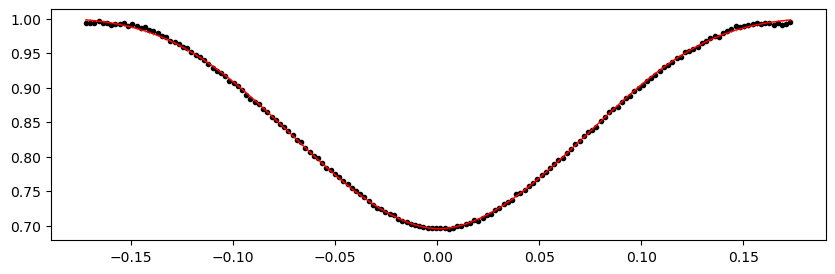

2041.77838 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 319.52it/s]


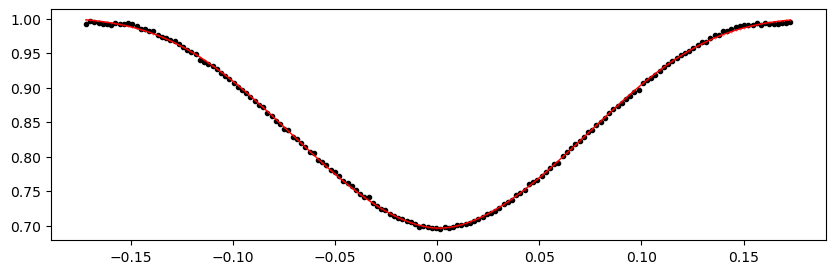

2042.45064 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 319.87it/s]


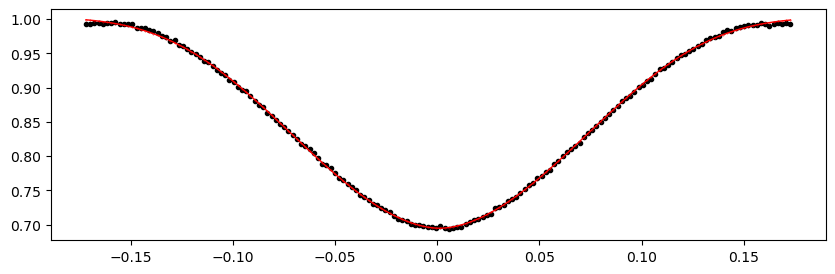

2043.1229 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 319.68it/s]


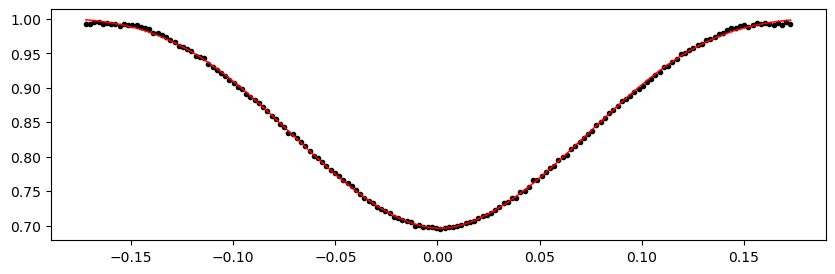

2043.7951600000001 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 317.33it/s]


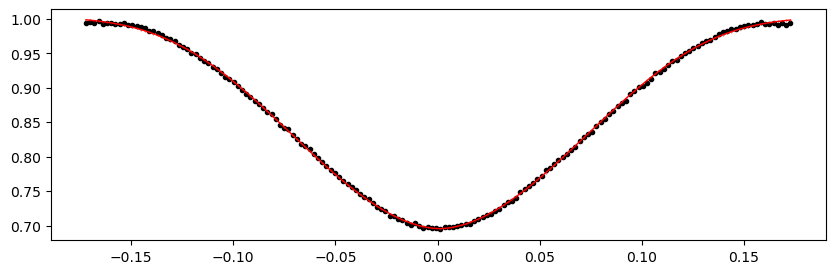

2044.46742 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 316.48it/s]


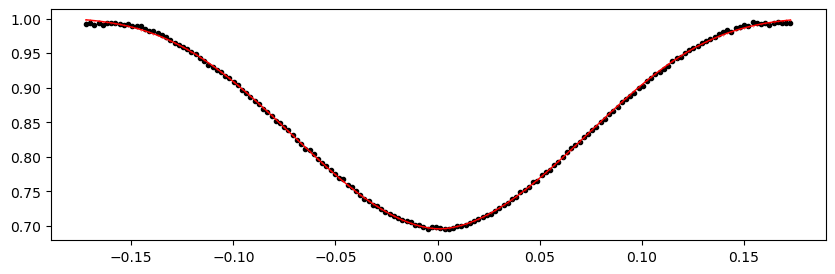

2045.13968 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 317.48it/s]


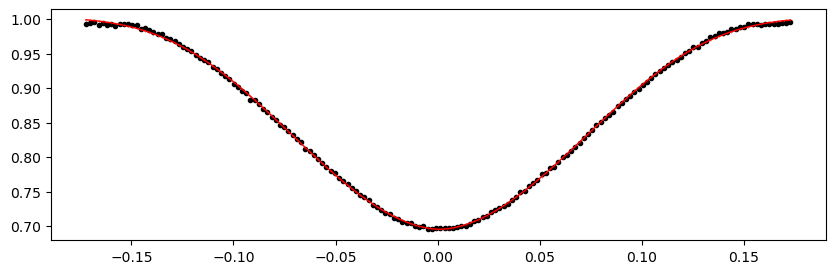

2045.81194 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 315.65it/s]


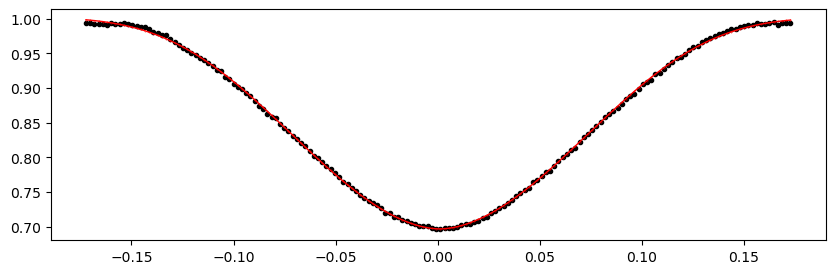

2046.4842 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:32<00:00, 308.30it/s]


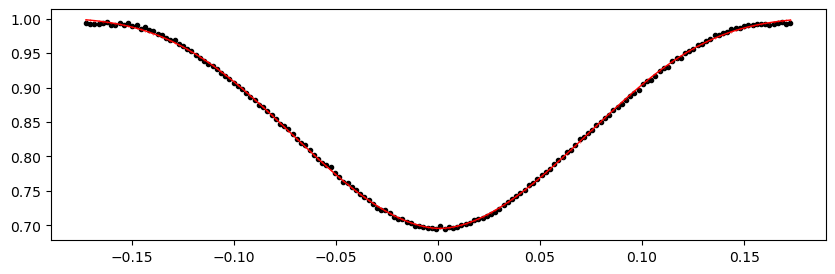

2047.15646 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 335.44it/s]


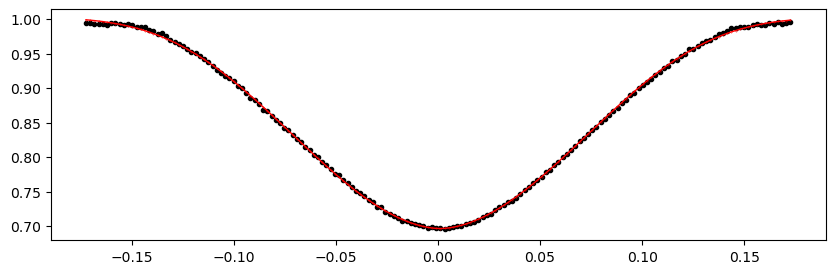

2047.82872 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 402.17it/s]


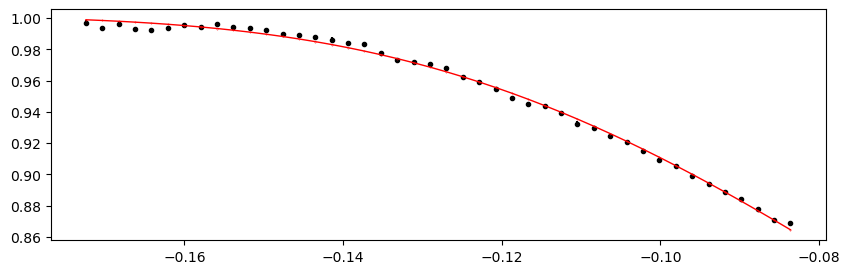

2049.17324 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 380.07it/s]


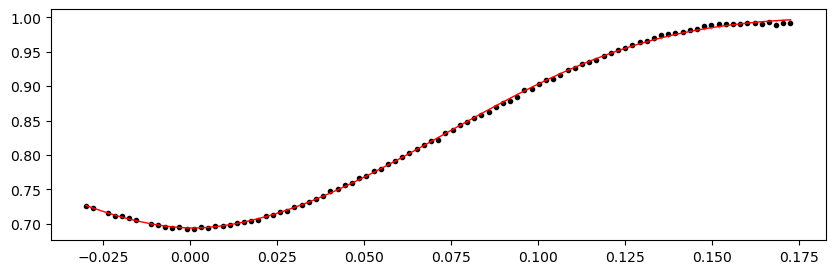

2049.8455 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 334.74it/s]


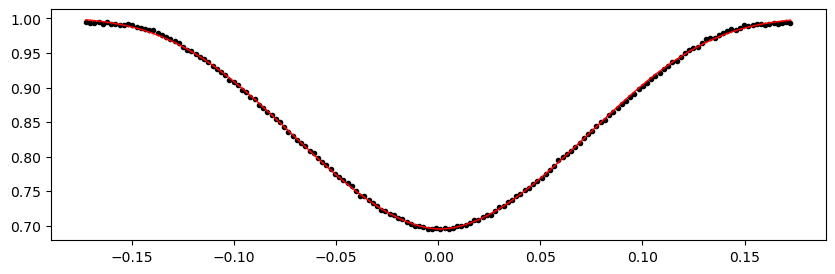

2050.51776 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 337.07it/s]


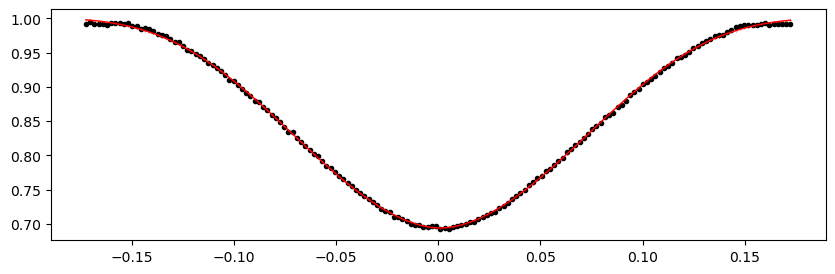

2051.19002 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:32<00:00, 309.10it/s]


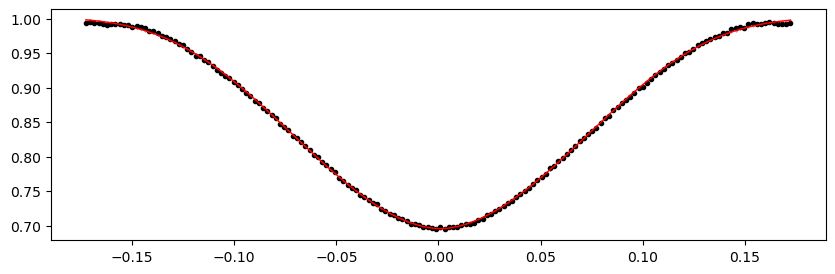

2051.86228 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 336.01it/s]


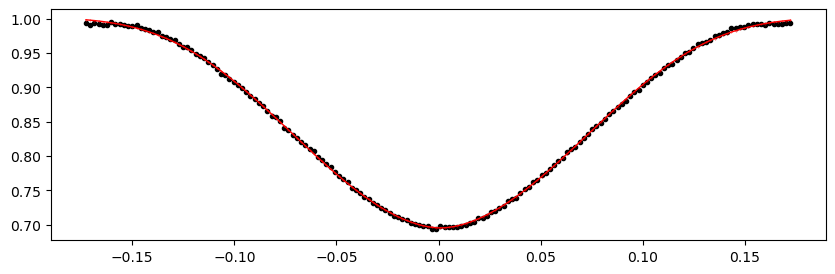

2052.53454 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 339.37it/s]


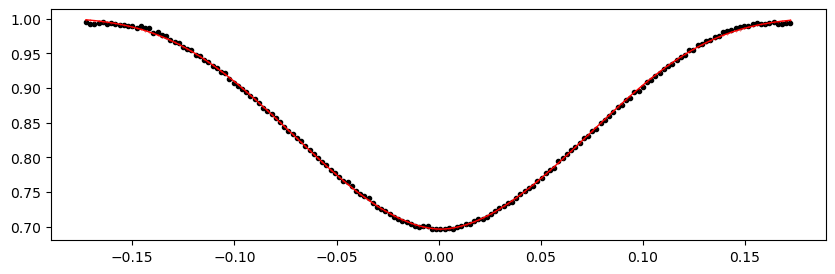

2053.2068 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 335.26it/s]


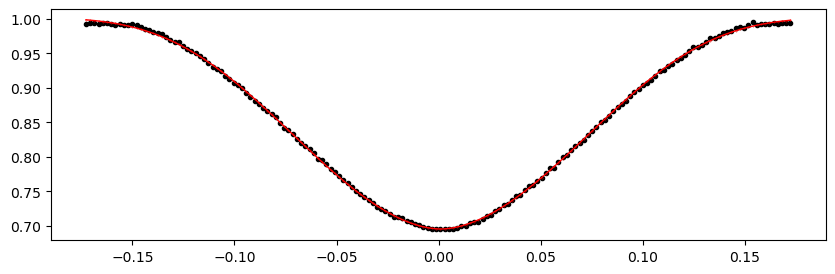

2053.87906 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 336.17it/s]


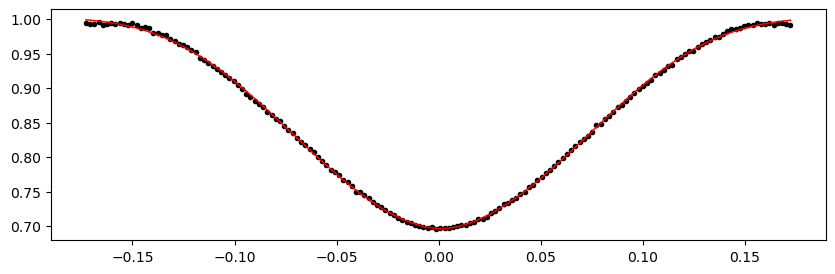

2054.55132 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 335.84it/s]


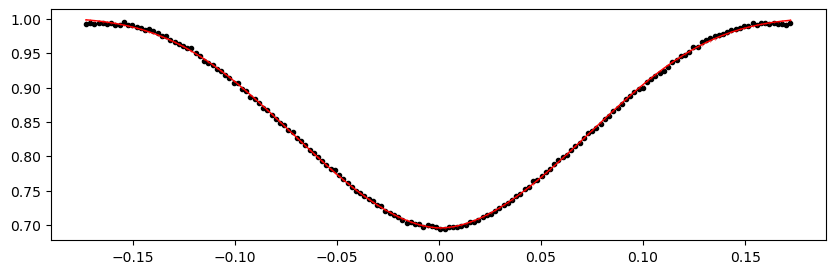

2055.22358 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 330.61it/s]


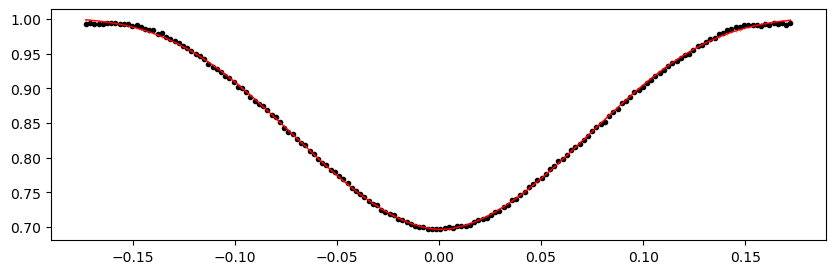

2055.89584 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 337.41it/s]


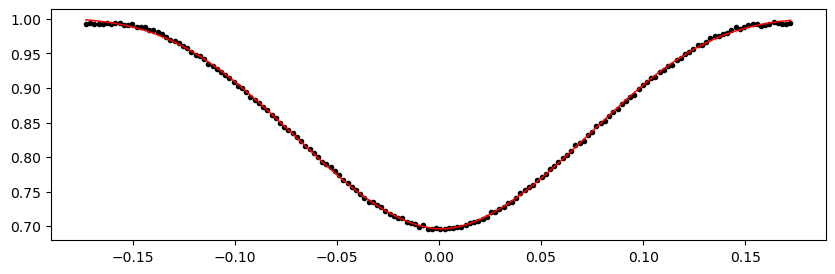

2056.5681 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 334.36it/s]


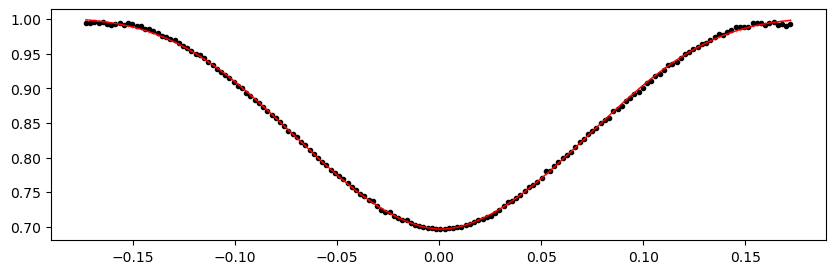

2057.2403600000002 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 335.64it/s]


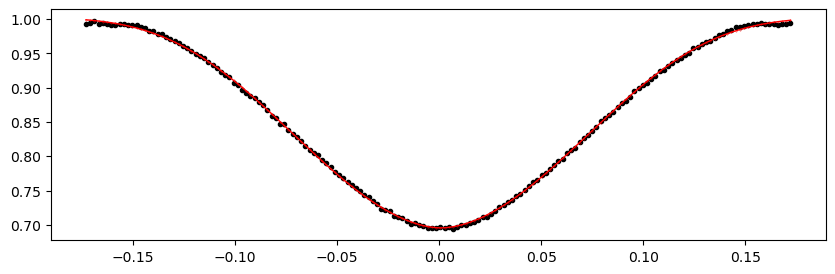

2057.91262 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 336.13it/s]


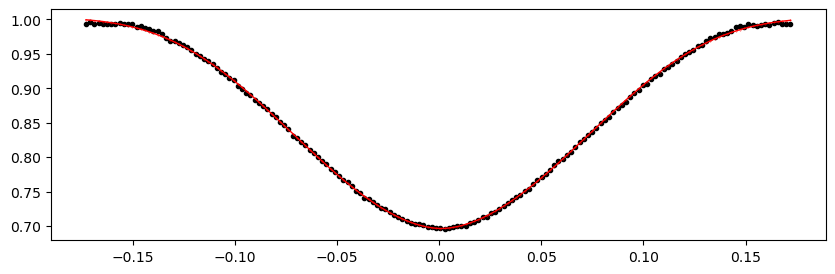

2058.58488 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 336.87it/s]


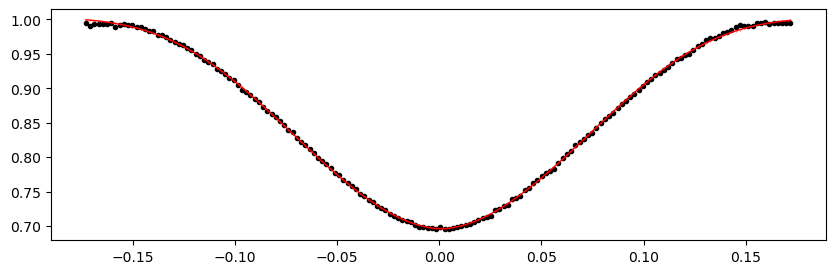

2059.25714 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 338.06it/s]


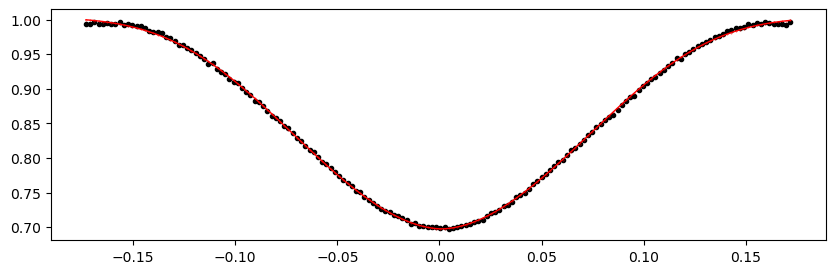

2059.9294 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 337.24it/s]


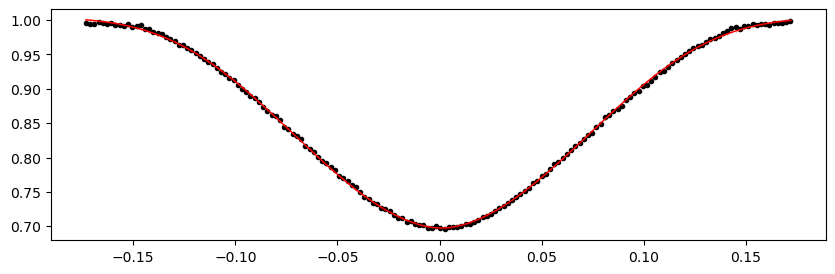

2060.60166 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 392.49it/s]


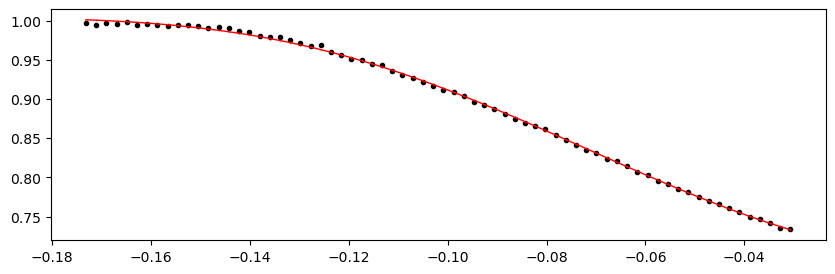

2061.94618 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 343.94it/s]


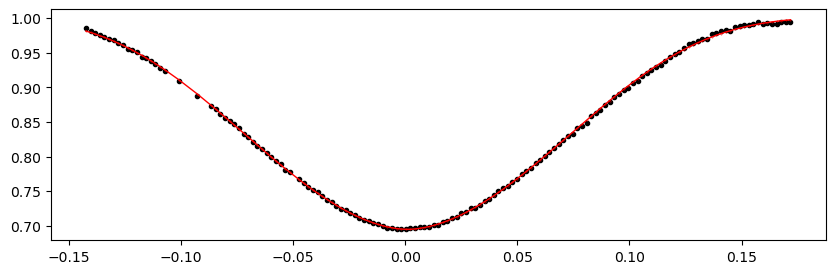

2062.61844 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 337.41it/s]


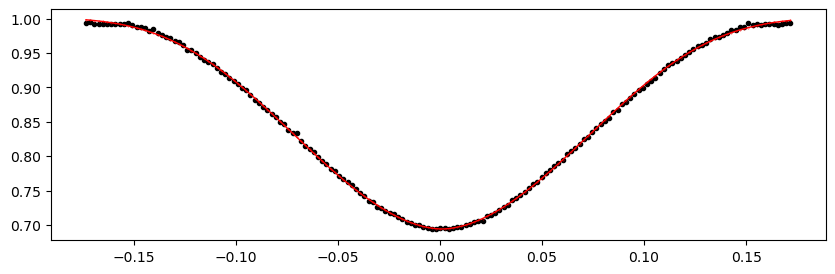

2063.2907 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 334.58it/s]


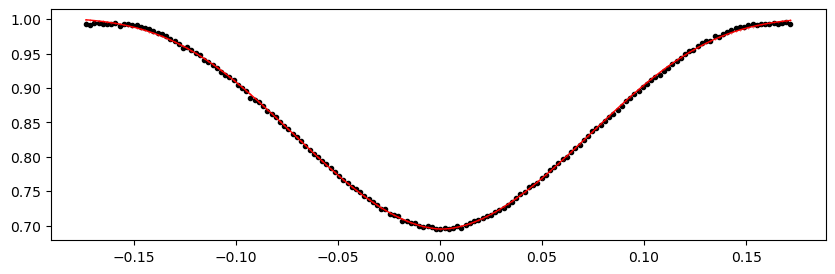

2063.96296 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 331.43it/s]


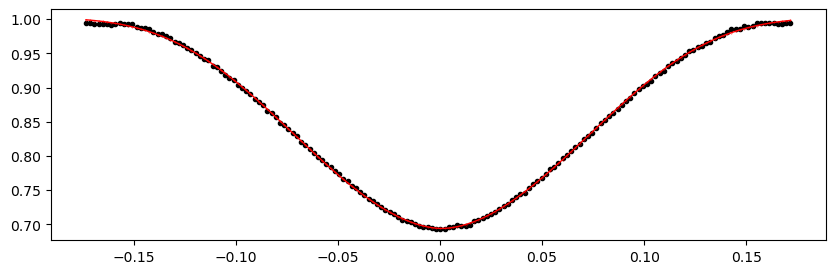

2064.63522 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 335.79it/s]


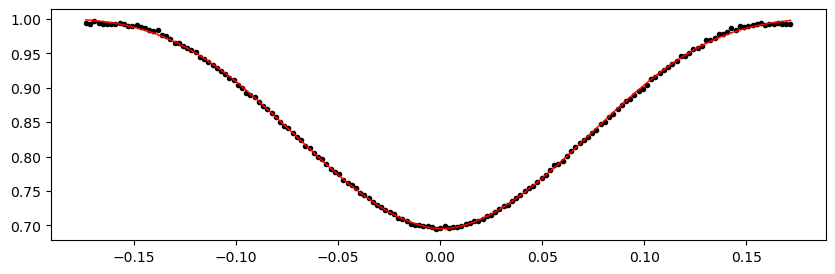

2065.30748 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 337.58it/s]


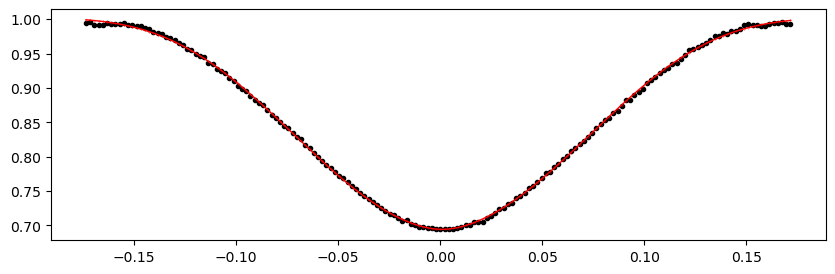

2065.97974 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 339.02it/s]


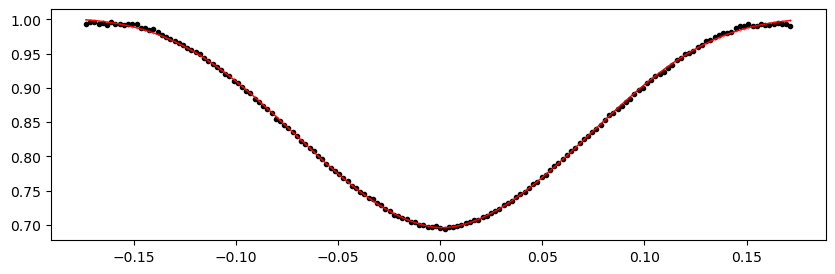

2066.652 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 337.75it/s]


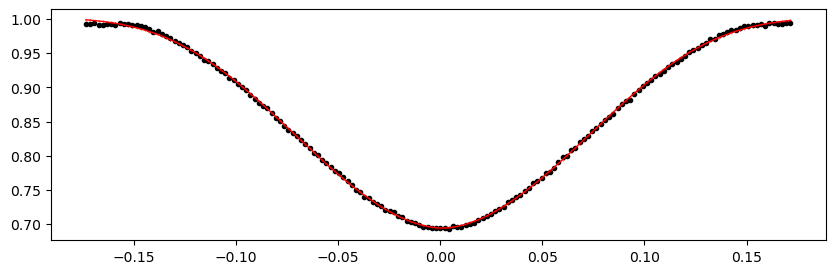

2067.32426 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 337.25it/s]


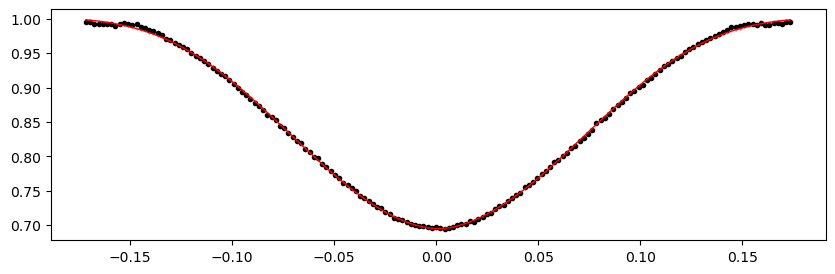

2067.99652 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 313.65it/s]


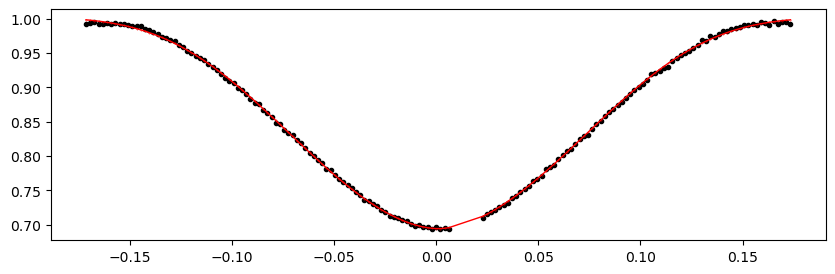

2068.66878 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 337.37it/s]


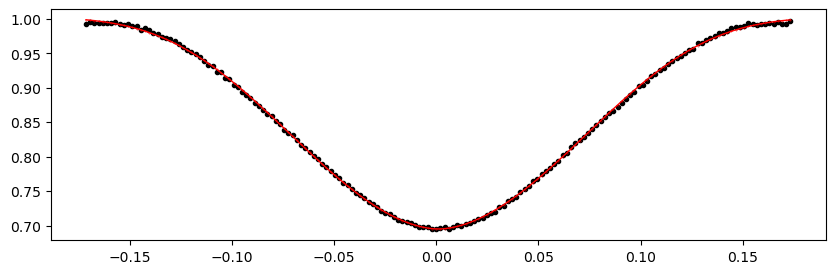

2069.34104 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 336.80it/s]


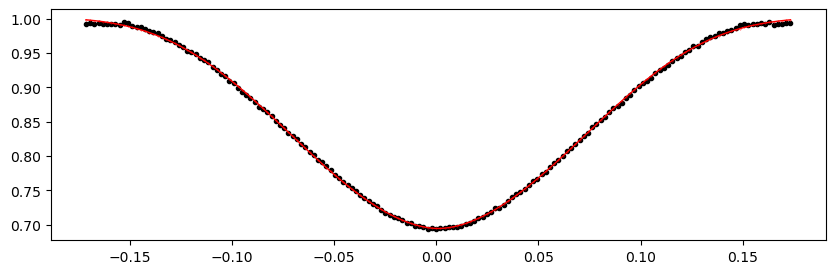

2070.0133 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 338.28it/s]


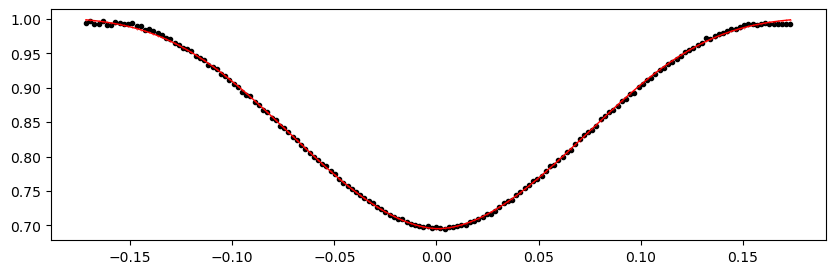

2070.68556 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 337.58it/s]


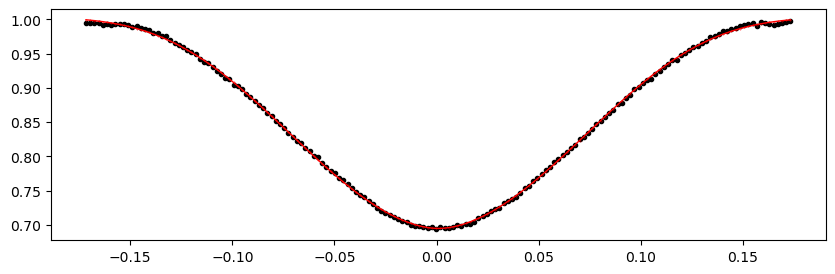

2071.35782 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 338.31it/s]


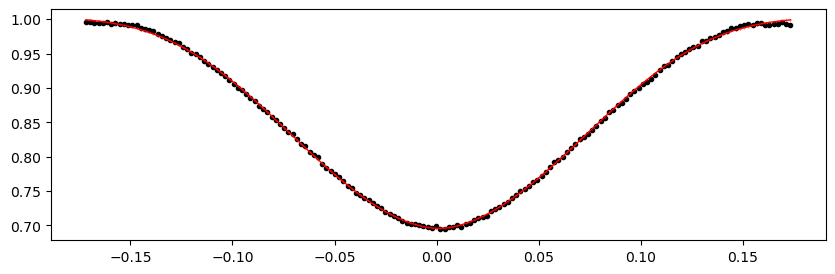

2075.39138 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 337.04it/s]


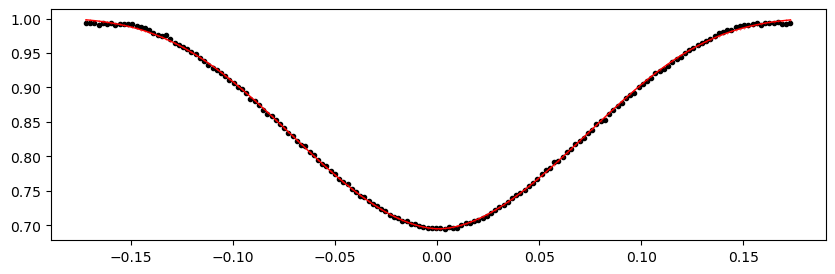

2076.06364 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 335.44it/s]


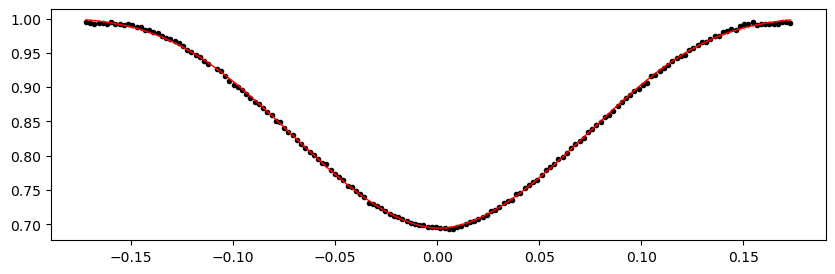

2076.7359 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 336.68it/s]


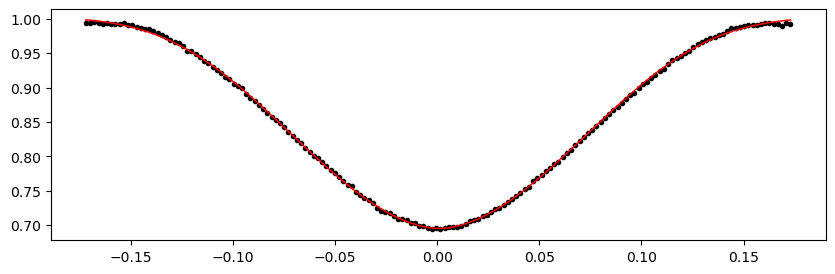

2077.40816 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 339.77it/s]


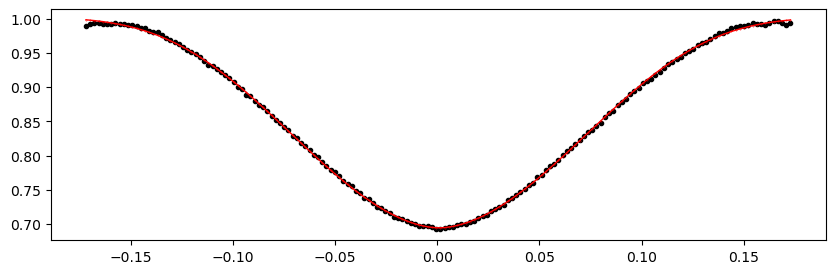

2078.0804200000002 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 336.49it/s]


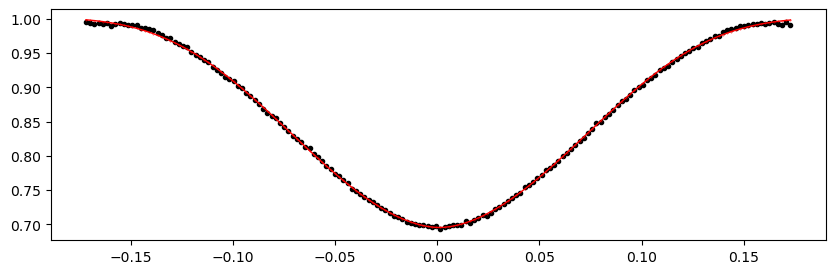

2078.75268 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 334.56it/s]


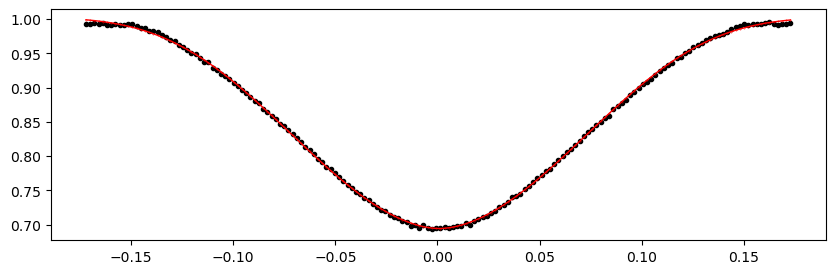

2079.42494 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 335.80it/s]


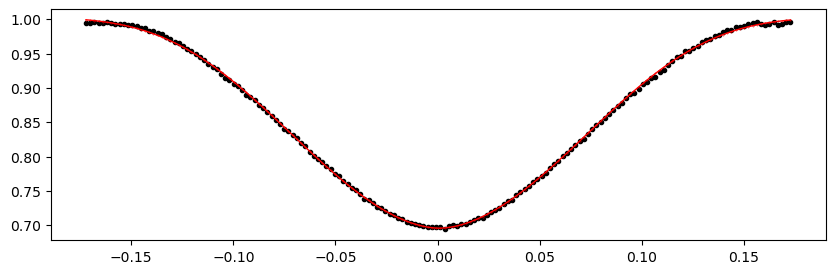

2080.0972 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 339.20it/s]


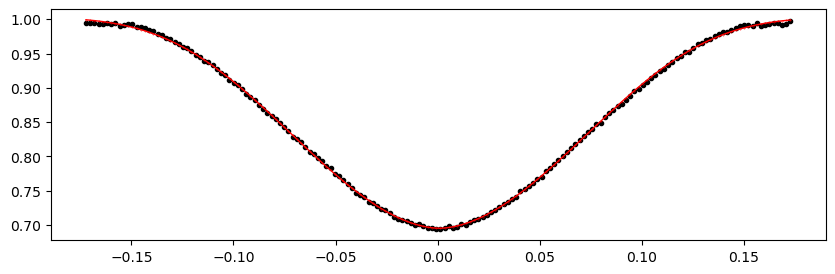

2080.76946 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 339.19it/s]


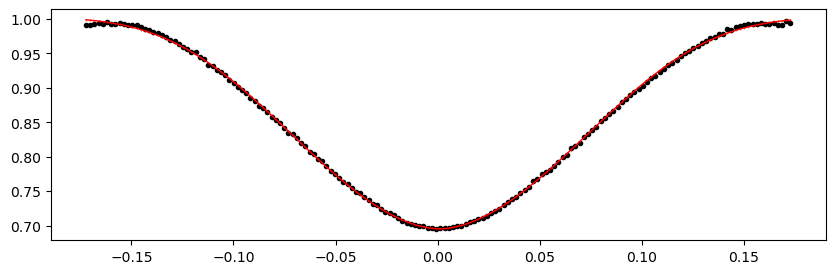

2081.44172 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 327.94it/s]


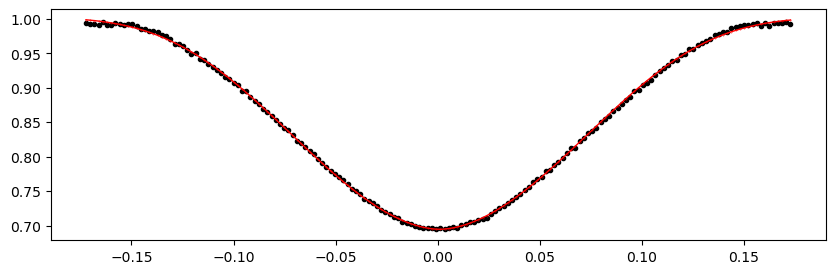

2082.11398 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 338.10it/s]


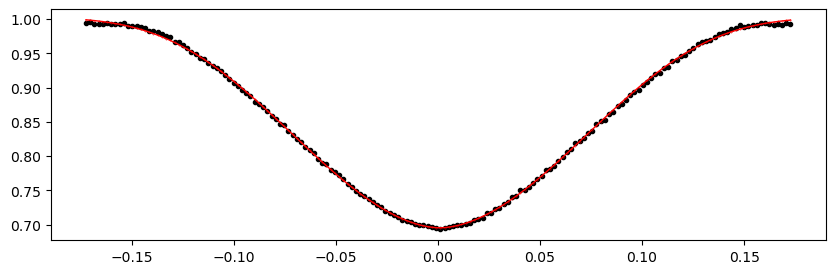

2082.78624 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 337.77it/s]


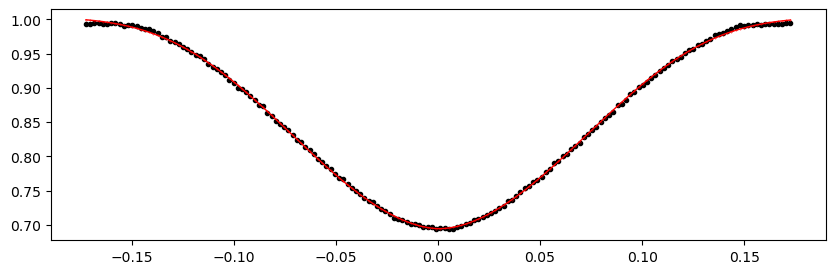

2083.4585 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 339.19it/s]


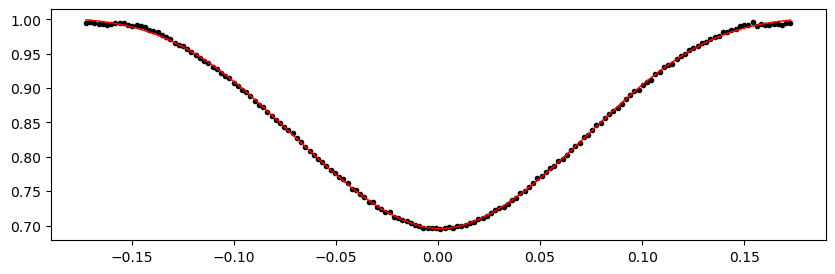

2084.13076 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 337.41it/s]


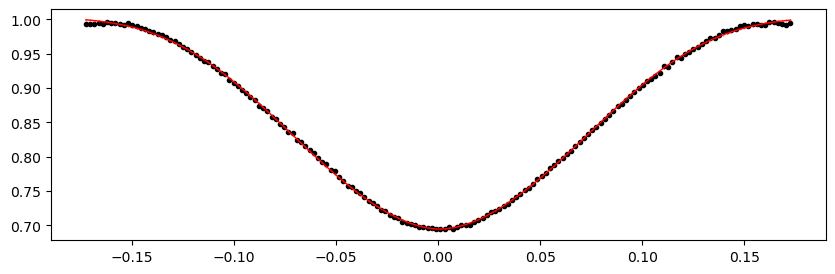

2084.80302 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 366.74it/s]


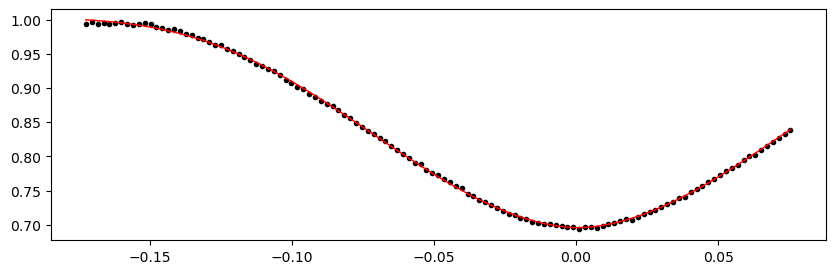

2085.47528 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 352.32it/s]


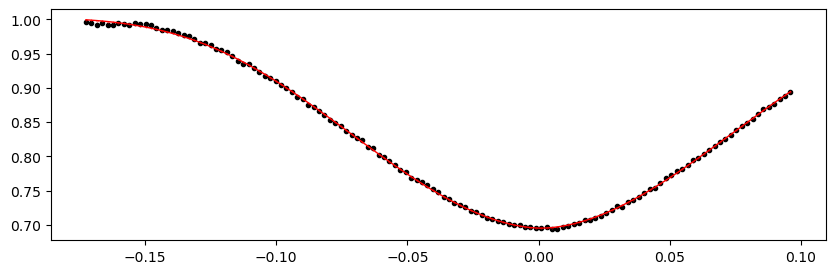

2088.16432 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 417.73it/s]


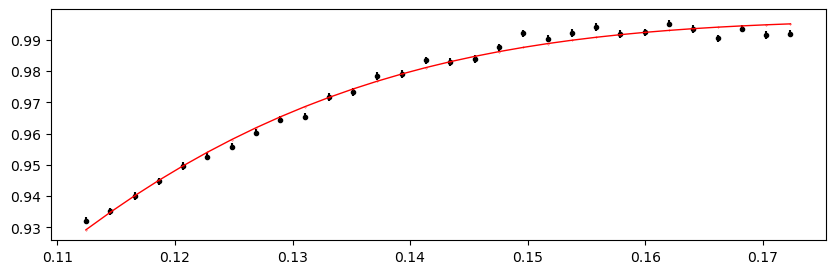

2088.83658 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 335.26it/s]


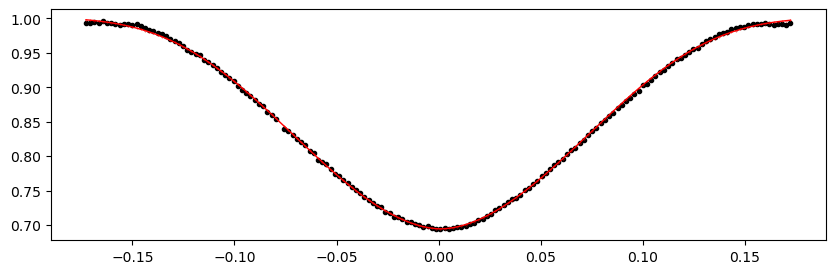

2089.50884 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 336.50it/s]


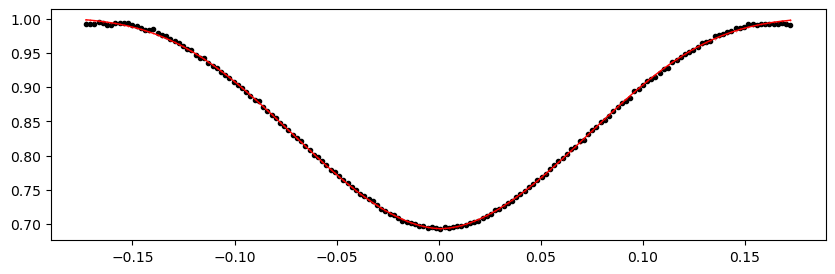

2090.1811 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 337.04it/s]


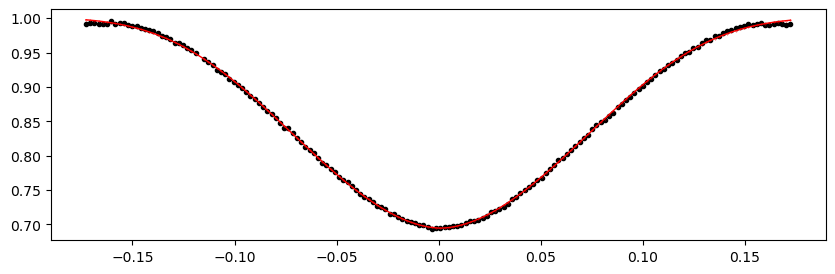

2090.85336 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 337.39it/s]


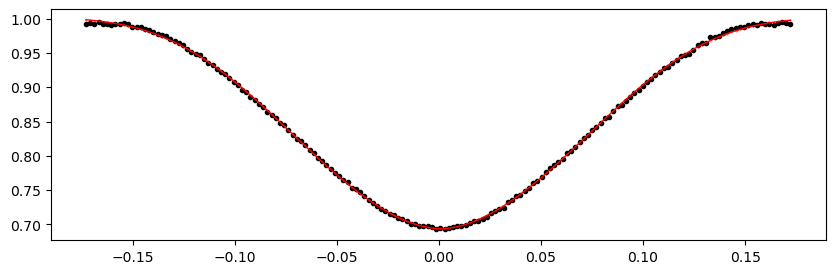

2091.52562 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 338.68it/s]


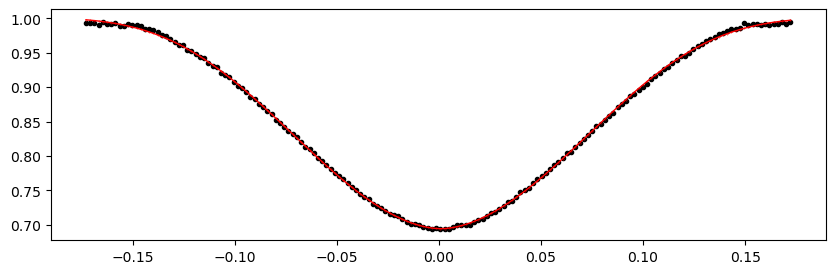

2092.19788 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 333.89it/s]


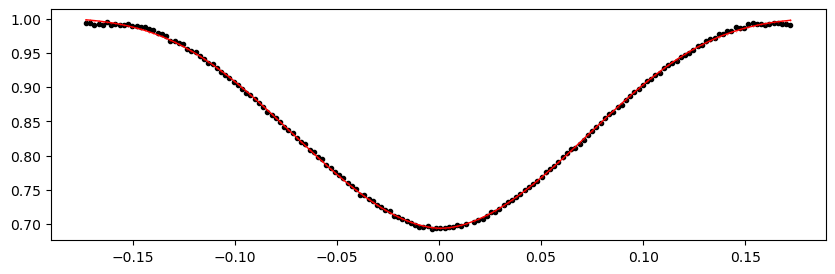

2092.87014 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 336.88it/s]


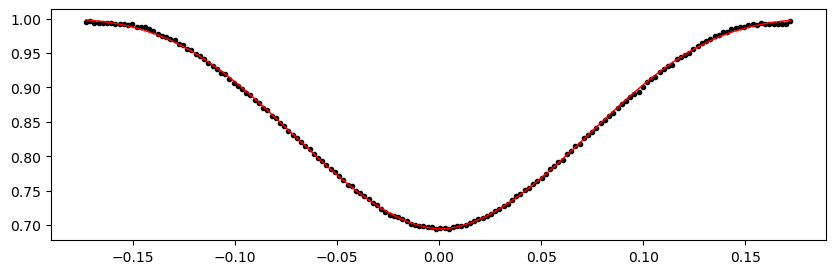

2093.5424 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 342.03it/s]


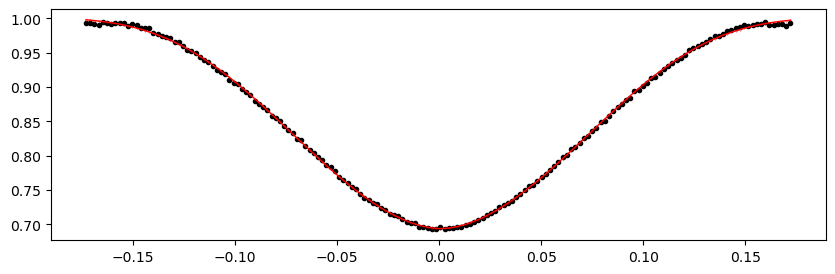

2094.21466 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 338.43it/s]


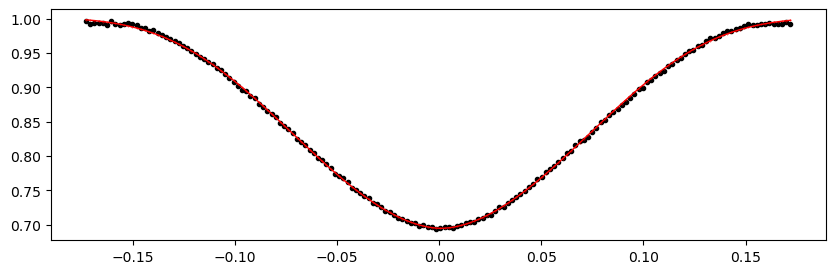

2094.88692 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 317.71it/s]


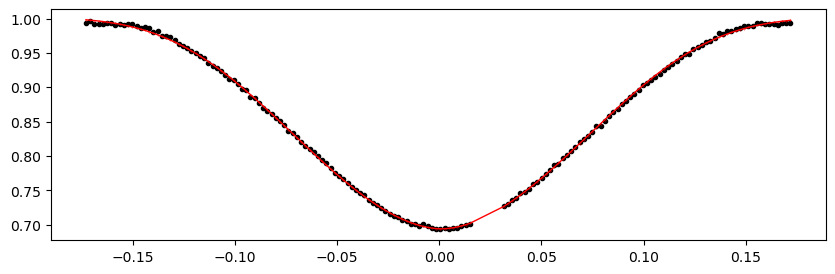

2095.55918 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 314.88it/s]


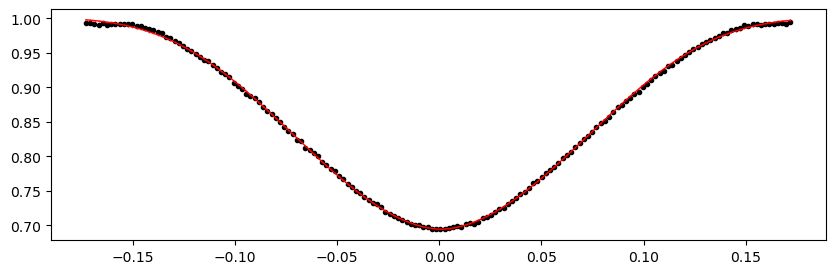

2096.23144 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 343.89it/s]


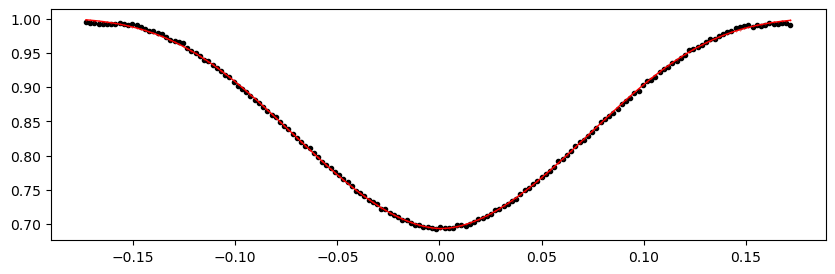

2096.9037 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 343.58it/s]


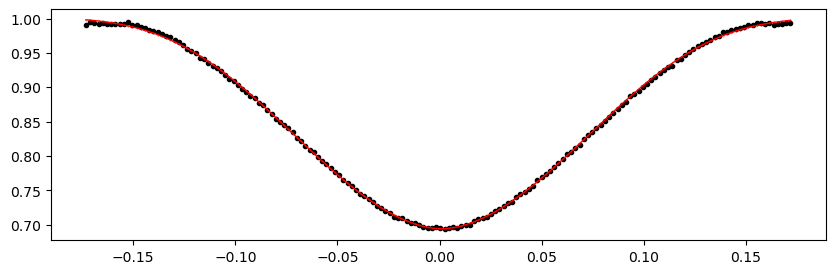

2097.57596 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 344.33it/s]


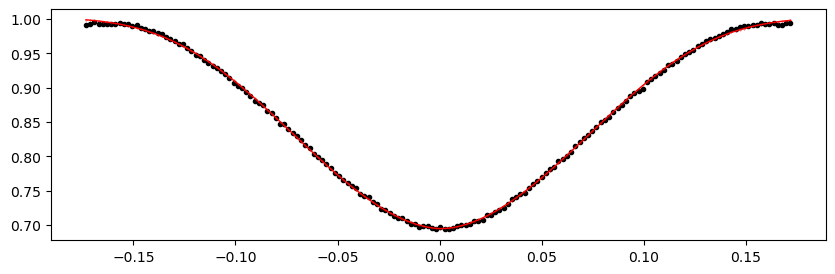

2098.24822 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 343.76it/s]


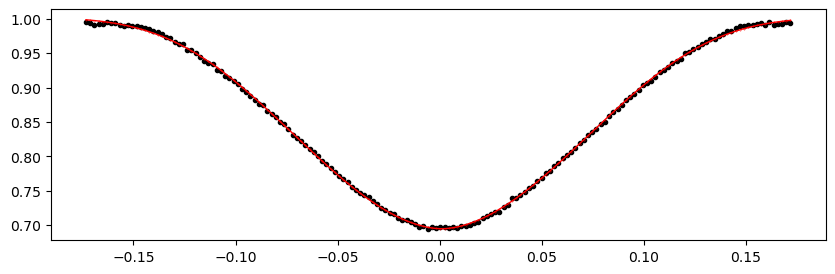

2102.28178 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 418.79it/s]


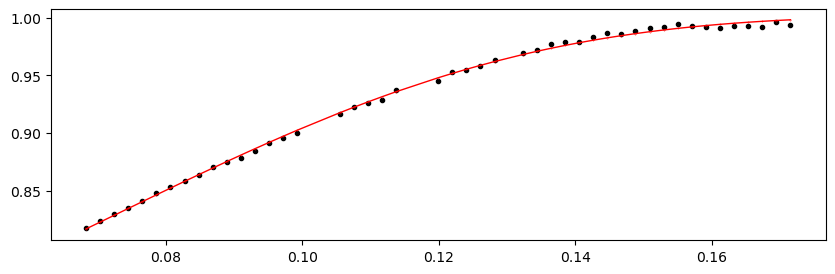

2102.95404 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 343.73it/s]


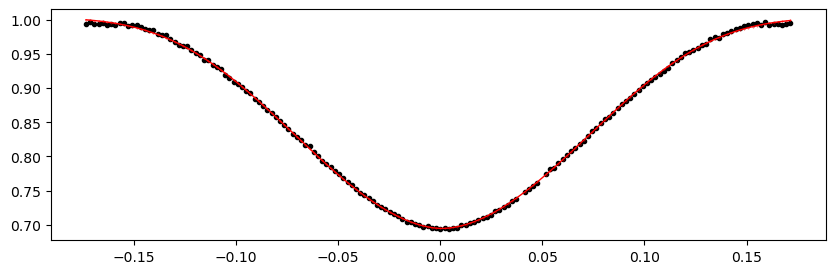

2103.6263 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 343.80it/s]


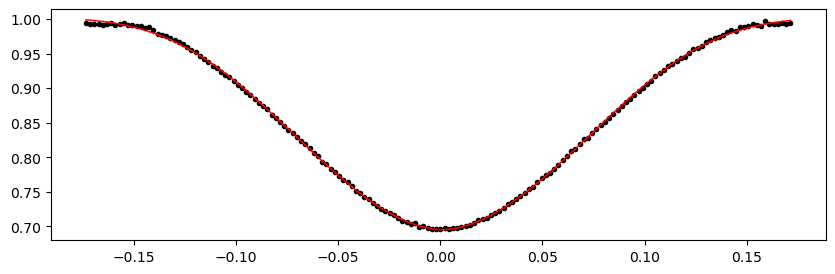

2104.29856 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 344.43it/s]


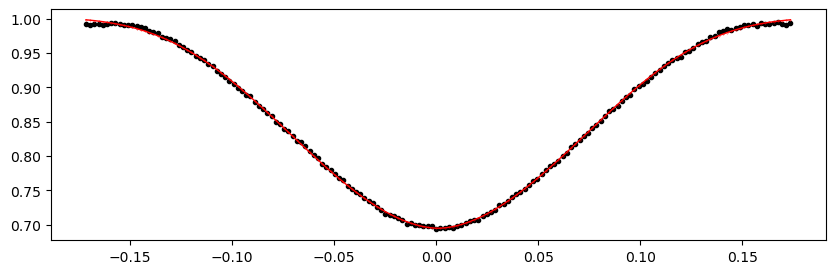

2104.97082 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 342.29it/s]


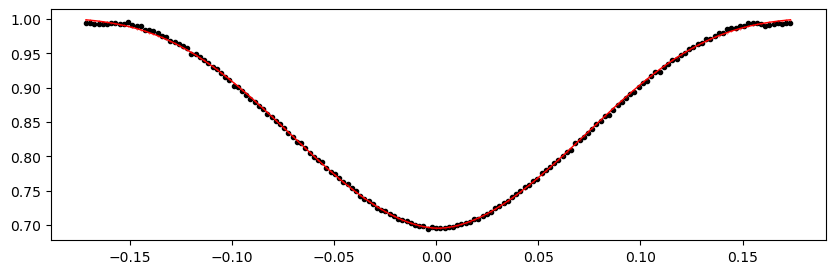

2105.64308 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 343.25it/s]


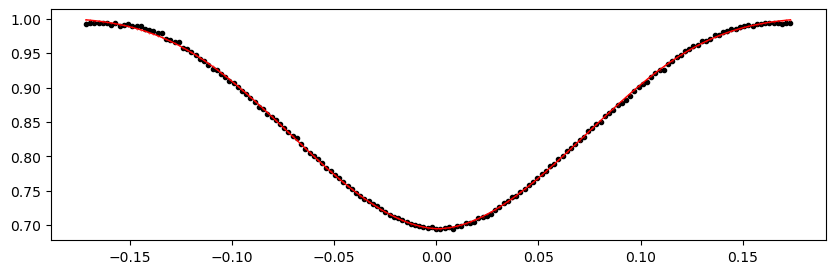

2106.31534 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 344.14it/s]


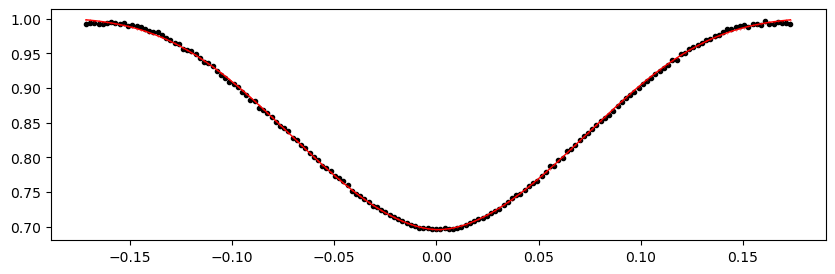

2106.9876 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 343.44it/s]


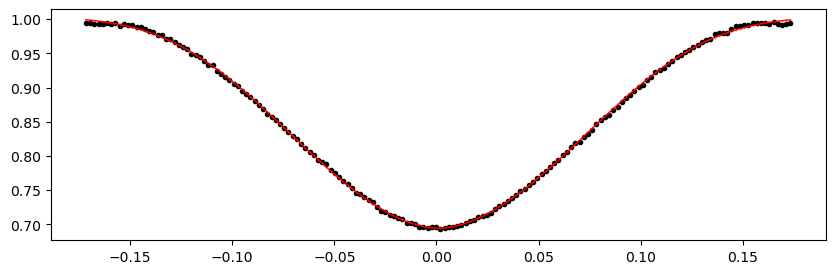

2107.65986 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 343.53it/s]


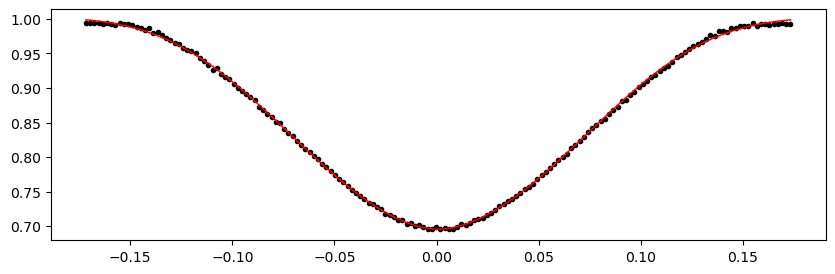

2108.33212 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 345.80it/s]


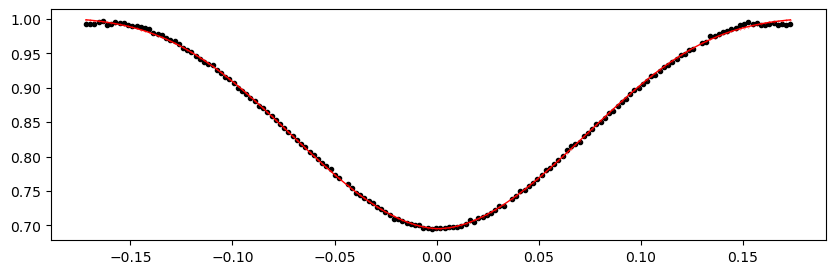

2109.00438 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 342.50it/s]


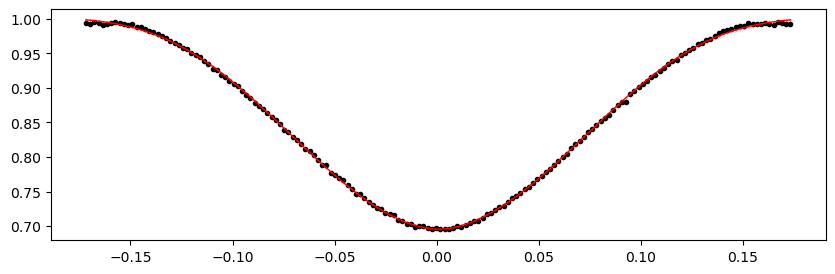

2109.67664 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 344.32it/s]


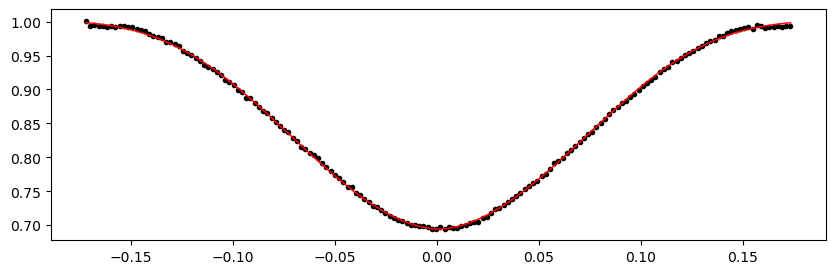

2110.3489 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 344.69it/s]


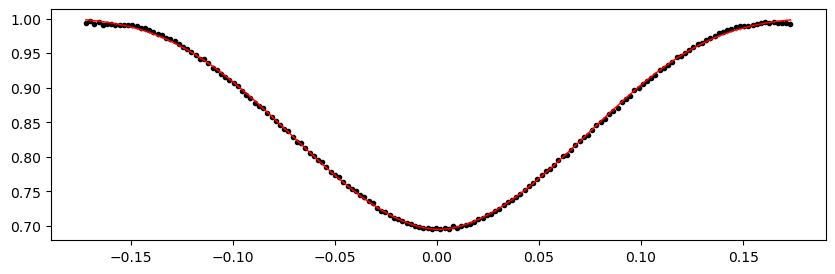

2111.0211600000002 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 344.89it/s]


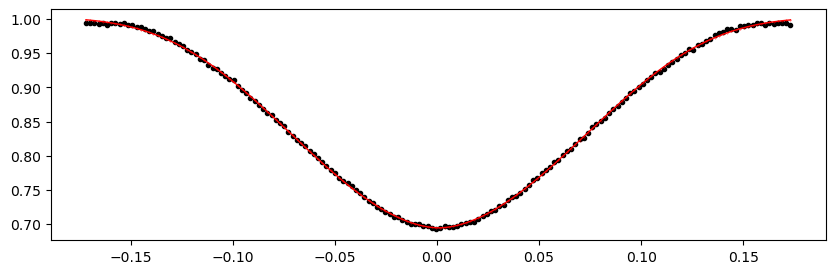

2111.69342 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 345.66it/s]


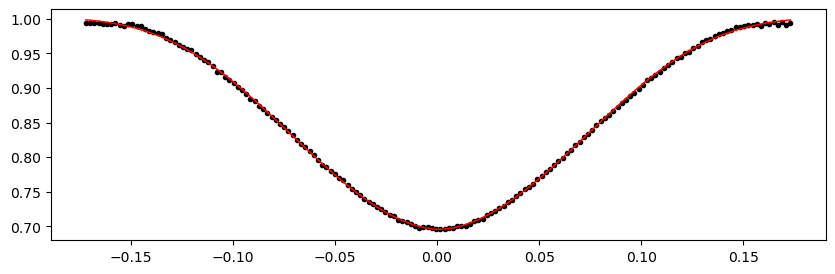

2112.36568 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 344.89it/s]


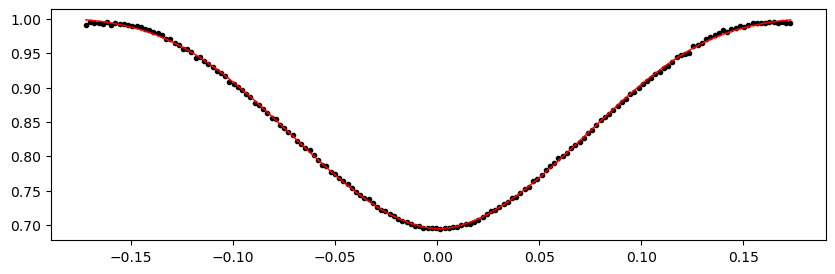

2116.39924 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 345.28it/s]


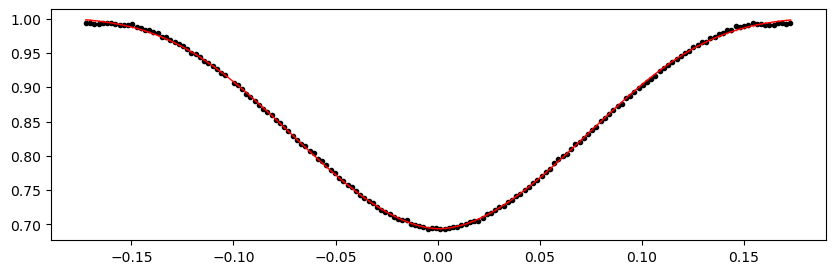

2117.0715 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 345.84it/s]


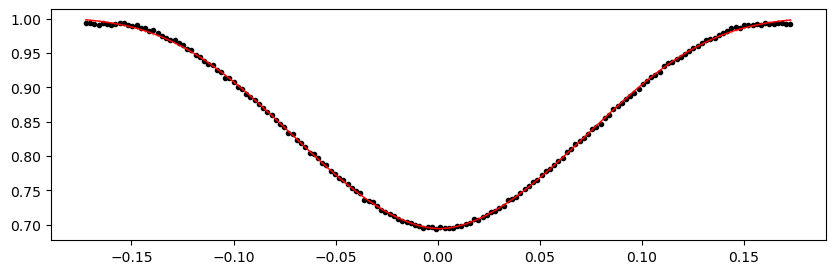

2117.74376 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 345.45it/s]


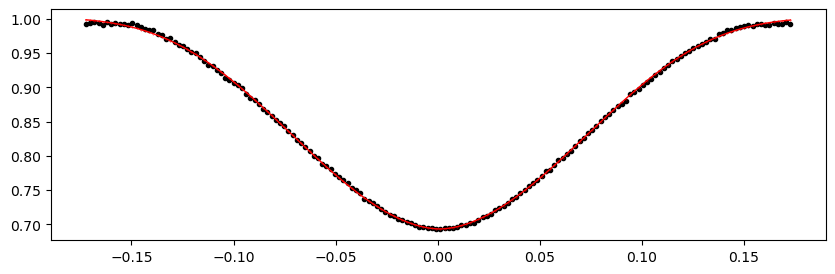

2118.41602 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 344.15it/s]


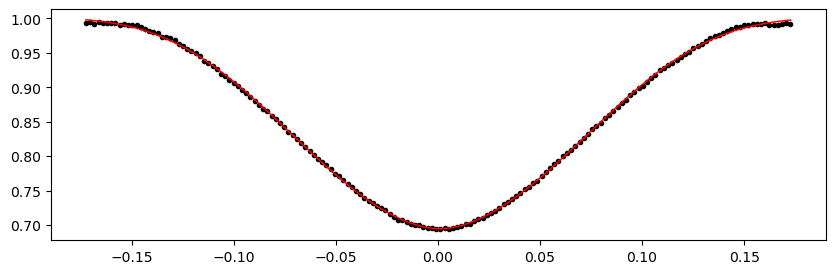

2119.08828 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 345.99it/s]


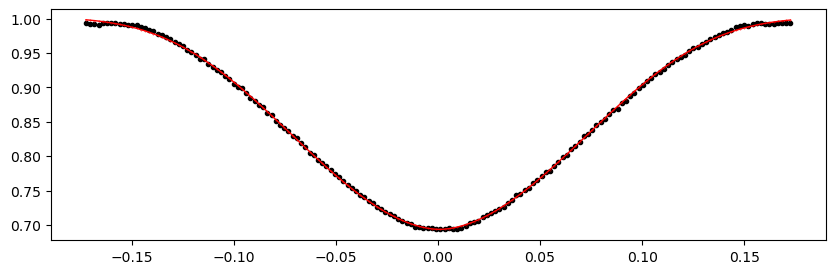

2119.76054 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 343.60it/s]


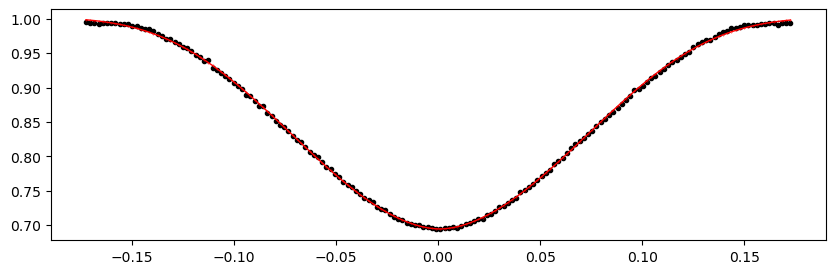

2120.4328 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 345.82it/s]


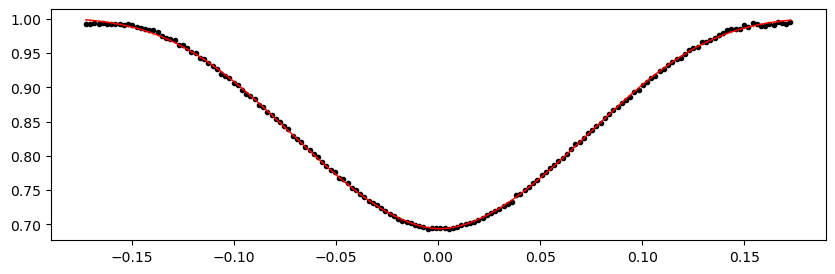

2121.10506 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 344.70it/s]


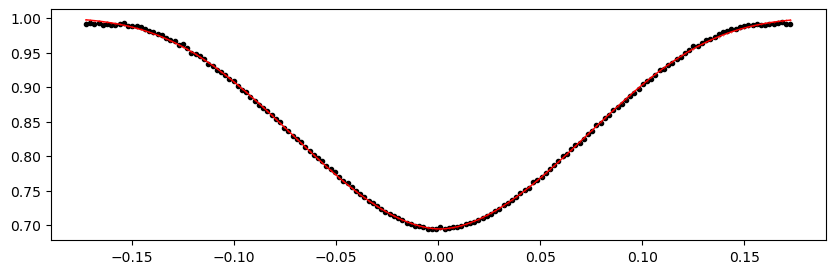

2121.77732 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 344.72it/s]


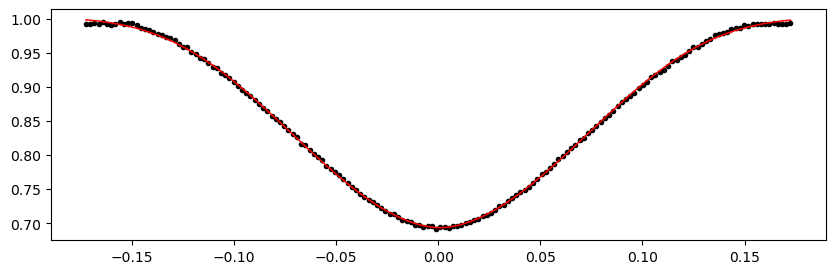

2122.44958 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 320.80it/s]


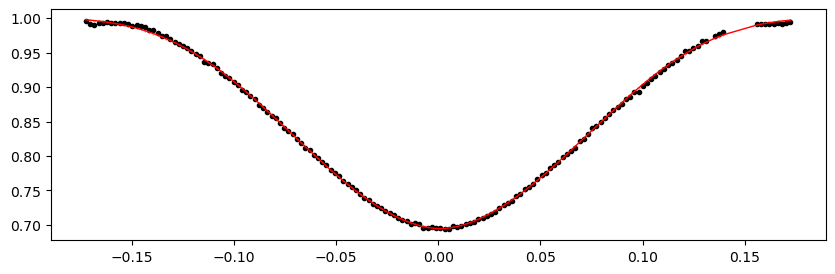

2123.12184 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 345.09it/s]


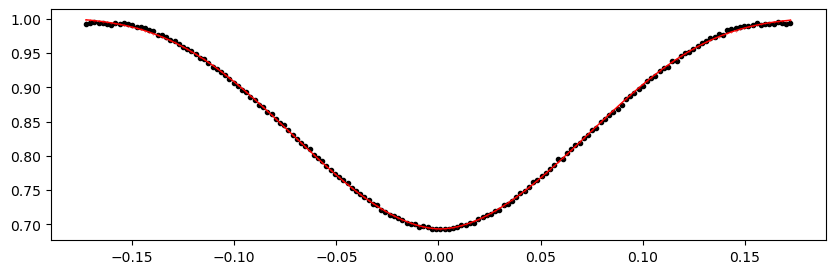

2123.7941 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 344.14it/s]


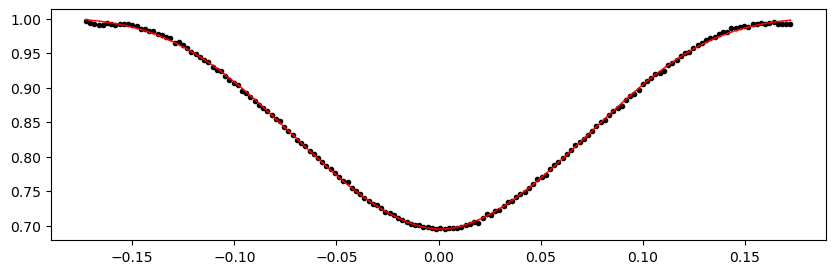

2124.46636 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 344.35it/s]


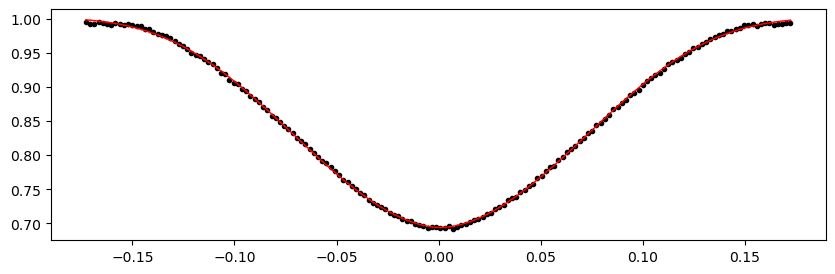

2125.13862 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 343.40it/s]


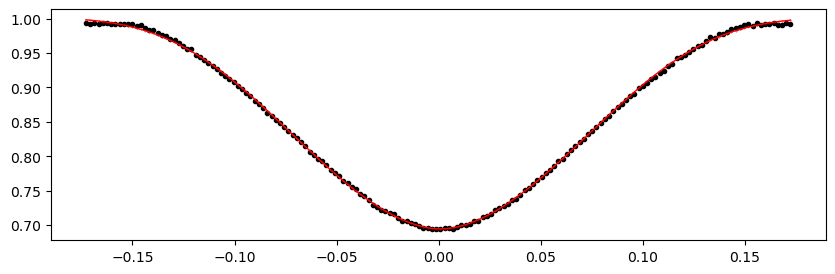

2125.81088 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 346.23it/s]


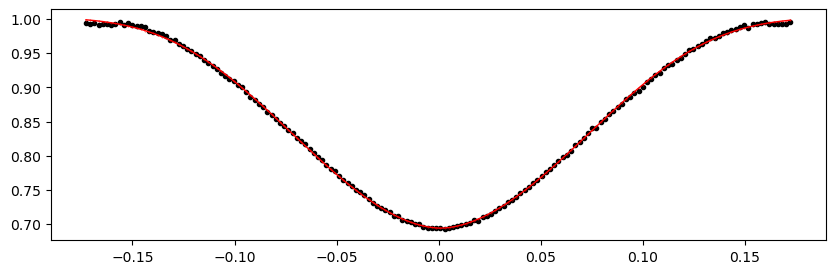

2126.48314 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 346.41it/s]


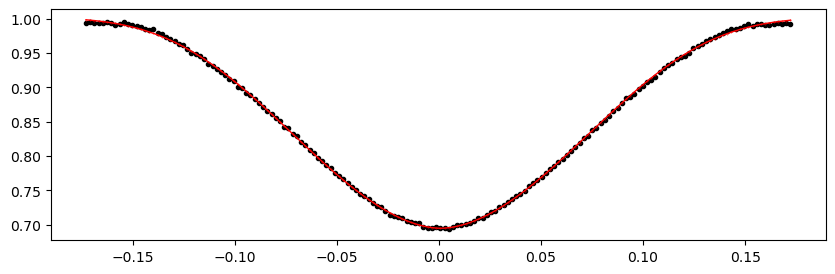

2127.1554 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 343.20it/s]


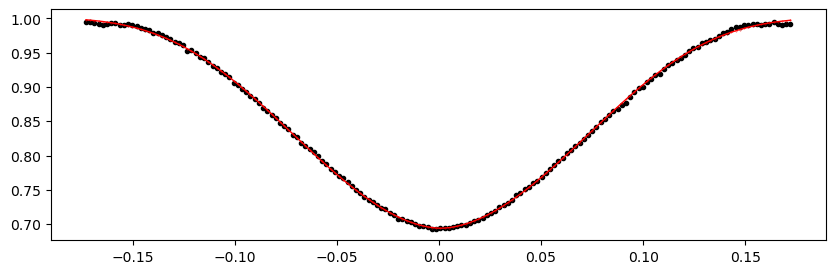

2130.5167 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 340.85it/s]


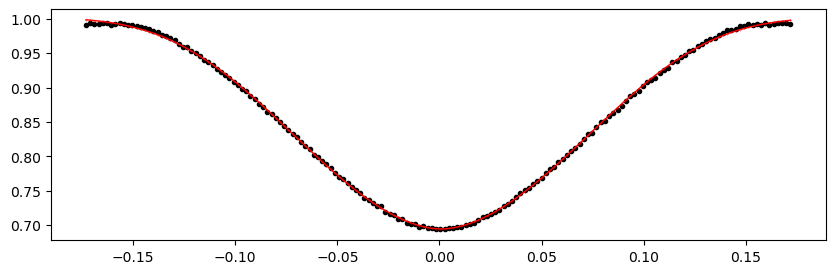

2131.18896 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 315.67it/s]


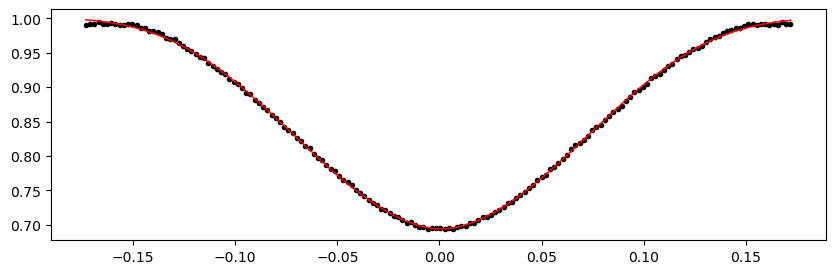

2131.8612200000002 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 341.77it/s]


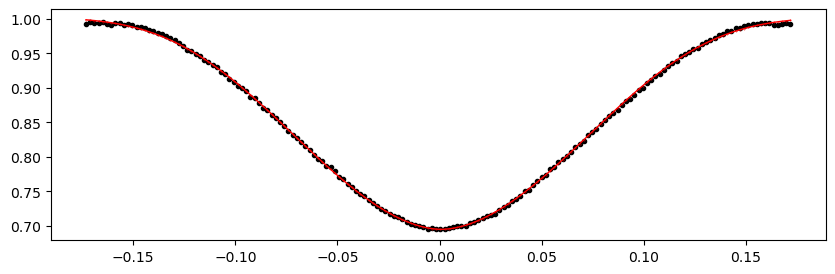

2132.53348 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 345.36it/s]


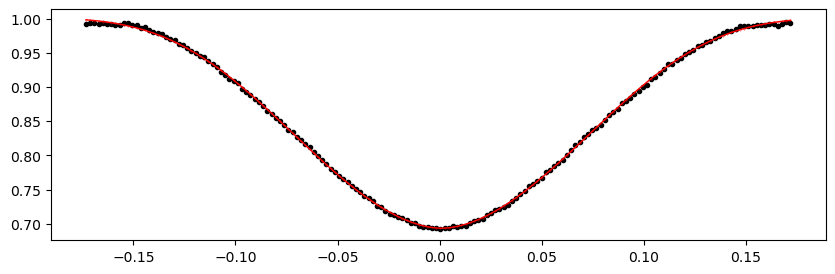

2133.20574 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 343.99it/s]


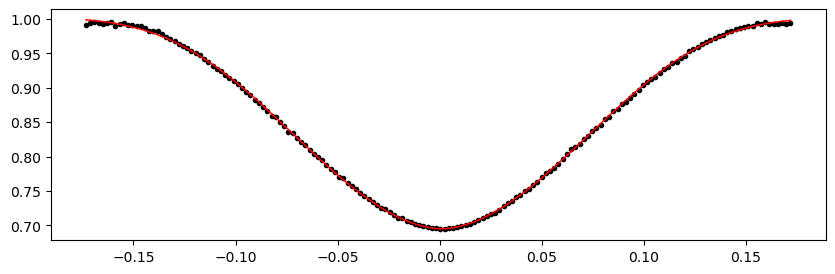

2133.878 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 345.63it/s]


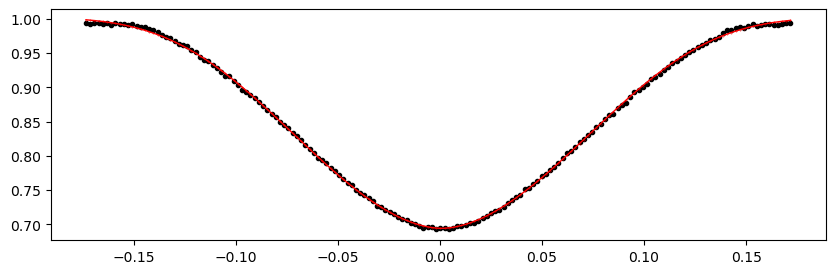

2134.55026 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 343.93it/s]


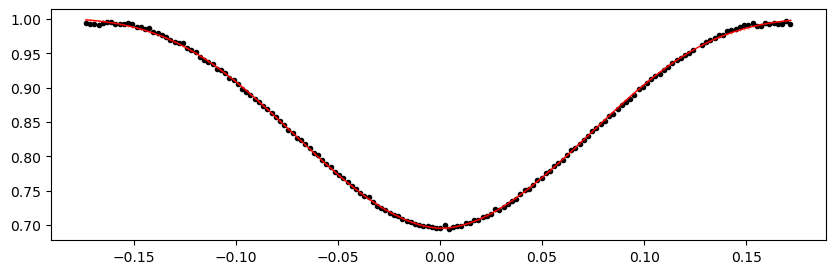

2135.22252 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 343.61it/s]


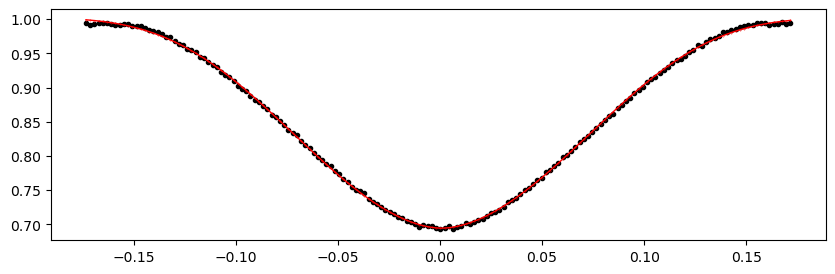

2135.89478 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 344.89it/s]


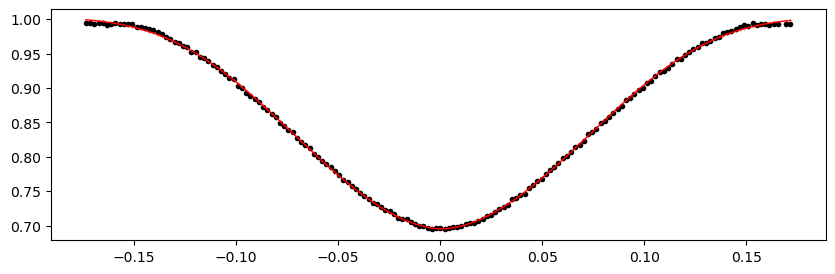

2136.56704 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 347.13it/s]


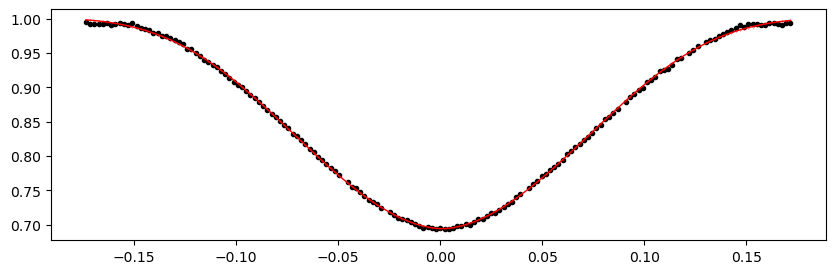

2137.2393 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 342.82it/s]


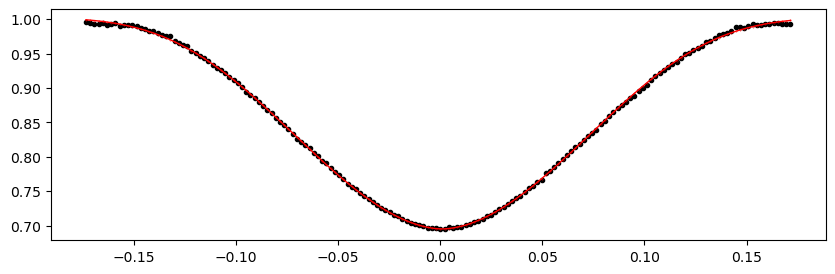

2137.91156 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 342.13it/s]


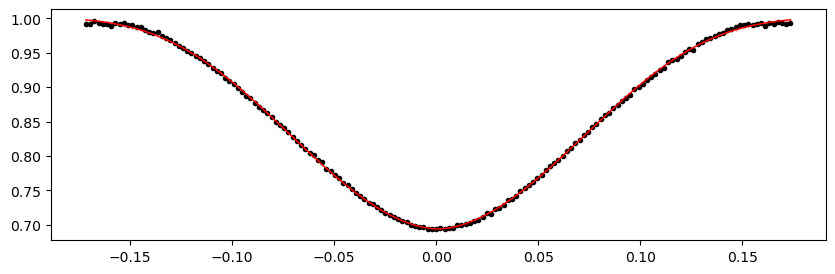

2138.58382 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 343.52it/s]


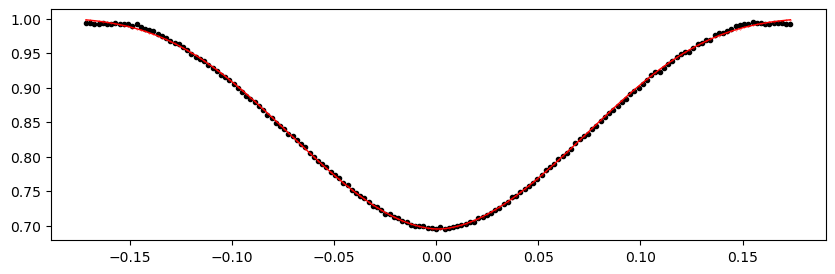

2139.25608 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:38<00:00, 260.43it/s]


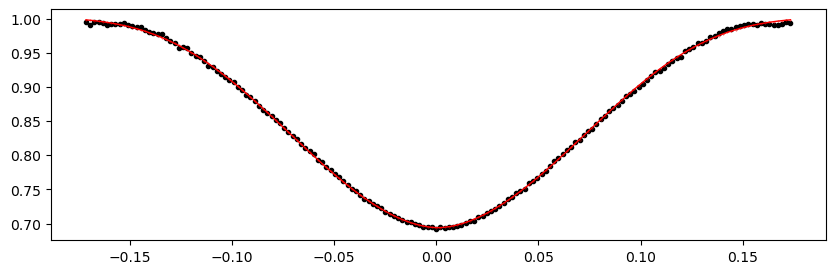

2139.92834 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 322.32it/s]


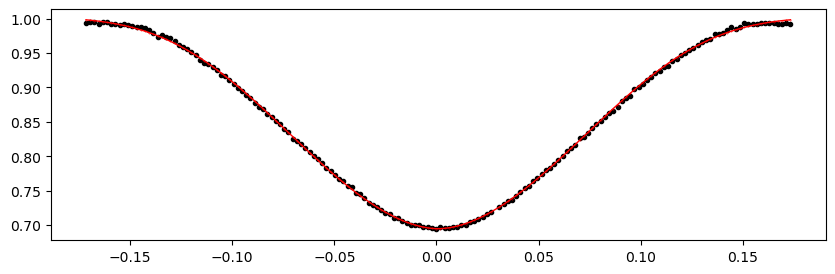

2140.6006 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 325.59it/s]


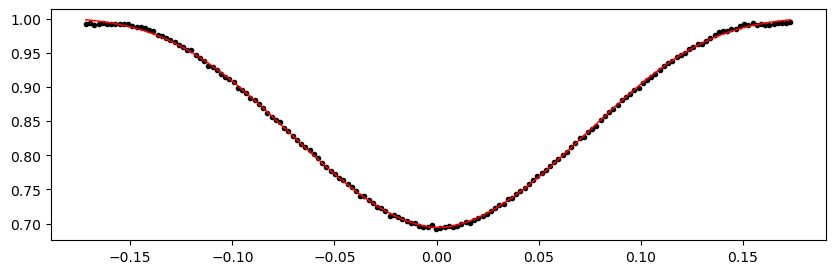

2141.27286 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 325.76it/s]


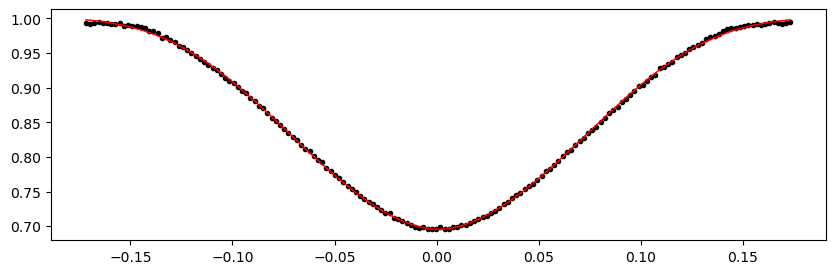

2144.63416 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 326.64it/s]


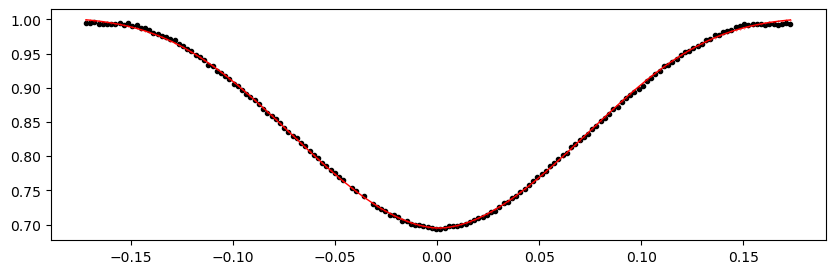

2145.30642 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 326.46it/s]


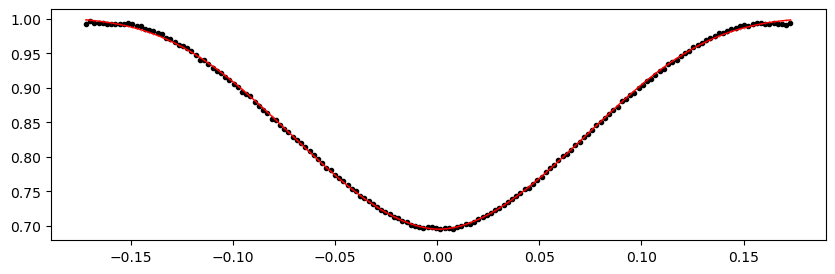

2145.97868 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 319.00it/s]


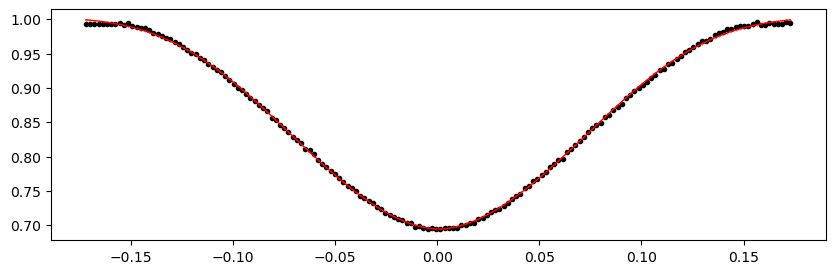

2146.65094 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 315.82it/s]


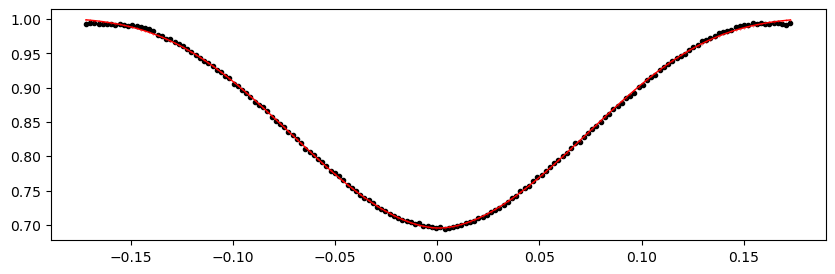

2147.3232 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 317.41it/s]


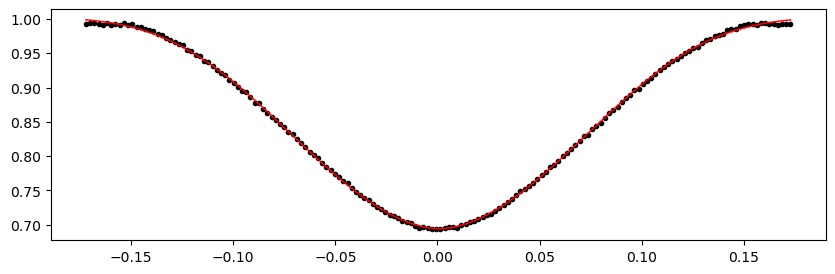

2147.99546 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 317.14it/s]


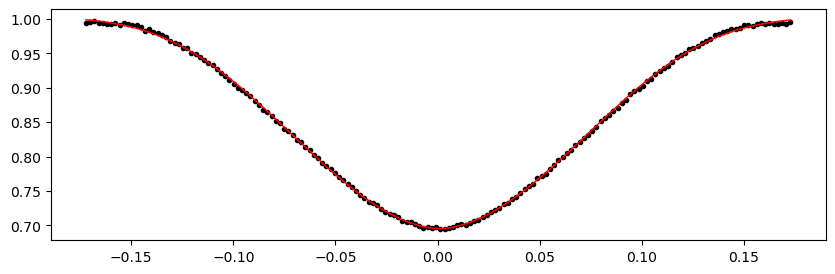

2148.66772 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 330.43it/s]


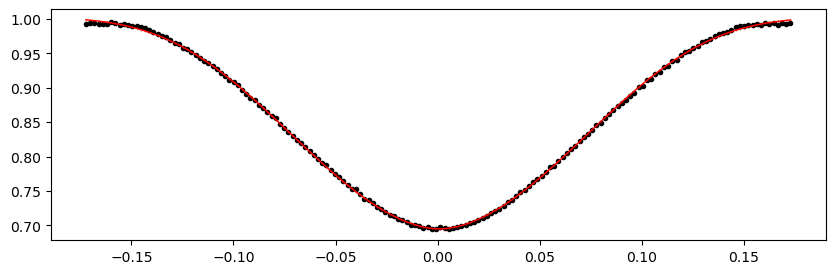

2149.33998 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 334.29it/s]


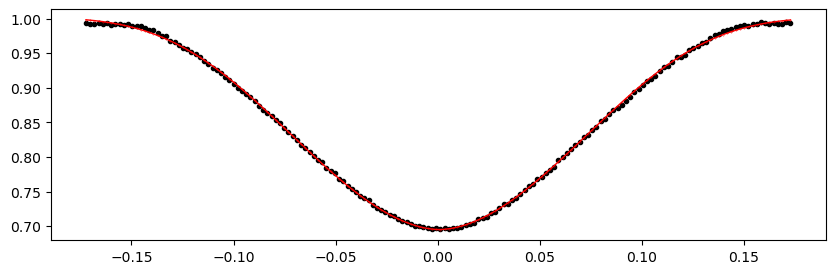

2150.01224 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 321.48it/s]


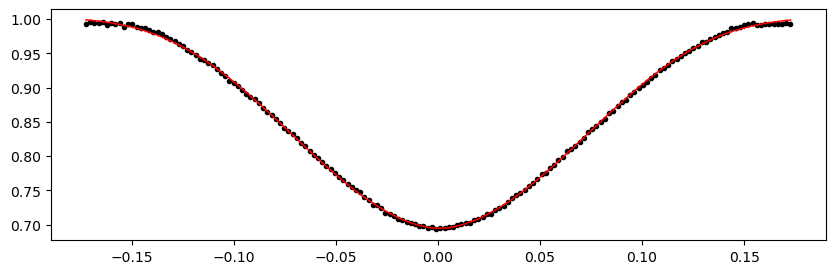

2150.6845 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 320.67it/s]


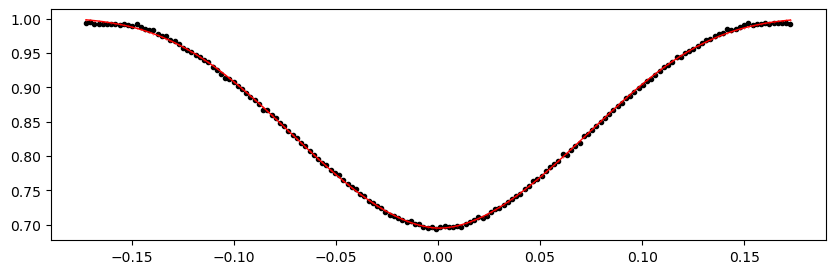

2151.35676 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 320.55it/s]


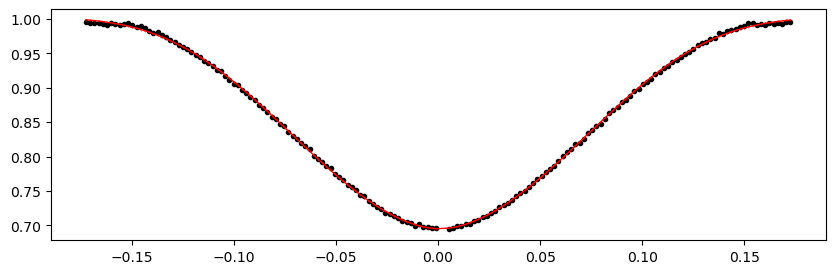

2152.02902 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 321.26it/s]


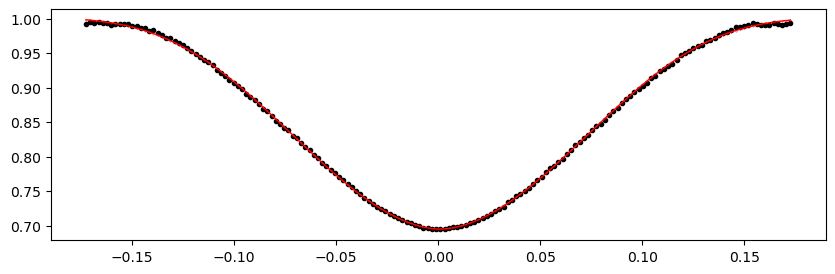

2152.70128 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 337.73it/s]


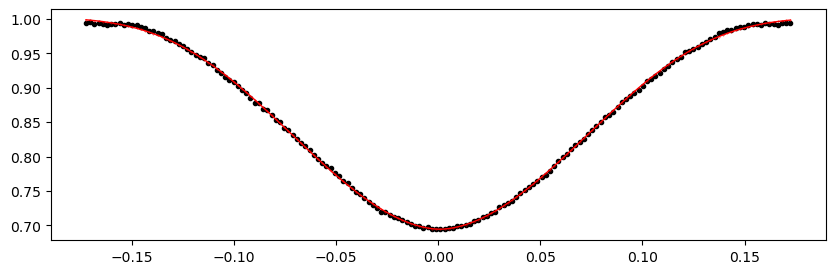

2153.37354 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 327.87it/s]


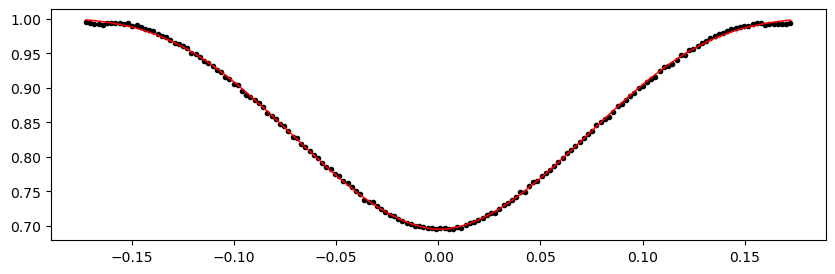

2154.0458 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 320.54it/s]


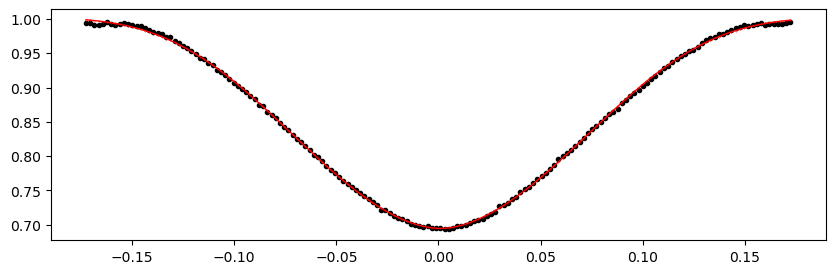

2154.71806 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 325.70it/s]


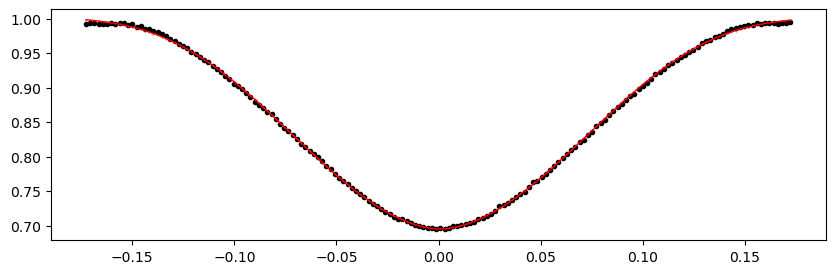

2155.39032 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 328.81it/s]


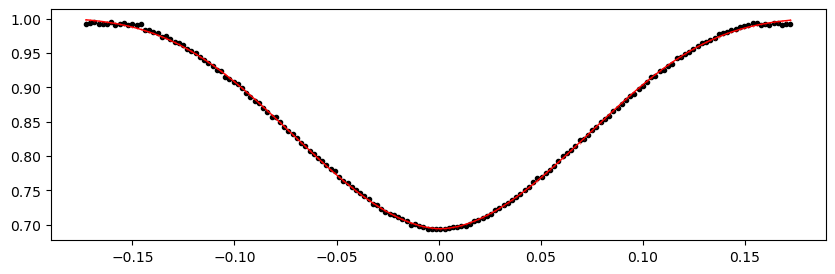

2156.06258 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 320.18it/s]


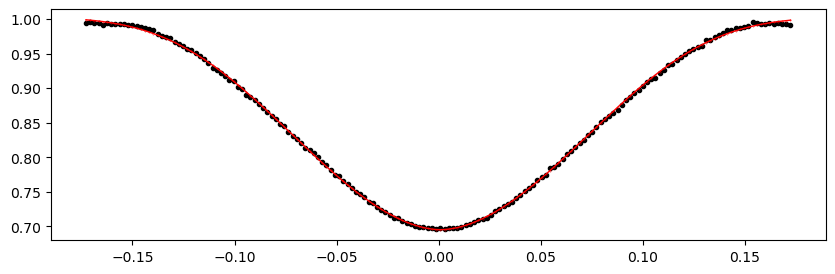

Time 2158.75162 does not have enough data points: 4
2159.42388 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 318.88it/s]


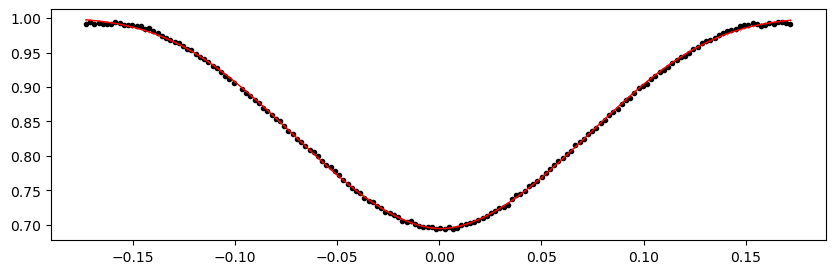

2160.09614 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 324.87it/s]


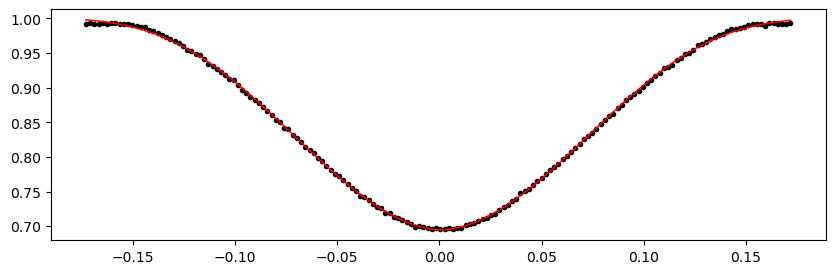

2160.7684 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:34<00:00, 286.49it/s]


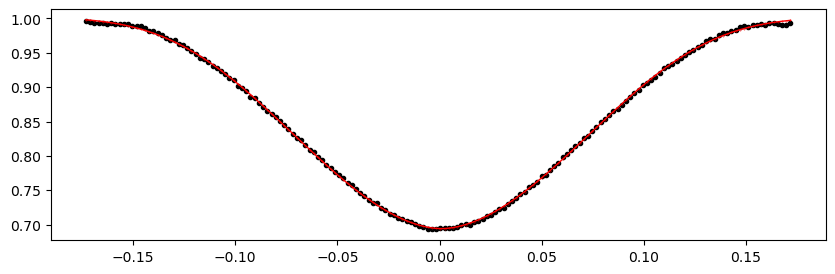

2161.44066 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 325.27it/s]


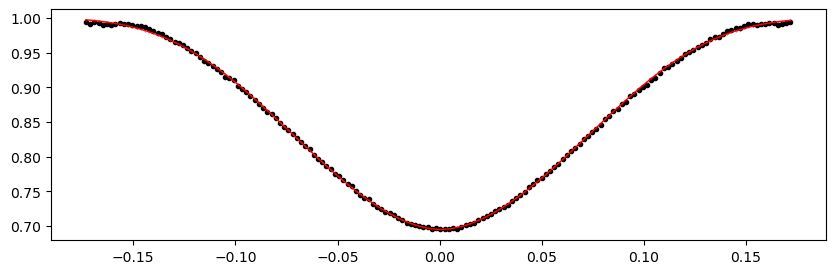

2162.11292 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 331.07it/s]


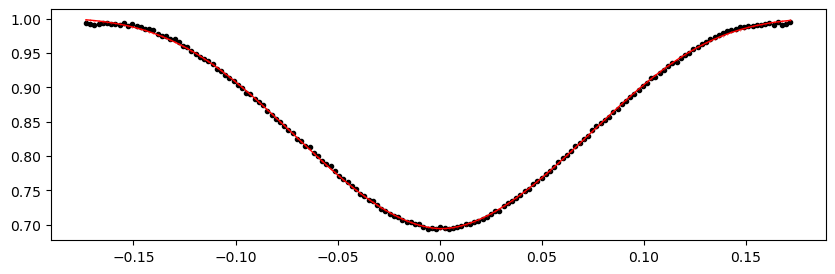

2162.78518 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 331.43it/s]


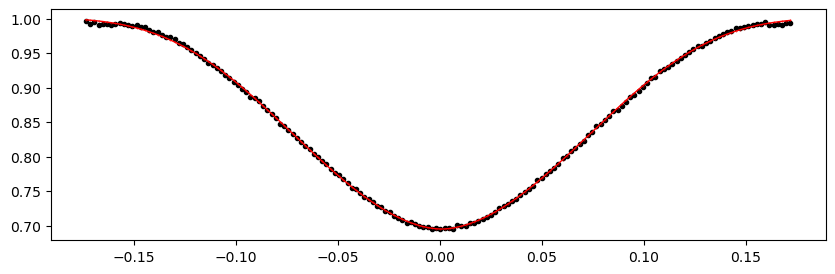

2163.45744 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 332.47it/s]


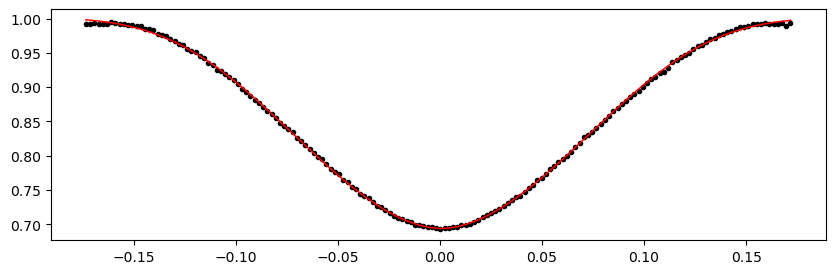

2164.1297 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 339.92it/s]


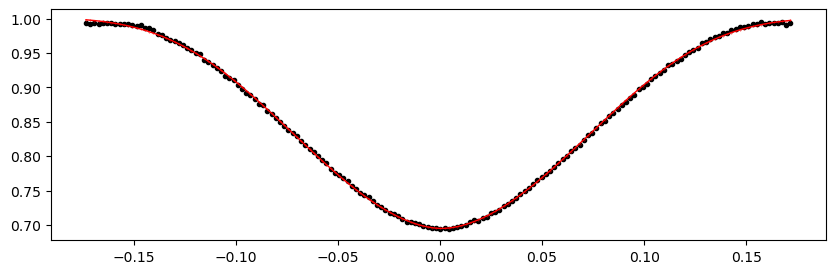

2164.80196 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 336.15it/s]


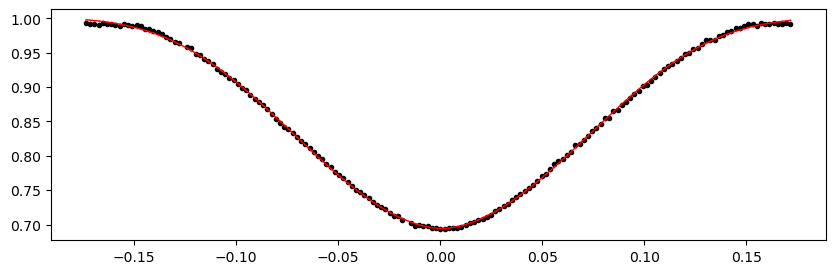

2165.47422 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:32<00:00, 310.26it/s]


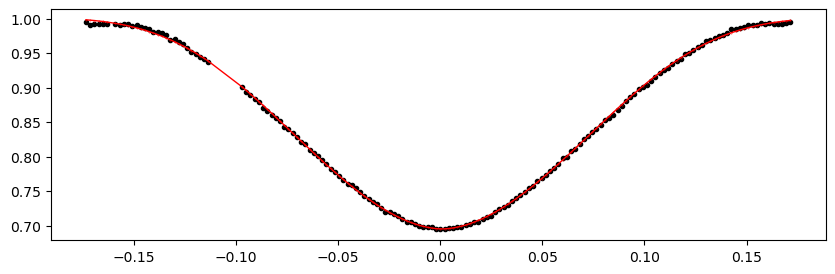

2166.14648 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 340.23it/s]


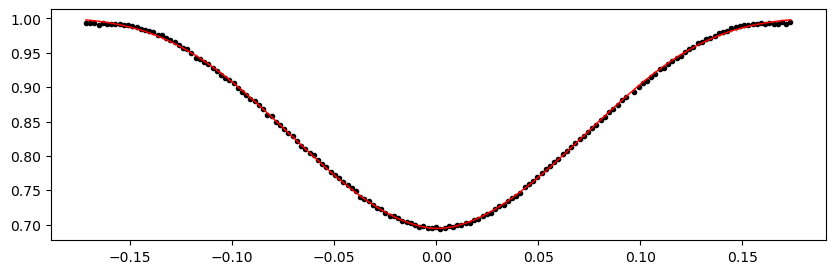

2166.81874 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 339.73it/s]


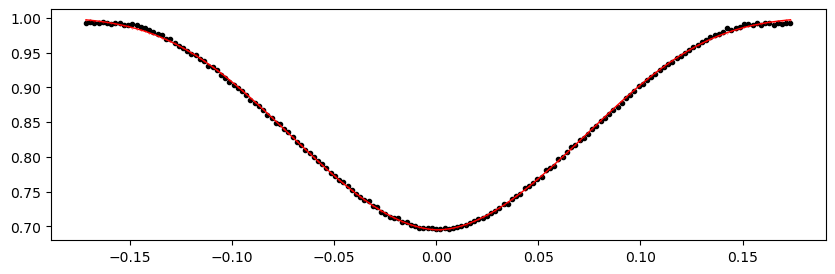

2167.491 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 336.68it/s]


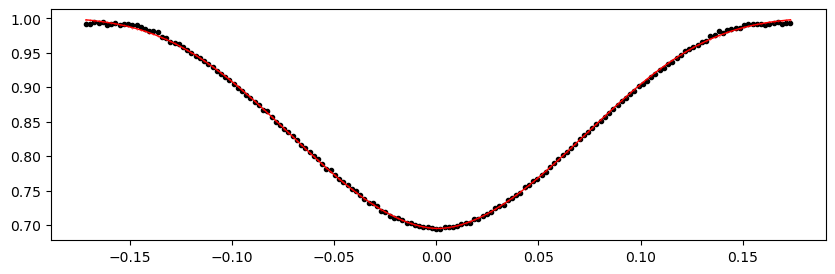

2168.16326 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 326.37it/s]


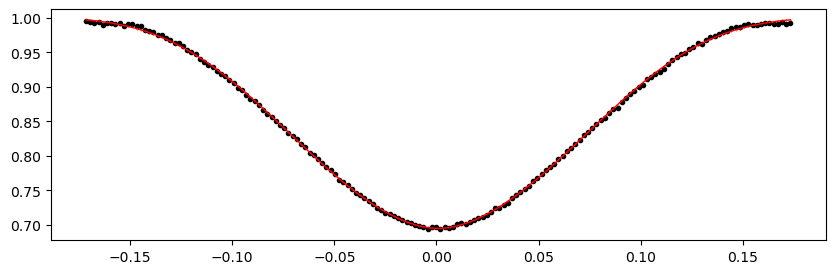

2168.83552 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:37<00:00, 268.04it/s]


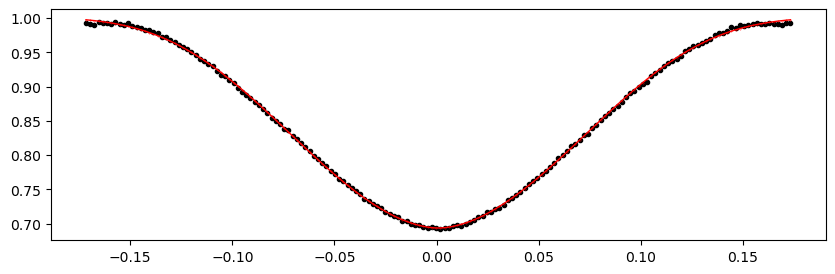

2169.50778 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 330.31it/s]


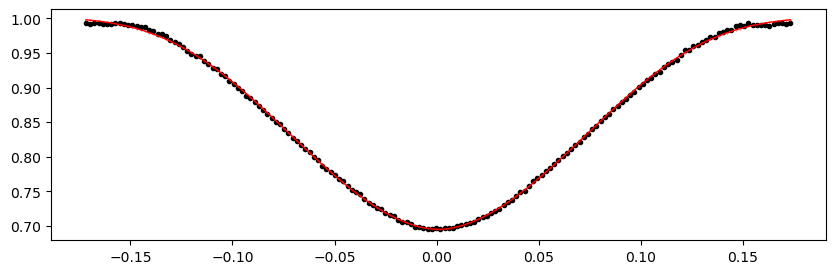

2174.2136 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 398.64it/s]


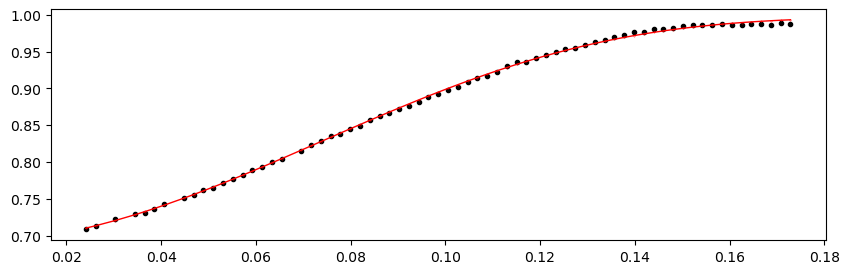

2174.88586 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 343.55it/s]


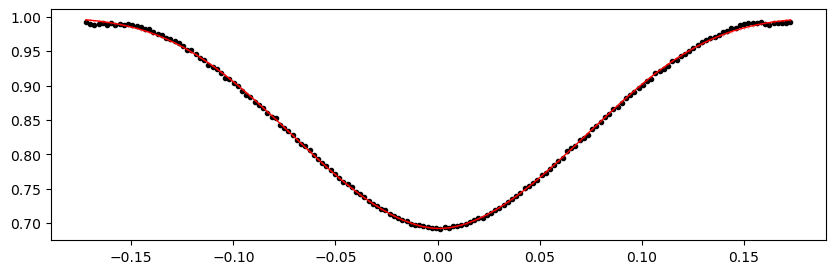

2175.55812 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 343.93it/s]


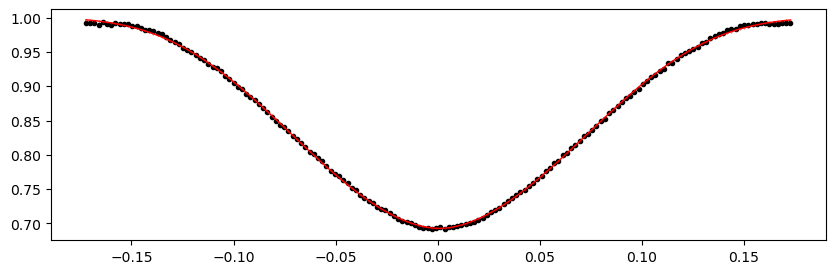

2176.23038 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 344.48it/s]


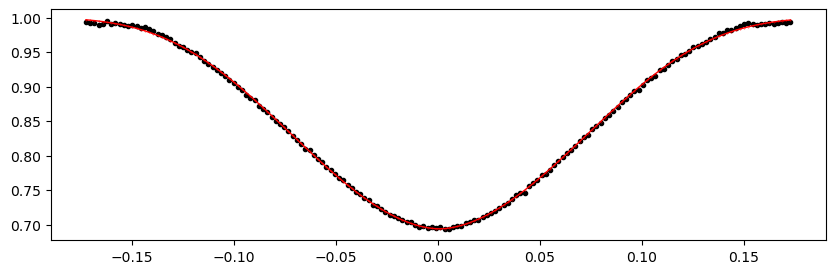

2176.9026400000002 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 344.13it/s]


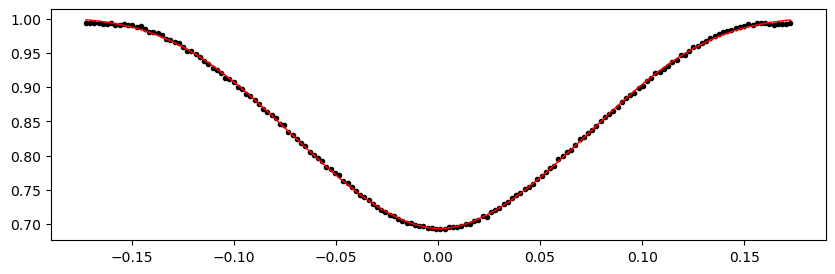

2177.5749 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 342.82it/s]


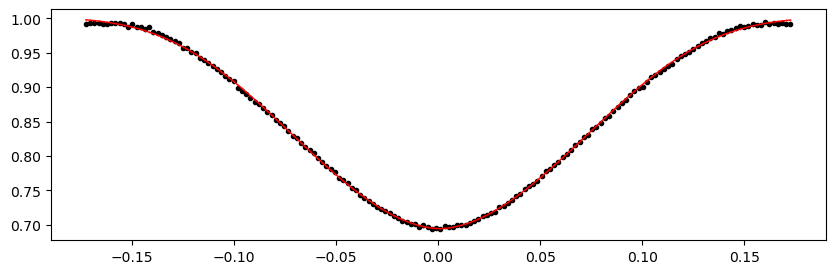

2178.24716 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 343.19it/s]


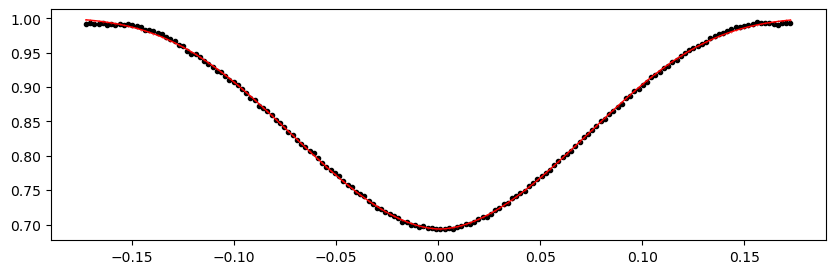

2178.91942 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 337.40it/s]


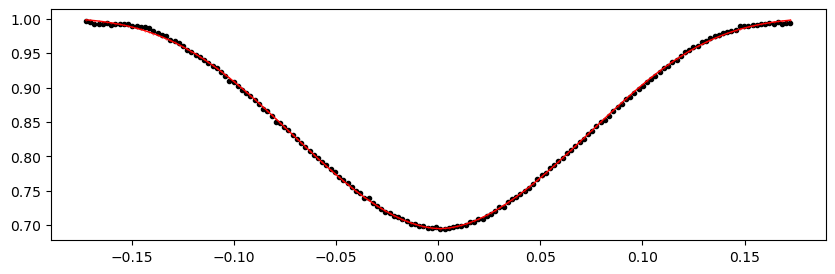

2179.59168 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:34<00:00, 292.31it/s]


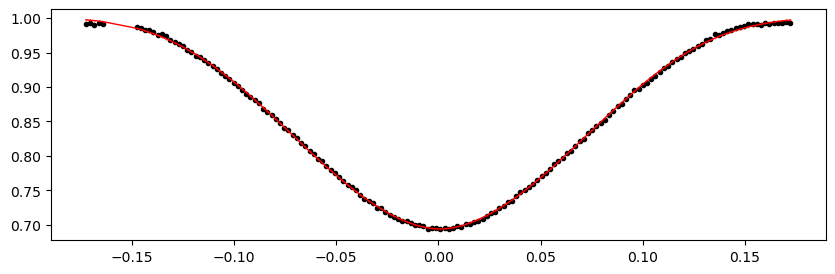

2180.26394 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 318.47it/s]


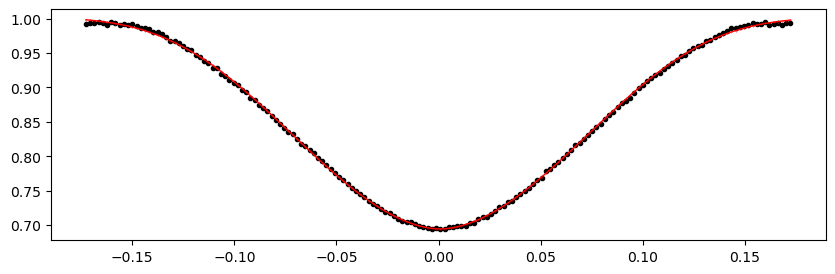

2180.9362 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 315.66it/s]


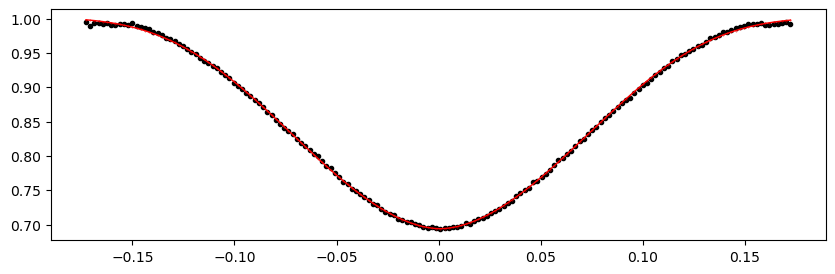

2181.60846 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 318.12it/s]


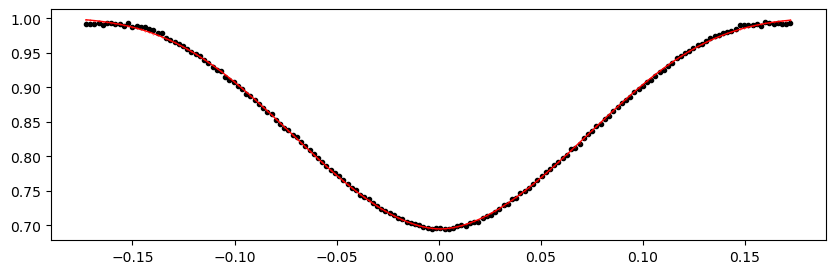

2182.28072 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 321.75it/s]


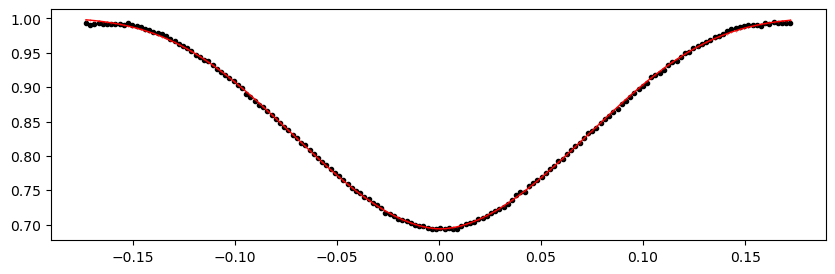

2182.95298 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 322.06it/s]


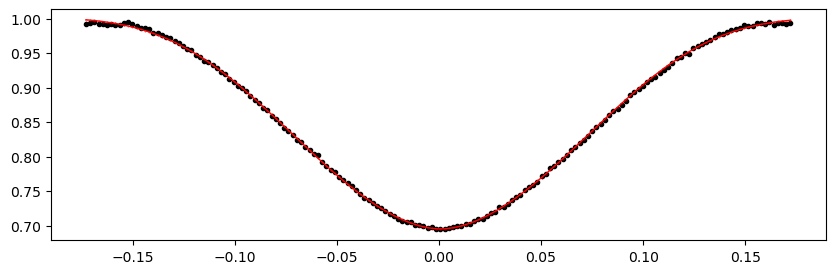

2183.62524 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 322.26it/s]


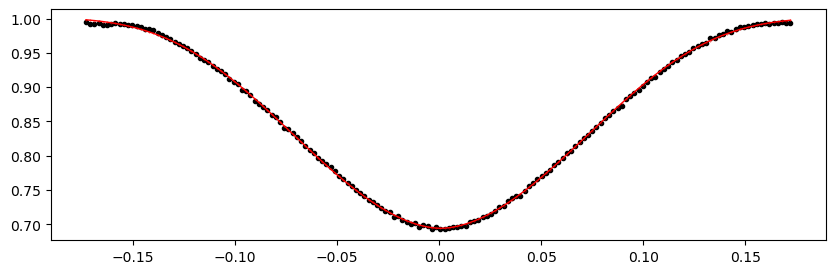

2184.2975 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 313.48it/s]


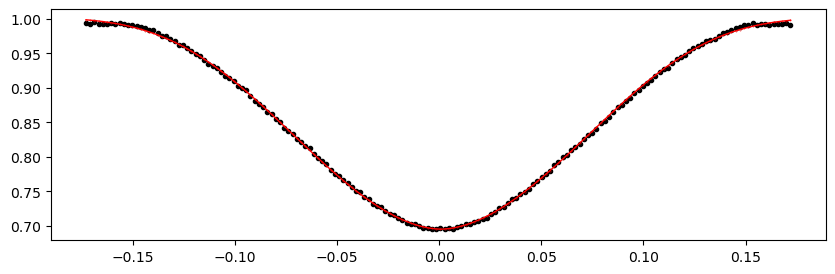

2184.96976 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 318.53it/s]


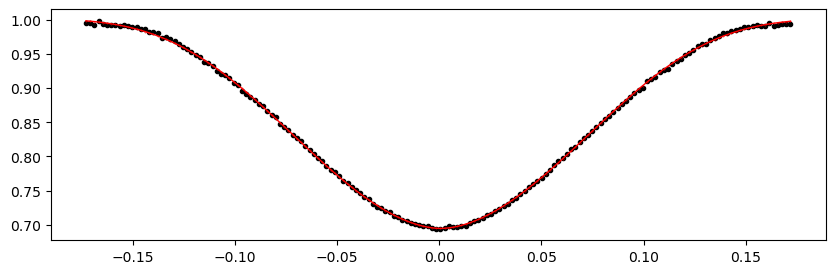

2185.6420200000002 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 322.43it/s]


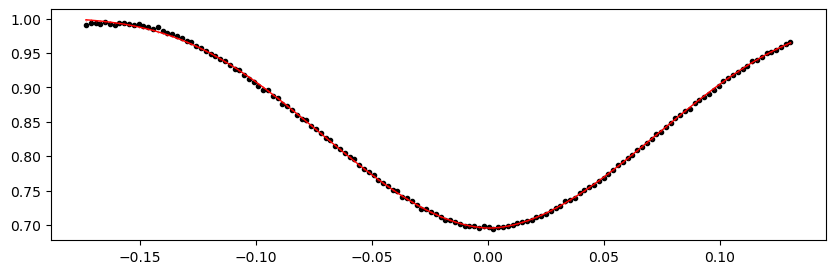

2187.6588 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 318.27it/s]


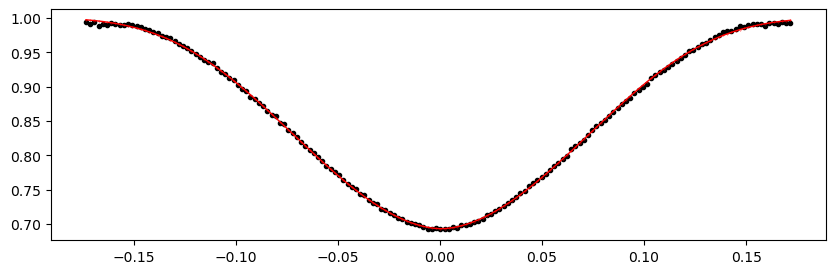

2188.33106 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 317.17it/s]


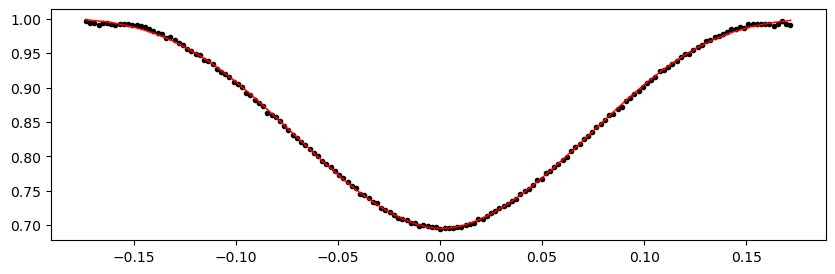

2189.00332 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 318.88it/s]


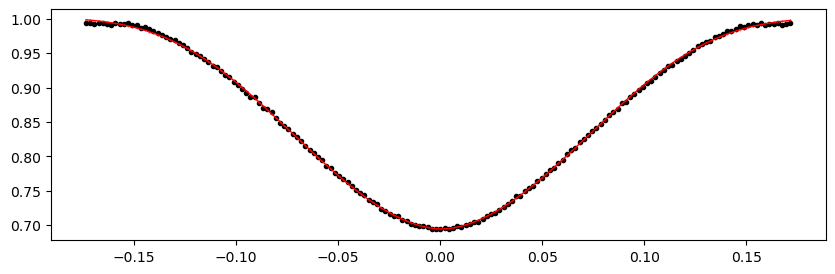

2189.67558 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 319.72it/s]


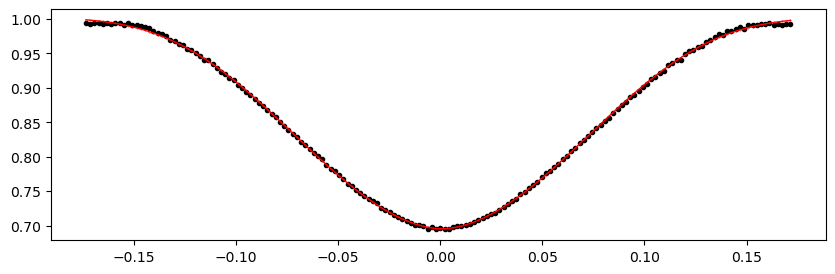

2190.34784 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 318.30it/s]


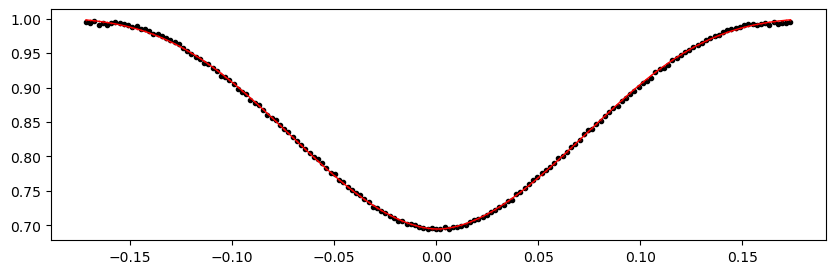

2191.0201 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 316.43it/s]


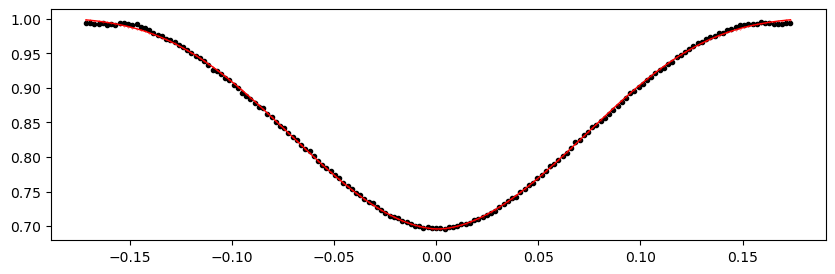

2191.69236 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:32<00:00, 311.05it/s]


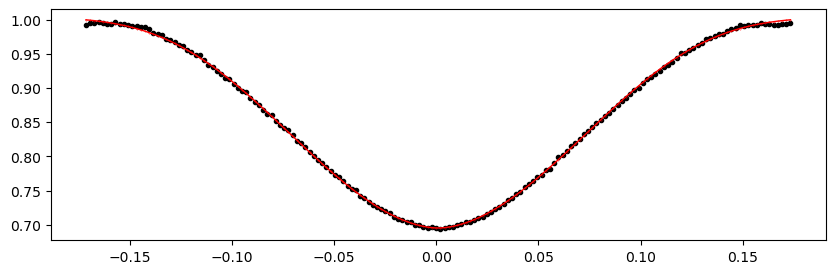

2192.36462 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 313.48it/s]


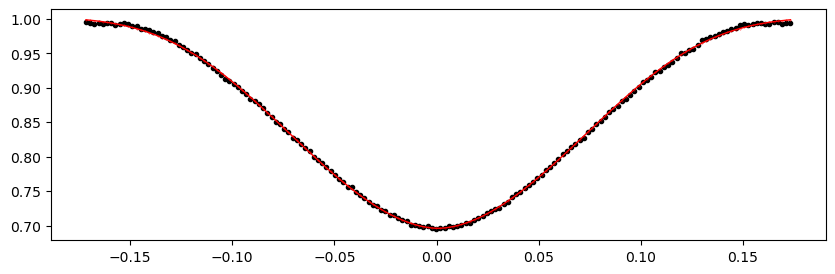

2193.03688 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:35<00:00, 284.90it/s]


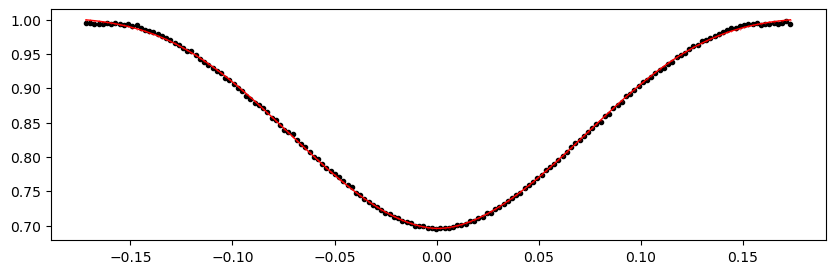

2193.70914 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 319.15it/s]


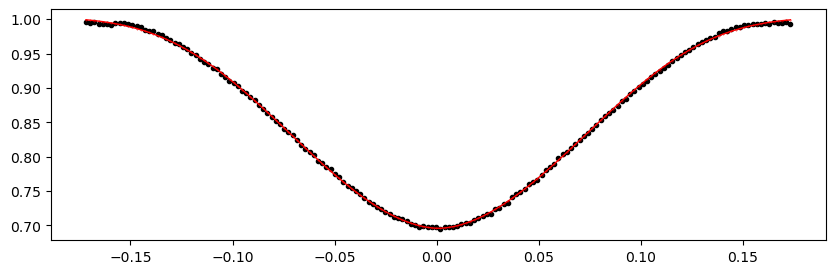

2194.3814 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 318.28it/s]


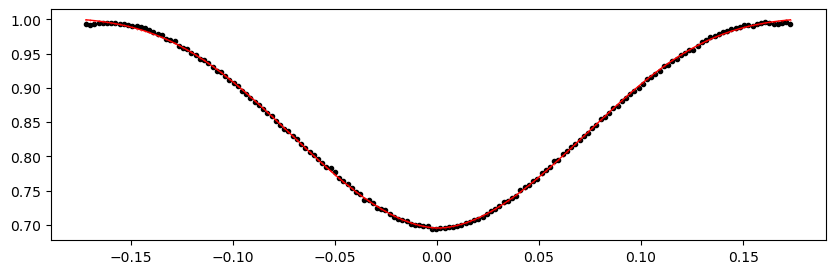

2195.05366 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 316.86it/s]


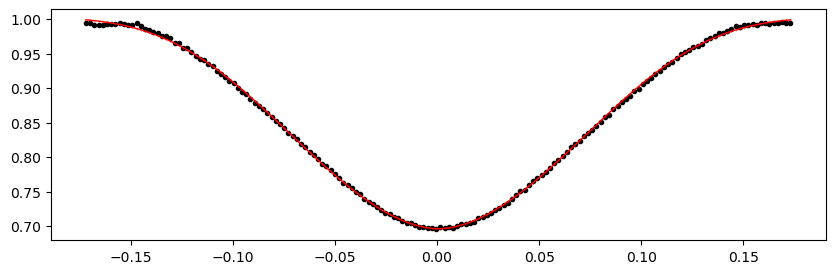

2195.72592 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:33<00:00, 299.46it/s]


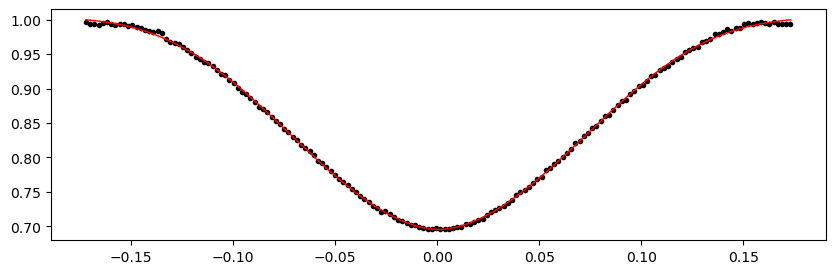

2196.39818 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 318.98it/s]


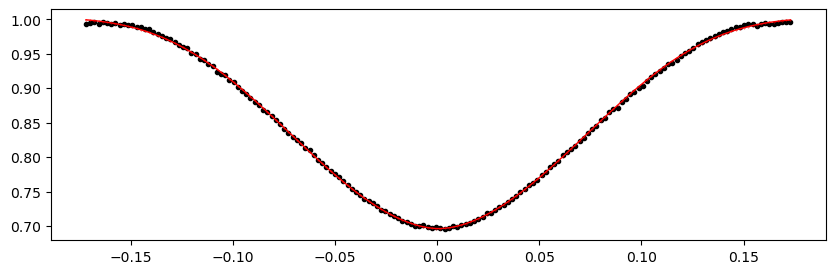

2197.07044 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 320.52it/s]


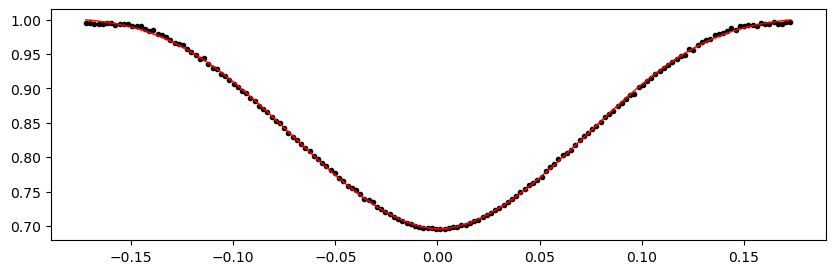

2197.7427 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 322.69it/s]


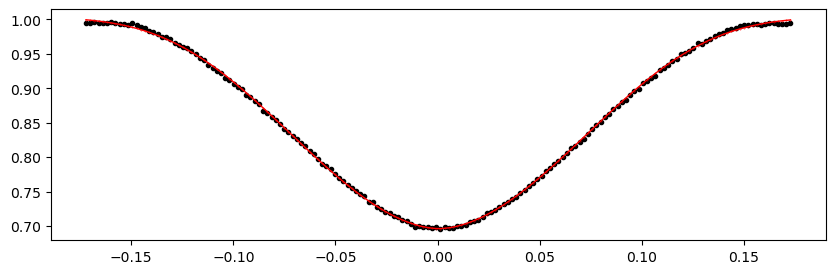

2198.41496 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 322.58it/s]


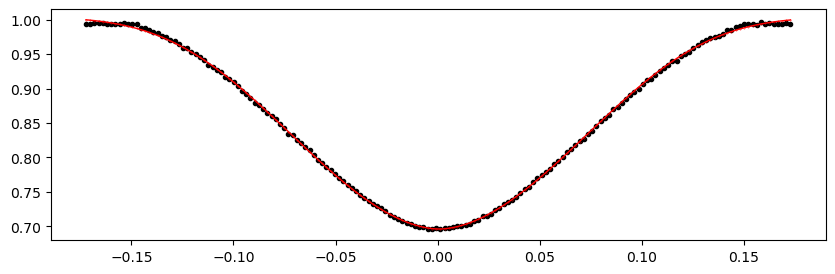

2199.08722 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 323.49it/s]


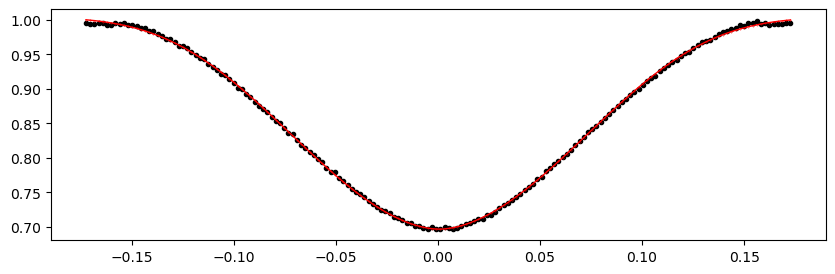

2199.75948 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 317.36it/s]


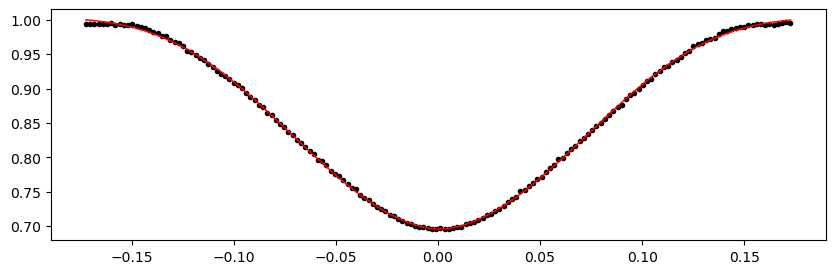

2201.77626 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 354.12it/s]


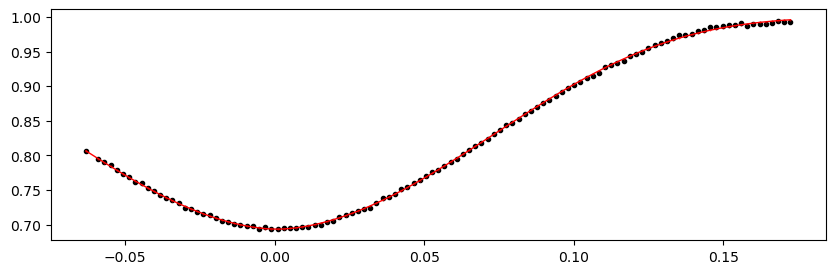

2202.44852 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 320.34it/s]


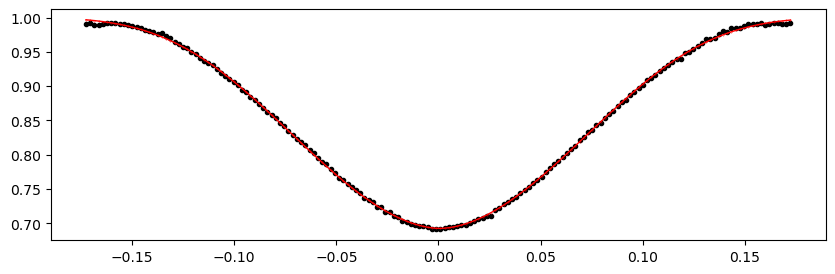

2203.12078 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 316.65it/s]


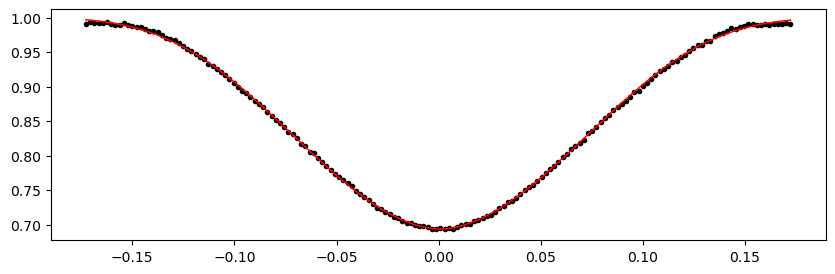

2203.79304 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 318.73it/s]


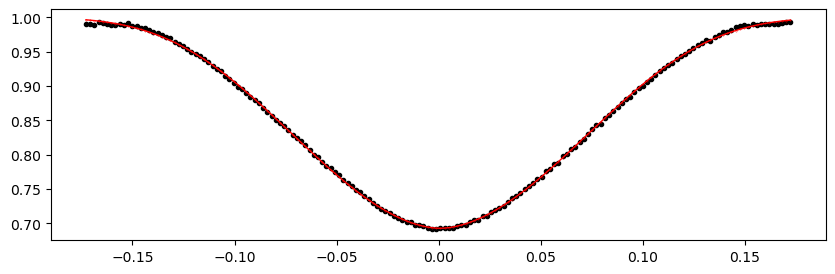

2204.4653 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 322.59it/s]


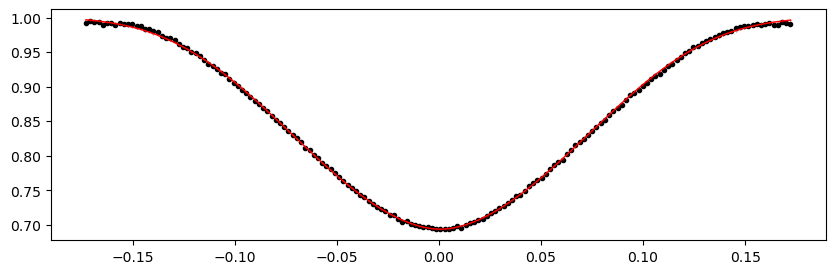

2205.13756 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 319.55it/s]


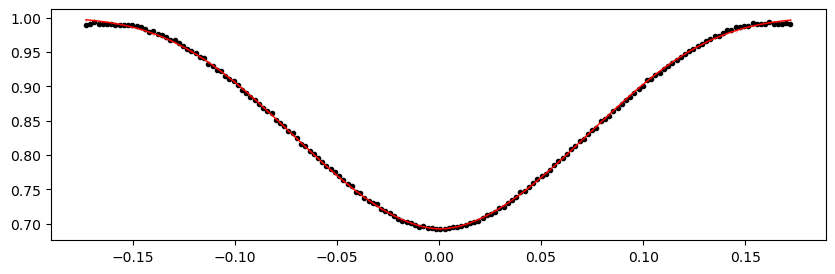

2205.80982 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 323.21it/s]


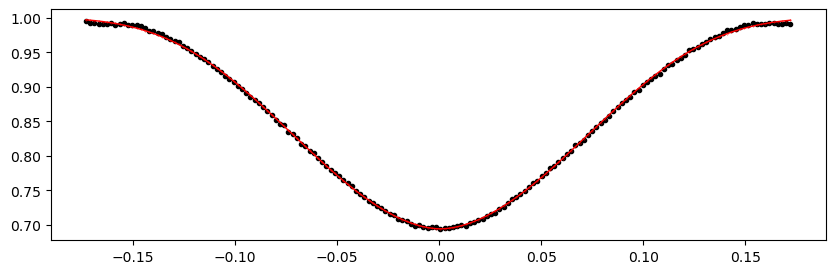

2206.4820799999998 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:33<00:00, 300.87it/s]


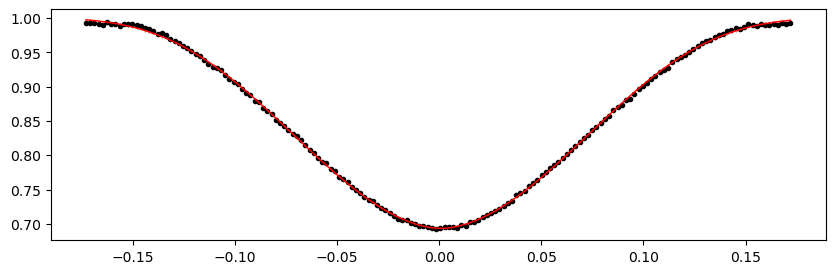

2207.15434 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 341.56it/s]


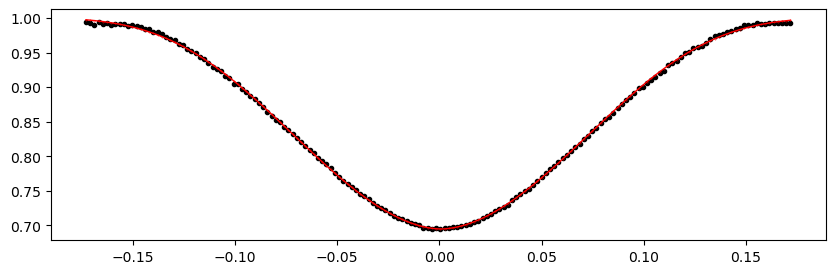

2207.8266 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 317.38it/s]


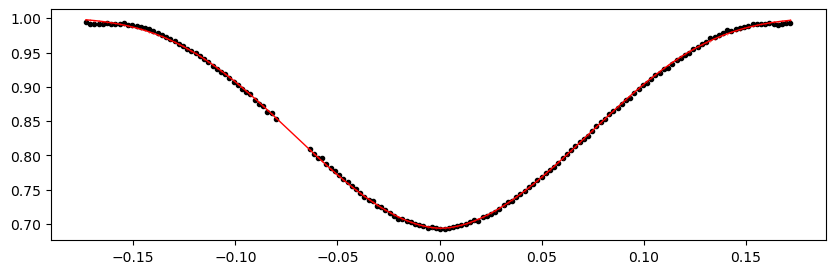

2208.49886 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 342.09it/s]


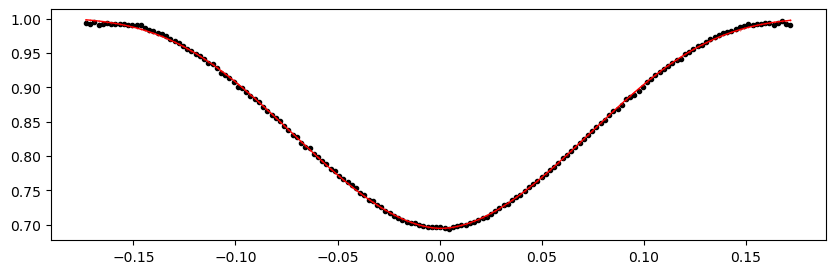

2209.17112 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 338.32it/s]


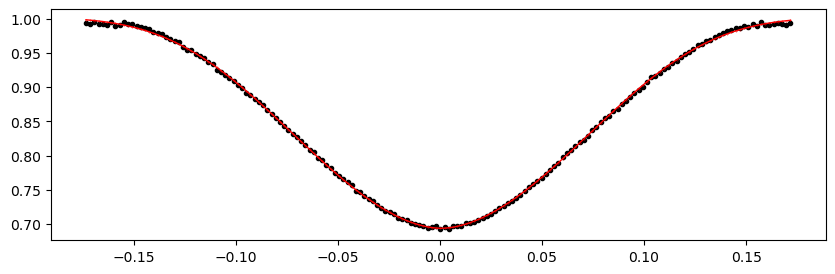

2209.84338 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 335.55it/s]


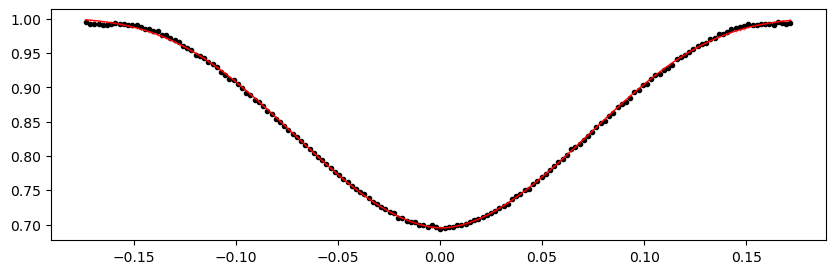

2210.51564 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 339.35it/s]


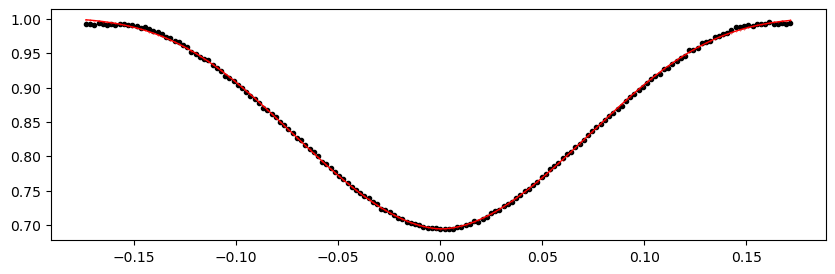

2211.1879 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 340.50it/s]


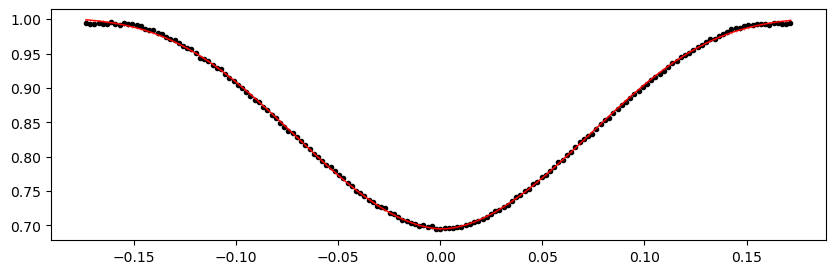

2211.86016 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 341.38it/s]


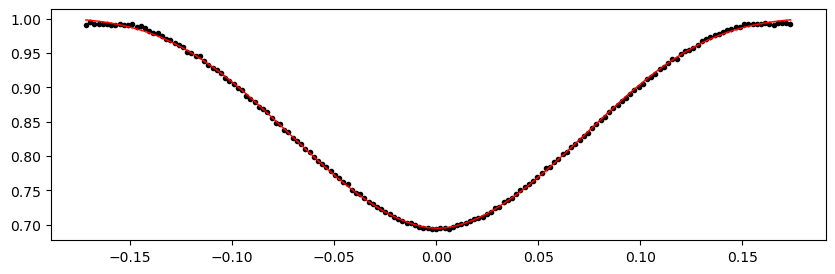

2212.53242 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 342.26it/s]


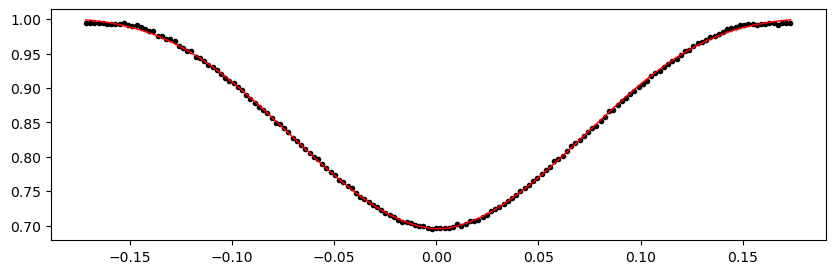

2213.20468 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 341.13it/s]


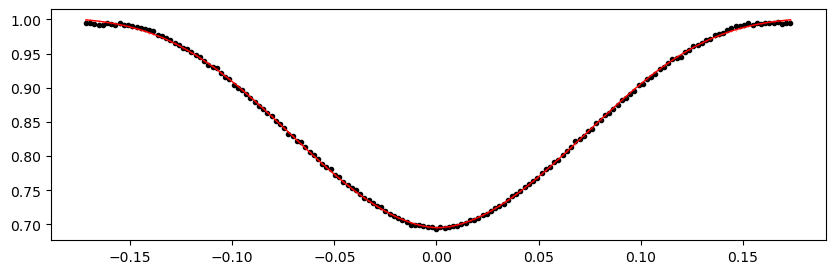

2213.87694 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 397.56it/s]


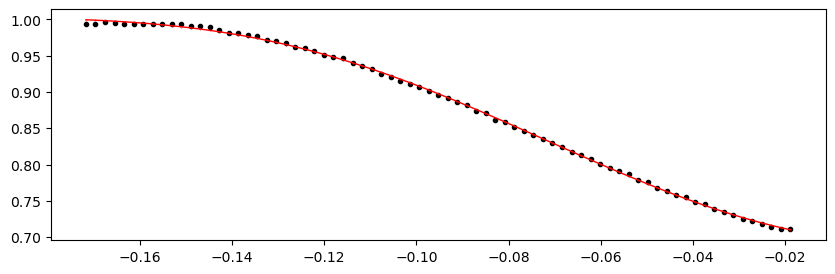

2215.89372 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 341.62it/s]


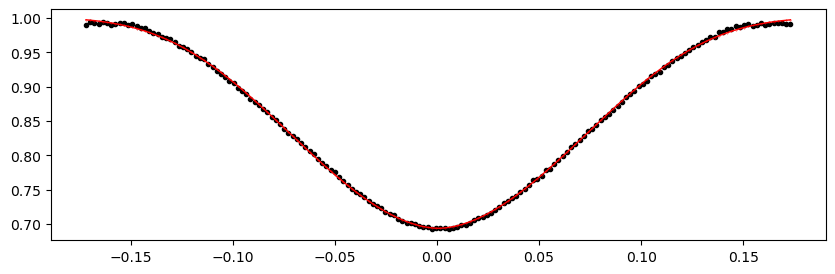

2216.56598 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 338.45it/s]


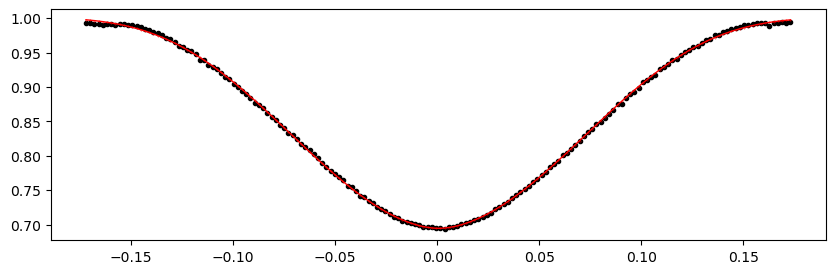

2217.23824 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 335.56it/s]


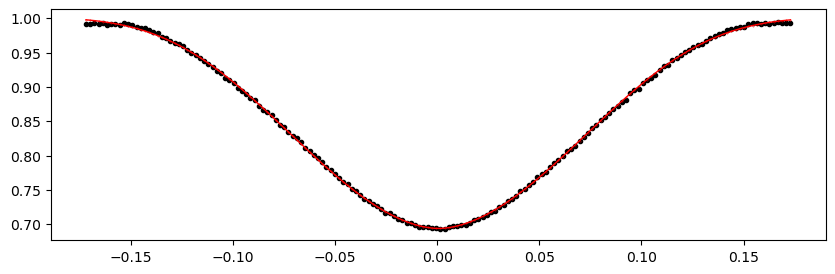

2217.9105 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 341.25it/s]


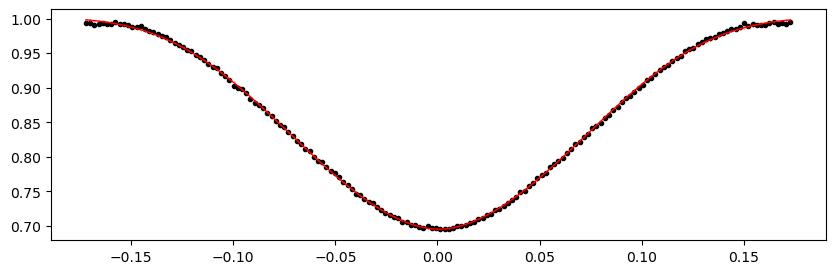

2218.5827600000002 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 344.54it/s]


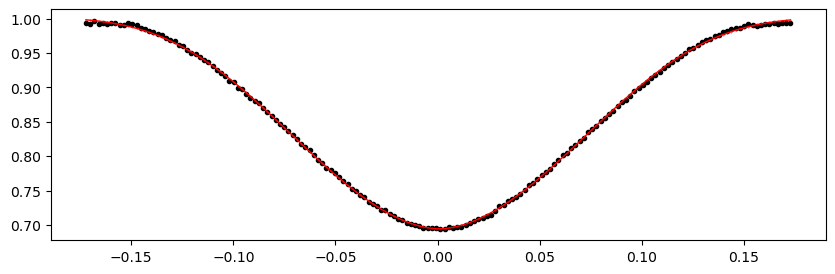

2219.25502 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 346.41it/s]


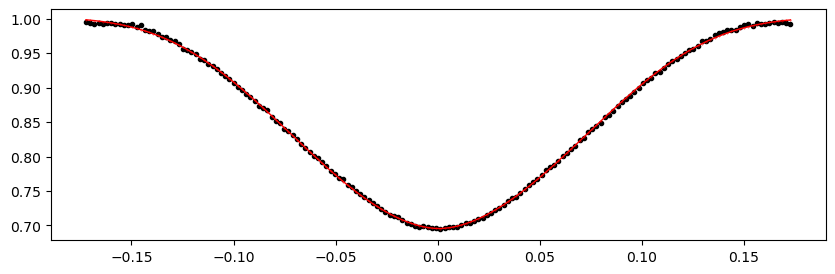

2219.92728 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 341.43it/s]


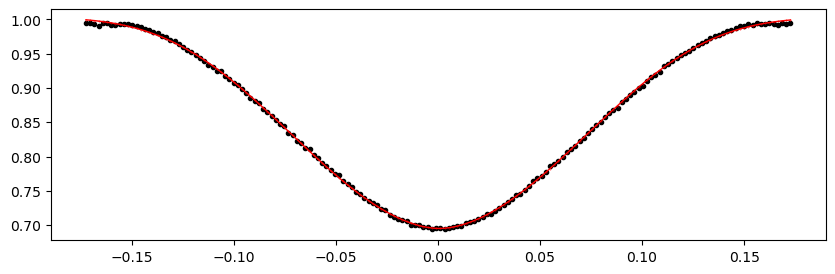

2220.59954 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 339.90it/s]


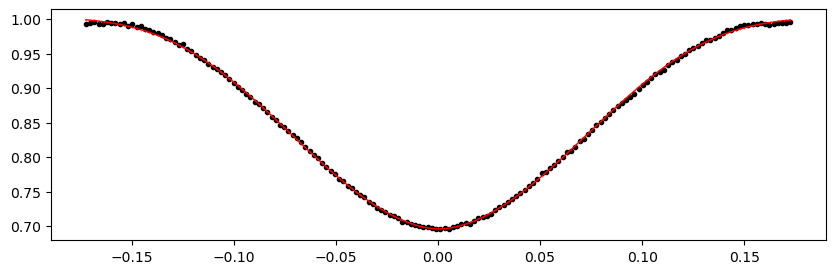

2221.2718 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 312.74it/s]


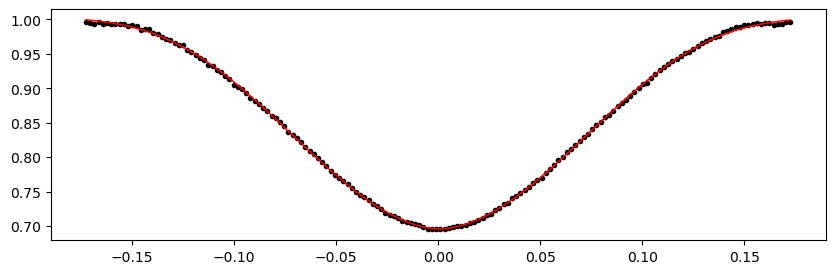

2221.94406 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 347.24it/s]


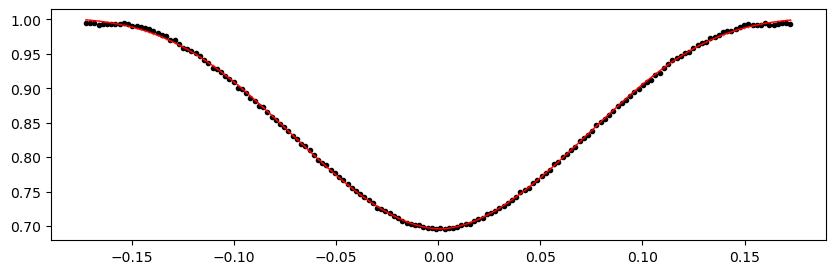

2222.61632 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 342.58it/s]


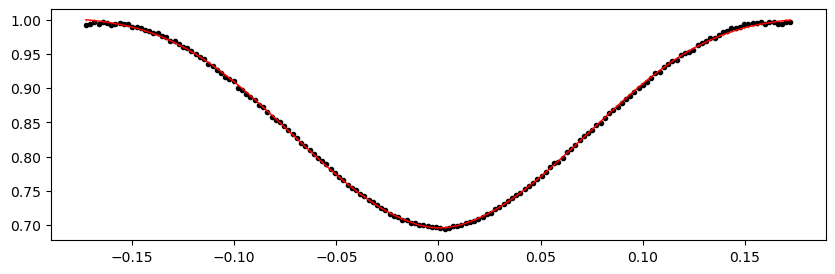

2223.28858 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 344.48it/s]


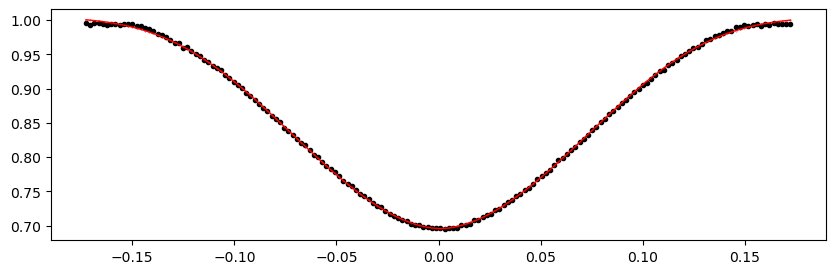

2223.96084 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 344.05it/s]


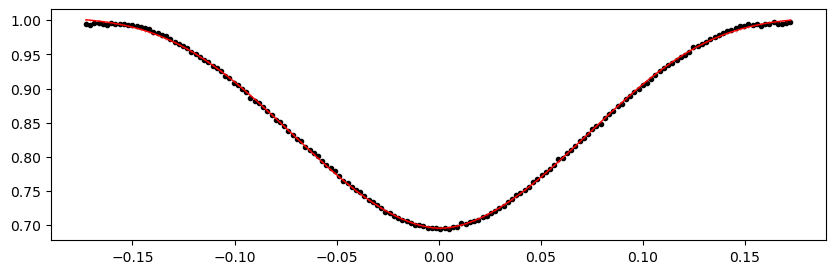

2224.6331 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 344.27it/s]


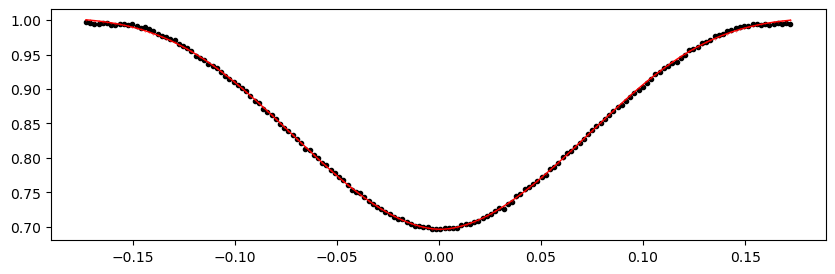

2225.30536 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 344.09it/s]


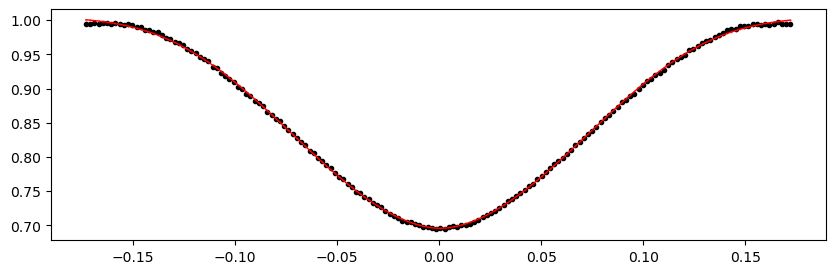

2225.97762 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 343.57it/s]


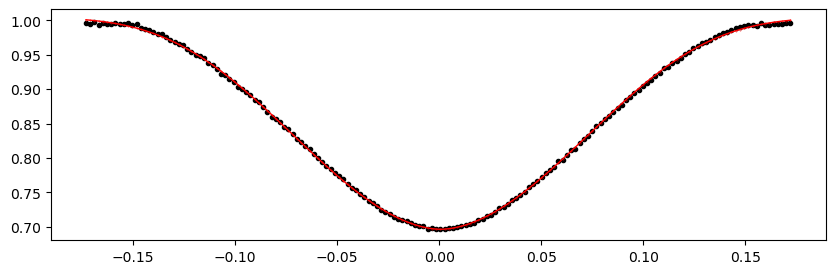

2226.64988 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 345.54it/s]


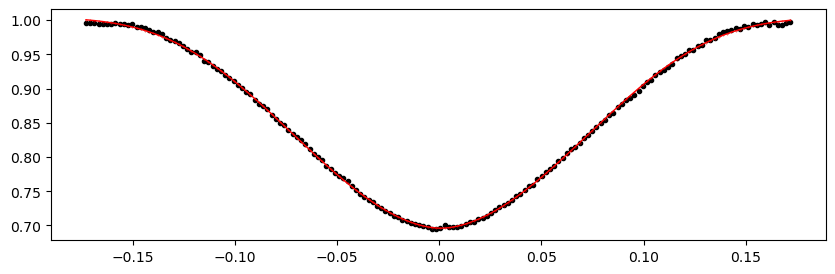

2227.32214 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 345.34it/s]


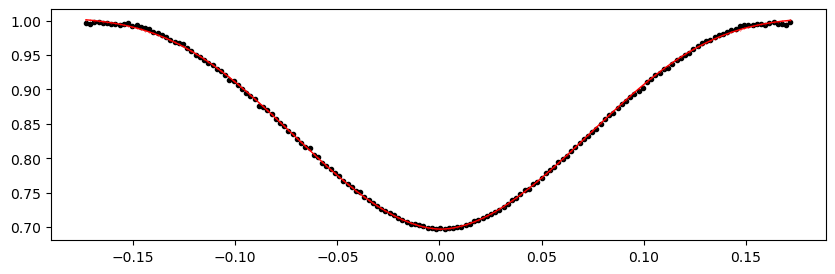

2229.33892 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 342.35it/s]


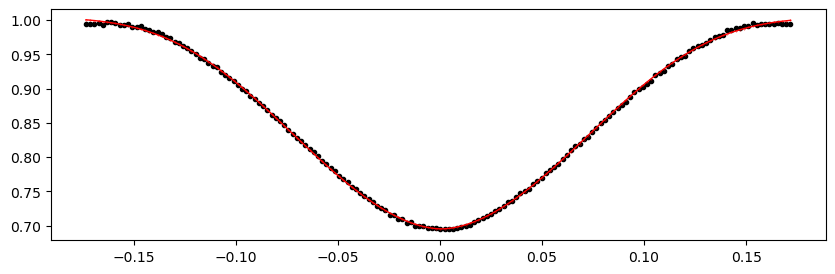

2230.01118 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 345.35it/s]


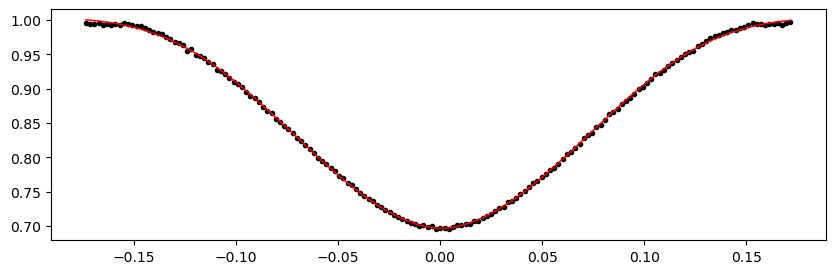

2230.68344 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 345.85it/s]


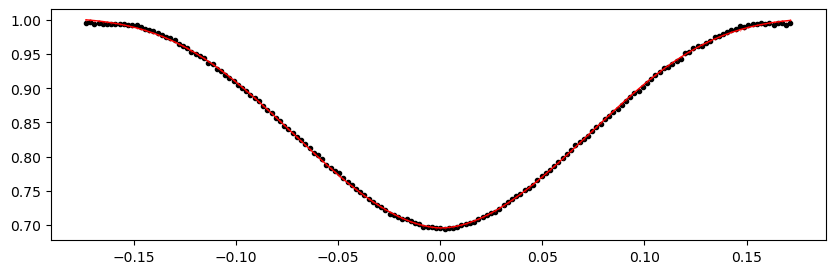

2231.3557 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 346.46it/s]


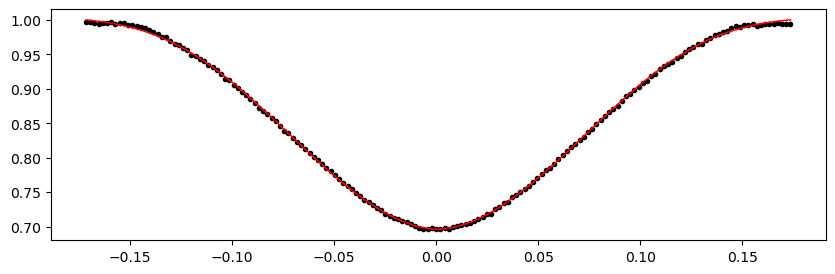

2232.02796 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 343.88it/s]


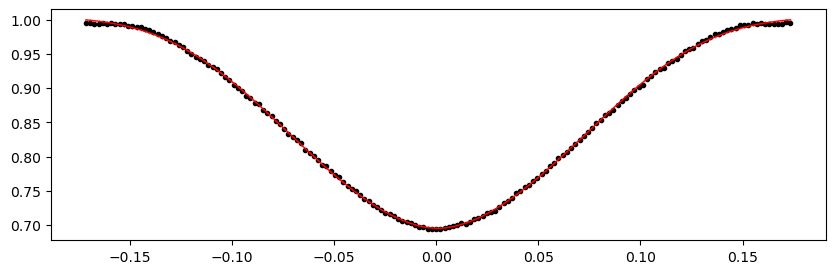

2232.70022 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 343.79it/s]


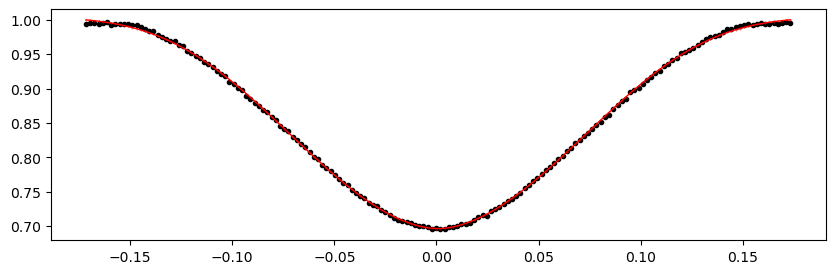

2233.37248 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 344.14it/s]


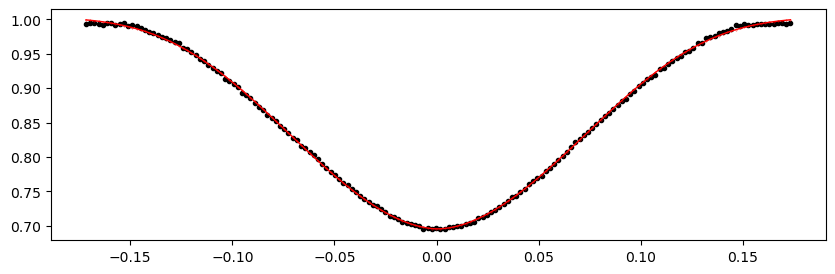

2234.04474 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 344.38it/s]


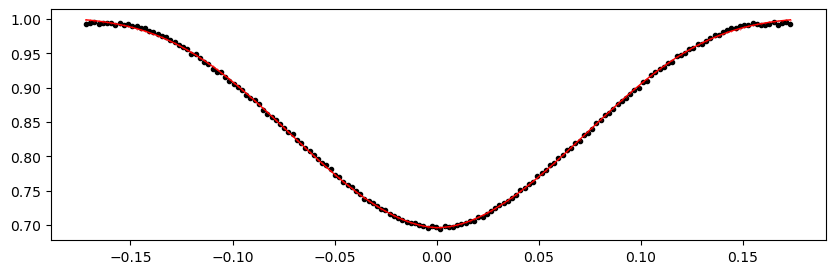

2234.717 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 318.07it/s]


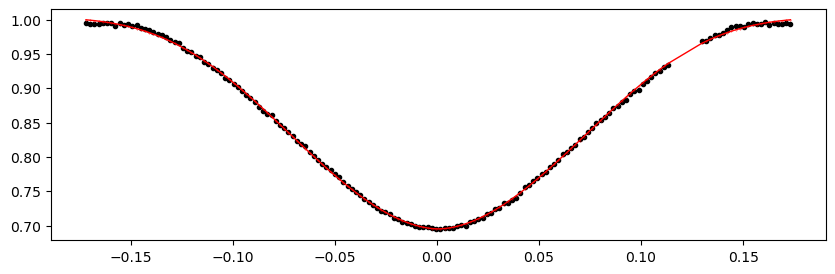

2235.38926 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 344.75it/s]


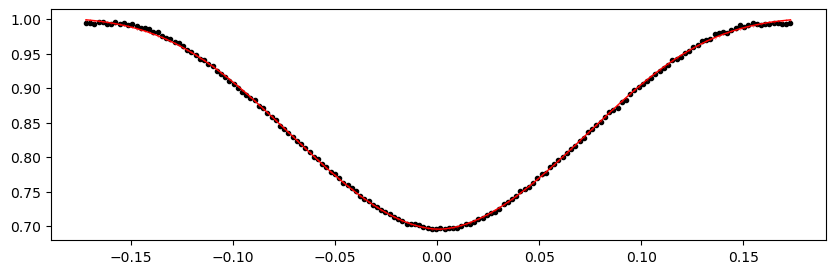

2236.06152 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 346.98it/s]


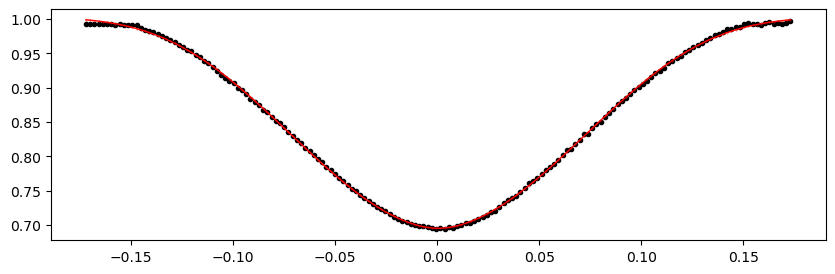

2236.73378 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 345.88it/s]


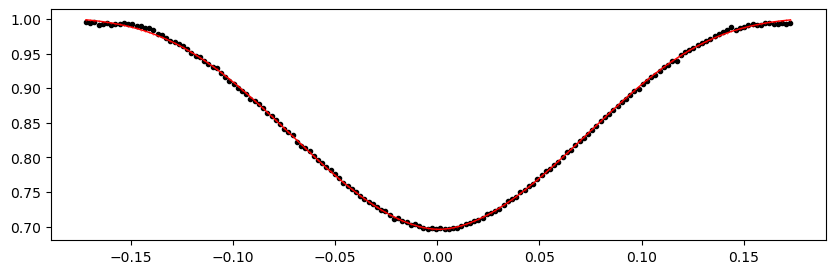

2237.40604 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 345.92it/s]


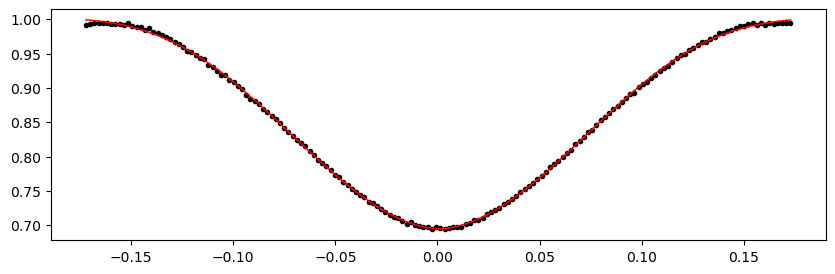

2238.0783 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 344.07it/s]


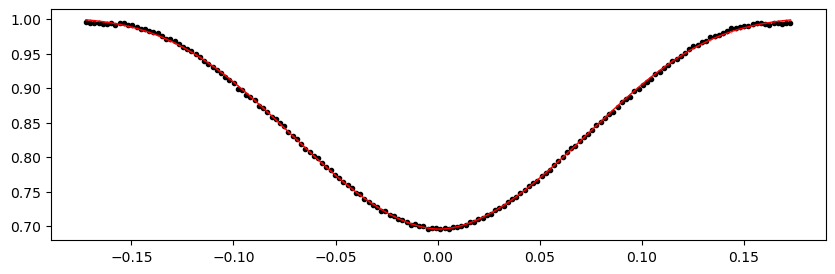

2238.75056 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 345.84it/s]


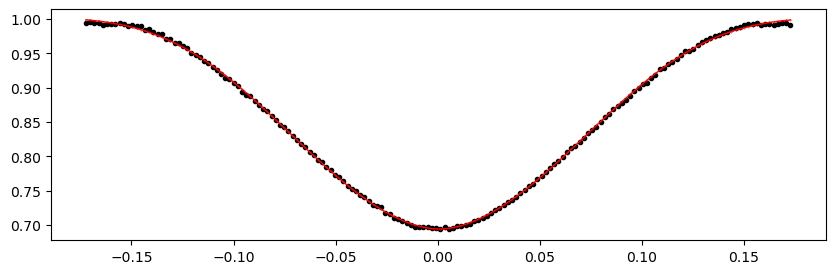

2239.42282 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 344.50it/s]


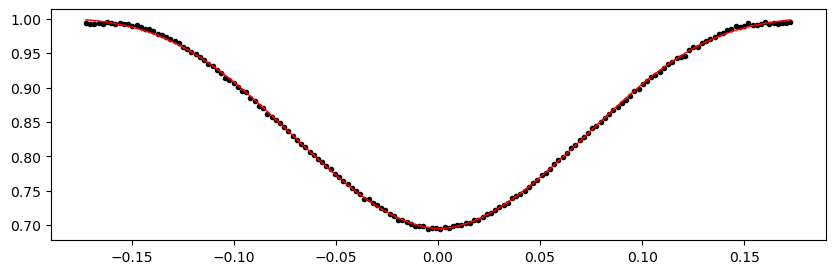

2240.09508 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 344.98it/s]


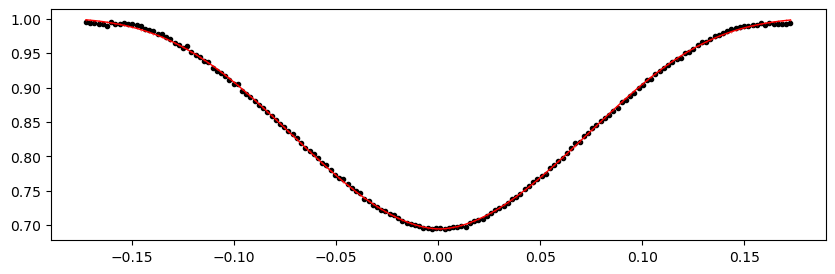

2240.76734 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 344.28it/s]


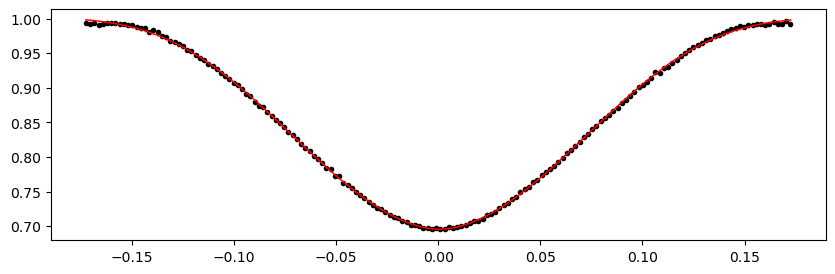

2242.78412 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 344.58it/s]


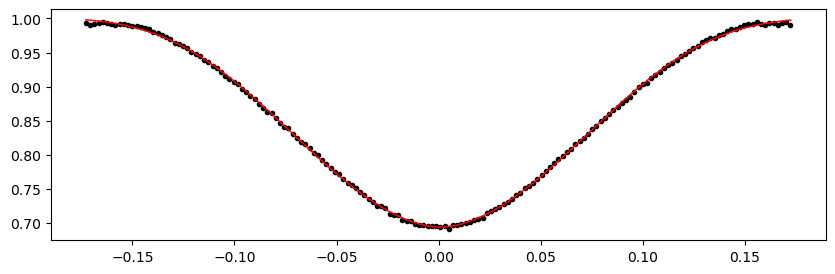

2243.45638 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 345.08it/s]


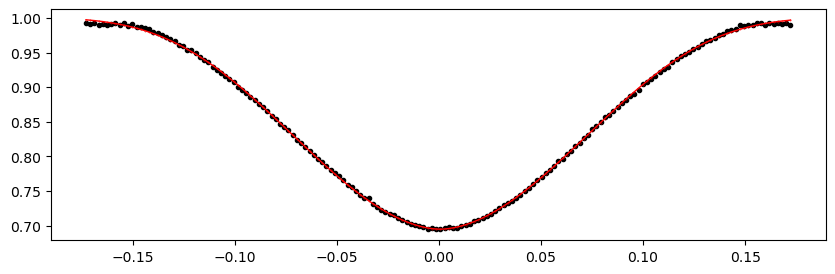

2244.12864 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 345.03it/s]


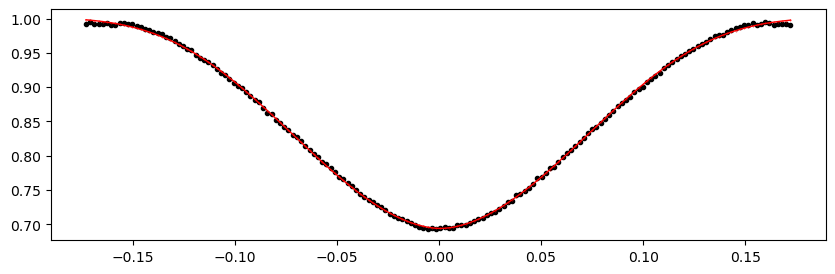

2244.8009 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 343.96it/s]


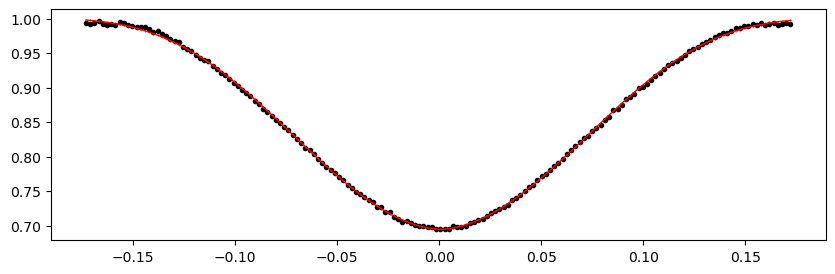

2245.47316 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 346.86it/s]


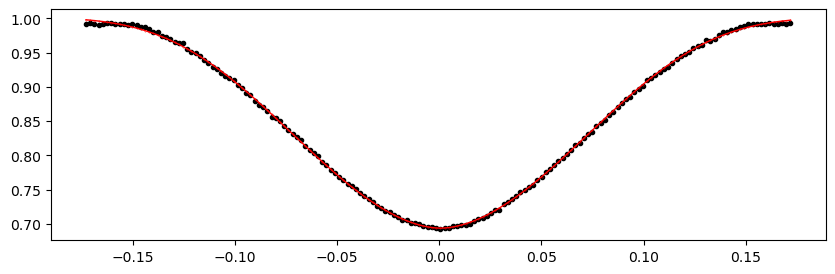

2246.14542 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 343.09it/s]


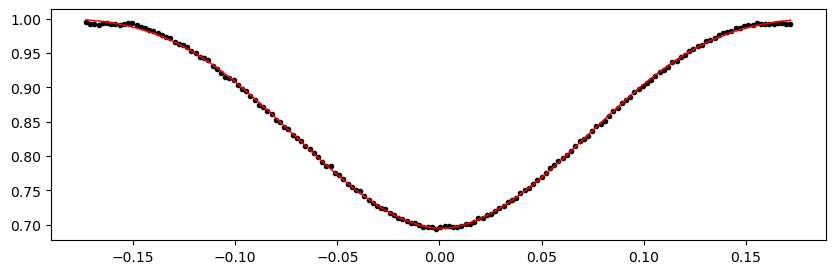

2246.81768 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 342.70it/s]


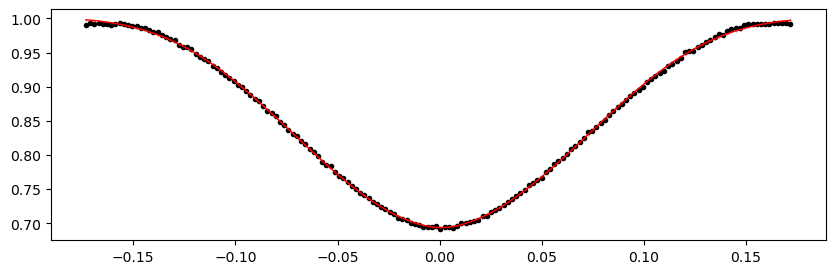

2247.48994 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 338.35it/s]


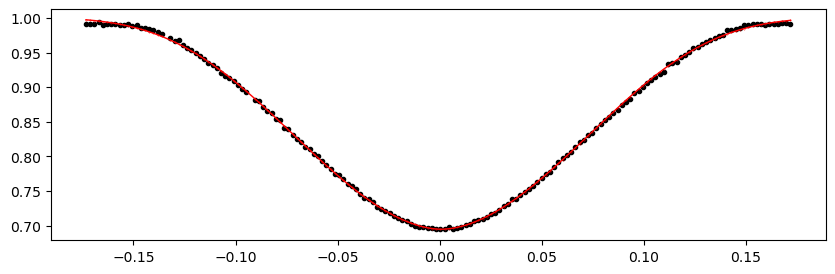

2248.1622 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 314.33it/s]


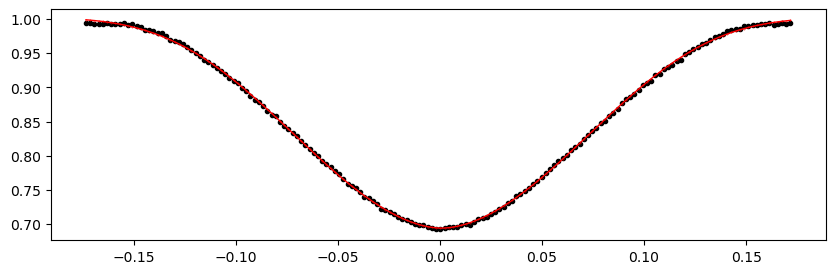

2248.83446 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 345.03it/s]


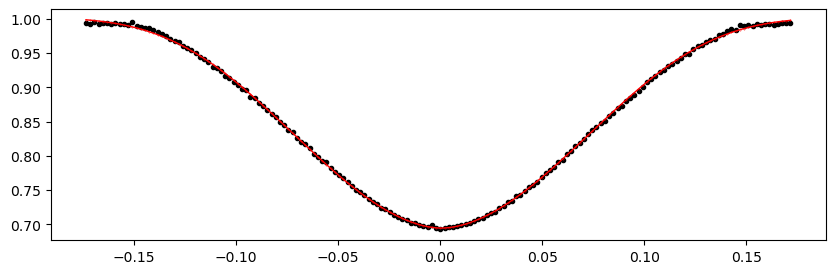

2249.50672 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 345.67it/s]


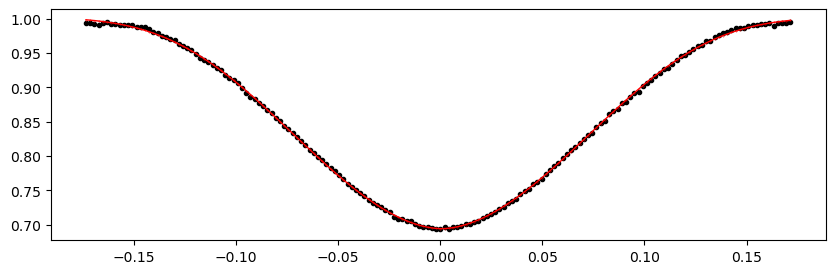

2250.17898 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 345.01it/s]


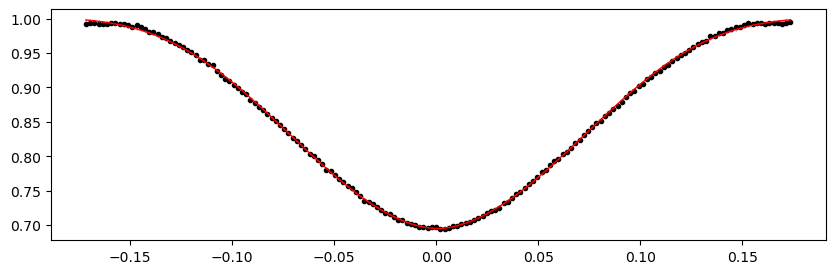

2250.85124 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 345.68it/s]


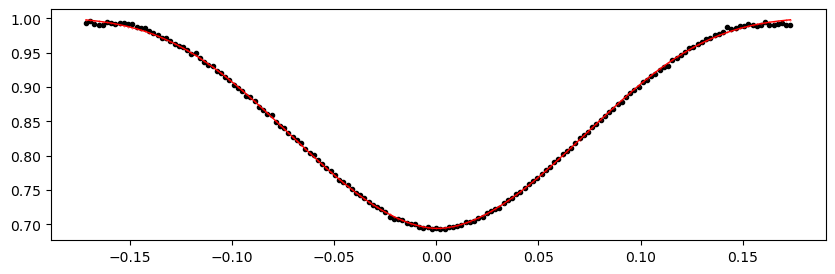

2251.5235000000002 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 347.02it/s]


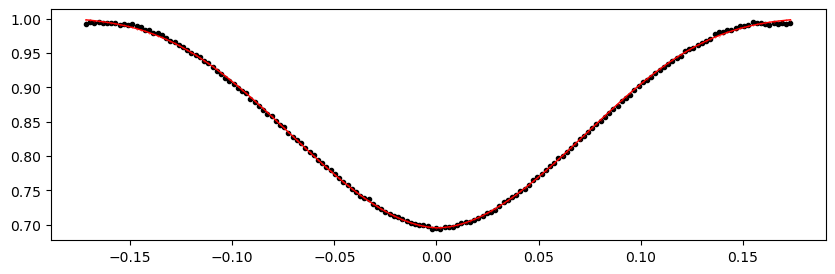

2252.19576 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 345.51it/s]


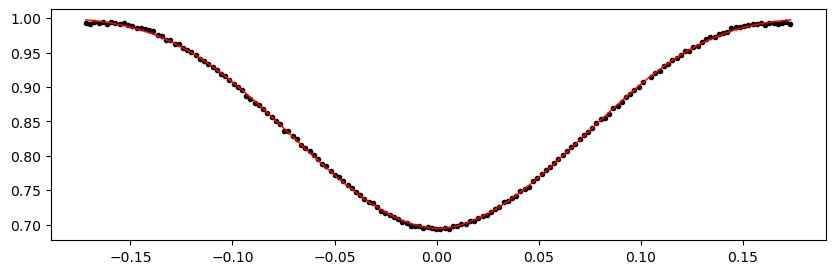

2252.86802 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 344.49it/s]


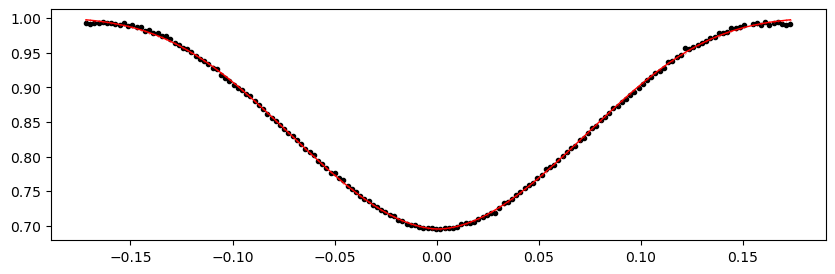

2253.54028 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 347.12it/s]


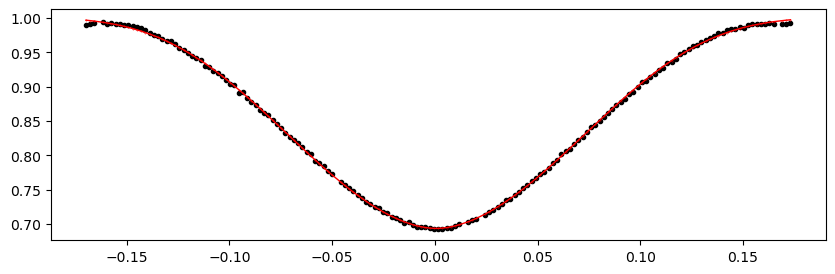

2256.22932 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 344.96it/s]


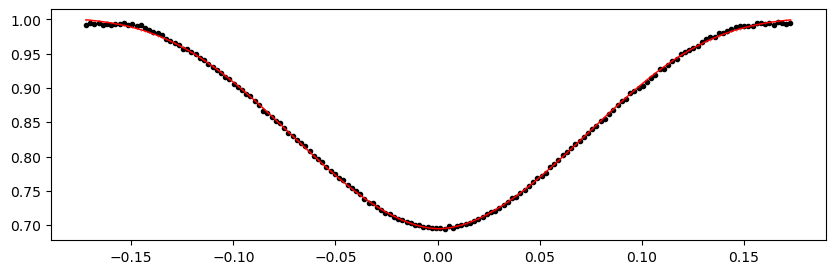

2256.90158 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 340.13it/s]


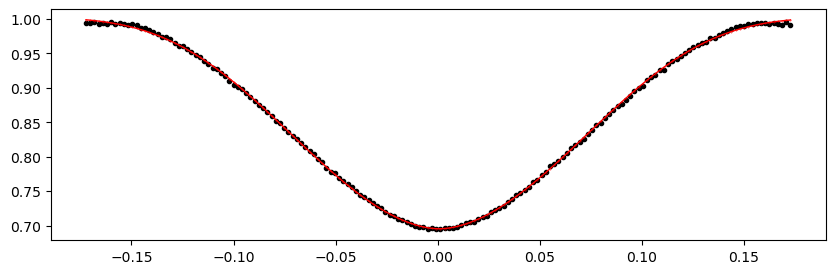

2257.57384 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 343.52it/s]


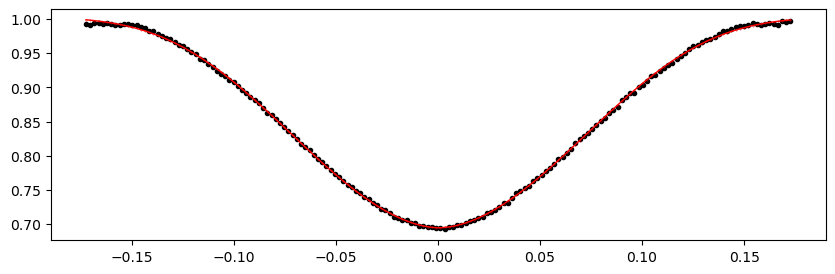

2258.2461 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 344.61it/s]


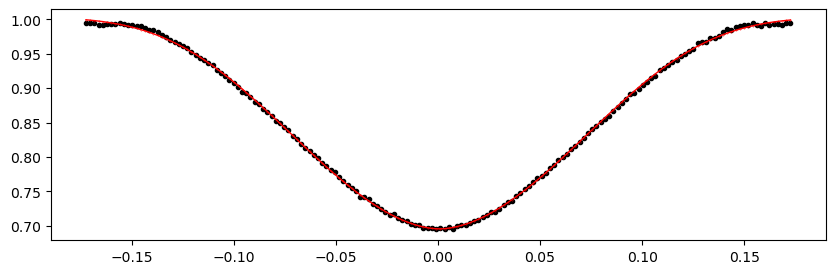

2258.91836 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 345.20it/s]


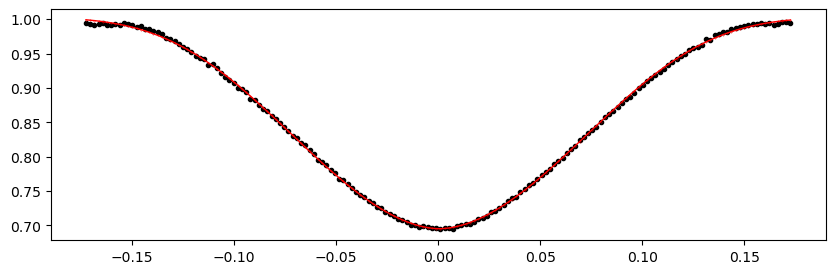

2259.59062 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 344.85it/s]


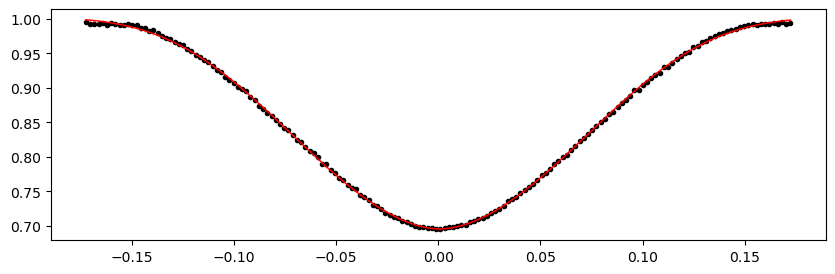

2260.26288 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 345.39it/s]


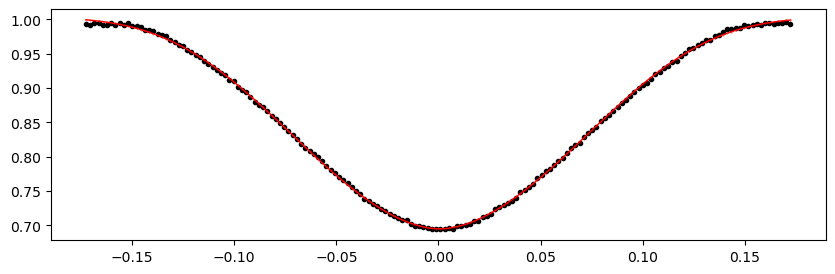

2260.93514 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 319.02it/s]


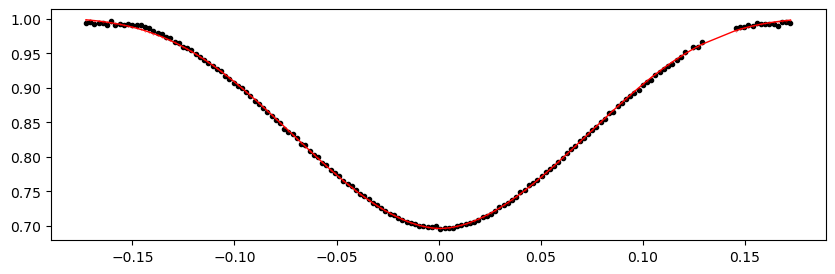

2261.6074 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 345.31it/s]


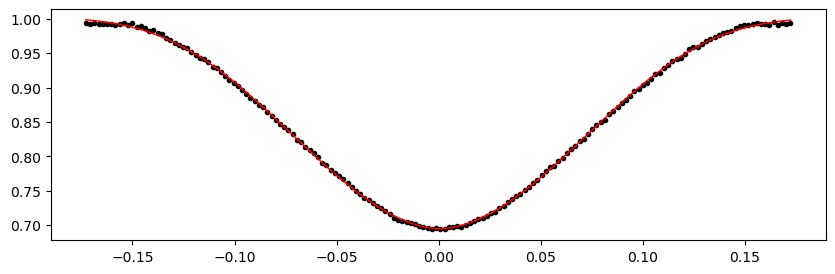

2262.27966 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 346.01it/s]


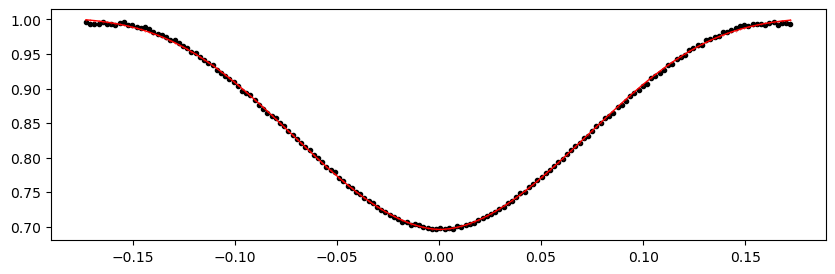

2262.95192 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 343.61it/s]


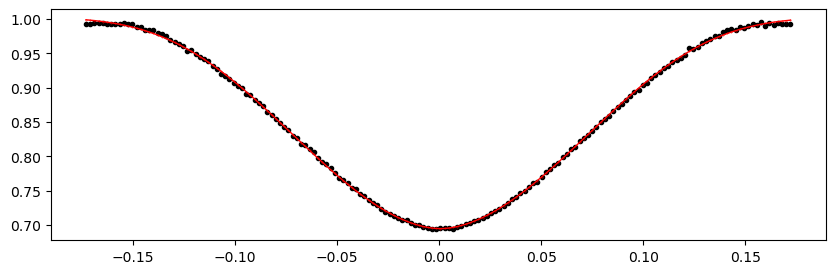

2263.62418 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 343.61it/s]


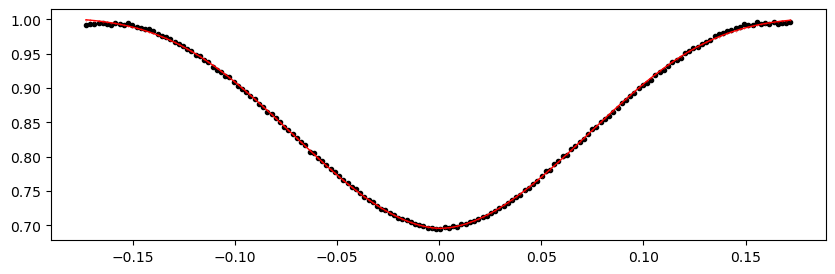

2264.29644 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 346.33it/s]


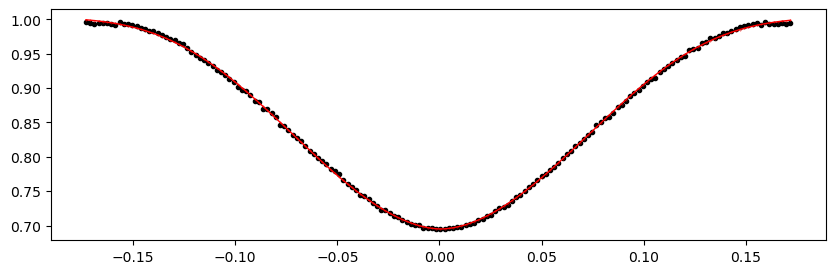

2264.9687 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 346.38it/s]


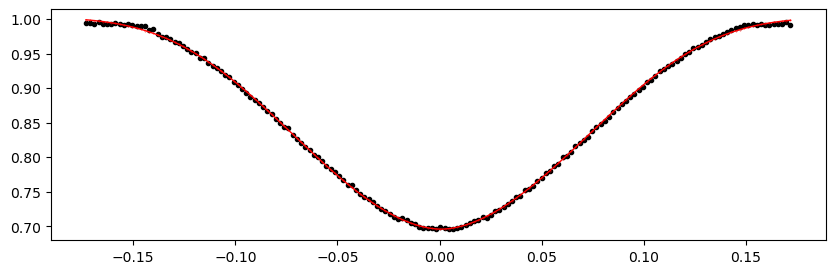

2265.64096 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 347.25it/s]


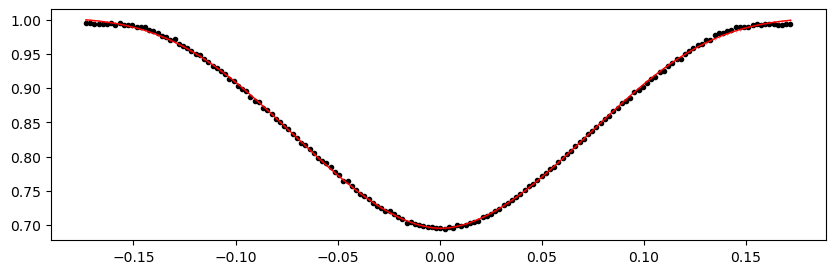

2266.31322 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 417.97it/s]


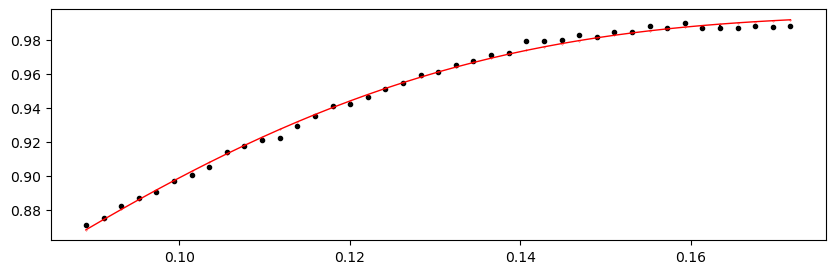

2266.98548 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 347.14it/s]


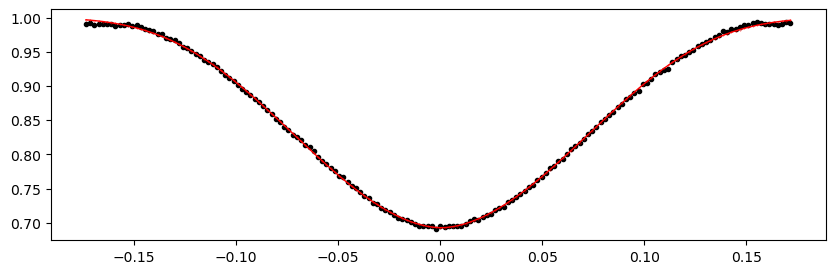

2272.36356 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 345.41it/s]


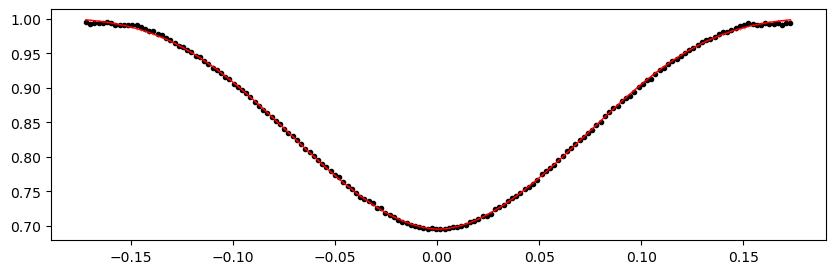

2273.03582 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 346.46it/s]


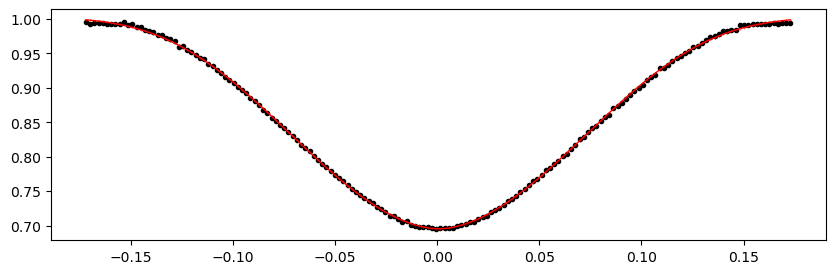

2273.70808 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 344.53it/s]


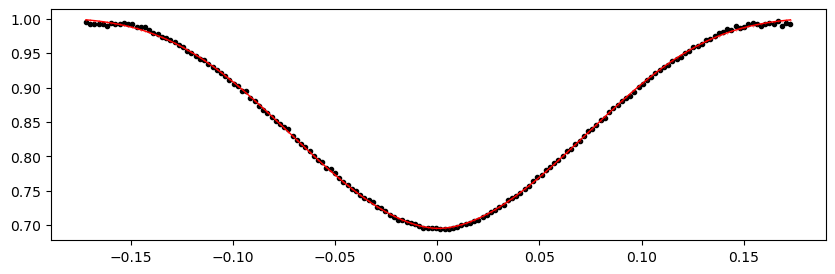

2274.38034 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 332.04it/s]


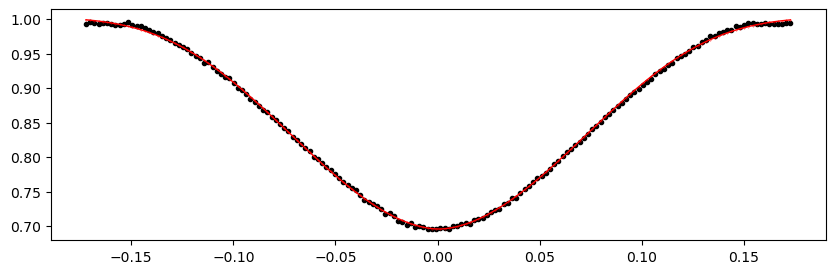

2275.0526 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:32<00:00, 309.45it/s]


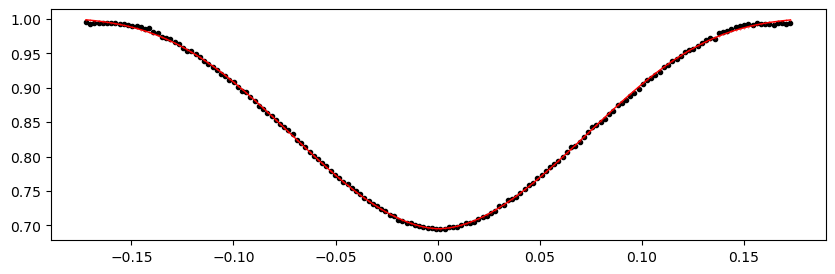

2275.72486 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 339.39it/s]


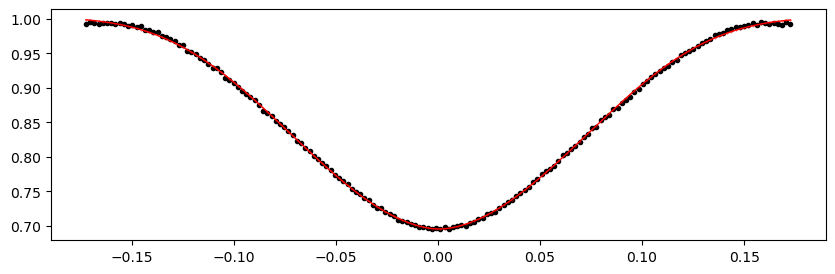

2276.39712 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 337.67it/s]


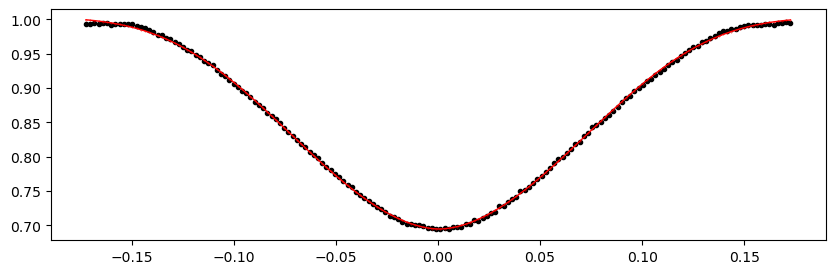

2277.06938 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 339.27it/s]


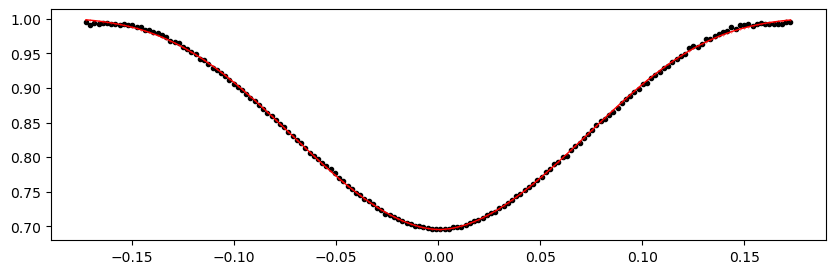

2277.74164 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 339.51it/s]


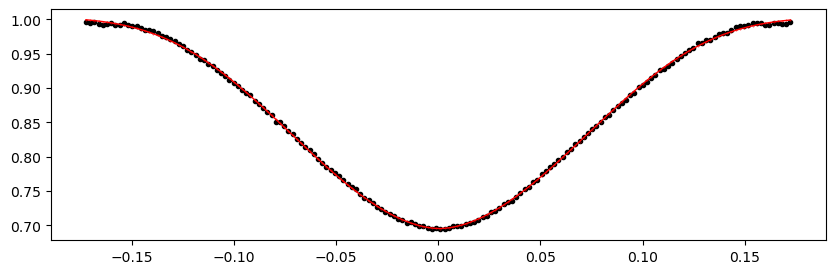

2278.4139 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 339.27it/s]


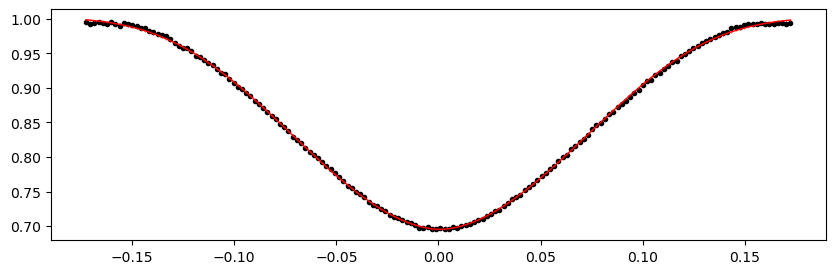

2279.08616 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 335.35it/s]


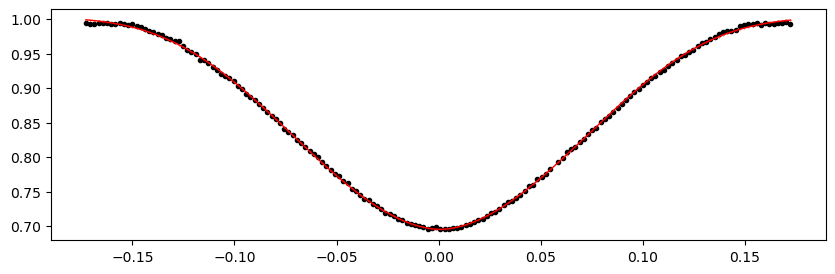

2279.75842 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 335.68it/s]


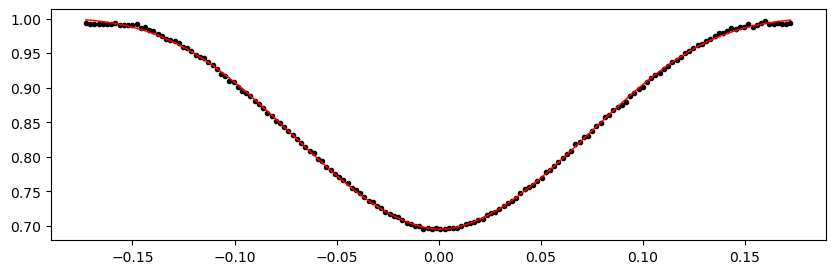

2282.44746 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 417.45it/s]


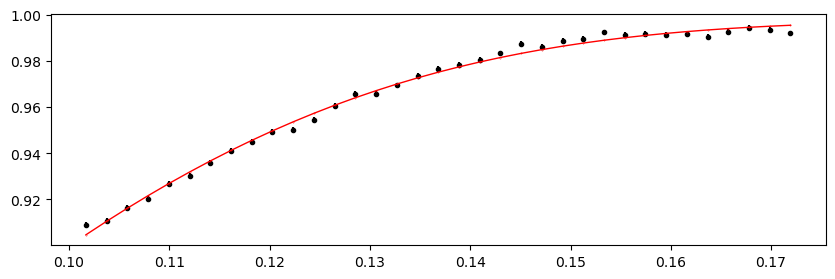

2283.11972 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:32<00:00, 307.03it/s]


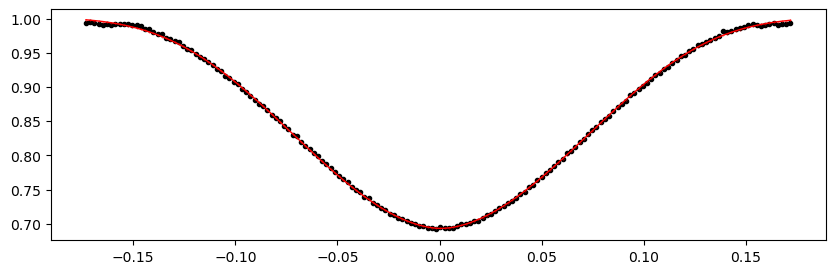

2283.79198 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:32<00:00, 304.98it/s]


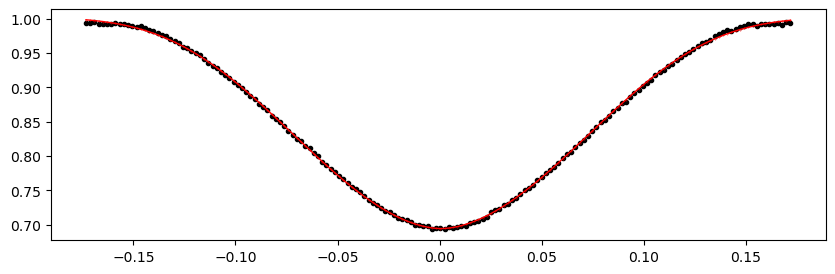

2284.4642400000002 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 340.31it/s]


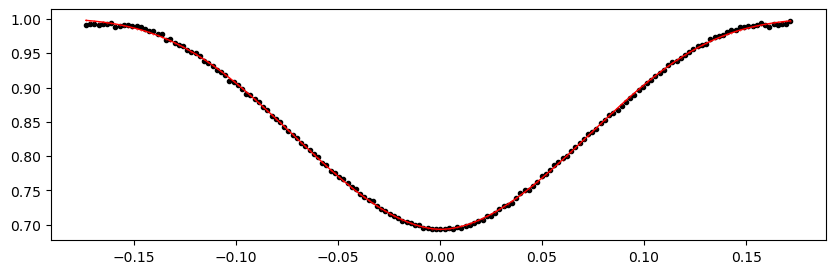

2285.1365 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 340.14it/s]


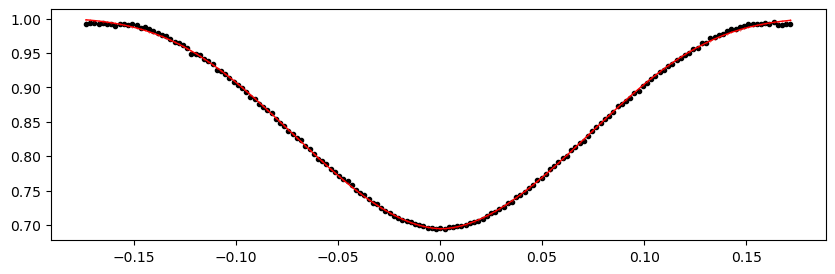

2285.80876 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 339.85it/s]


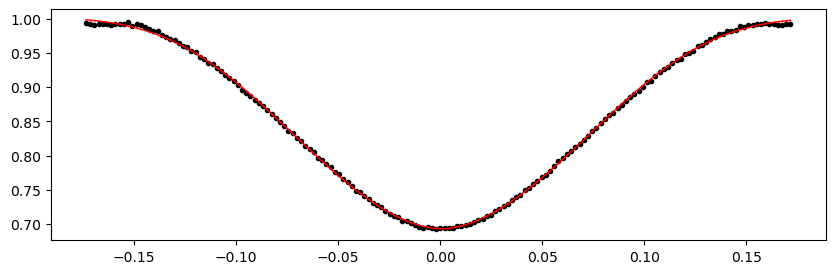

2286.48102 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 334.90it/s]


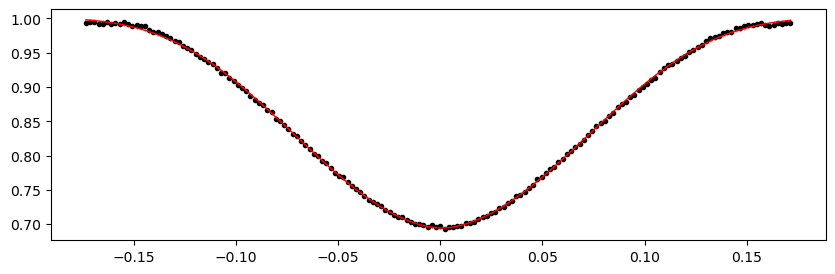

2287.15328 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 338.58it/s]


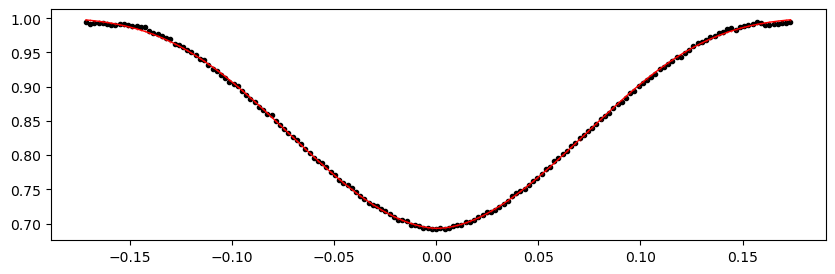

2287.82554 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 338.76it/s]


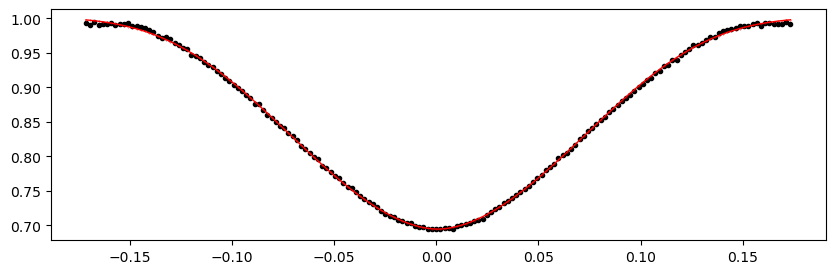

2288.4978 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 339.04it/s]


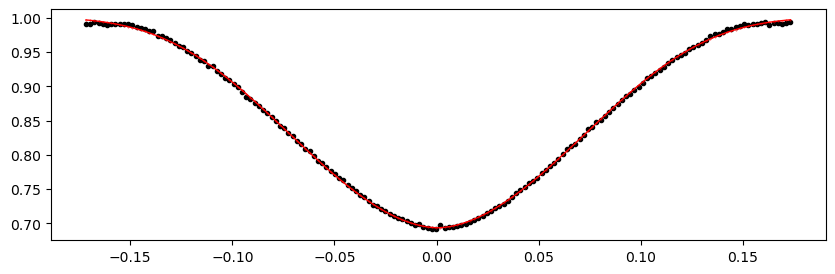

2289.17006 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 336.36it/s]


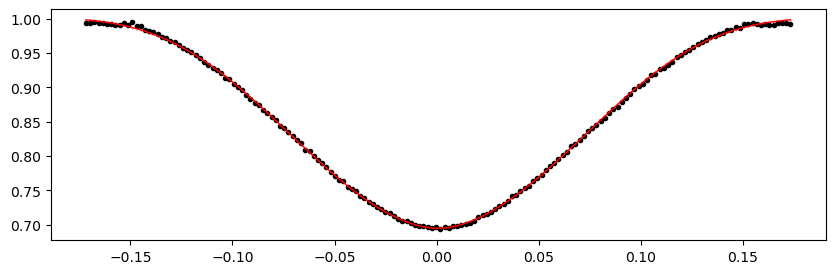

2289.84232 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 335.72it/s]


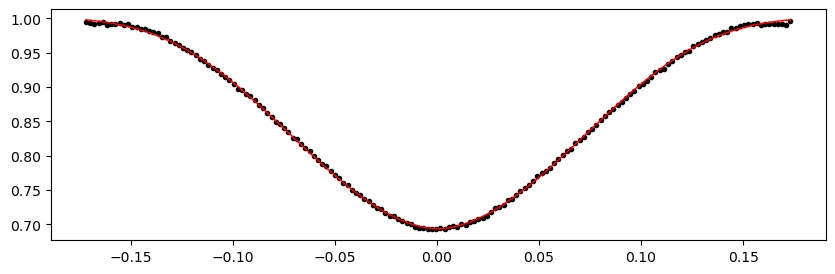

2290.51458 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 337.44it/s]


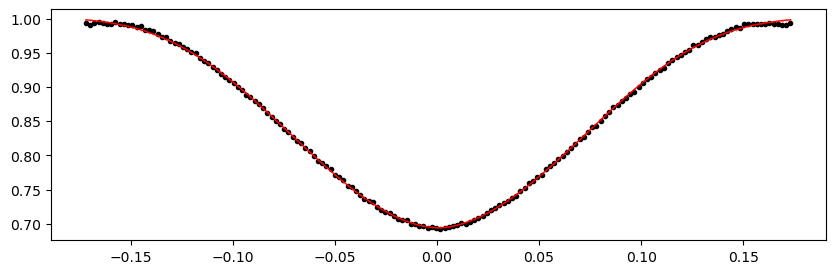

2291.18684 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 338.18it/s]


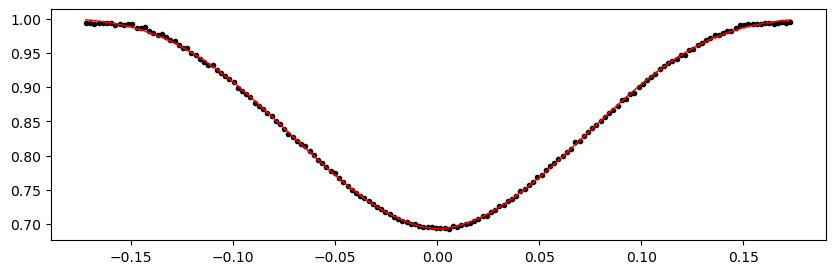

2291.8591 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 338.13it/s]


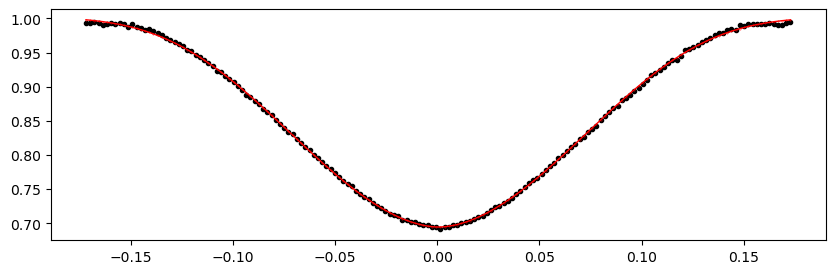

2292.53136 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 339.26it/s]


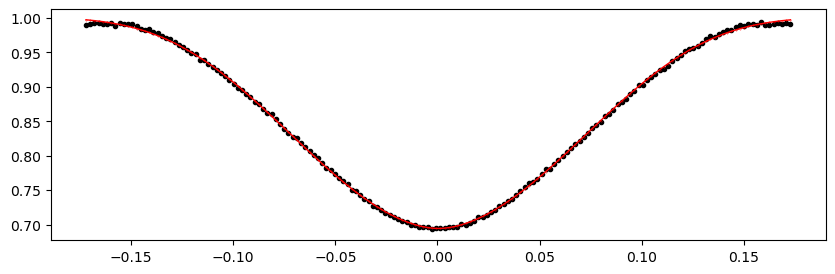

2295.89266 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 337.95it/s]


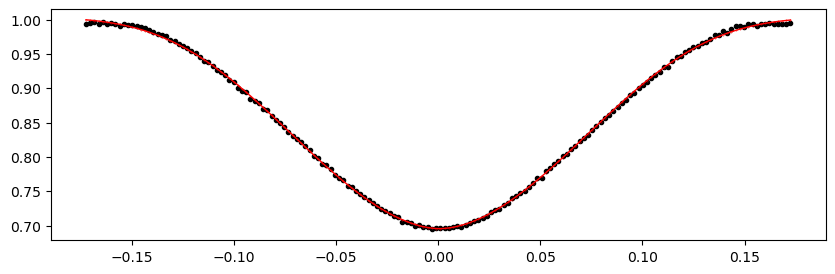

2296.56492 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 336.31it/s]


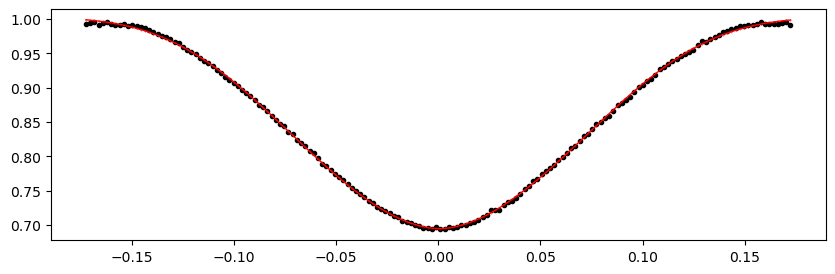

2297.23718 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 338.51it/s]


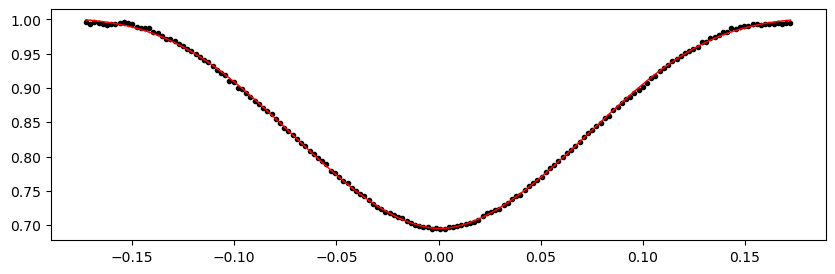

2297.90944 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 338.00it/s]


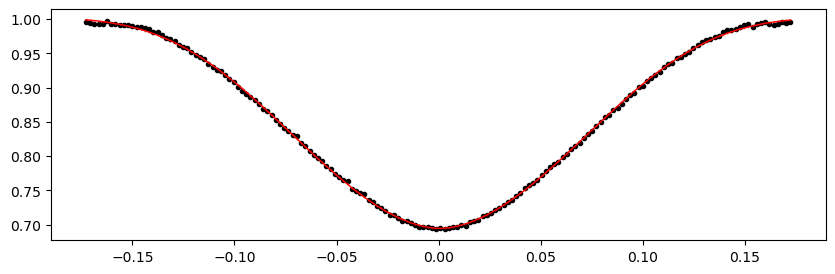

2298.5817 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 337.78it/s]


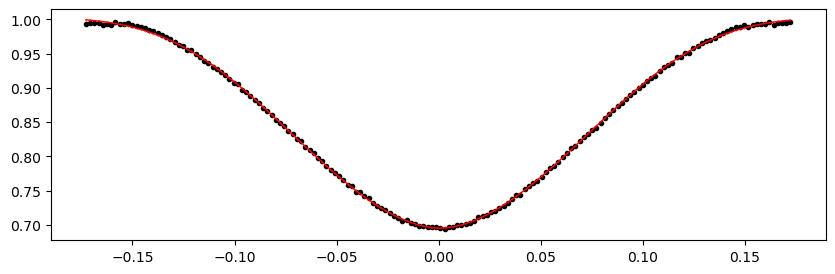

2299.25396 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 337.73it/s]


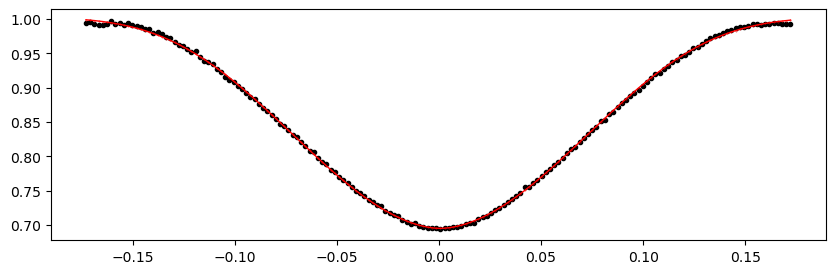

2299.92622 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 313.63it/s]


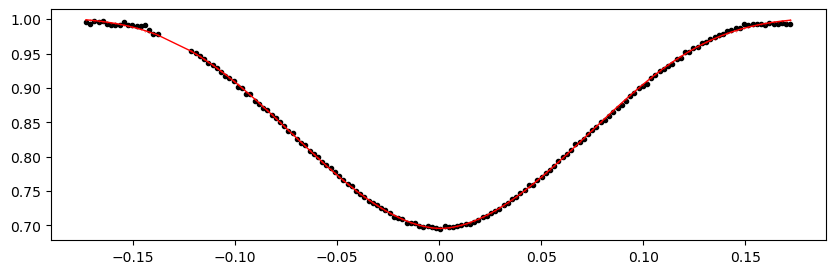

2300.59848 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 339.65it/s]


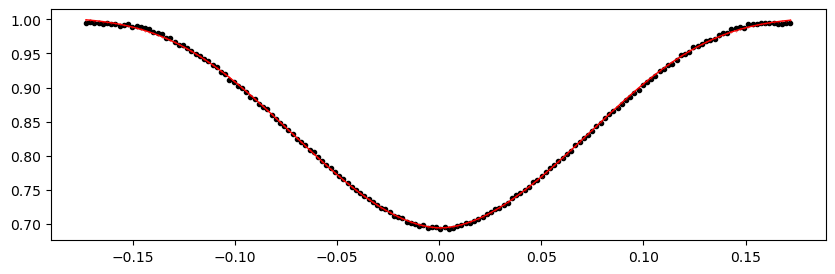

2301.27074 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 339.71it/s]


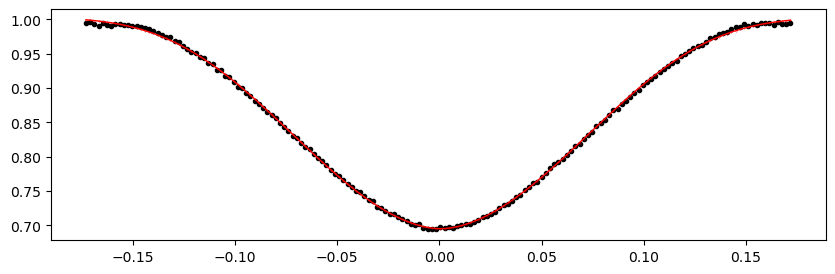

2301.943 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 340.75it/s]


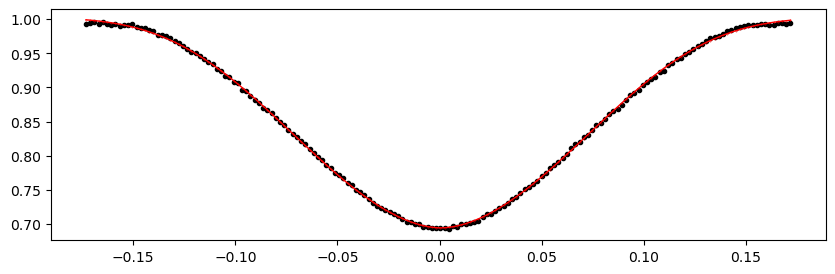

2302.61526 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 338.36it/s]


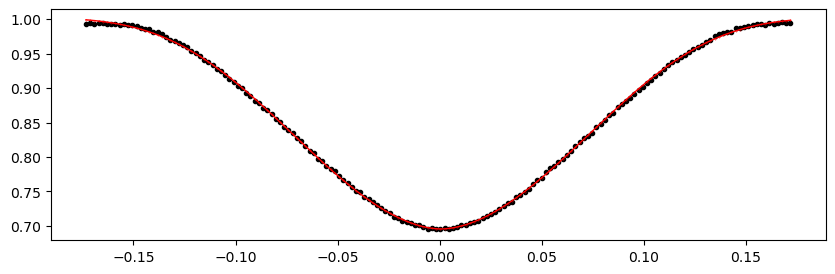

2303.28752 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 340.49it/s]


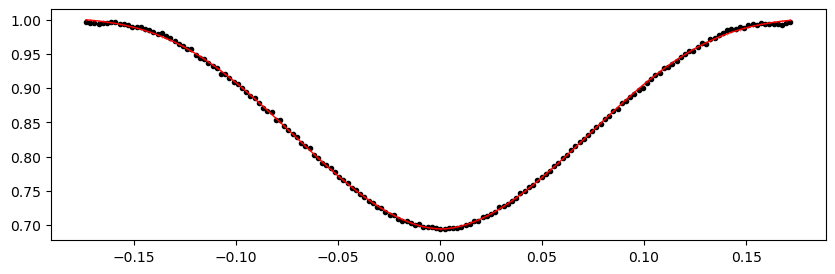

2303.95978 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 342.95it/s]


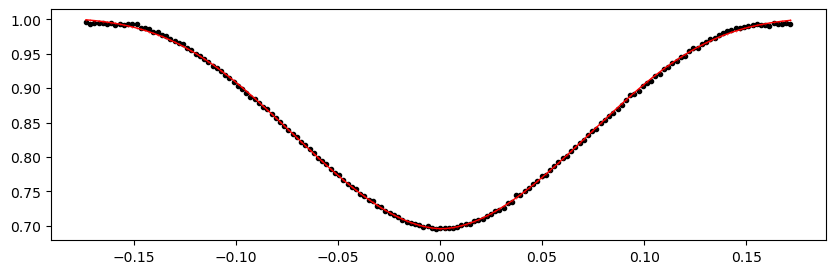

2304.63204 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 342.96it/s]


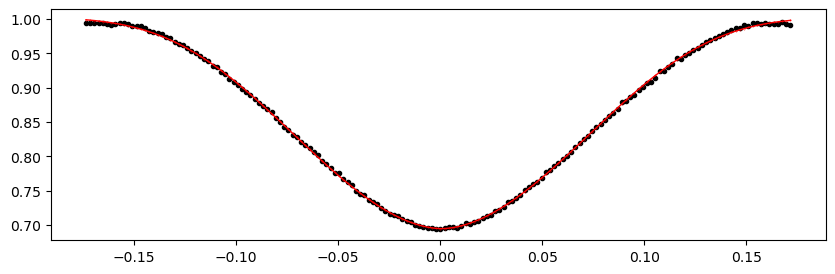

2305.3043 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 342.97it/s]


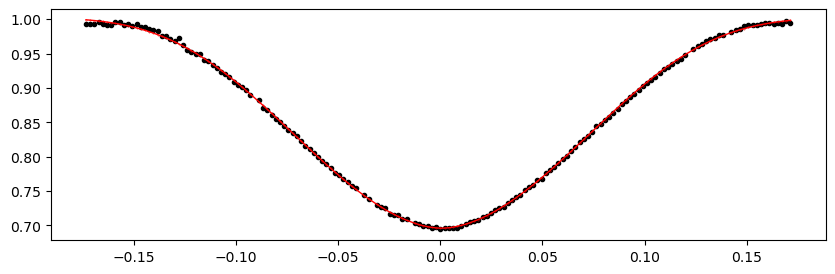

2305.97656 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 387.49it/s]


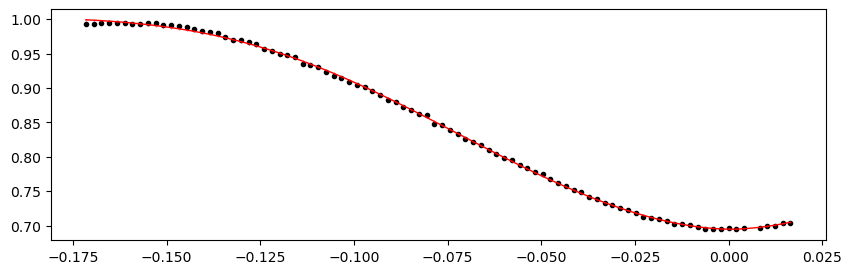

Time 2309.33786 does not have enough data points: 20
2310.01012 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 341.46it/s]


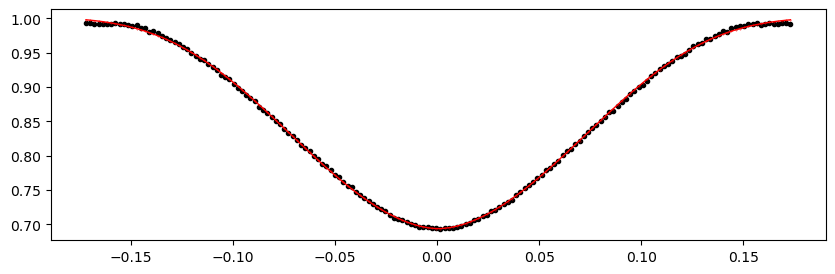

2310.68238 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 341.45it/s]


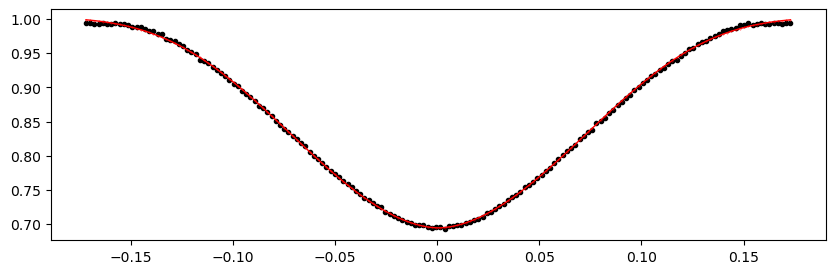

2311.35464 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 341.97it/s]


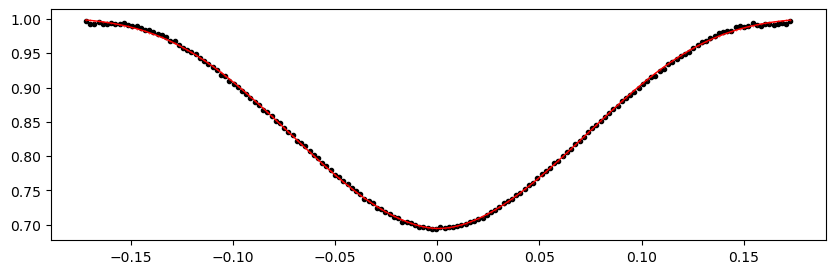

2312.0269 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 339.63it/s]


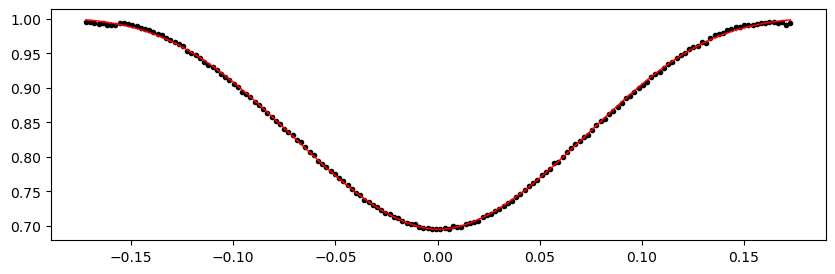

2312.69916 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 343.26it/s]


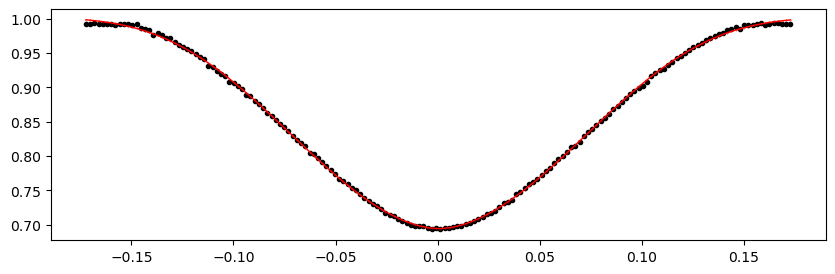

2313.37142 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 343.19it/s]


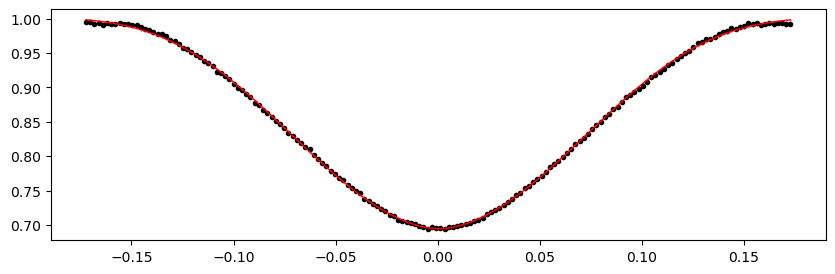

2314.0436799999998 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 341.79it/s]


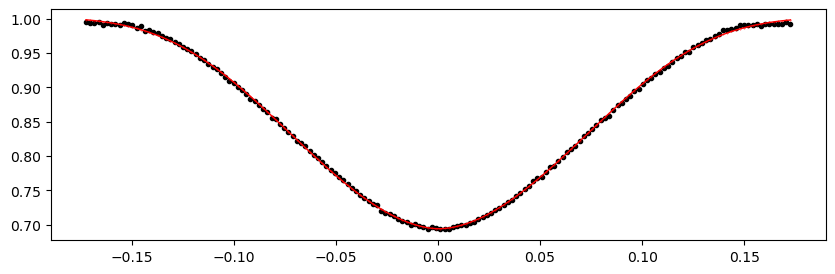

2314.71594 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 338.17it/s]


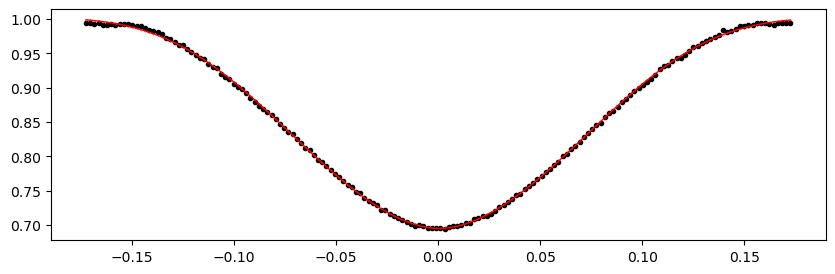

2315.3882 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 313.98it/s]


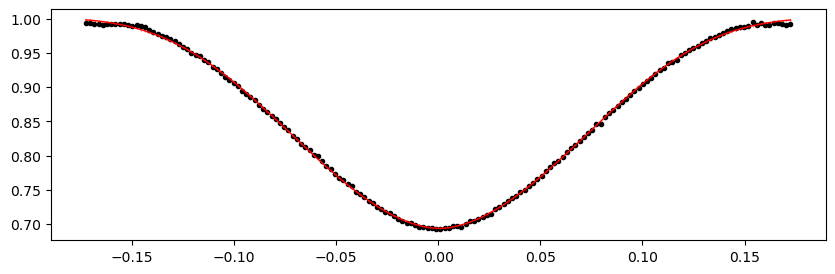

2316.06046 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 346.75it/s]


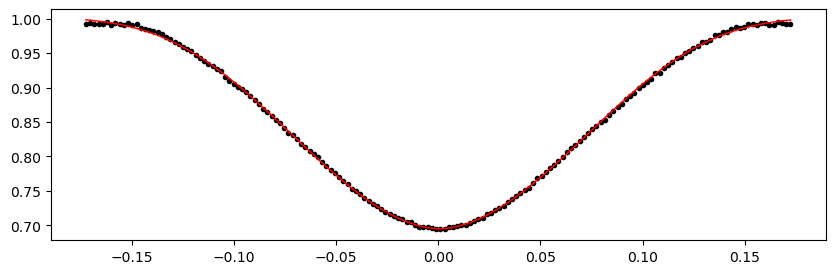

2316.73272 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:33<00:00, 297.02it/s]


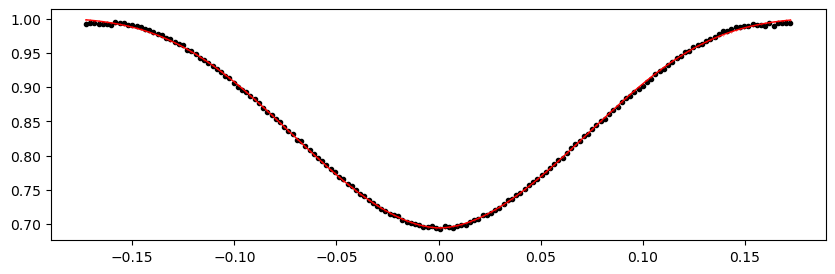

2317.4049800000003 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 335.29it/s]


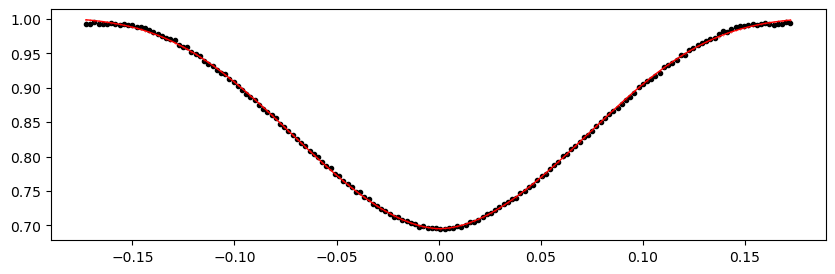

2318.07724 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 333.33it/s]


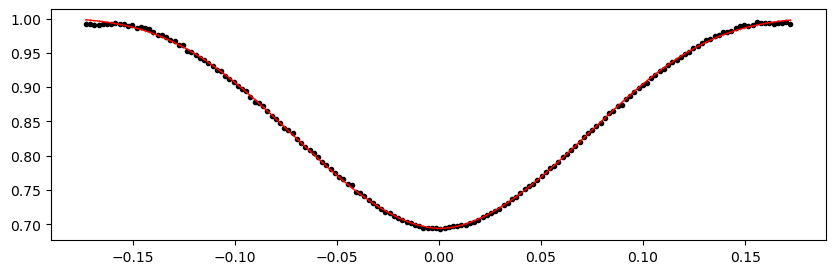

2318.7495 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 335.57it/s]


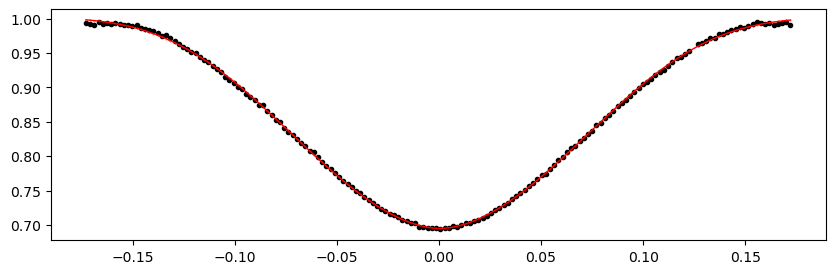

2323.45532 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 337.55it/s]


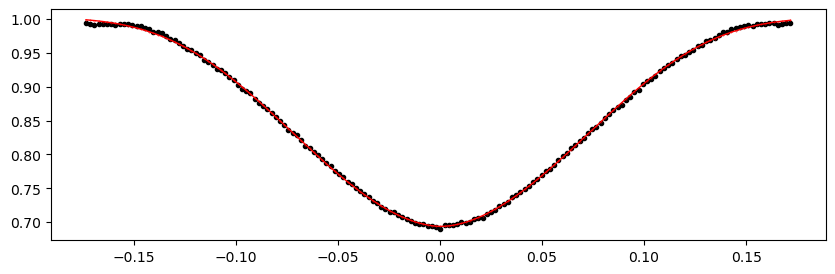

2324.12758 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 334.73it/s]


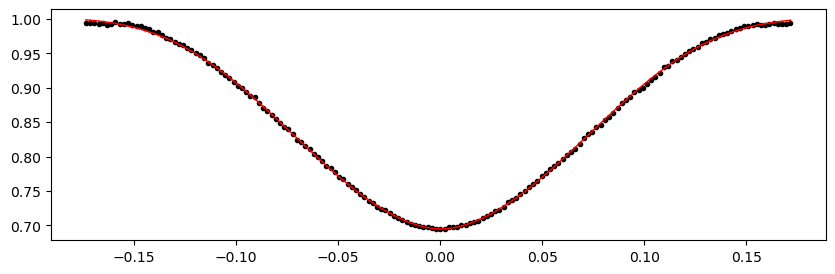

2324.79984 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 338.52it/s]


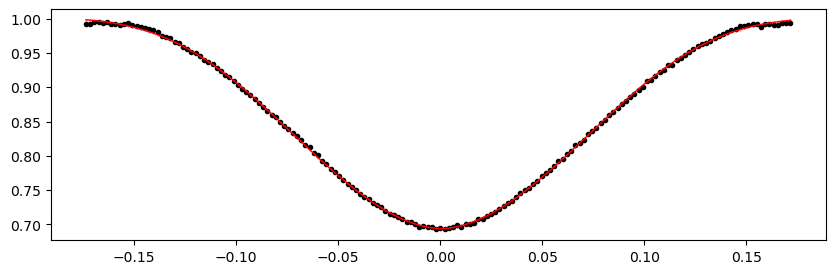

2325.4721 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 333.19it/s]


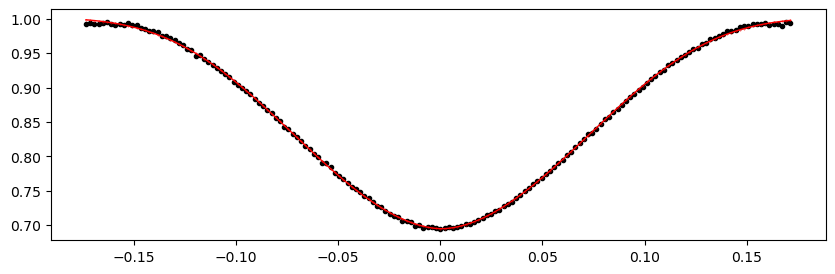

2326.1443600000002 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 337.31it/s]


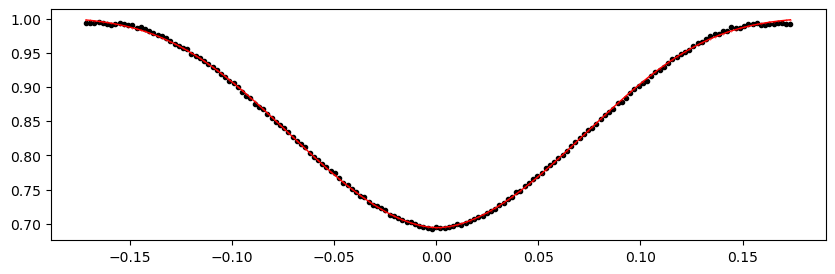

2326.81662 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 318.25it/s]


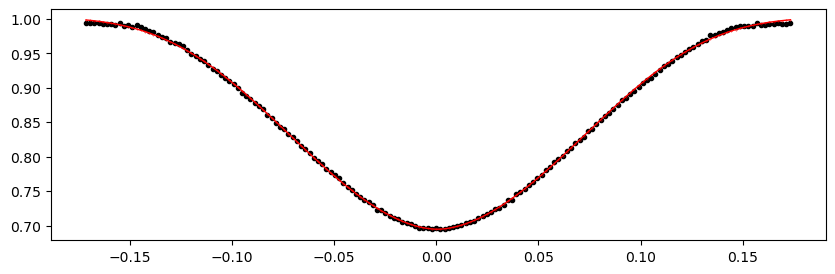

2327.48888 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 328.87it/s]


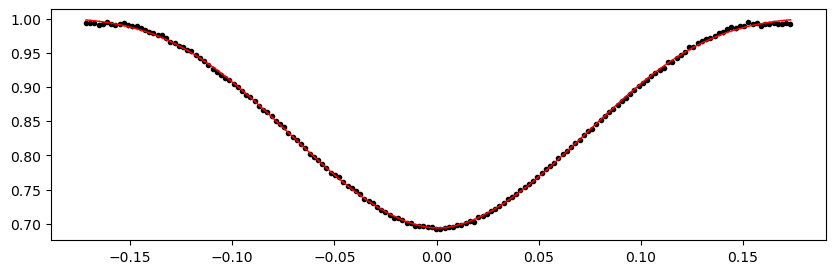

2328.16114 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 331.63it/s]


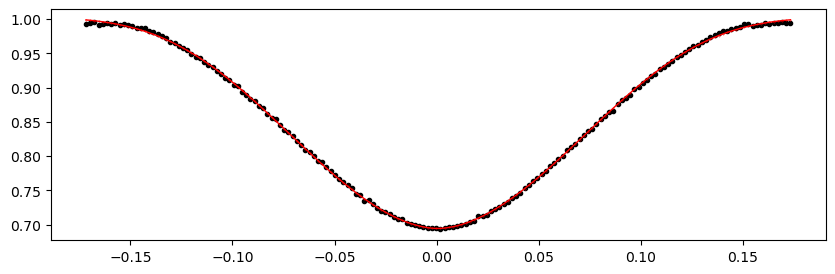

2328.8334 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 329.19it/s]


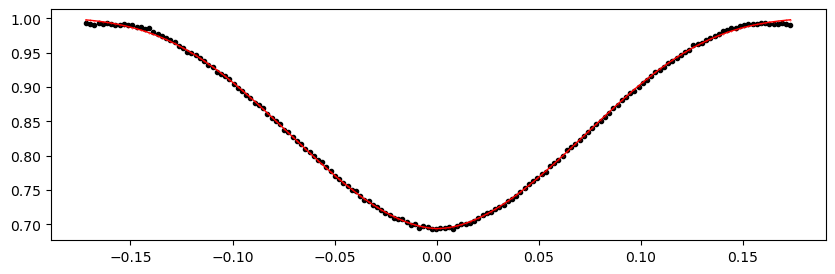

2329.50566 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 326.17it/s]


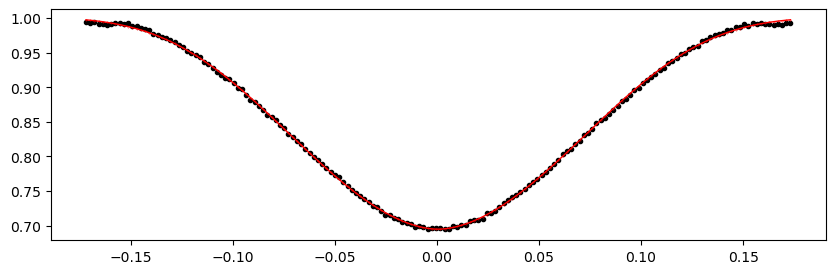

2330.17792 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 325.84it/s]


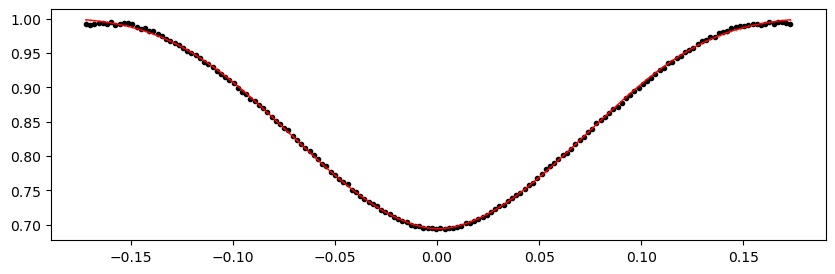

2330.85018 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:33<00:00, 298.73it/s]


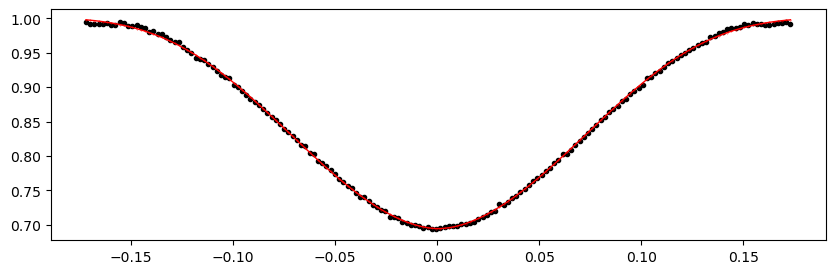

2331.52244 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 330.36it/s]


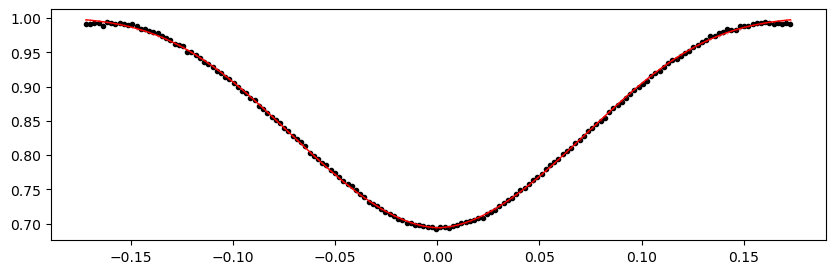

2332.1947 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 330.97it/s]


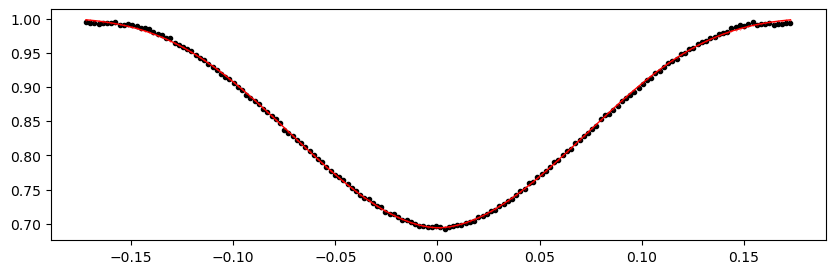

2337.57278 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 331.29it/s]


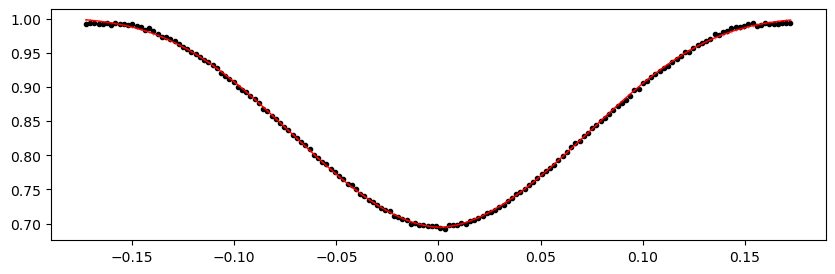

2338.24504 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 333.39it/s]


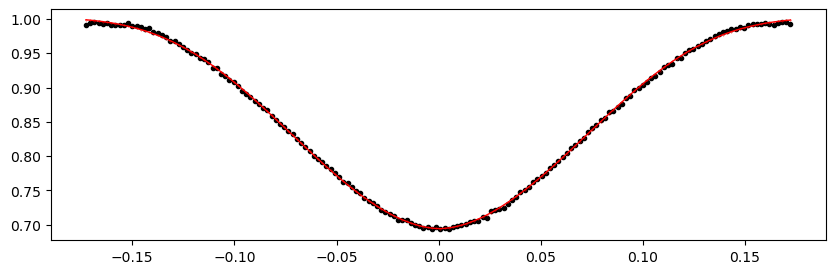

2338.9173 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 332.20it/s]


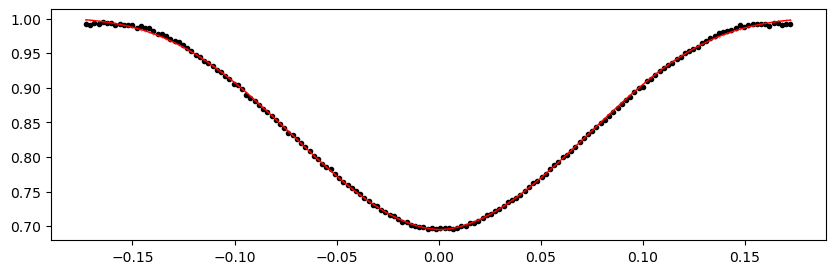

2339.58956 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 329.49it/s]


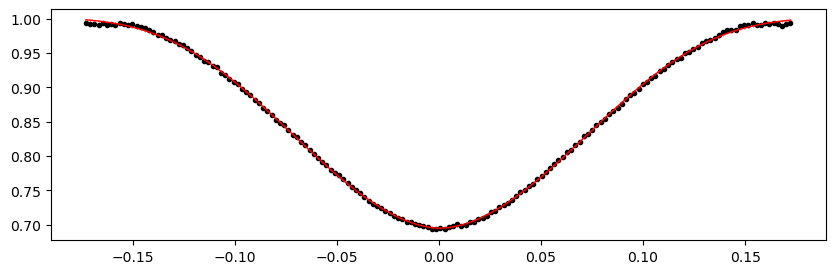

2340.26182 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 329.92it/s]


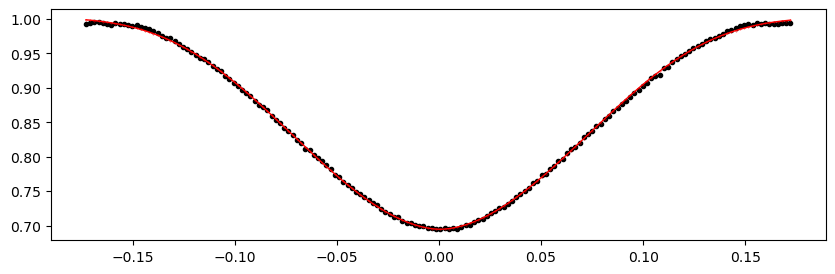

2340.93408 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 330.88it/s]


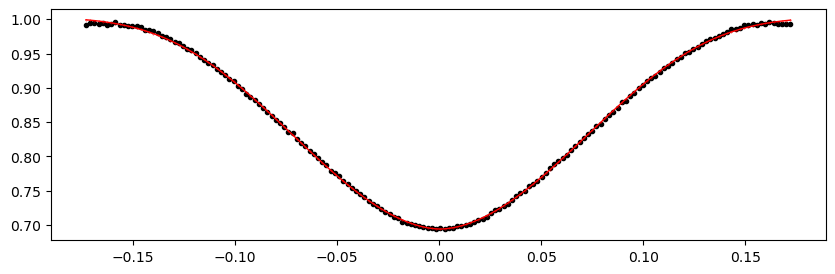

2341.60634 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 334.55it/s]


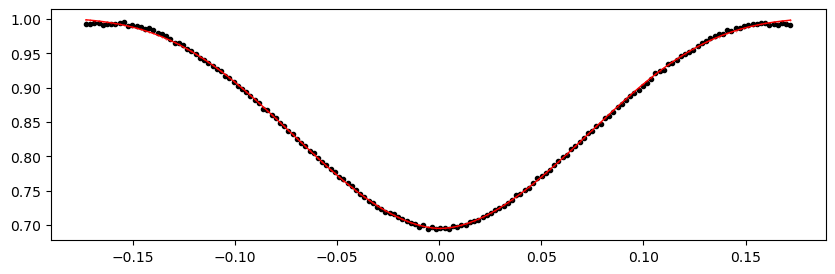

2342.2786 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 334.42it/s]


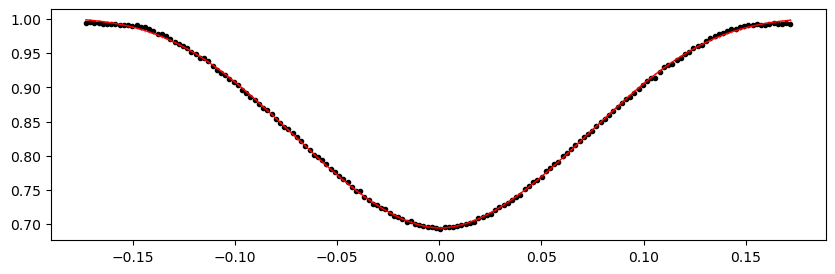

2342.95086 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 336.18it/s]


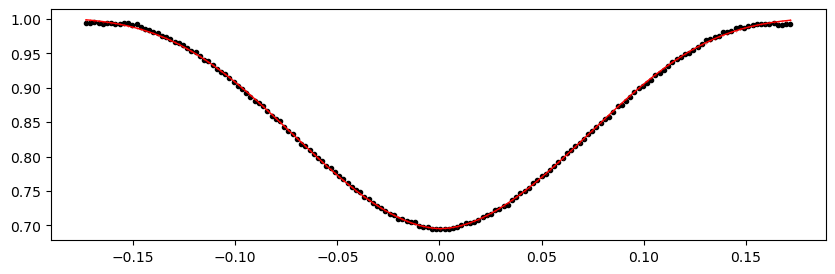

2343.62312 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 340.28it/s]


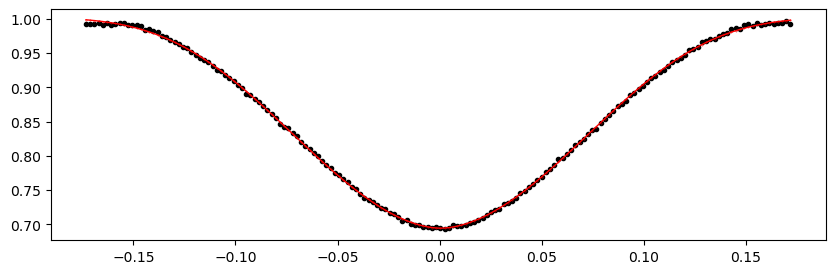

2344.29538 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 340.13it/s]


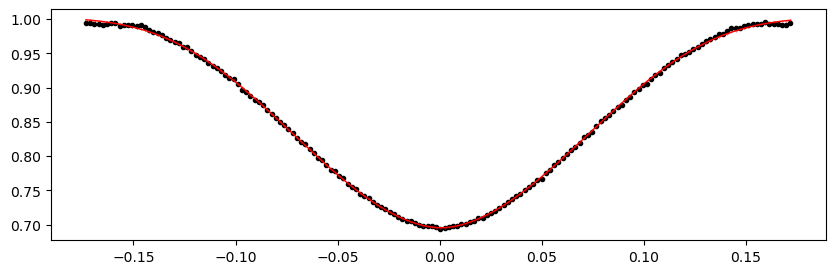

2344.96764 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 338.32it/s]


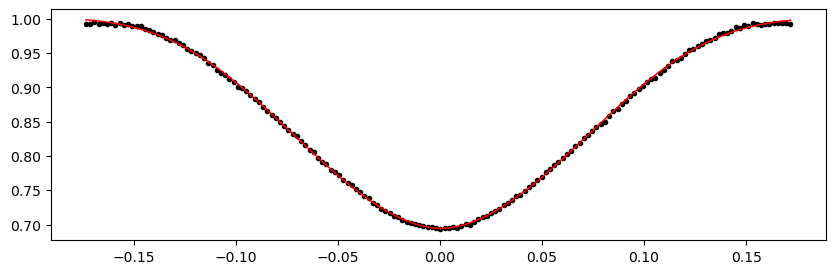

2345.6399 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 332.12it/s]


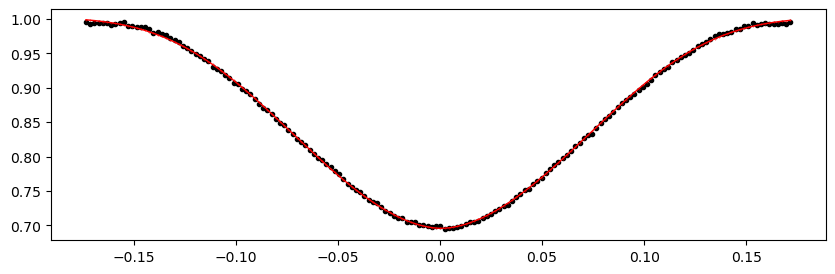

2346.31216 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.27it/s]


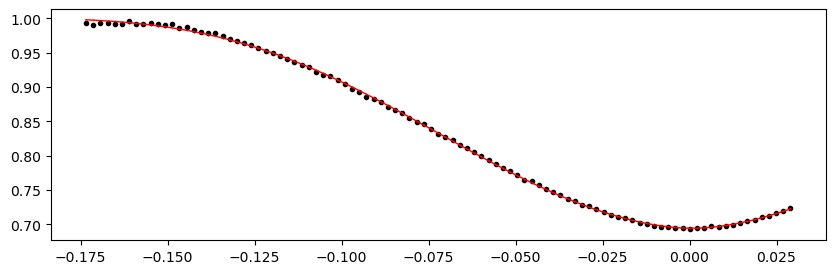

2347.65668 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 335.03it/s]


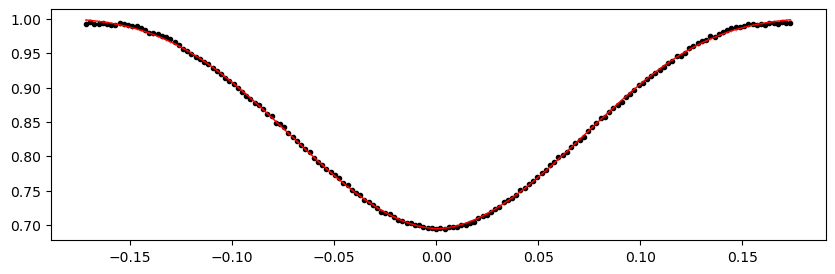

2348.32894 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 330.29it/s]


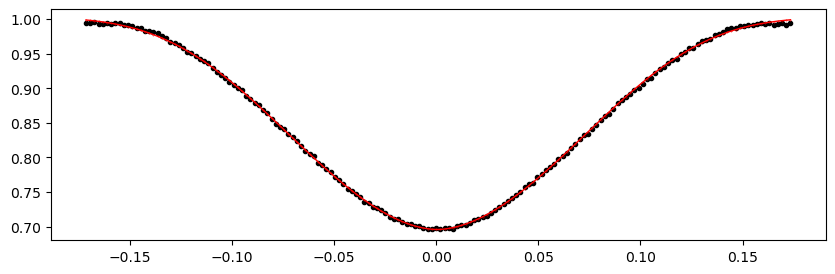

2351.01798 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.90it/s]


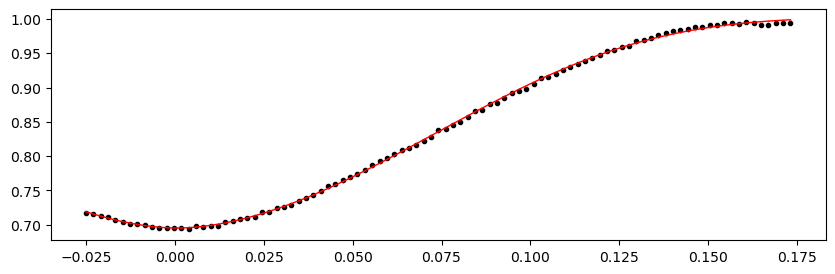

2351.69024 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 337.02it/s]


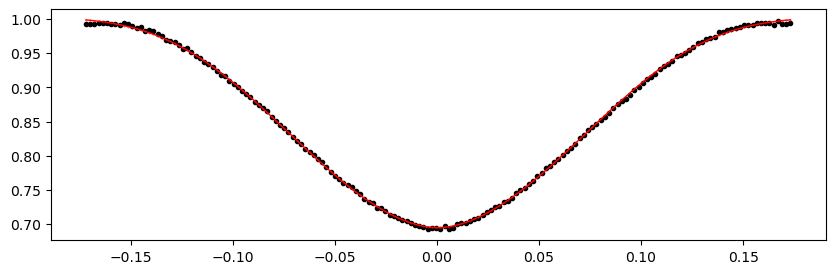

2352.3625 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 332.08it/s]


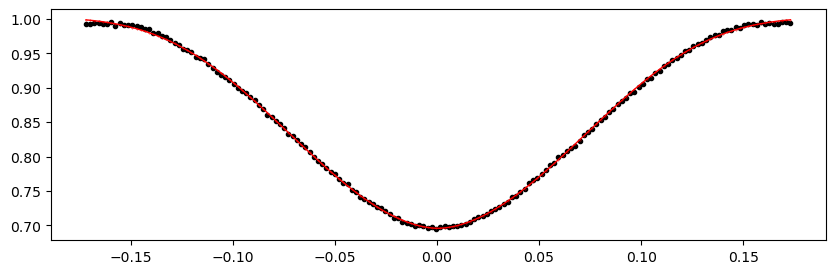

2353.03476 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 332.08it/s]


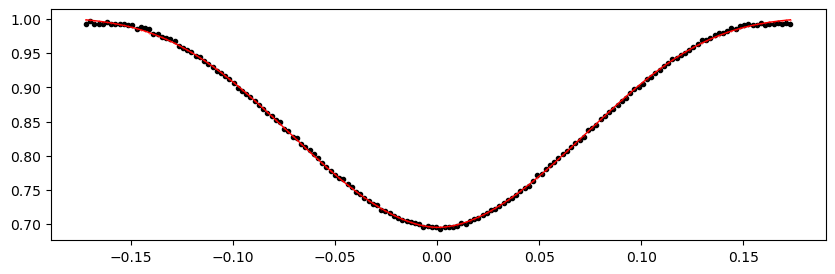

2353.70702 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 336.10it/s]


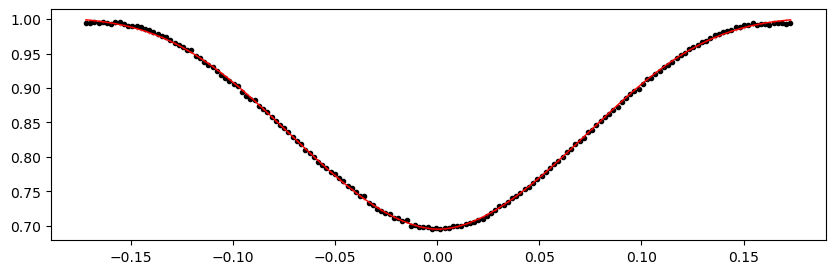

2354.37928 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 338.99it/s]


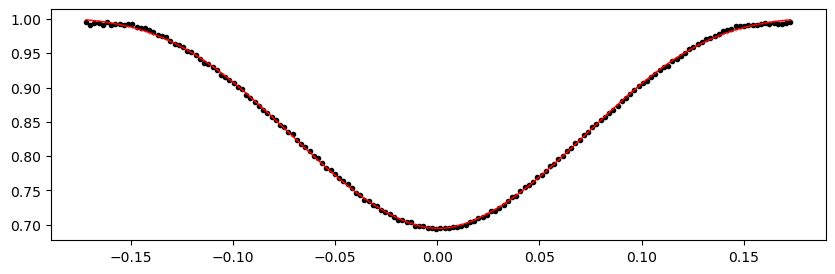

2355.05154 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 339.15it/s]


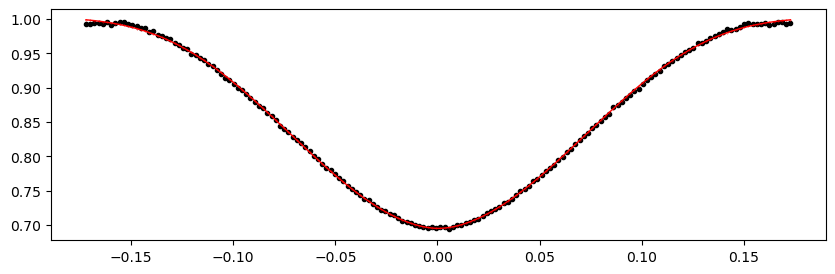

2355.7237999999998 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 328.72it/s]


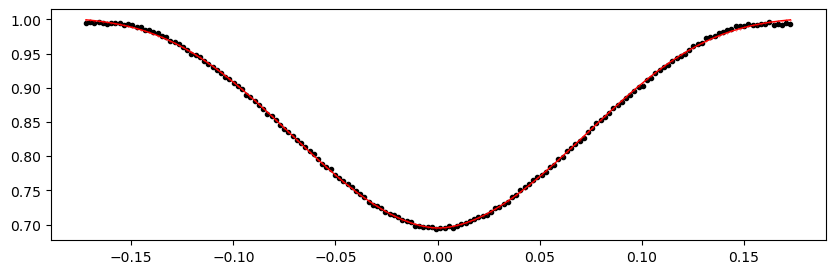

2356.39606 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 320.35it/s]


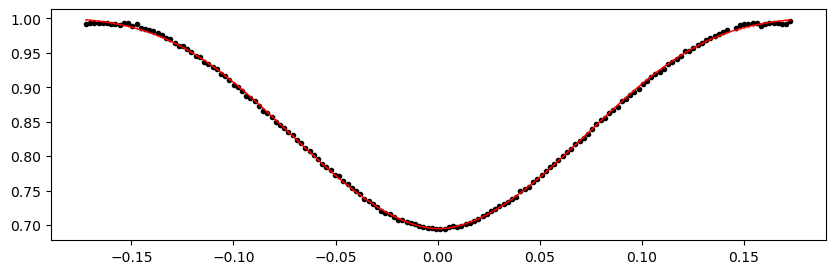

2357.06832 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 331.80it/s]


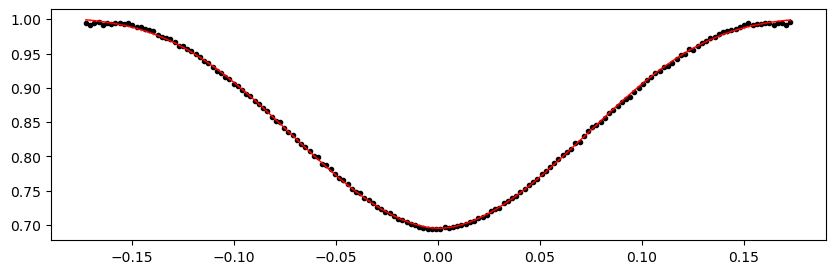

2357.74058 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 334.89it/s]


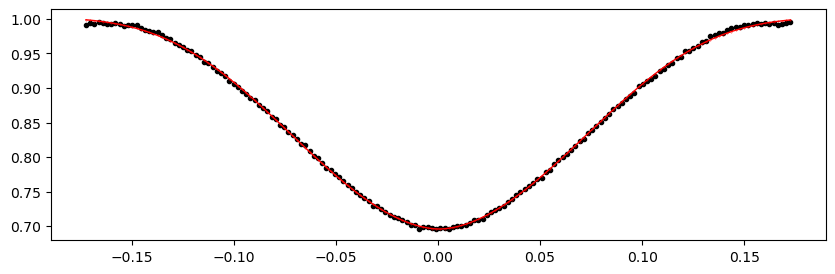

2358.41284 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 331.10it/s]


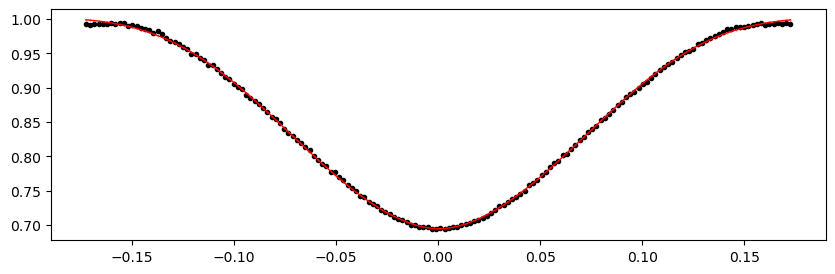

2359.0851000000002 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 324.20it/s]


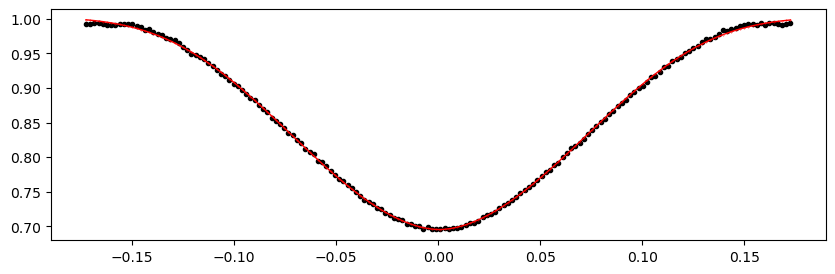

2359.75736 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 331.47it/s]


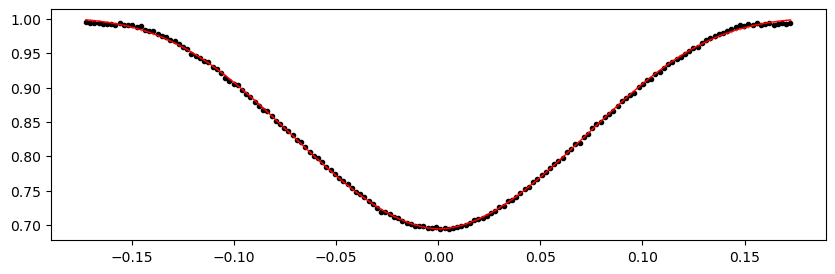

2360.42962 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 330.21it/s]


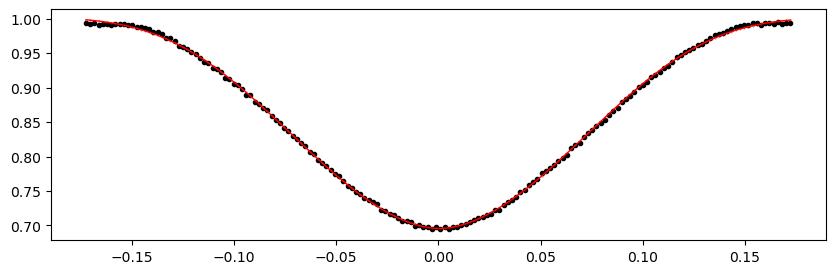

2361.77414 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.30it/s]


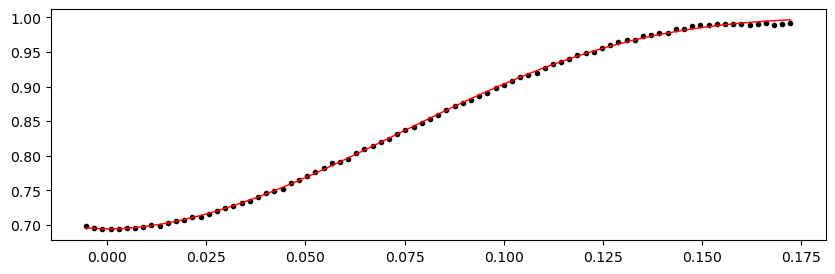

2362.4464 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 332.40it/s]


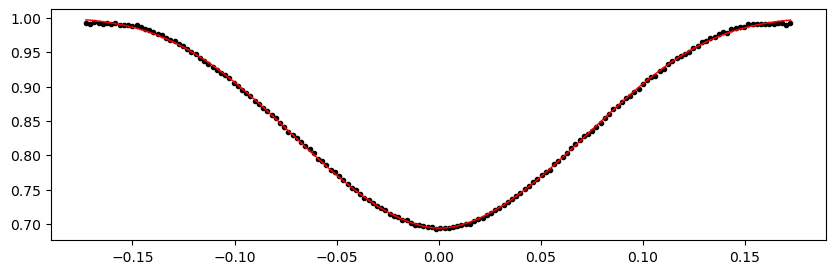

2363.11866 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 329.90it/s]


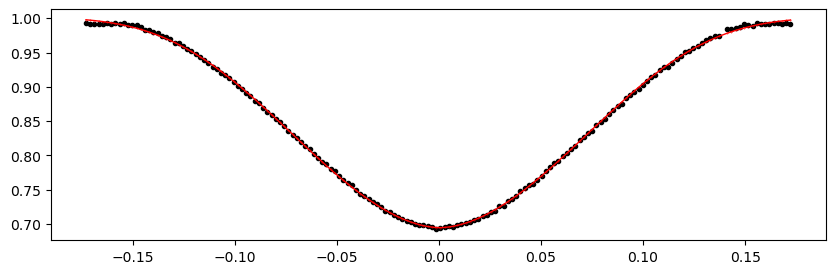

2363.79092 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 321.60it/s]


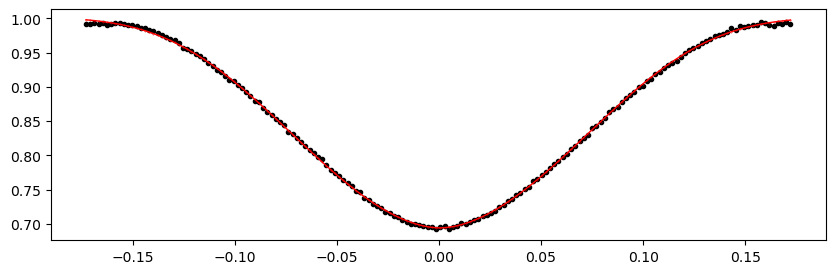

2364.46318 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 323.97it/s]


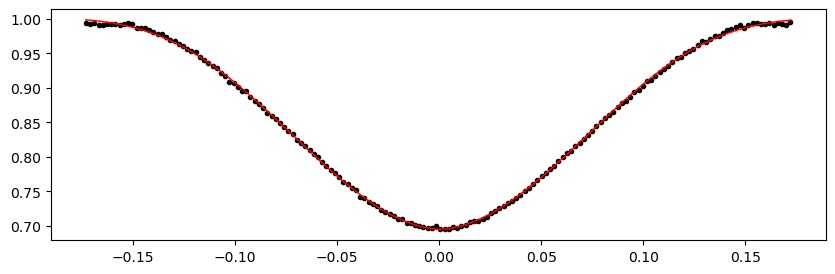

2365.13544 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:33<00:00, 300.44it/s]


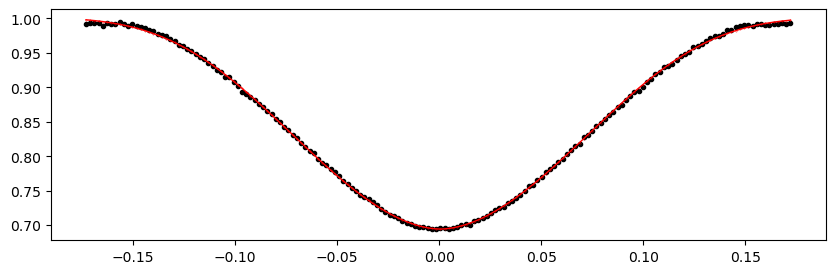

2365.8077 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 327.98it/s]


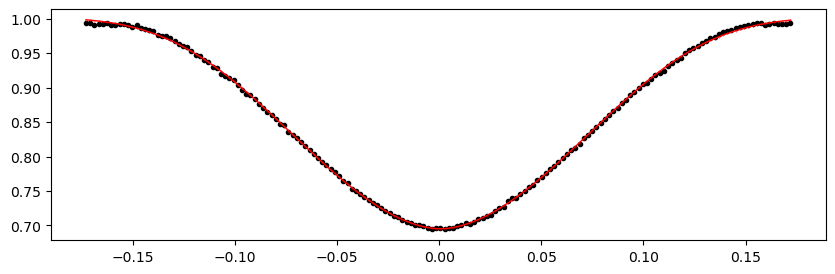

2366.47996 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 331.74it/s]


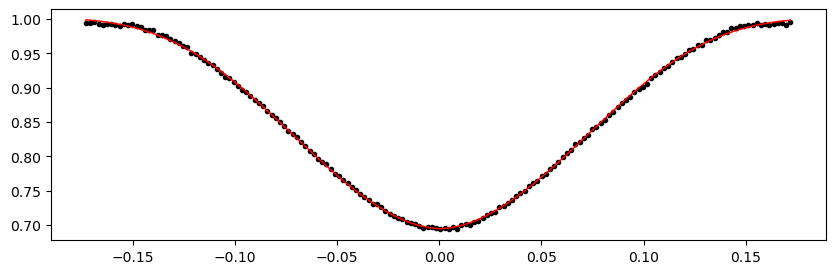

2367.15222 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 328.72it/s]


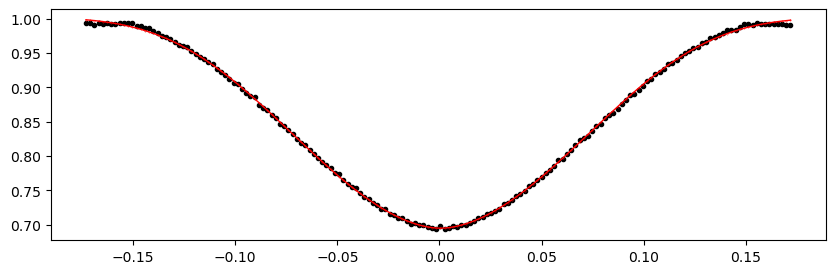

2367.82448 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 322.64it/s]


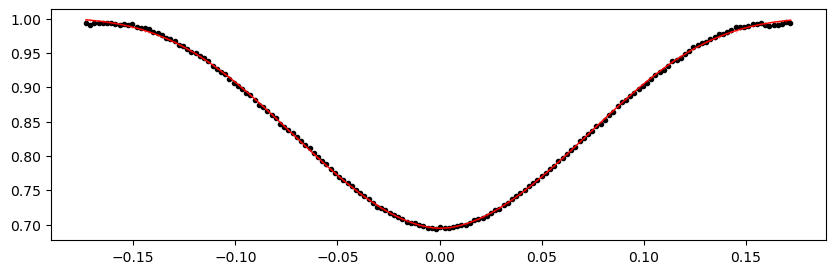

2368.49674 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 335.22it/s]


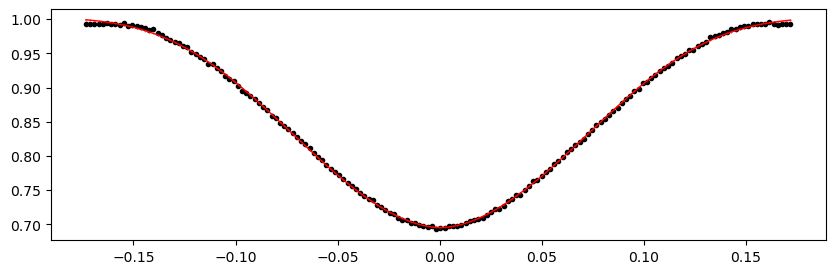

2369.169 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 328.44it/s]


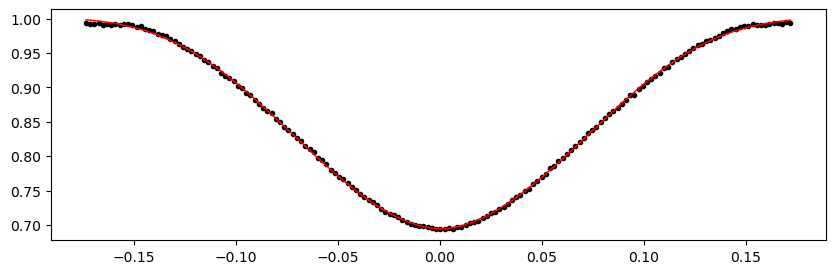

2369.84126 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 332.66it/s]


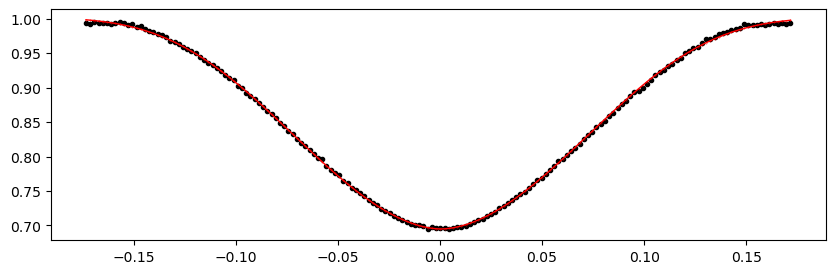

2370.51352 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 327.84it/s]


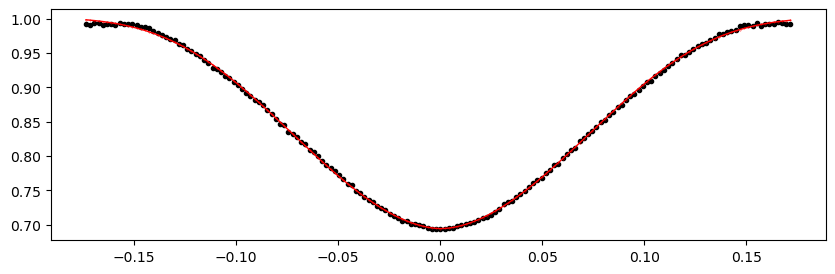

2371.18578 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 330.38it/s]


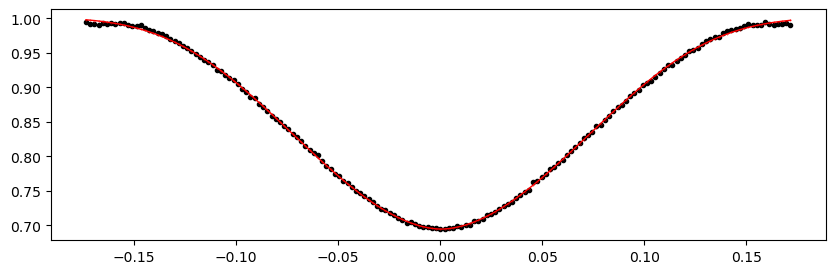

2371.85804 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 331.64it/s]


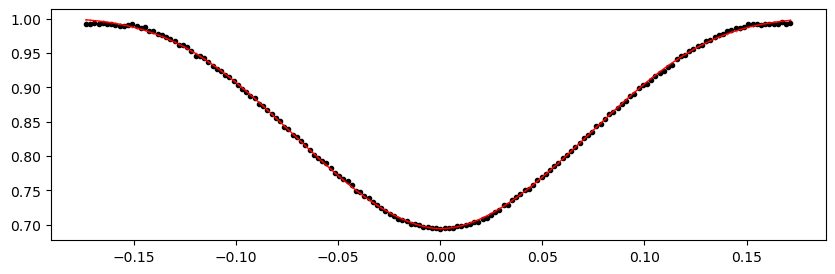

2372.5303 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 323.64it/s]


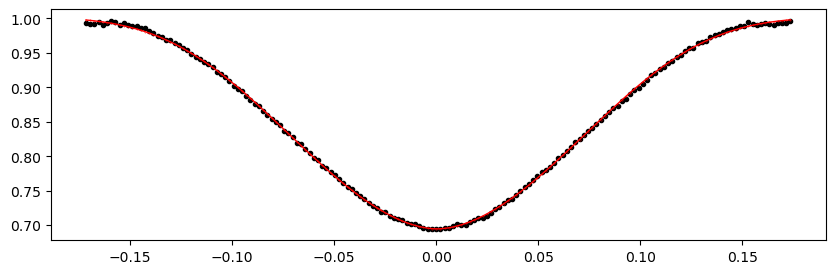

2373.20256 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 316.15it/s]


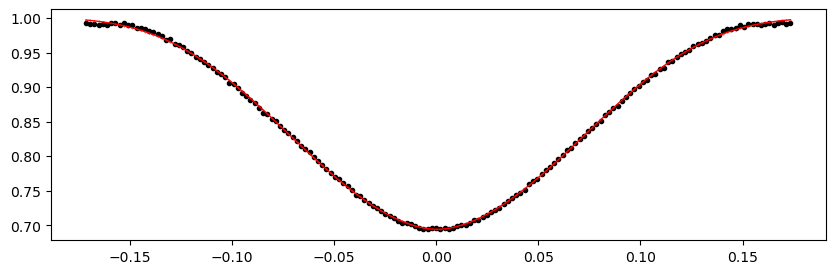

2373.87482 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 328.23it/s]


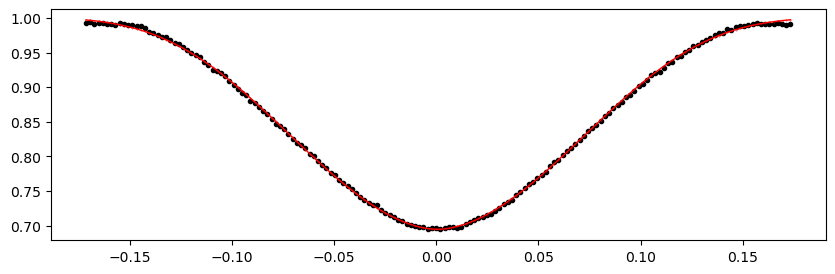

2374.54708 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 326.43it/s]


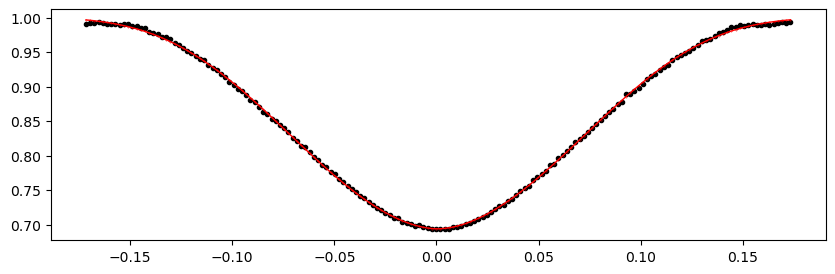

2375.8916 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 339.99it/s]


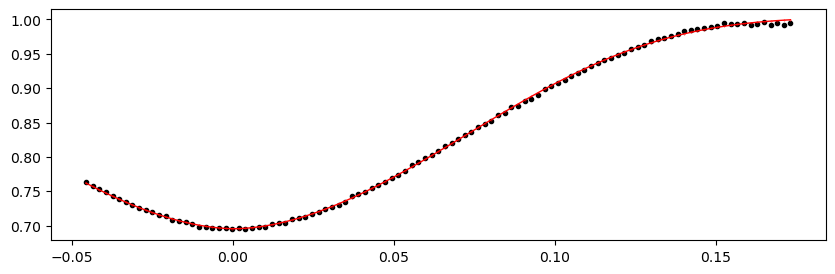

2376.56386 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 326.40it/s]


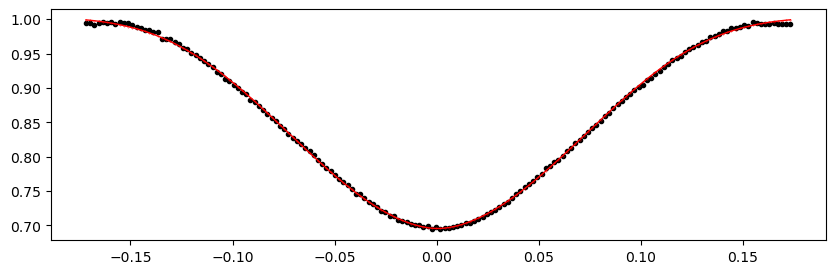

2377.23612 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 328.44it/s]


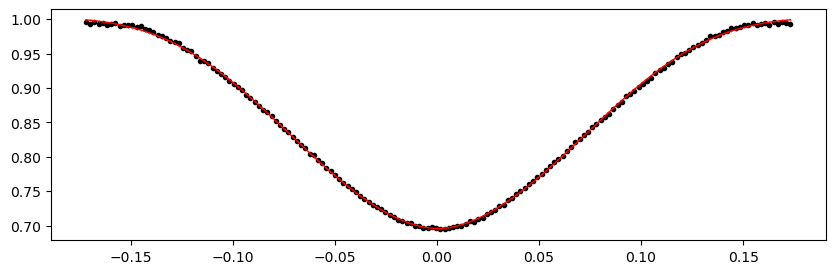

2377.90838 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 330.38it/s]


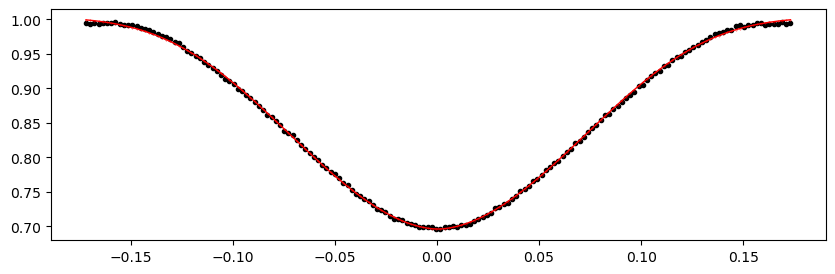

2378.58064 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 326.87it/s]


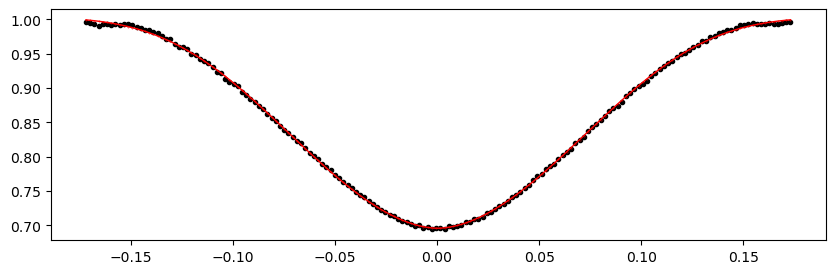

2379.2529 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 329.19it/s]


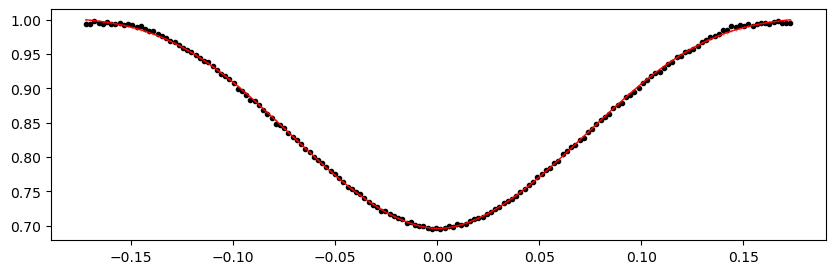

2379.92516 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 336.77it/s]


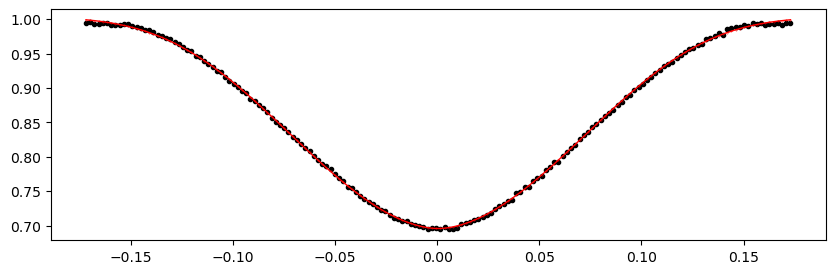

2380.59742 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 331.06it/s]


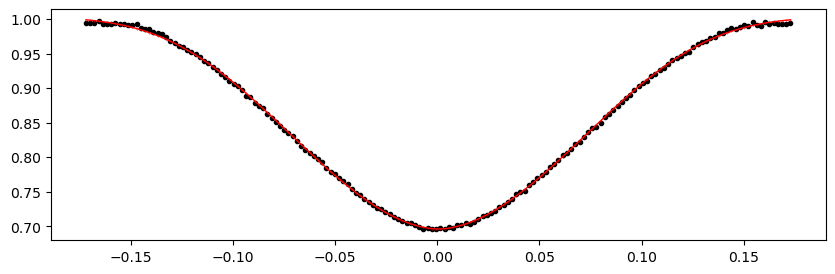

2381.26968 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 325.20it/s]


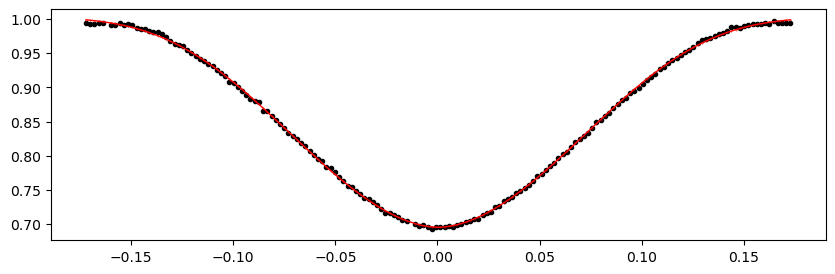

2381.94194 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 331.56it/s]


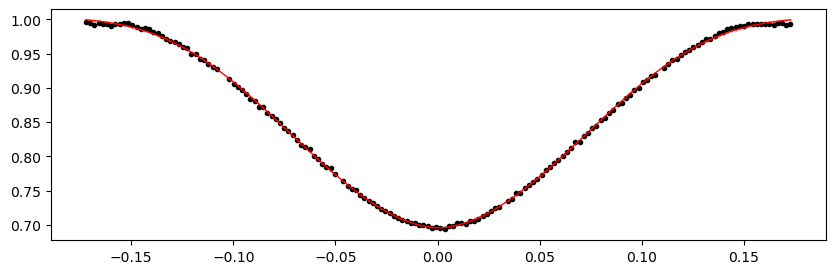

2382.6142 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 329.93it/s]


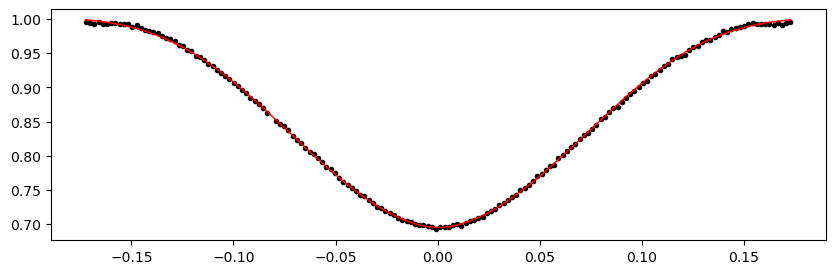

2383.28646 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 334.85it/s]


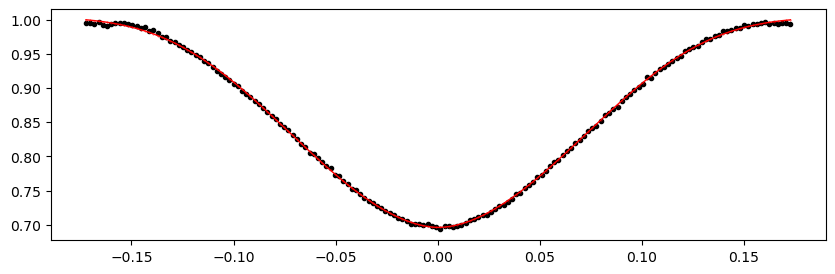

2383.95872 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 322.50it/s]


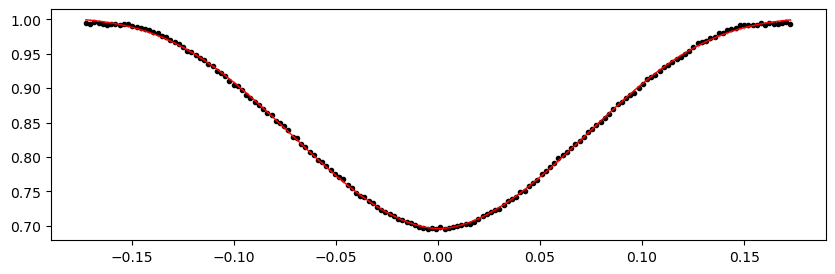

2384.63098 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:35<00:00, 277.85it/s]


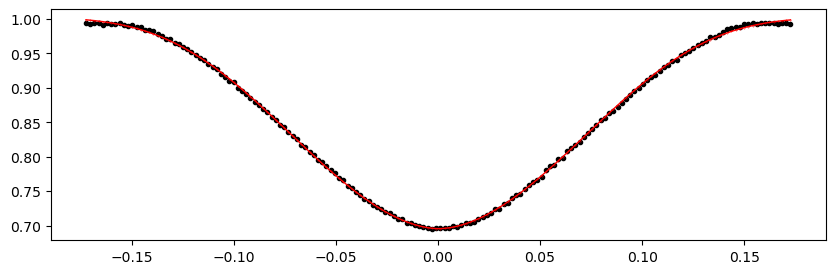

2385.30324 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:39<00:00, 250.56it/s]


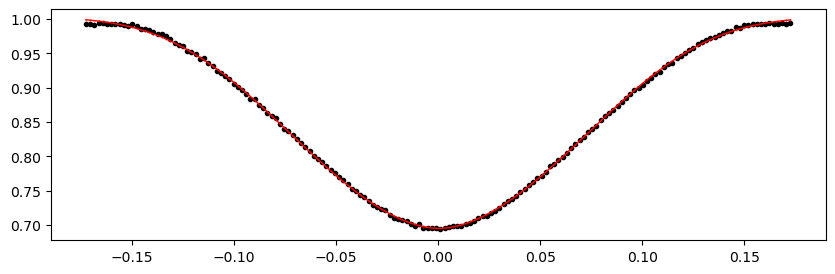

2385.9755 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:36<00:00, 271.98it/s]


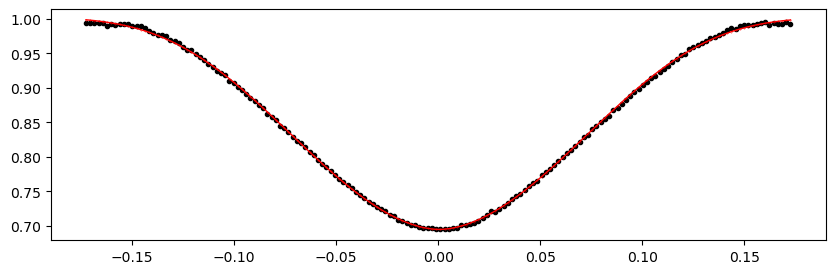

2386.64776 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:38<00:00, 259.03it/s]


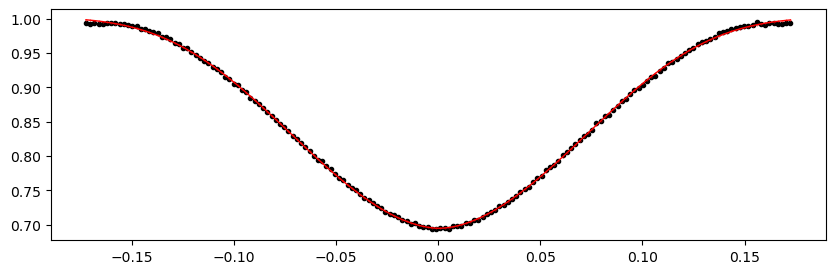

2387.32002 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:39<00:00, 254.93it/s]


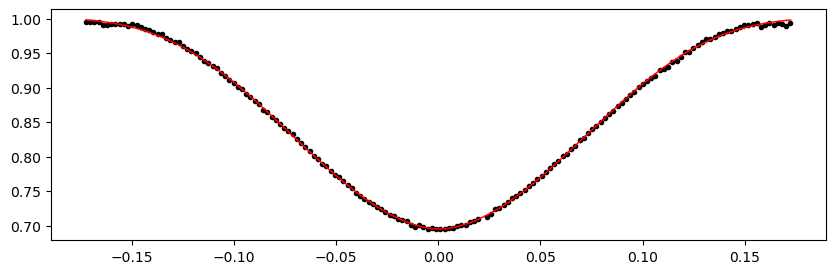

2387.99228 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:37<00:00, 265.07it/s]


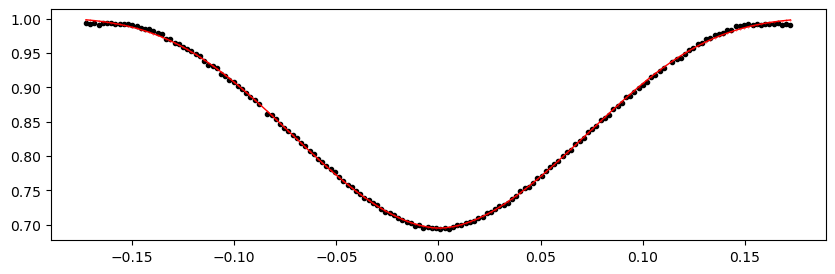

2388.6645399999998 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:37<00:00, 264.33it/s]


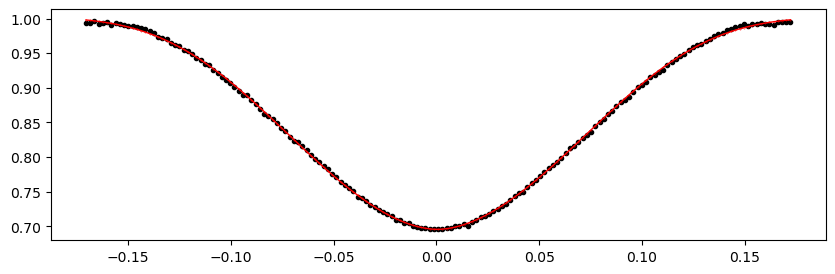

2389.3368 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:36<00:00, 271.17it/s]


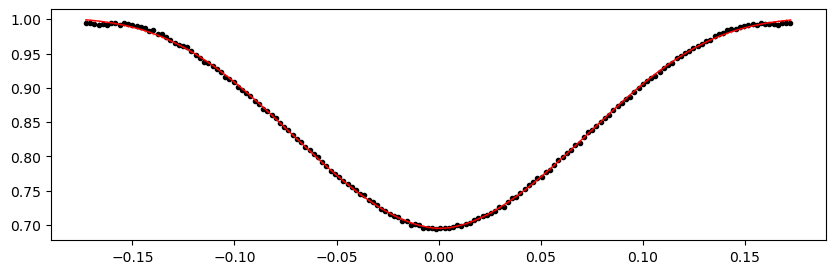

2964.1191 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 372.10it/s]


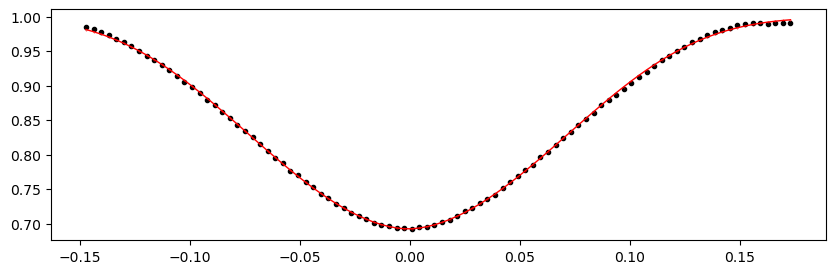

2964.79136 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 371.33it/s]


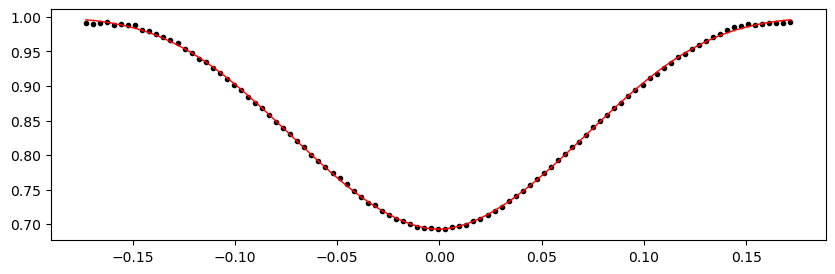

2965.46362 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 375.06it/s]


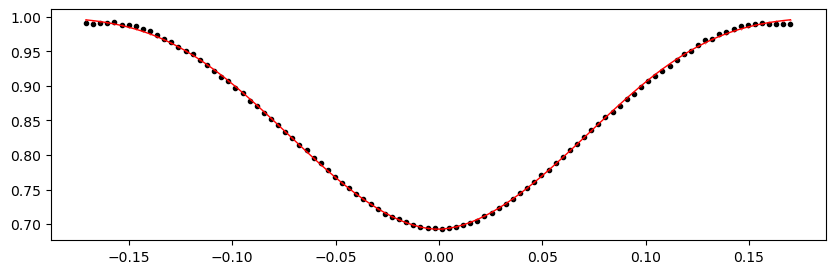

2966.13588 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 372.89it/s]


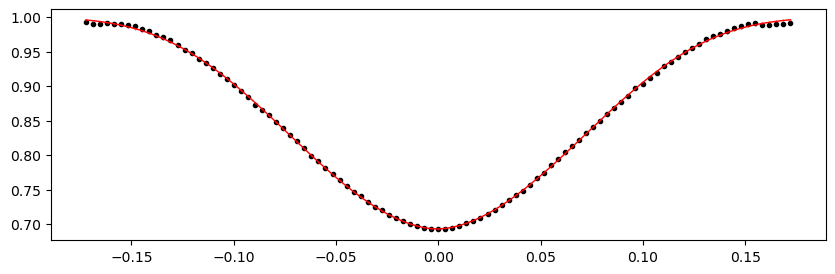

2966.80814 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 376.18it/s]


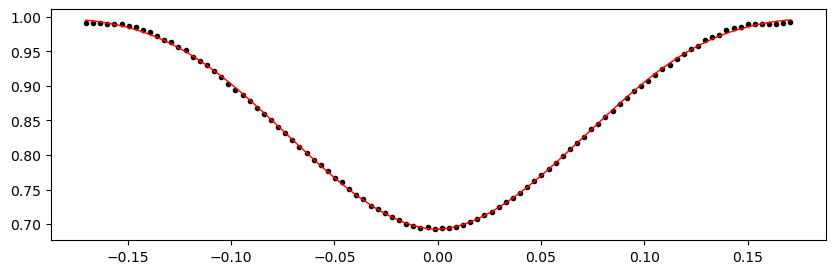

2967.4804 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 370.96it/s]


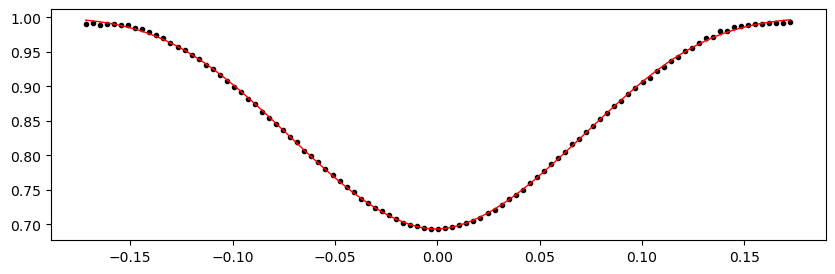

2968.1526599999997 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 372.69it/s]


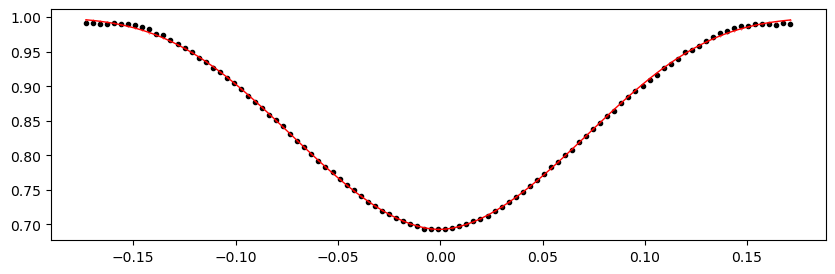

2968.82492 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 372.90it/s]


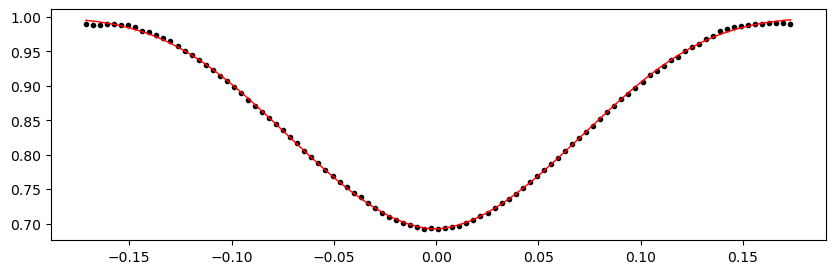

2969.49718 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 415.68it/s]


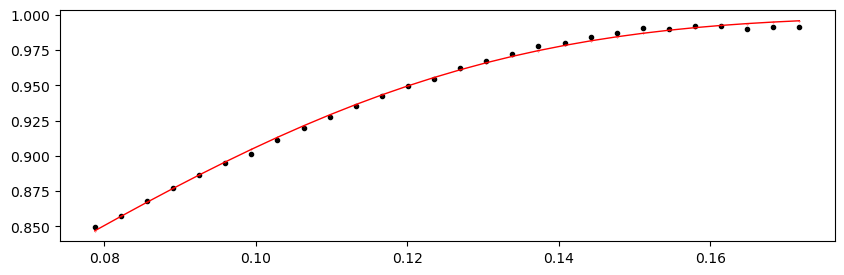

2970.16944 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.06it/s]


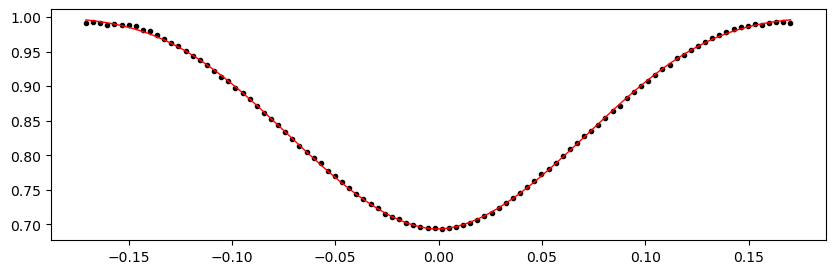

2970.8417 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 373.65it/s]


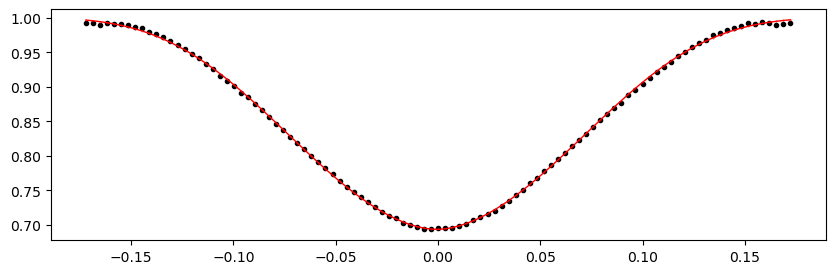

2971.51396 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 375.58it/s]


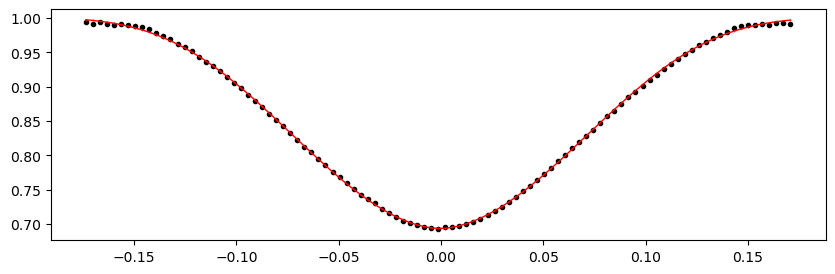

2972.18622 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 365.75it/s]


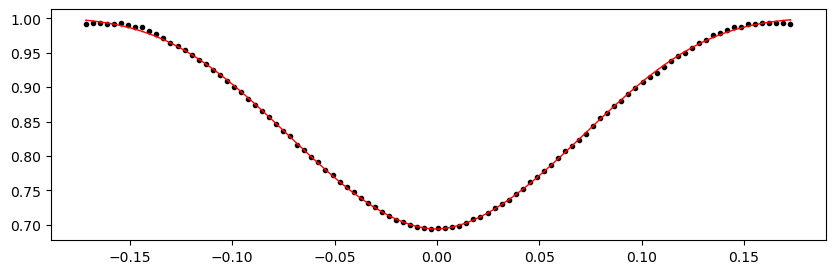

2972.85848 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 369.72it/s]


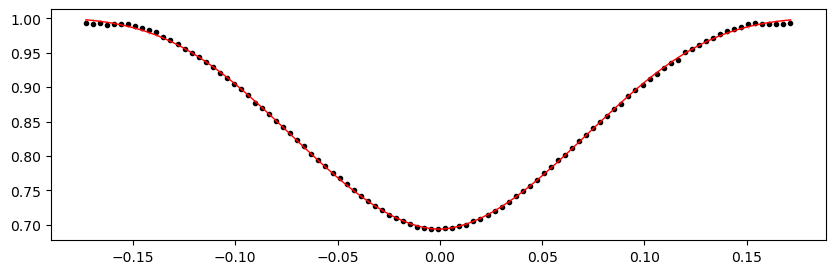

2973.53074 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 373.20it/s]


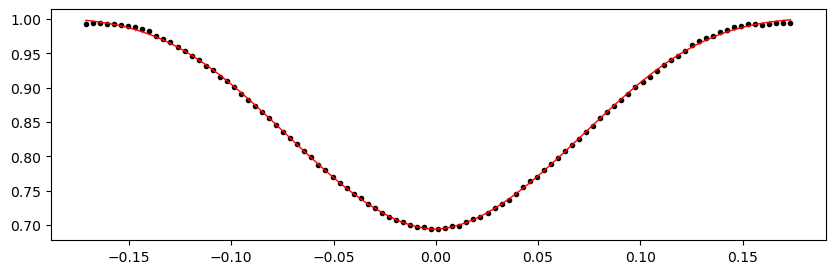

2974.203 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.11it/s]


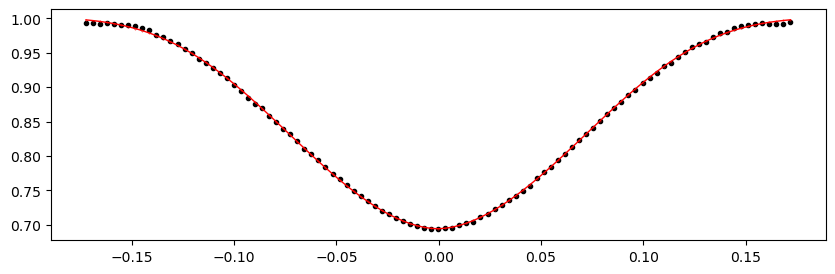

2974.87526 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 384.84it/s]


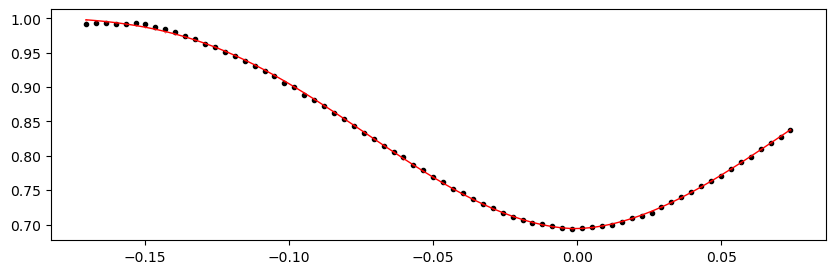

2976.8920399999997 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 405.62it/s]


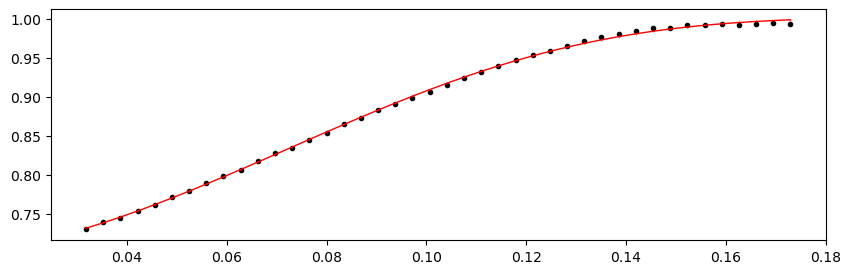

2977.5643 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 368.28it/s]


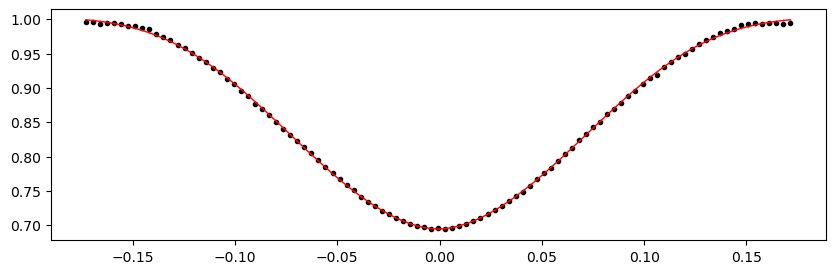

2978.23656 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 360.36it/s]


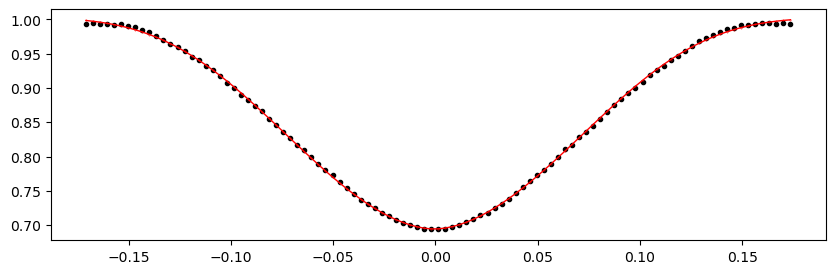

2978.90882 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 368.83it/s]


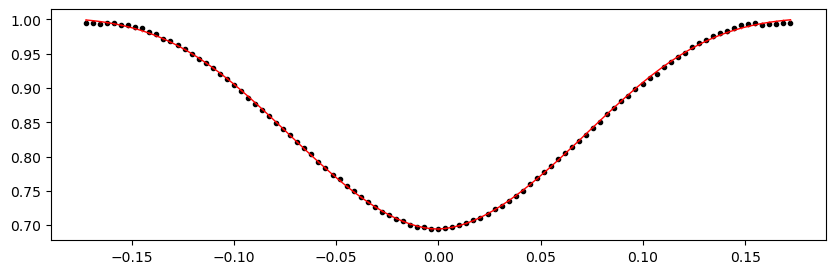

2979.58108 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 373.12it/s]


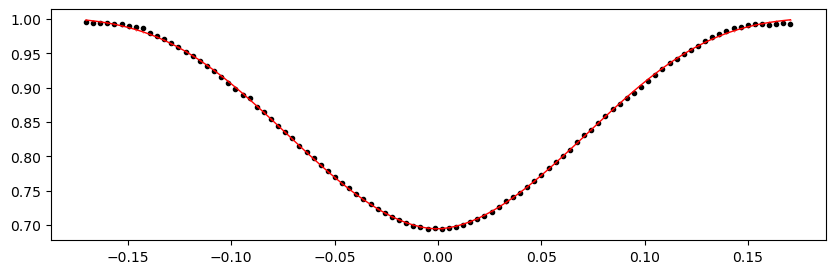

2980.25334 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 367.51it/s]


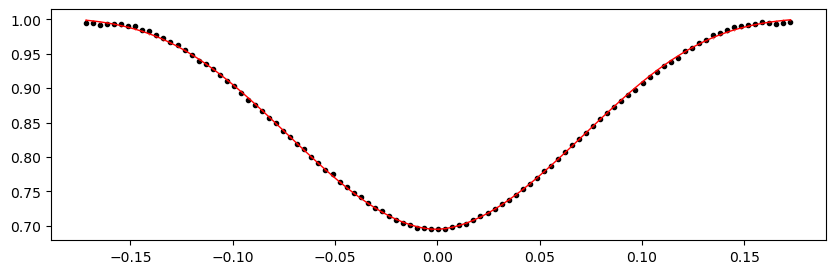

2980.9256 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 365.56it/s]


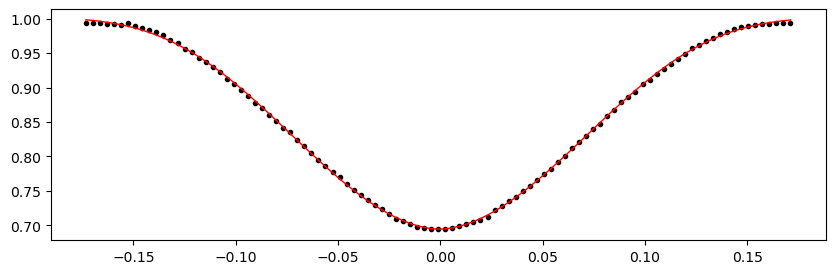

2981.59786 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.81it/s]


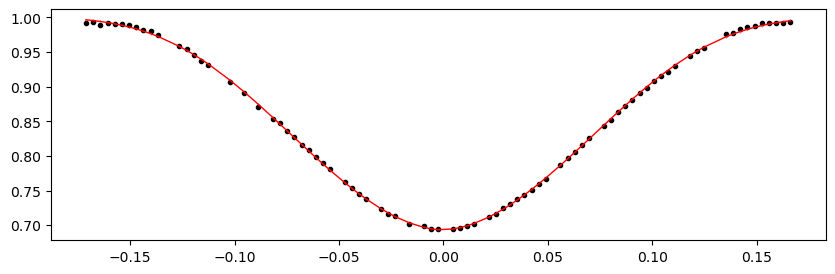

Time 2982.27012 does not have enough data points: 16
2982.94238 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 369.90it/s]


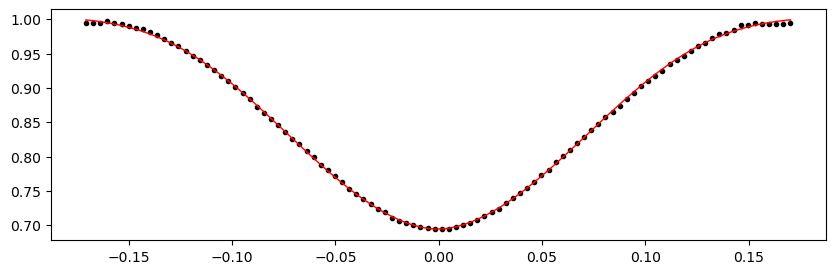

2983.61464 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 367.51it/s]


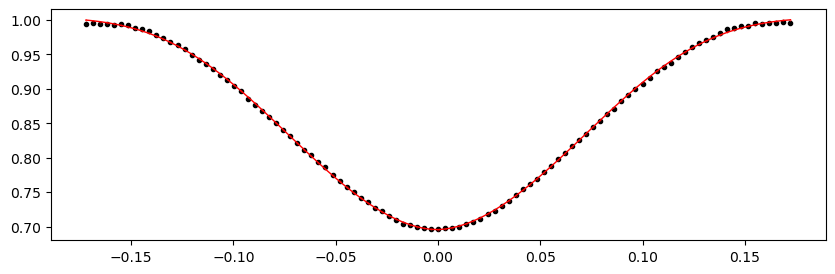

2984.2869 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 367.36it/s]


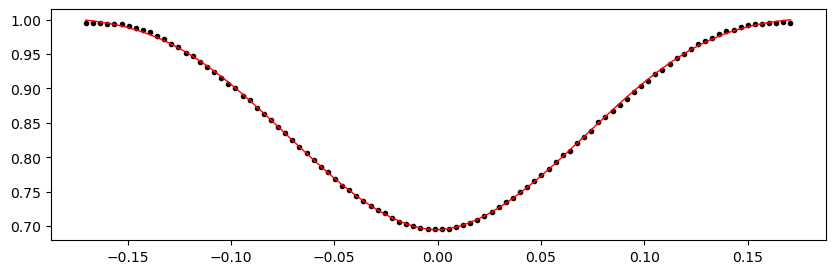

2984.95916 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 367.61it/s]


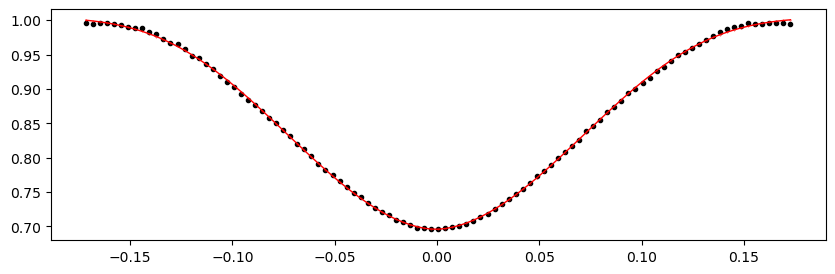

2985.6314199999997 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 367.17it/s]


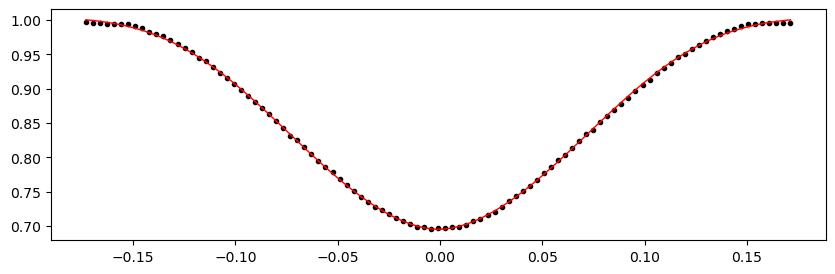

2986.30368 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 375.29it/s]


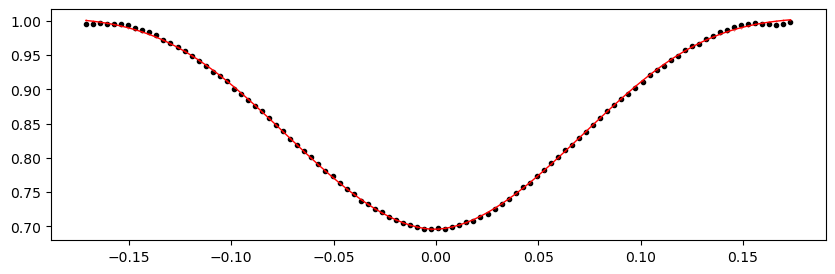

2986.97594 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 371.42it/s]


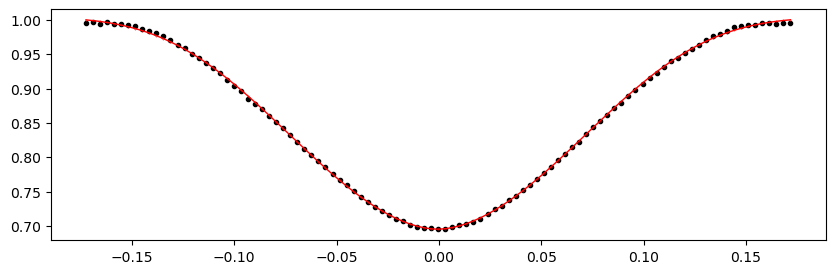

2987.6482 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 371.70it/s]


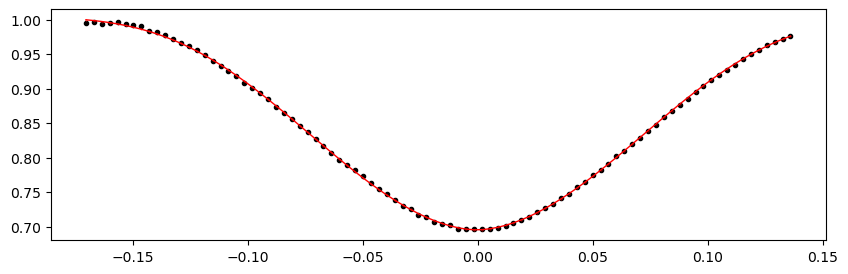

2989.66498 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 416.43it/s]


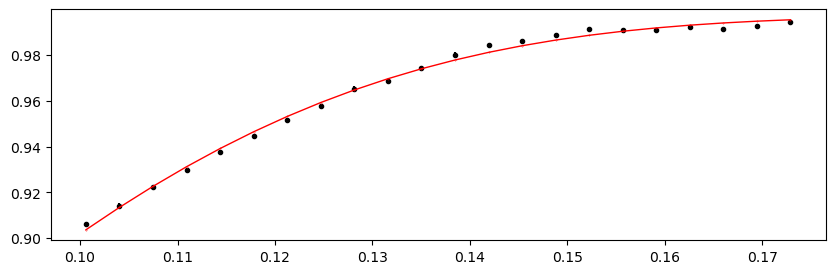

2990.33724 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 372.89it/s]


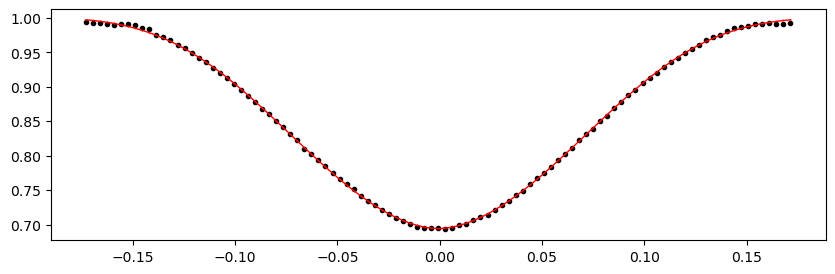

2991.0095 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.91it/s]


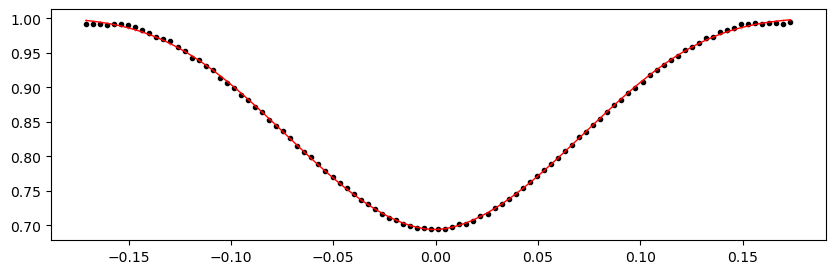

2991.68176 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 351.29it/s]


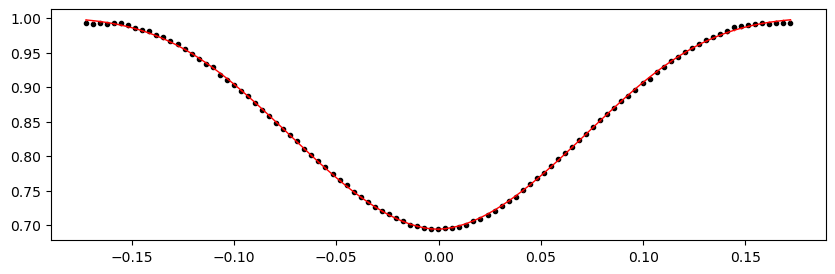

2992.3540199999998 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 364.43it/s]


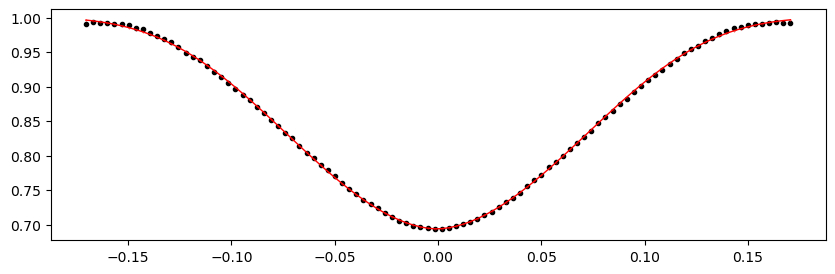

2993.02628 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 334.23it/s]


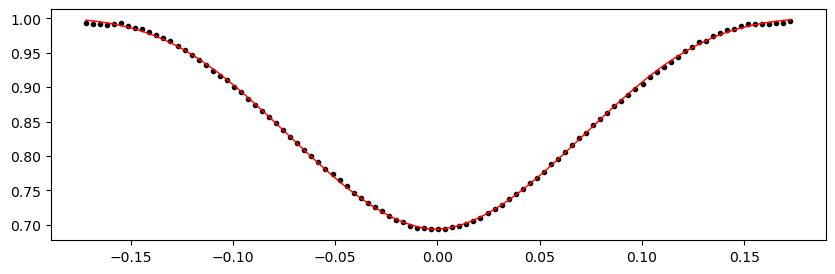

2993.69854 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:32<00:00, 310.73it/s]


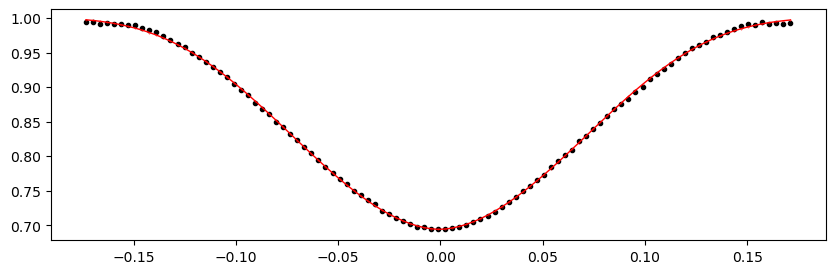

2994.3707999999997 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:32<00:00, 308.30it/s]


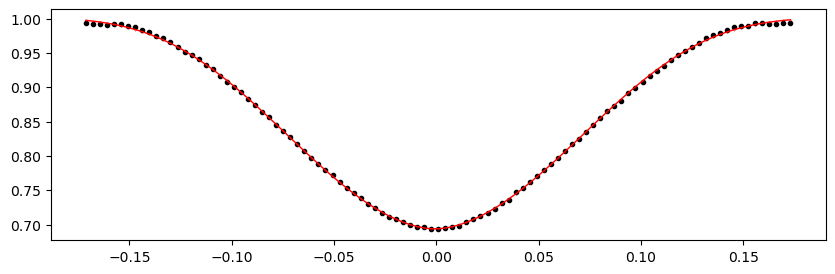

2995.04306 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 339.79it/s]


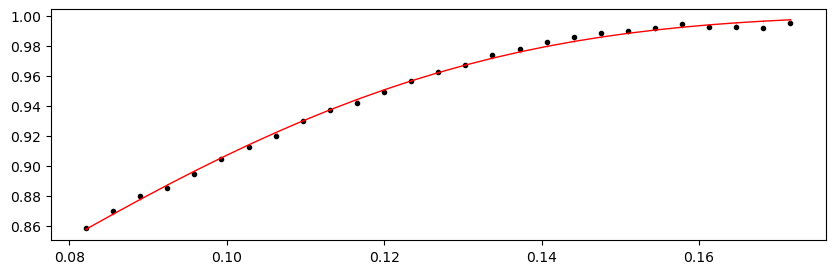

2995.7153200000002 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:35<00:00, 280.07it/s]


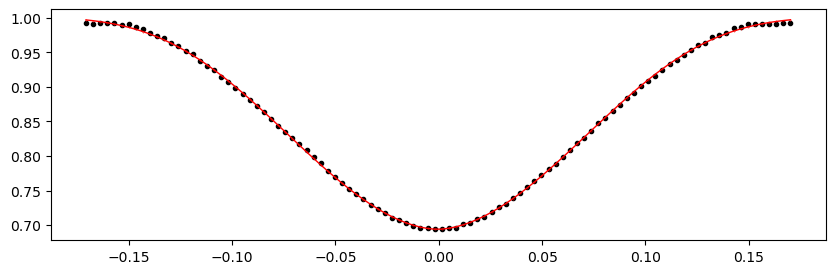

2996.38758 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:37<00:00, 268.83it/s]


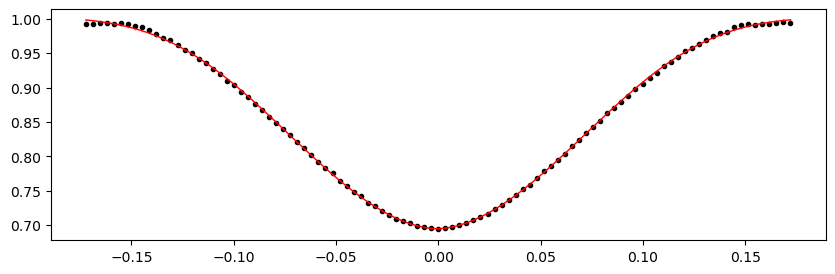

2997.05984 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:33<00:00, 294.54it/s]


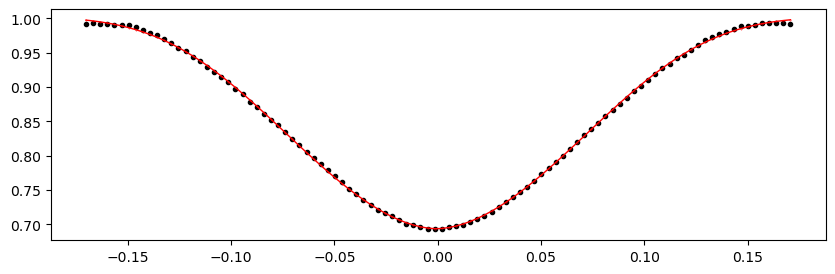

2997.7321 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:36<00:00, 271.21it/s]


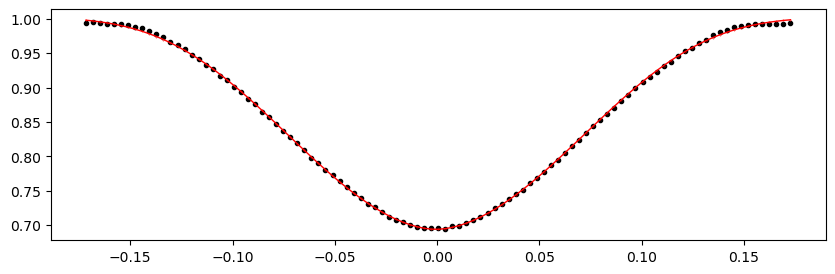

2998.40436 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:36<00:00, 270.63it/s]


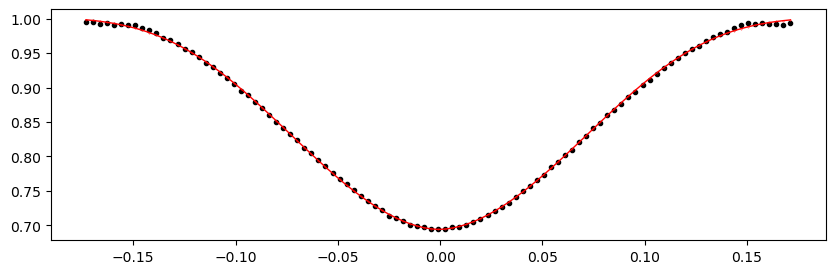

2999.07662 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 356.28it/s]


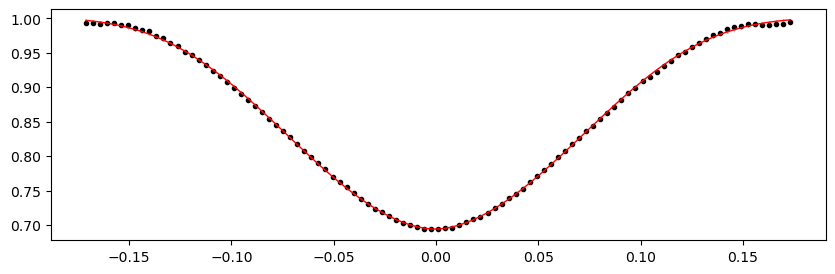

2999.74888 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 370.43it/s]


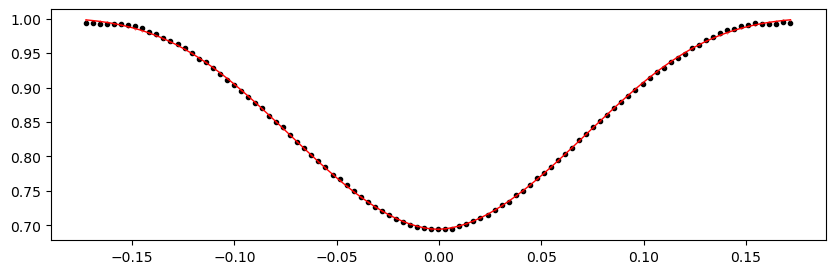

3000.42114 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 371.52it/s]


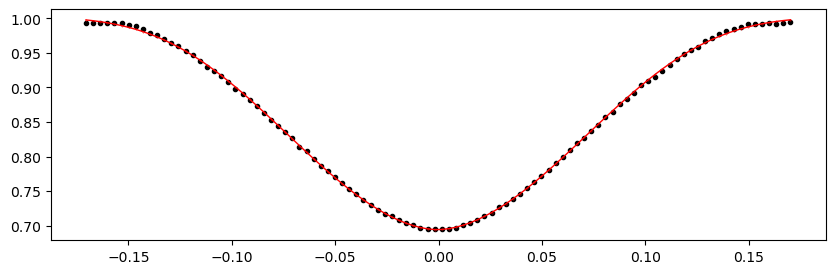

3003.11018 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 371.56it/s]


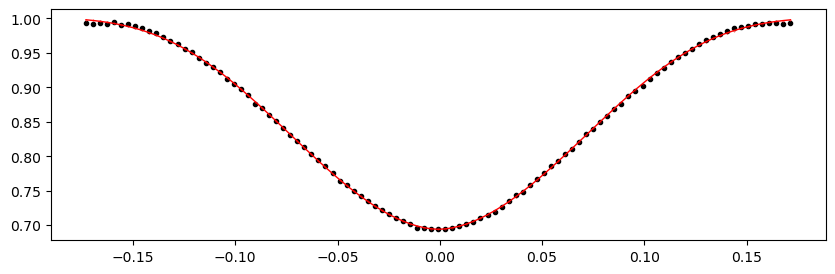

3003.78244 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.98it/s]


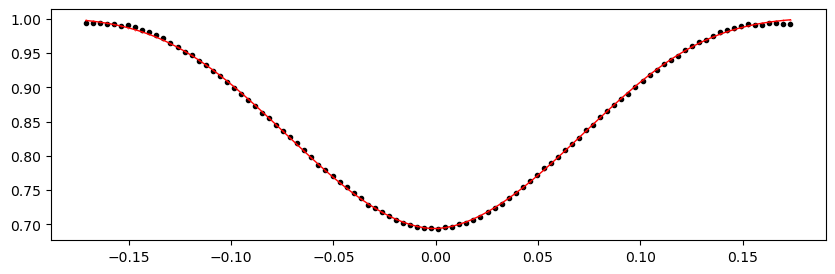

3004.4547000000002 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 369.17it/s]


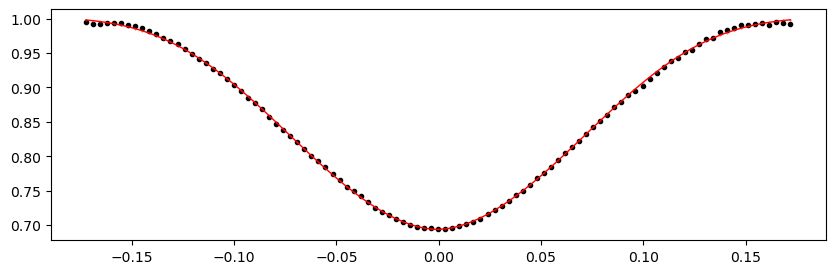

3005.12696 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 372.87it/s]


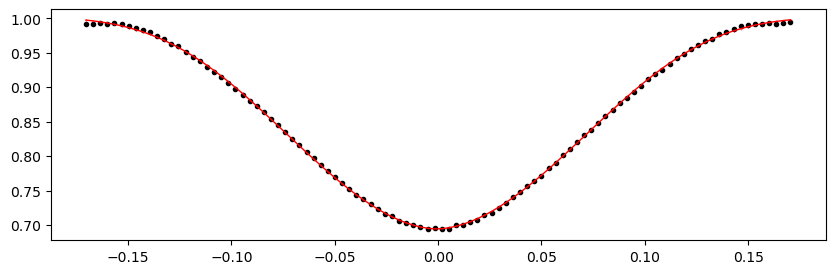

3005.79922 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 369.80it/s]


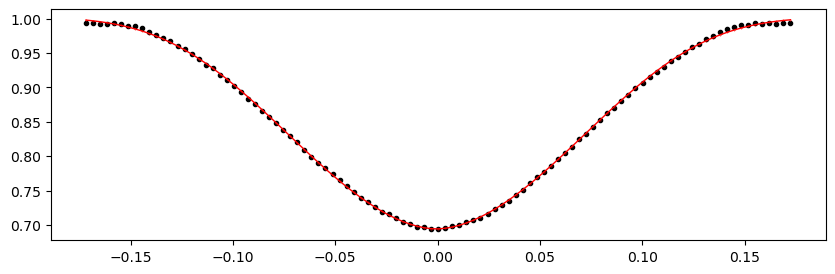

3006.47148 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 366.08it/s]


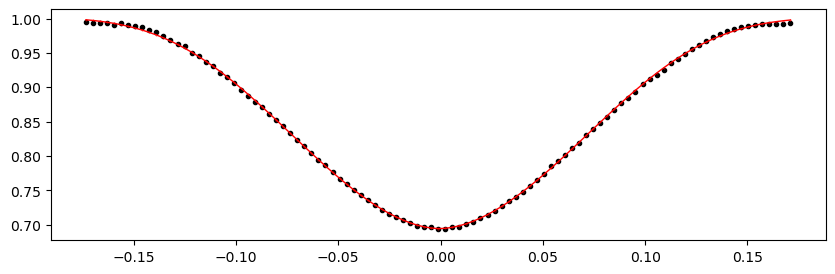

3007.14374 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.11it/s]


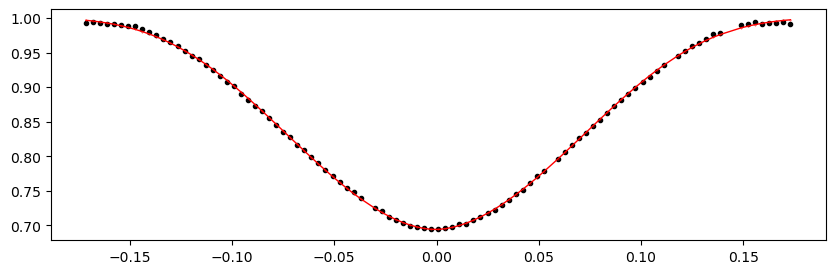

3007.816 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 359.83it/s]


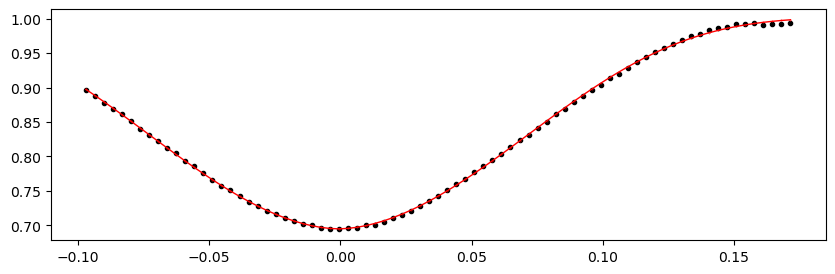

3008.48826 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:36<00:00, 277.44it/s]


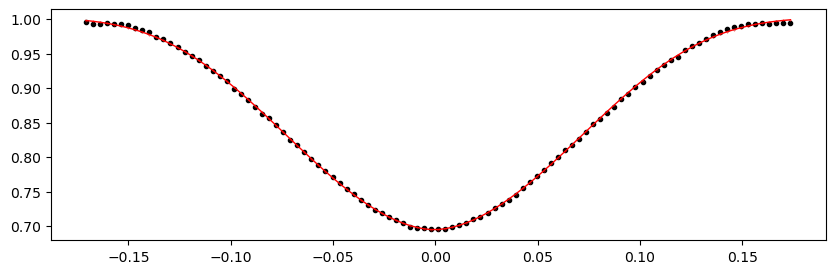

3009.16052 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:37<00:00, 264.22it/s]


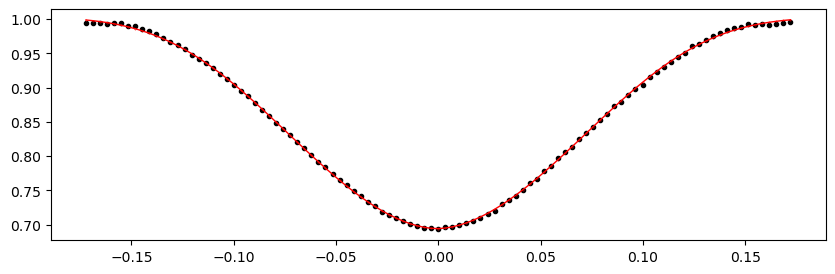

3009.8327799999997 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:35<00:00, 277.80it/s]


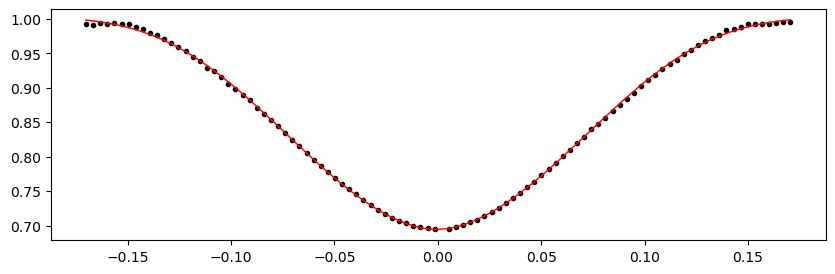

3010.50504 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:38<00:00, 261.80it/s]


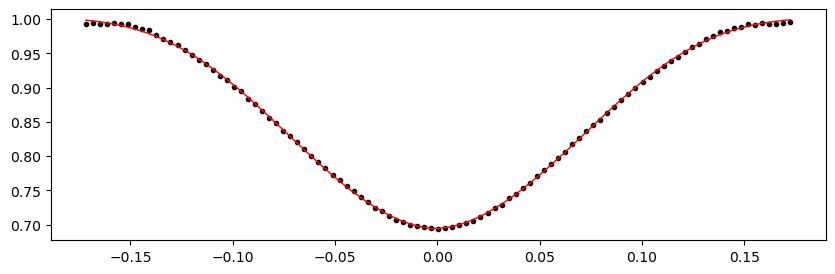

3011.1773 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:36<00:00, 274.68it/s]


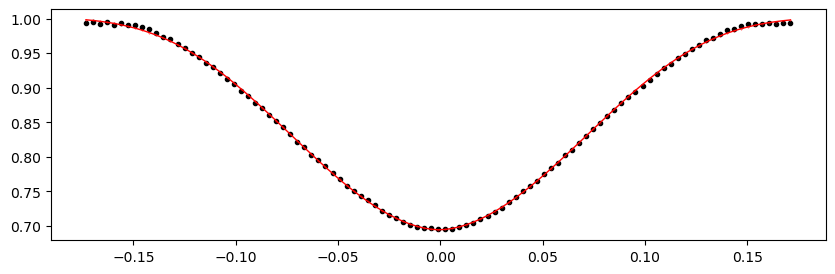

3011.84956 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 375.53it/s]


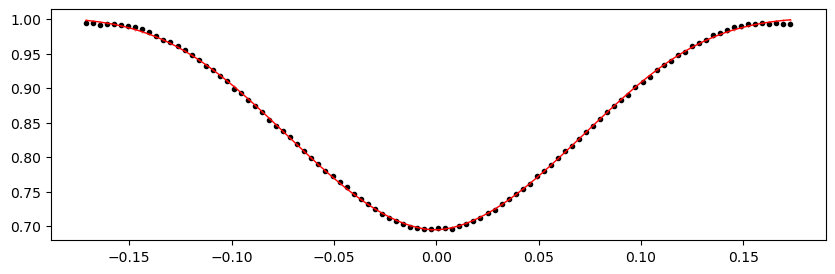

3012.52182 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 370.03it/s]


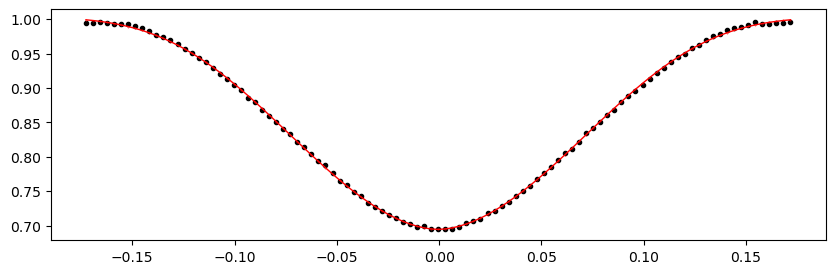

3013.19408 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 370.20it/s]


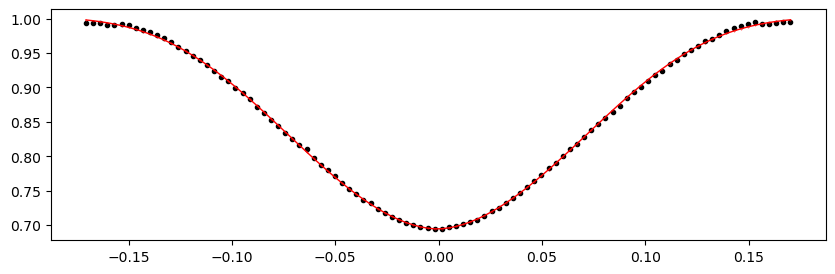

3013.86634 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 381.46it/s]


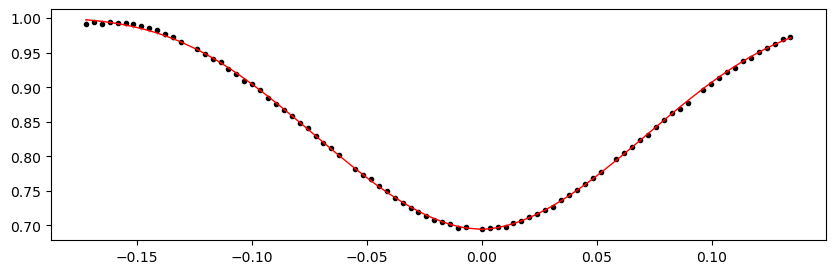

3015.21086 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 408.89it/s]


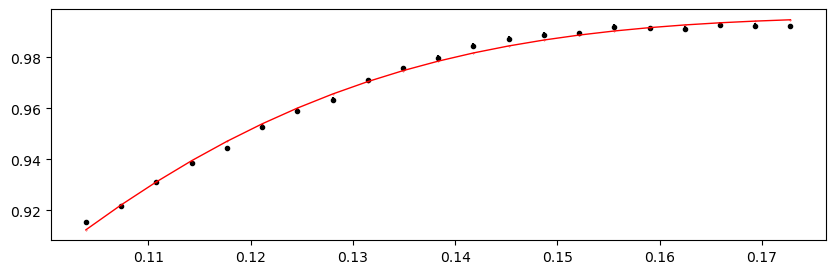

3015.88312 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 372.37it/s]


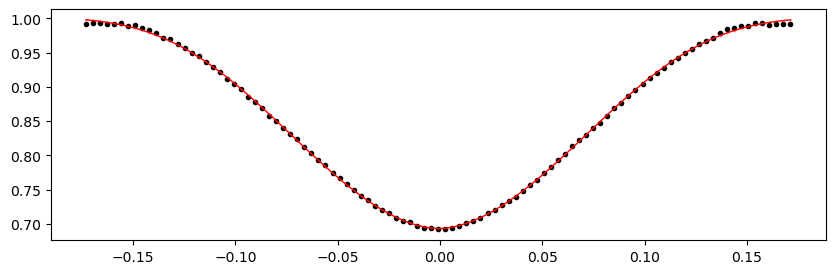

3016.55538 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 363.90it/s]


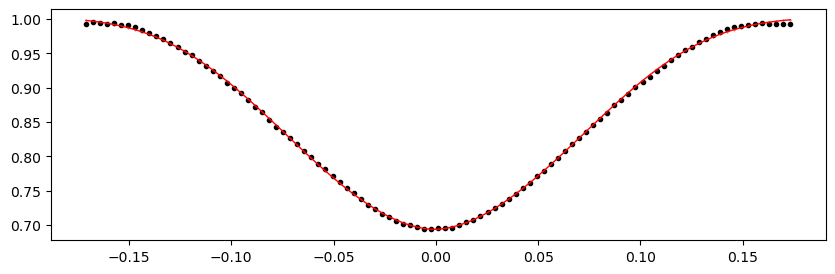

3017.22764 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 362.99it/s]


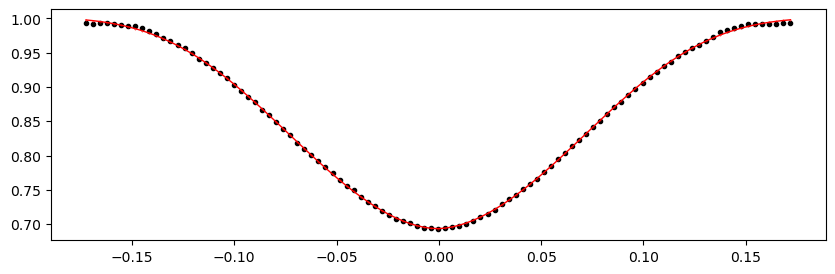

3017.8999 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 358.17it/s]


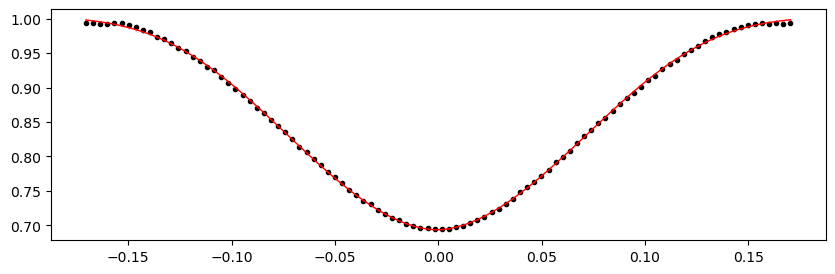

3018.5721599999997 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 360.66it/s]


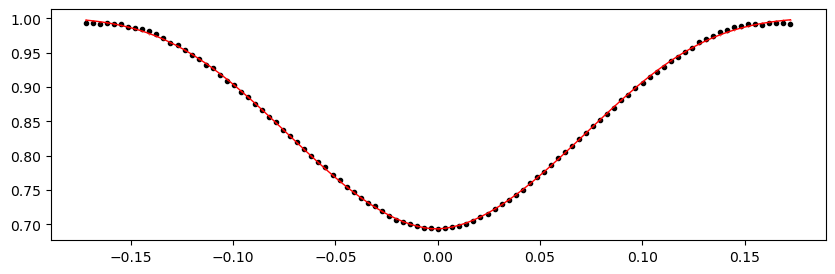

3019.24442 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 358.89it/s]


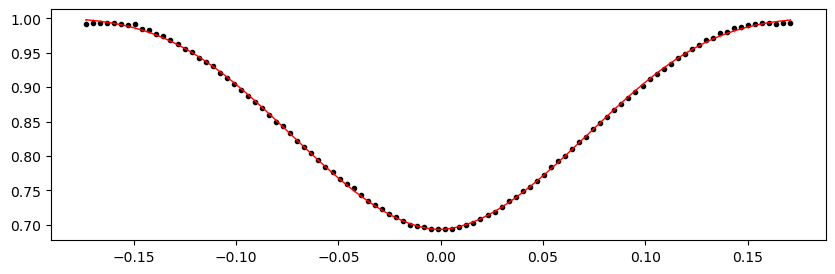

3019.91668 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 361.71it/s]


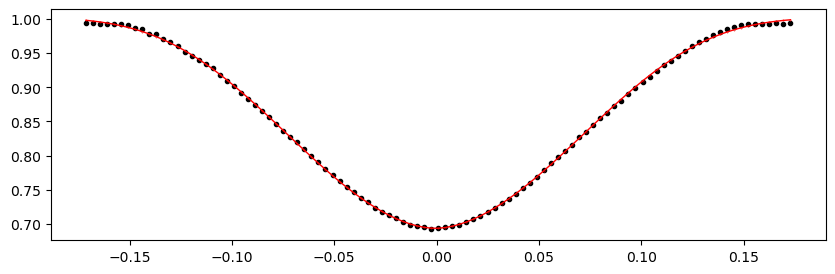

3020.58894 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 372.43it/s]


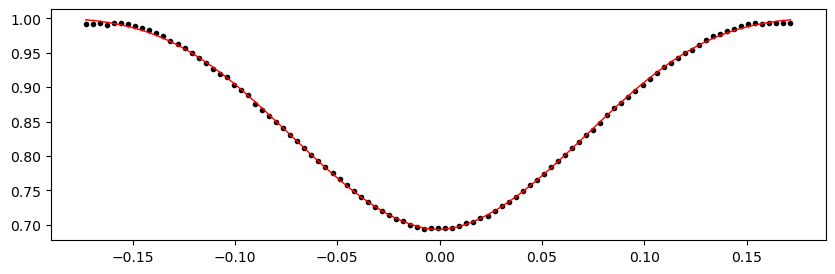

Time 3021.2612 does not have enough data points: 18
3021.93346 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 358.45it/s]


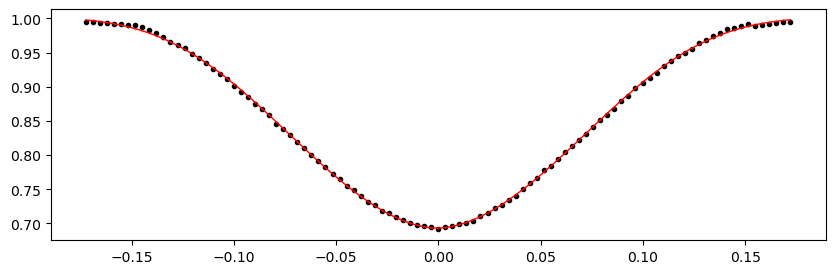

3022.60572 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 351.13it/s]


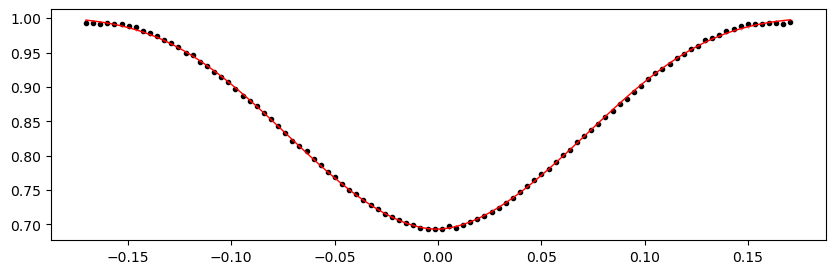

3023.27798 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 357.88it/s]


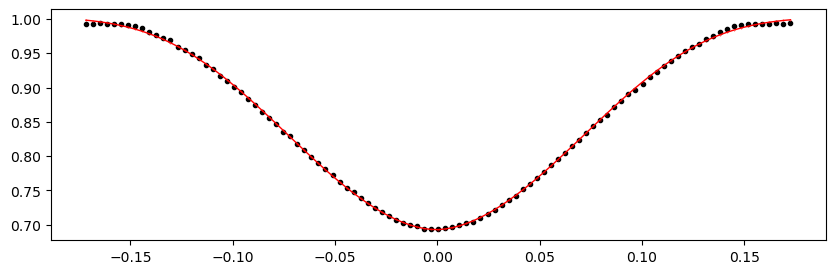

3023.95024 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 353.60it/s]


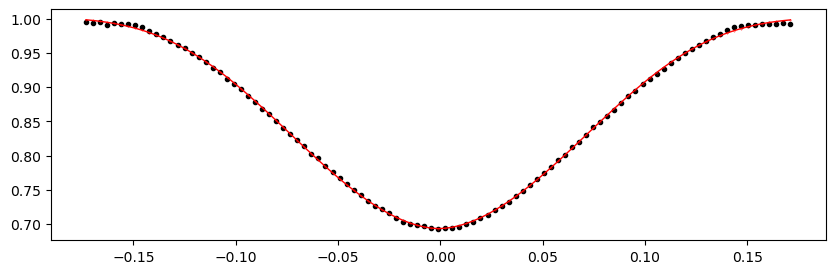

3024.6225 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 350.70it/s]


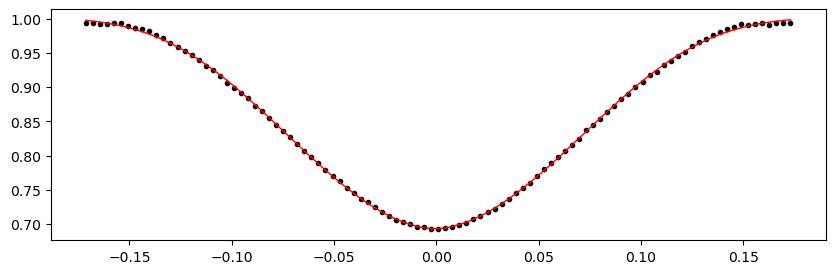

3025.2947599999998 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 350.67it/s]


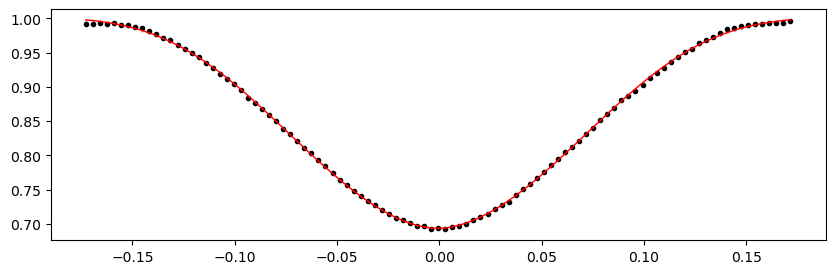

3025.96702 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 357.43it/s]


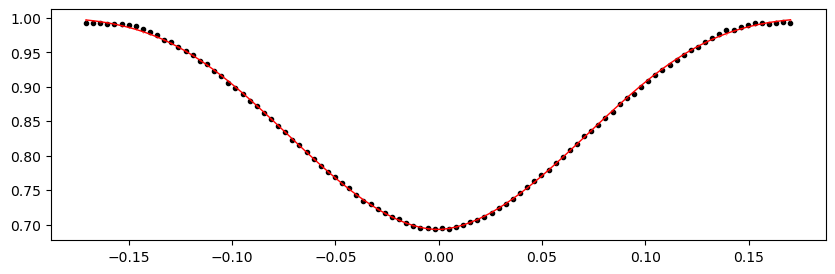

3026.63928 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 355.12it/s]


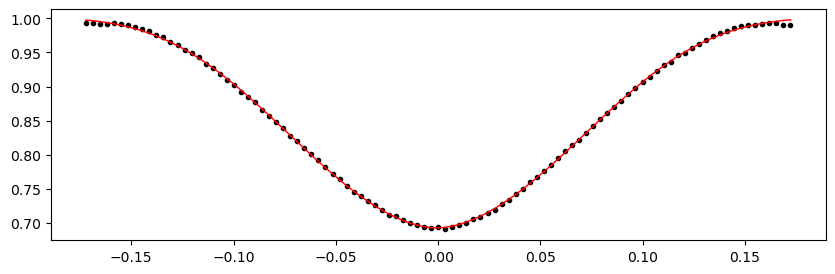

3027.3115399999997 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 355.67it/s]


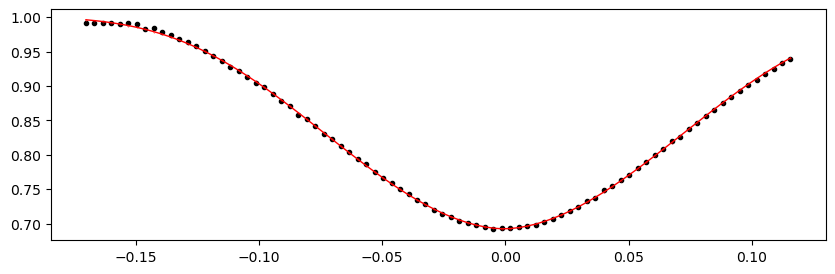

3027.9838 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 342.92it/s]


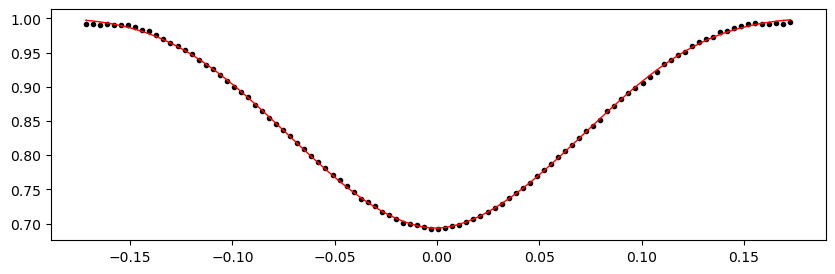

3028.6560600000003 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 353.81it/s]


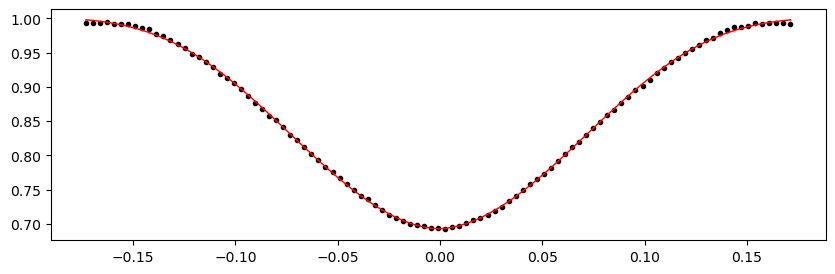

3029.32832 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 345.58it/s]


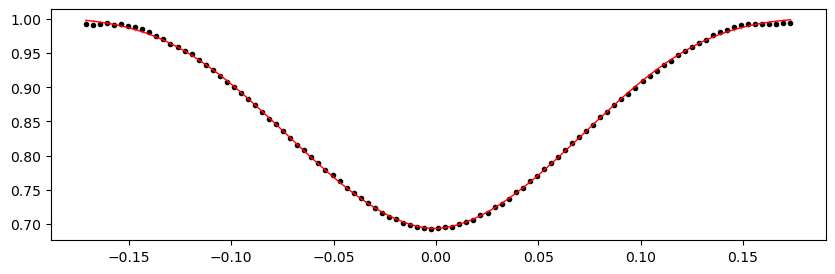

3030.00058 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 359.43it/s]


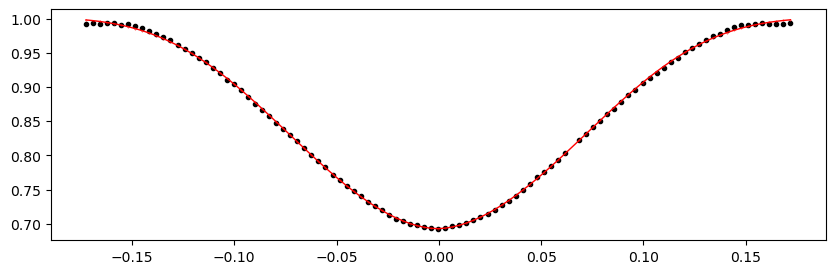

3030.67284 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 354.17it/s]


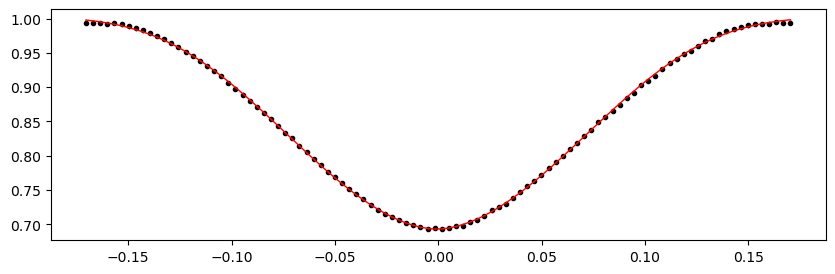

3031.3451 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 357.49it/s]


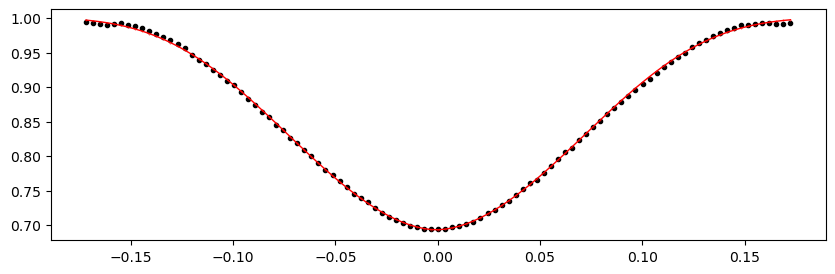

3032.01736 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 357.32it/s]


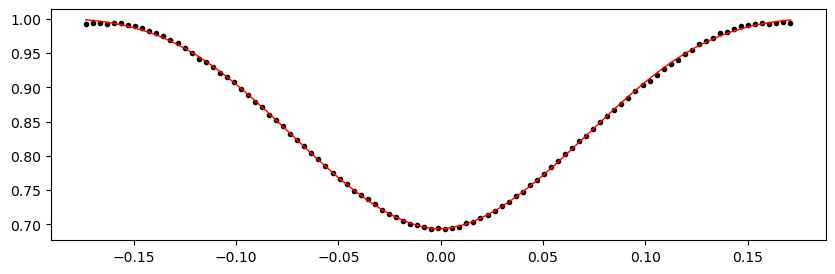

3032.68962 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 350.25it/s]


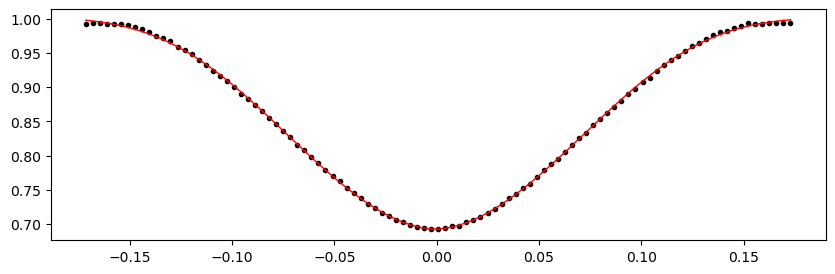

3033.36188 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 369.22it/s]


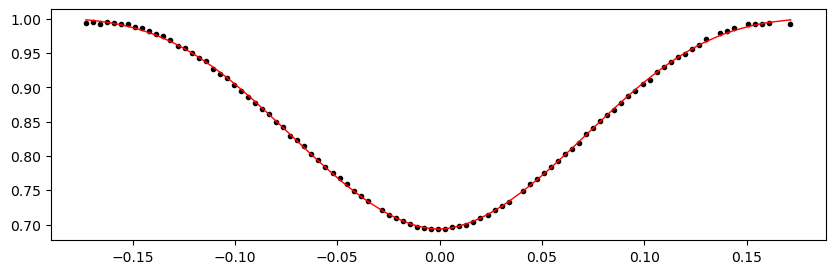

3034.0341399999998 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 370.54it/s]


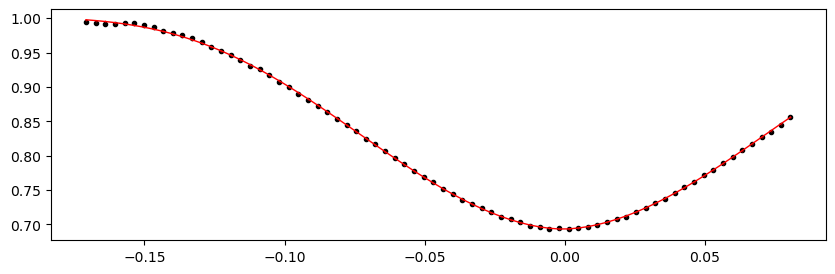

3034.7064 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 347.52it/s]


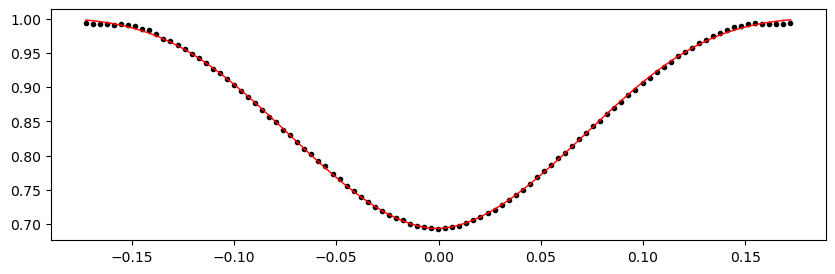

3035.37866 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 351.98it/s]


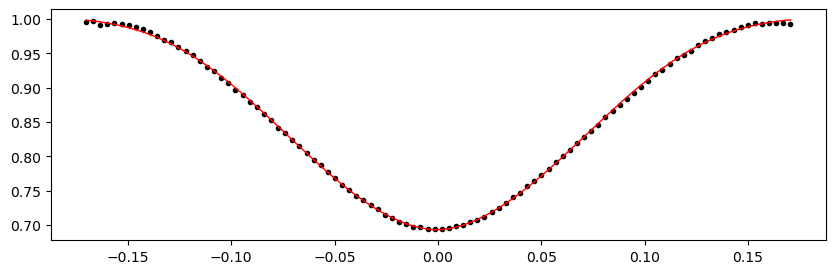

3036.05092 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 354.54it/s]


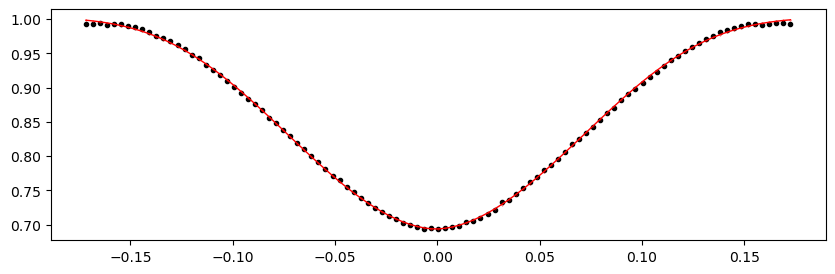

3036.72318 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 366.31it/s]


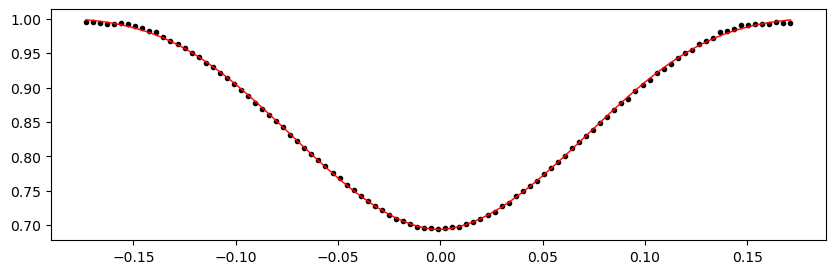

3037.3954400000002 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 358.95it/s]


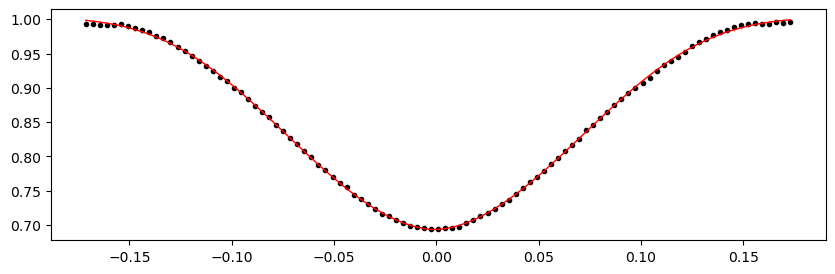

3038.0677 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 358.04it/s]


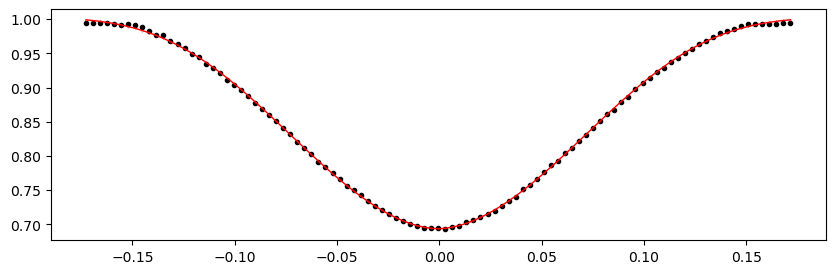

3038.73996 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 362.48it/s]


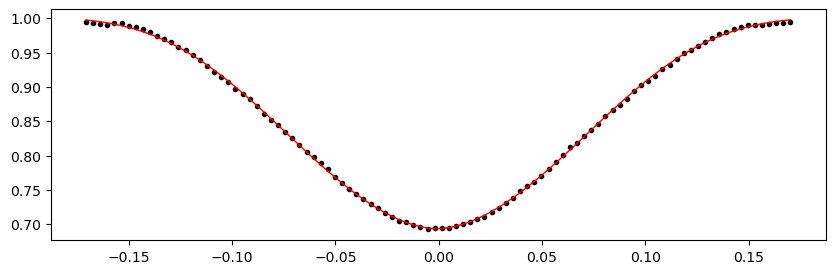

3039.41222 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 360.22it/s]


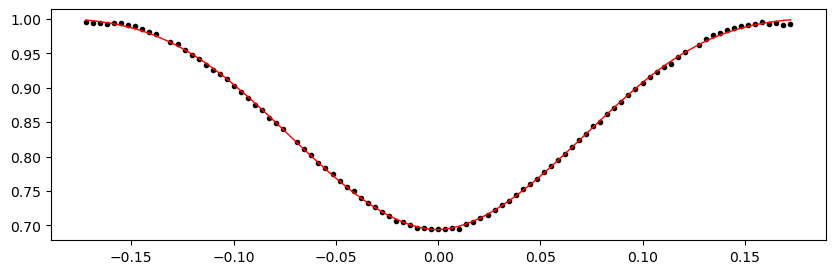

3040.08448 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 381.58it/s]


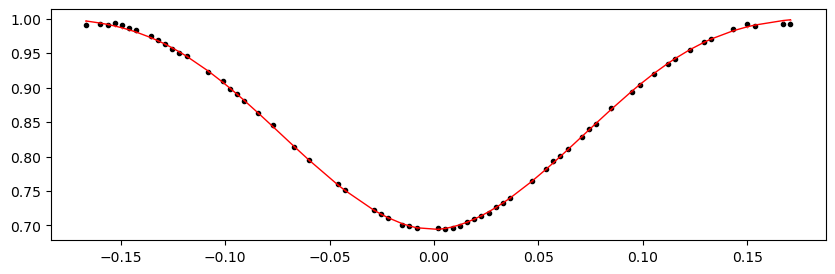

3040.75674 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 372.58it/s]


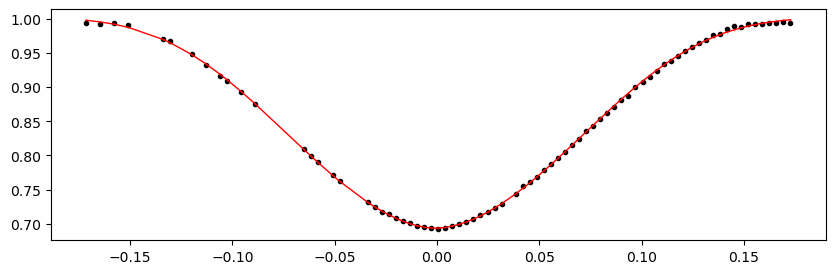

3041.429 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 350.08it/s]


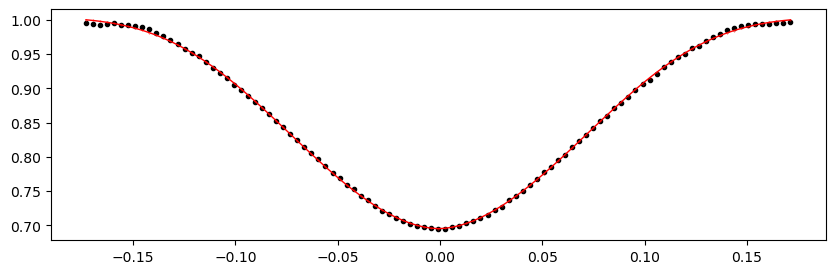

3042.10126 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 359.66it/s]


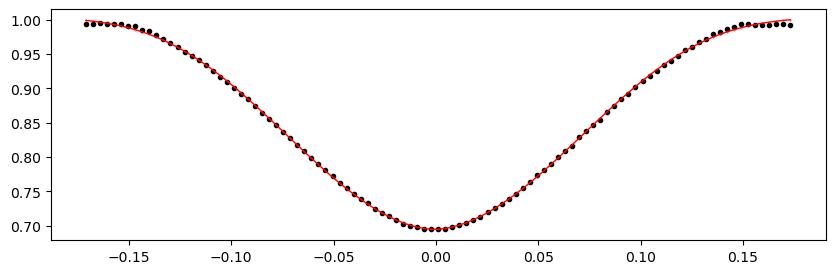

3042.7735199999997 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 353.03it/s]


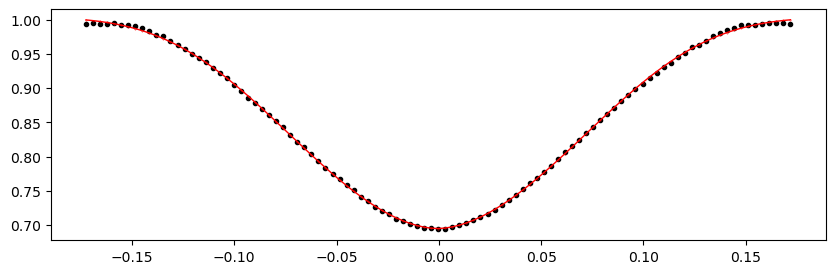

3043.44578 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 353.45it/s]


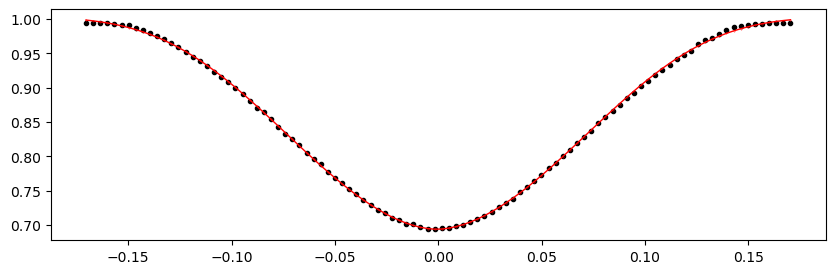

3044.11804 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 352.16it/s]


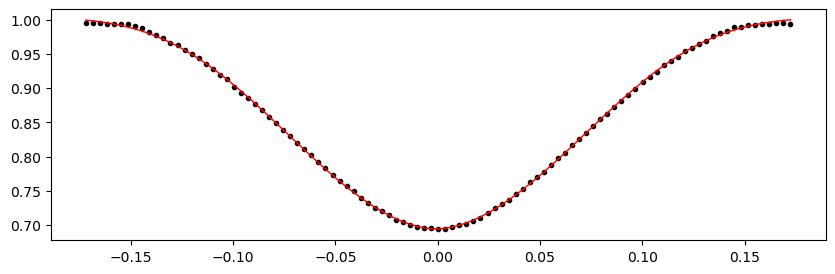

3044.7903 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 354.87it/s]


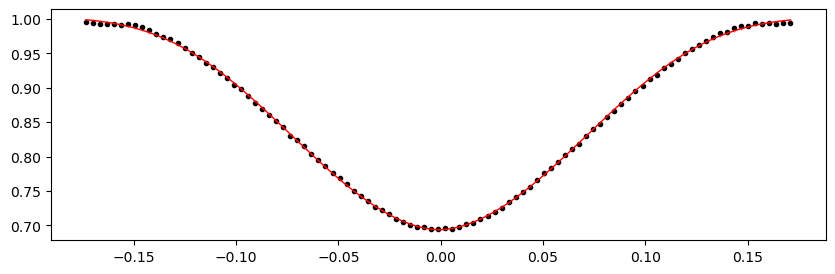

3045.46256 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 353.92it/s]


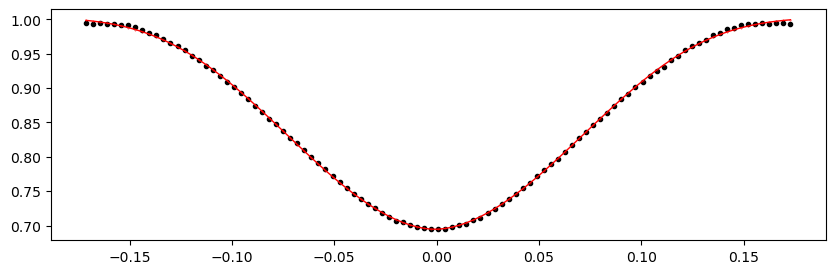

3046.13482 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 355.48it/s]


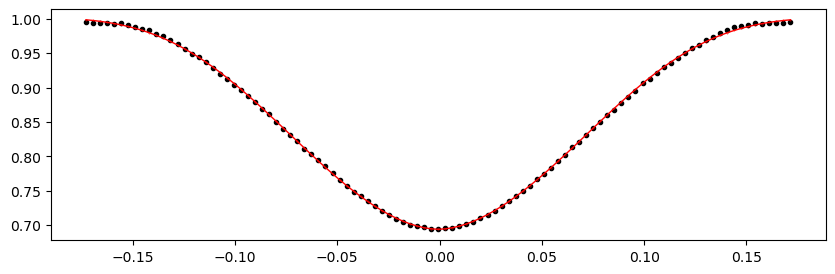

3046.80708 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 351.04it/s]


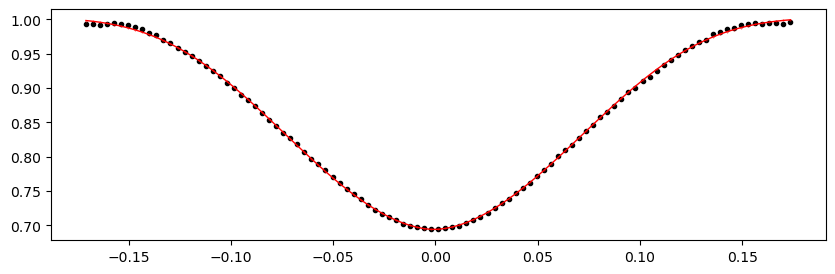

3047.47934 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 350.49it/s]


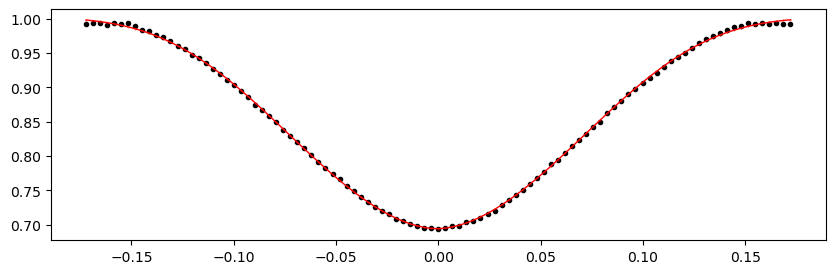

3048.1516 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 389.31it/s]


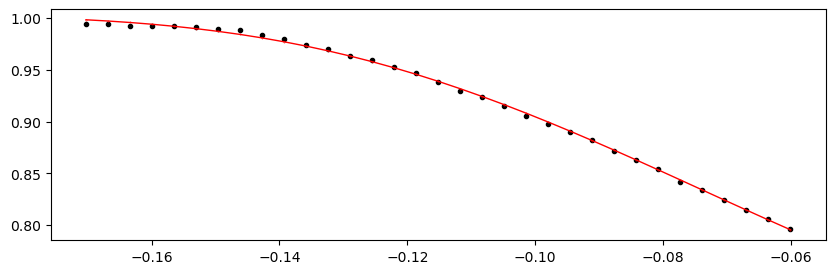

3048.82386 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 353.63it/s]


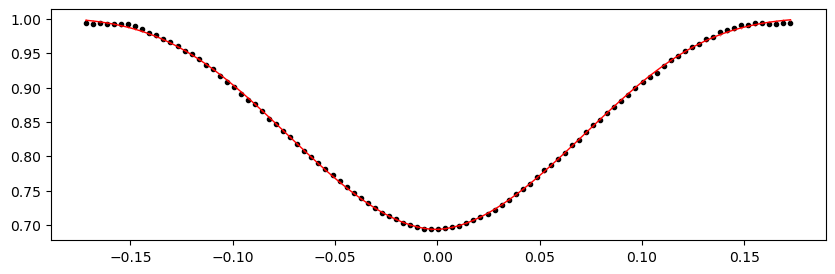

3049.49612 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 358.53it/s]


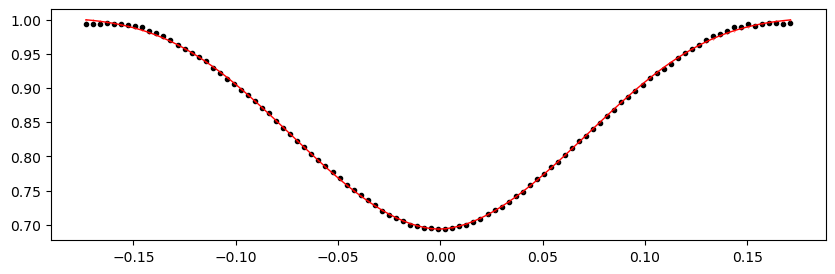

3050.16838 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 341.27it/s]


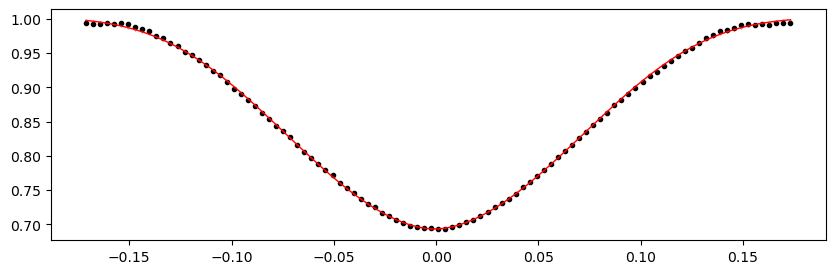

3050.84064 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 359.75it/s]


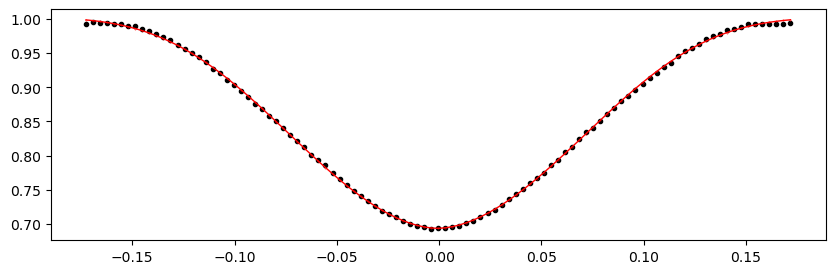

3051.5128999999997 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:35<00:00, 278.06it/s]


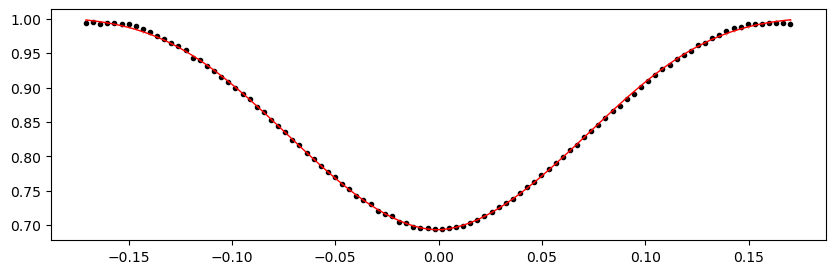

3052.18516 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 324.23it/s]


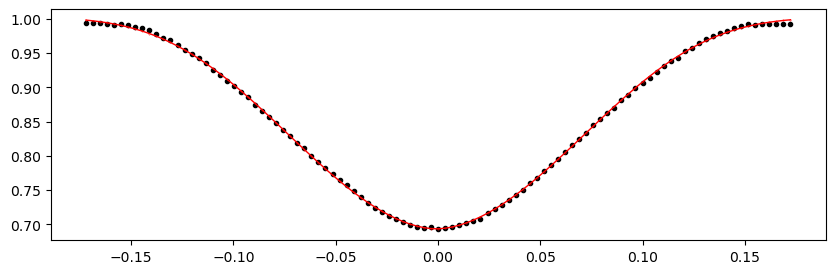

3052.85742 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:34<00:00, 292.33it/s]


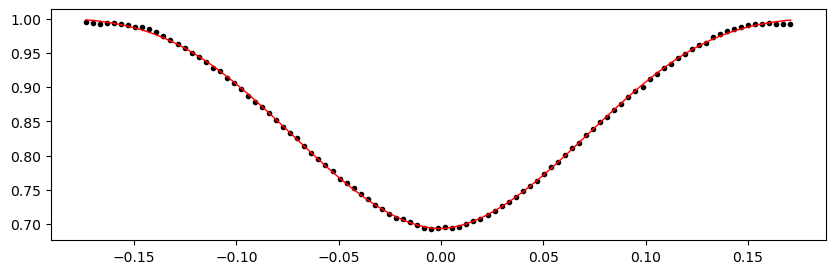

3053.52968 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 357.33it/s]


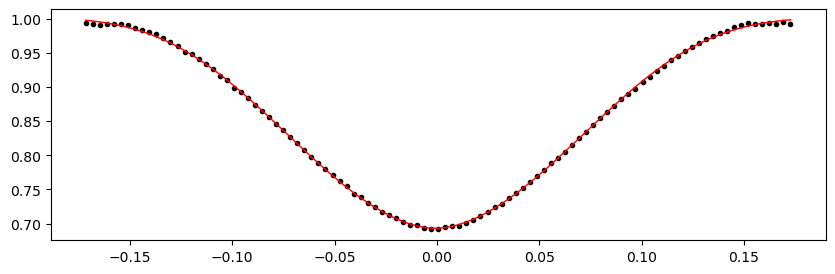

3054.20194 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 356.91it/s]


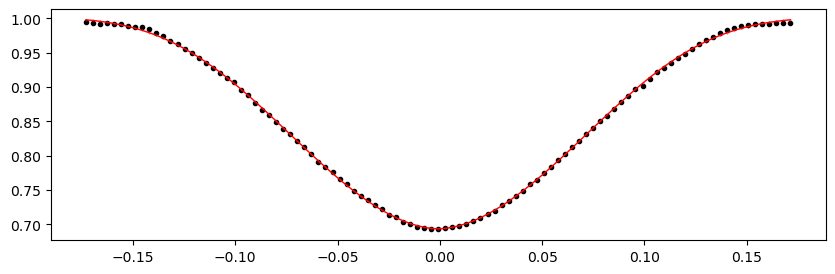

3054.8742 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 360.72it/s]


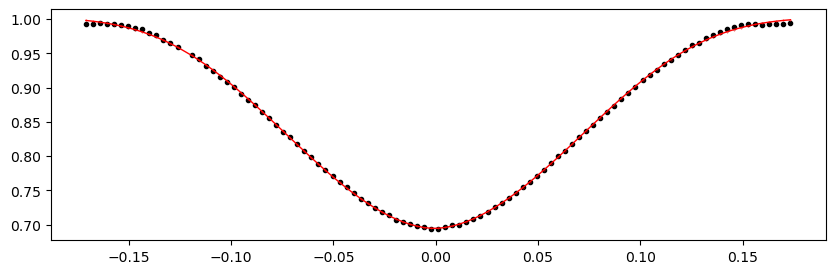

3055.54646 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 359.52it/s]


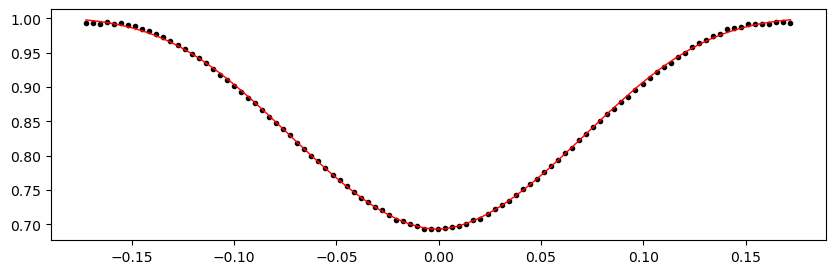

3056.21872 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 362.59it/s]


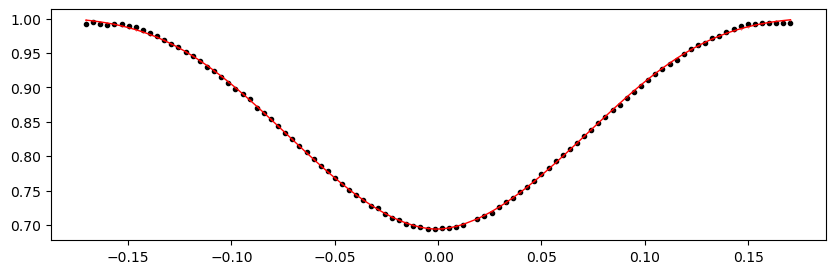

3056.89098 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 359.92it/s]


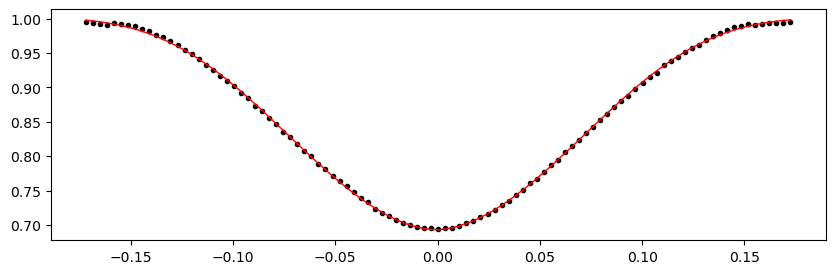

3057.56324 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 359.73it/s]


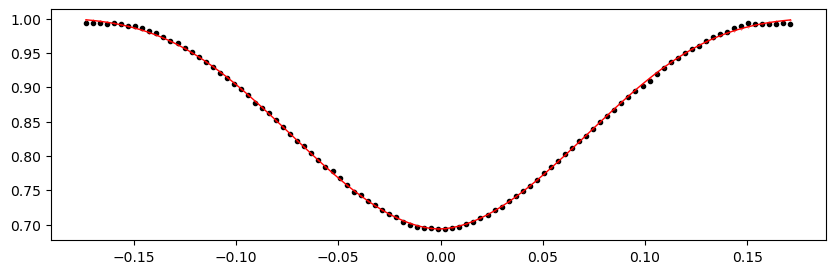

3058.2355 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 357.48it/s]


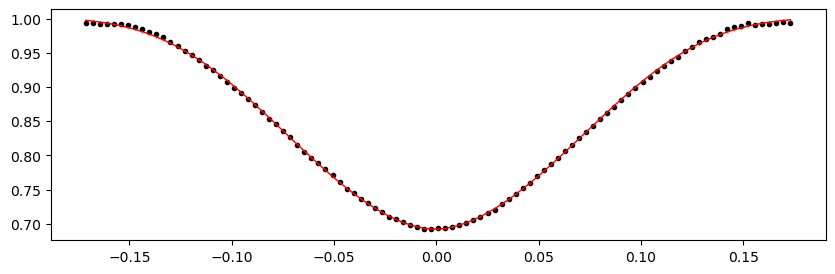

3058.90776 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 354.71it/s]


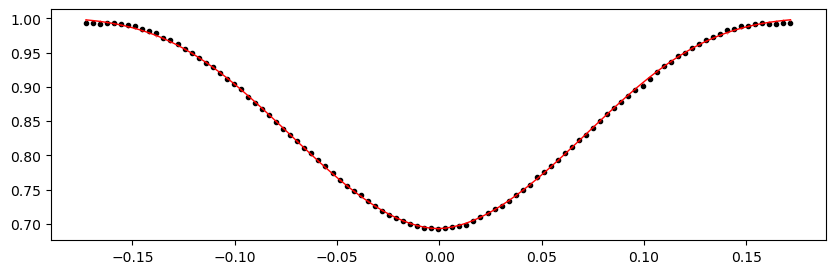

3059.58002 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 348.01it/s]


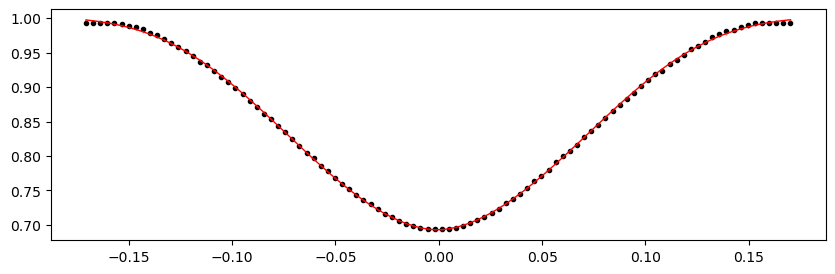

3060.2522799999997 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 363.62it/s]


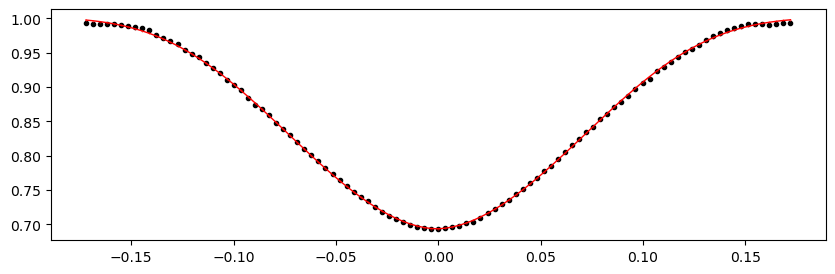

3060.92454 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 332.71it/s]


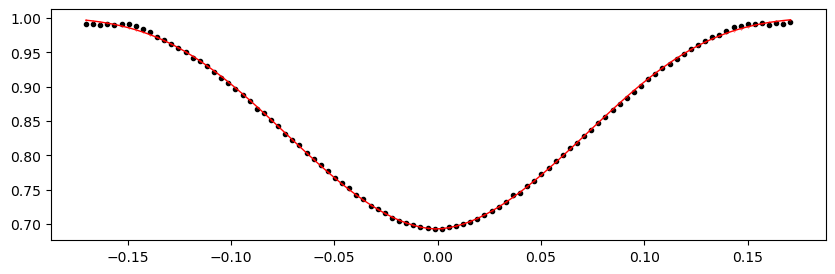

3061.5968000000003 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 351.80it/s]


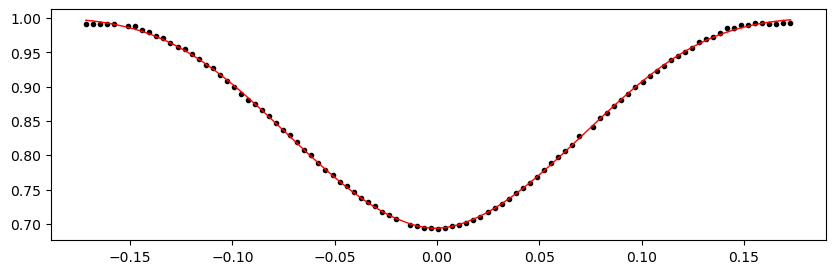

3062.26906 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 401.22it/s]


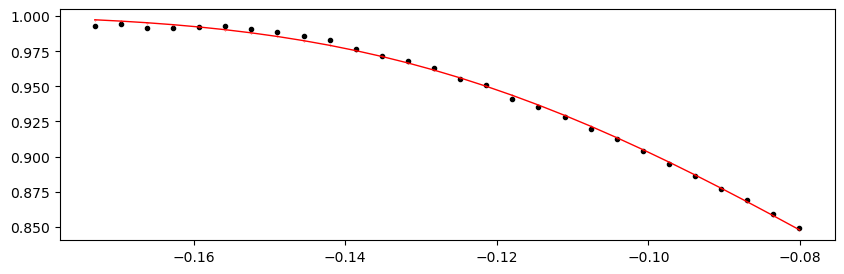

3062.94132 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 358.92it/s]


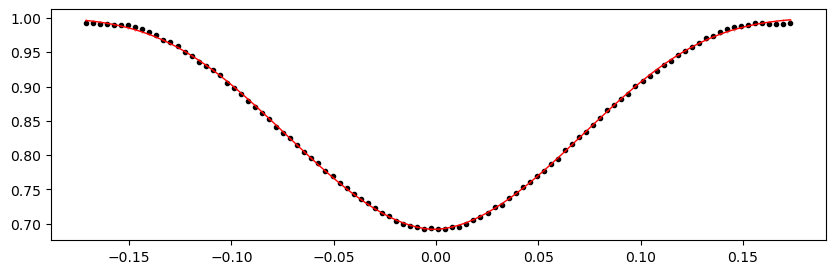

3063.61358 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 355.53it/s]


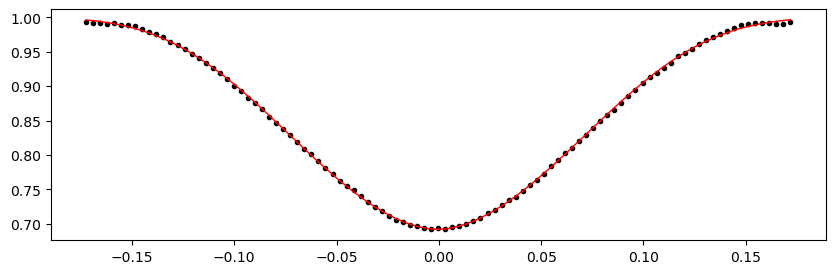

3064.28584 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 356.08it/s]


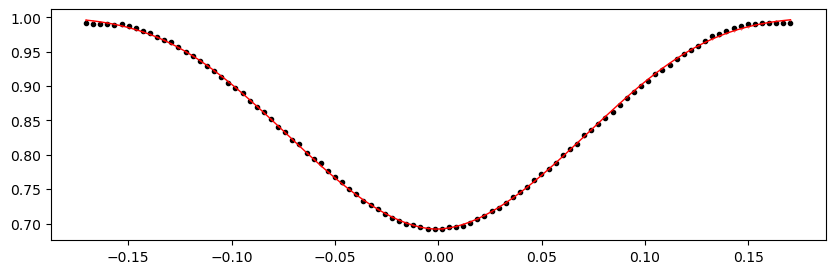

3064.9581 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 352.00it/s]


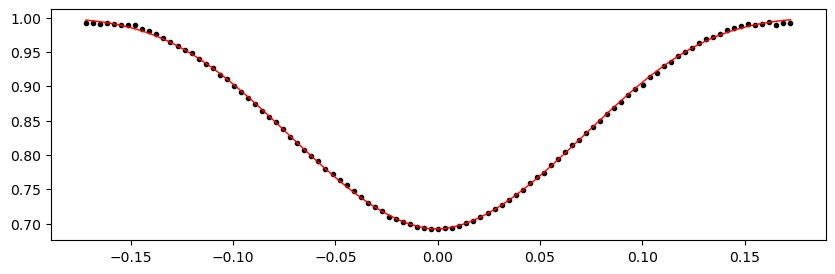

3065.63036 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 352.17it/s]


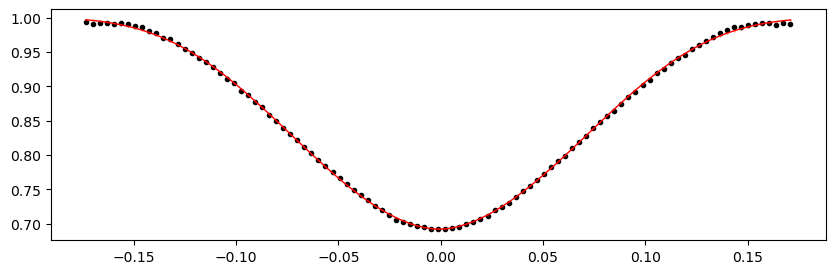

3066.30262 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 356.49it/s]


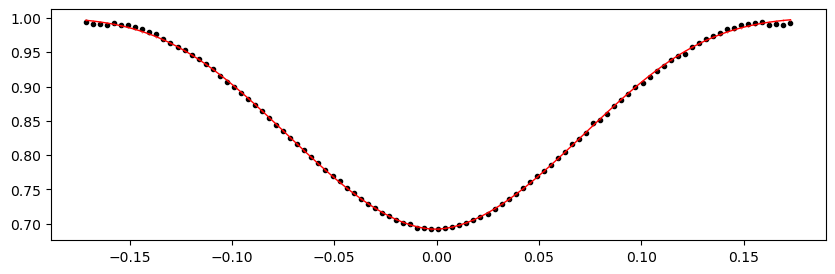

3066.9748799999998 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 352.94it/s]


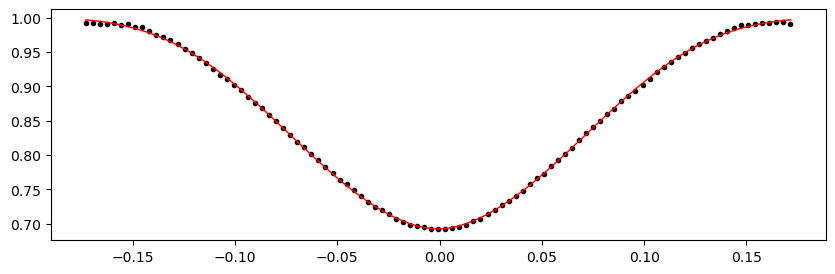

3067.64714 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 360.77it/s]


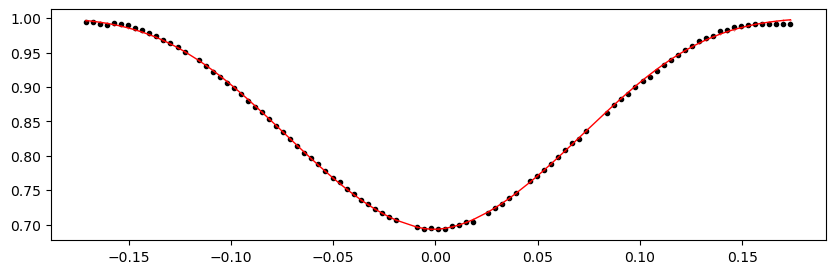

3068.9916599999997 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 360.57it/s]


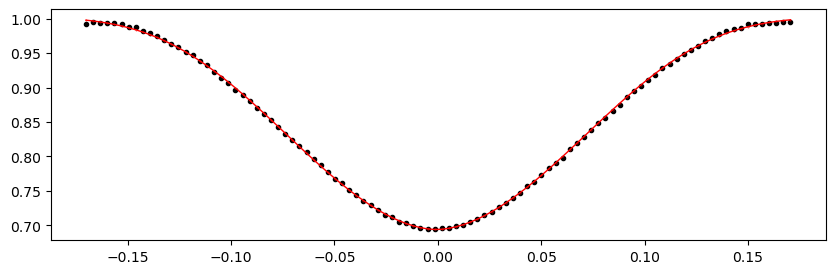

3069.66392 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 355.52it/s]


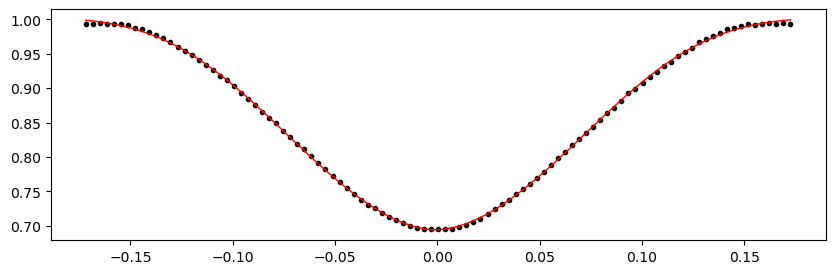

3070.3361800000002 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 359.55it/s]


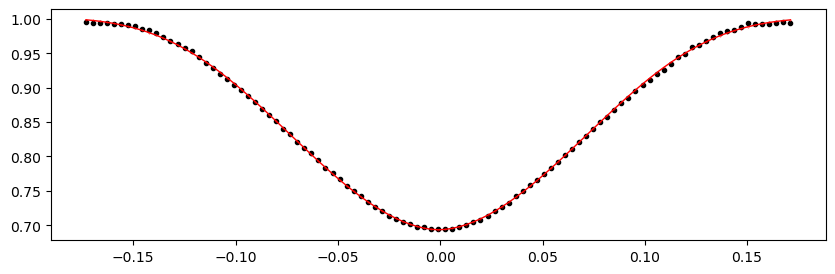

3071.00844 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 358.31it/s]


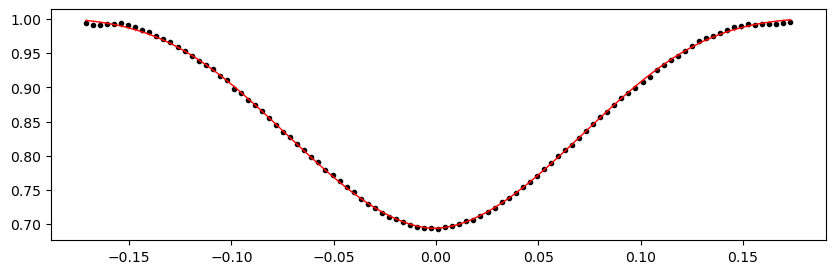

3071.6807 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 355.92it/s]


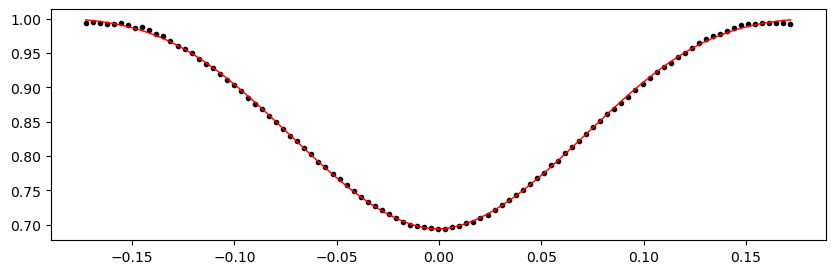

3072.35296 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 314.90it/s]


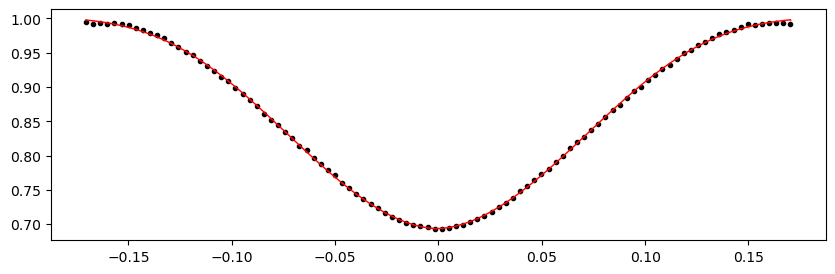

3073.02522 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:39<00:00, 256.40it/s]


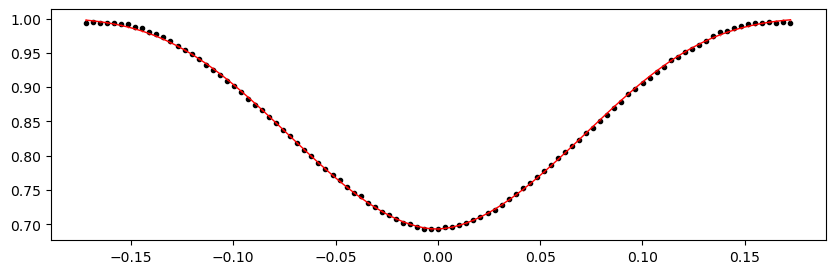

3073.69748 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:32<00:00, 310.75it/s]


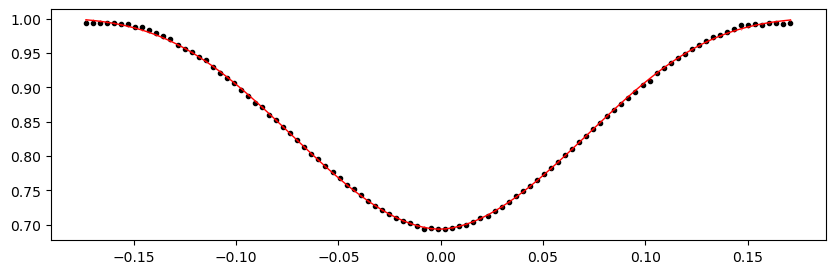

3074.36974 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:33<00:00, 302.76it/s]


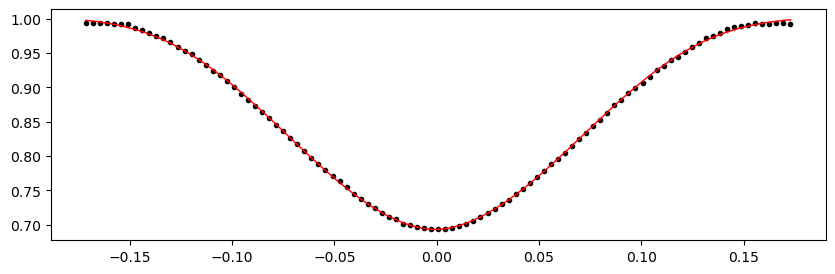

3075.042 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 332.26it/s]


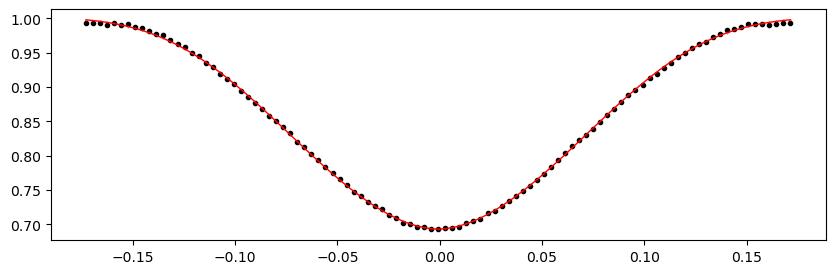

3075.7142599999997 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 338.40it/s]


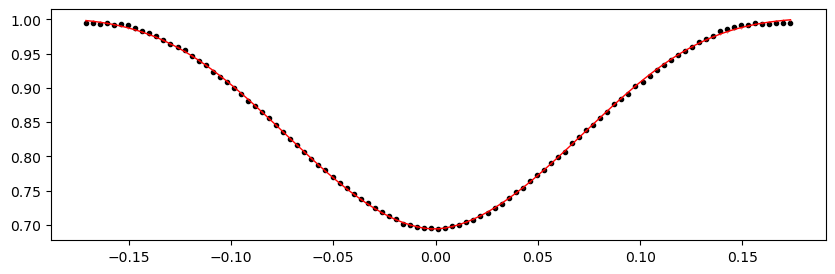

3076.38652 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 343.68it/s]


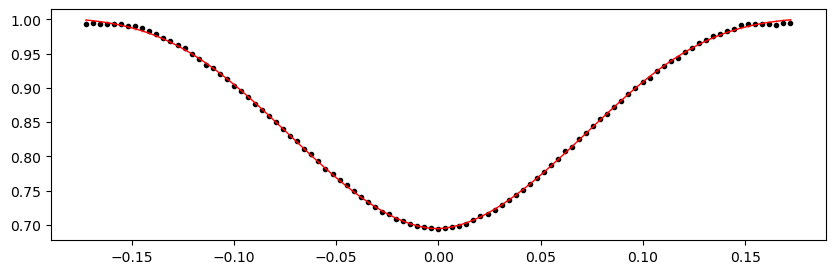

3082.43686 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 361.69it/s]


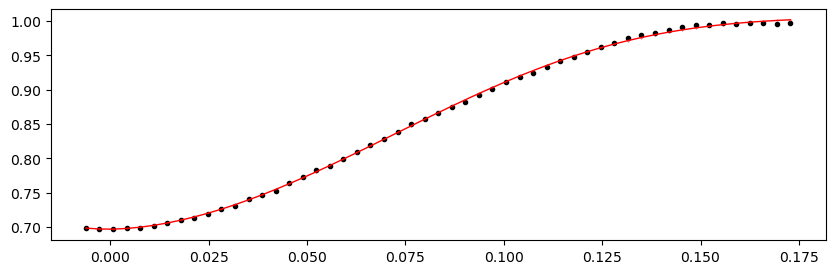

3083.10912 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 346.18it/s]


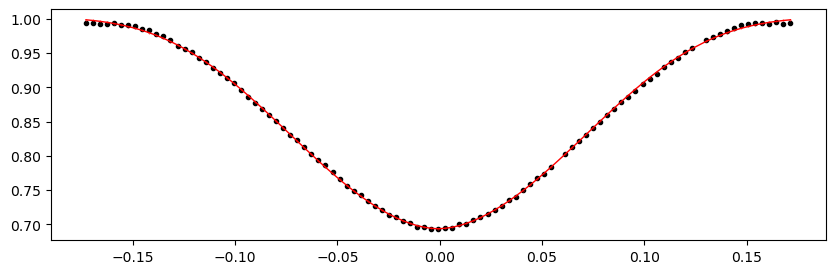

3083.78138 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 350.03it/s]


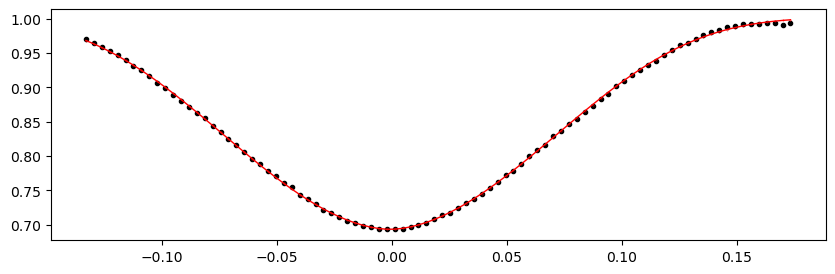

3084.4536399999997 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 349.98it/s]


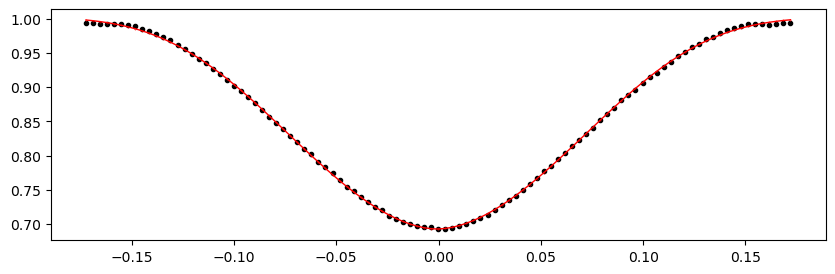

3085.1259 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 339.01it/s]


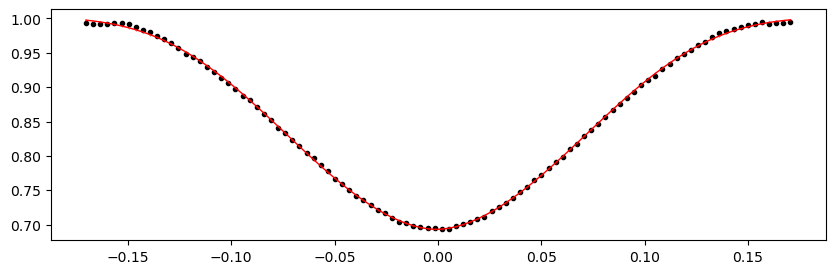

3085.7981600000003 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 347.09it/s]


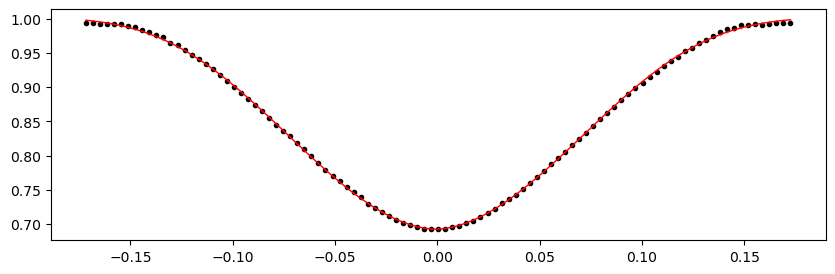

3086.4704199999996 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 354.93it/s]


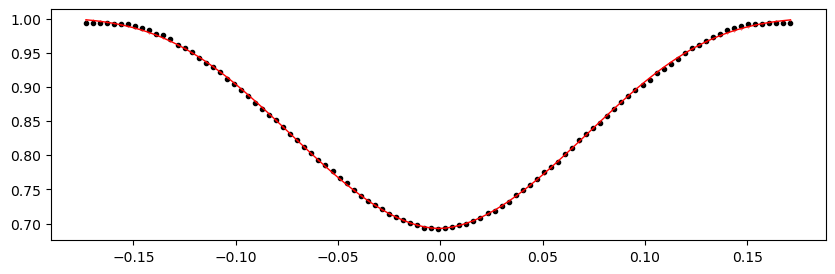

3087.14268 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 356.30it/s]


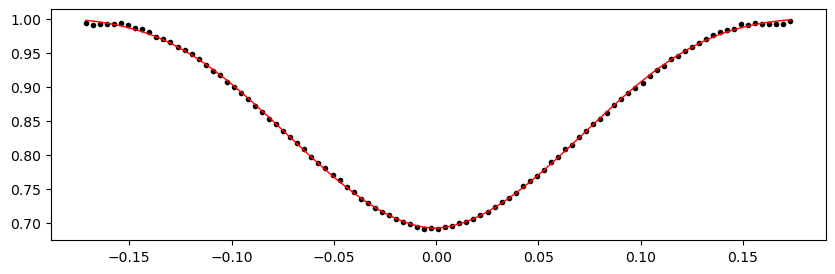

3087.81494 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 358.55it/s]


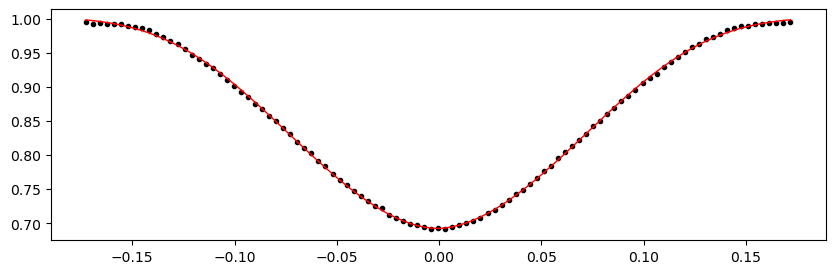

3088.4872 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 352.73it/s]


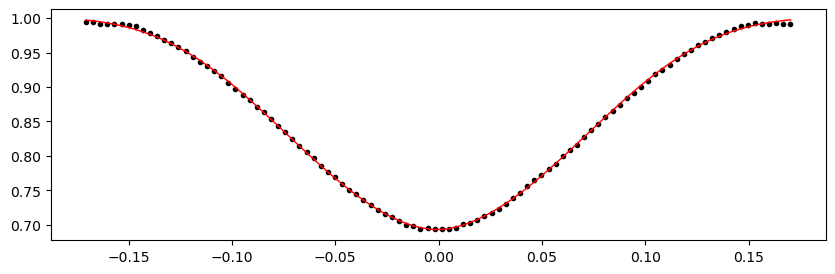

3089.15946 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 352.39it/s]


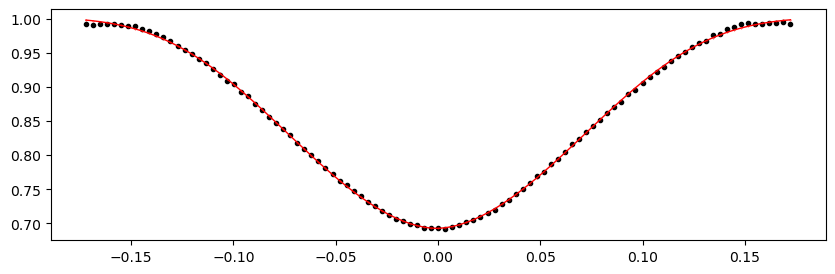

3089.83172 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 363.68it/s]


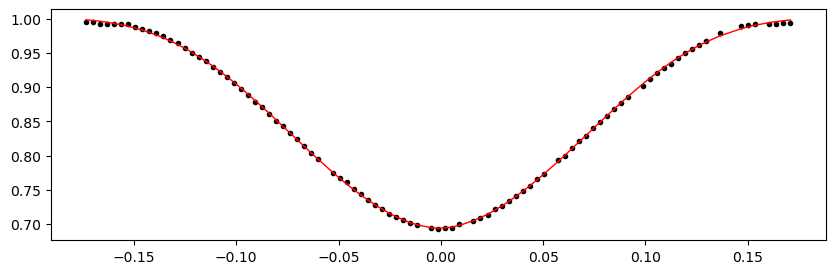

3090.50398 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 373.61it/s]


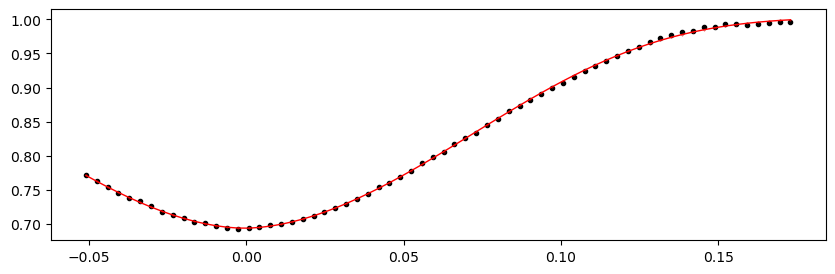

3126.80602 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 357.83it/s]


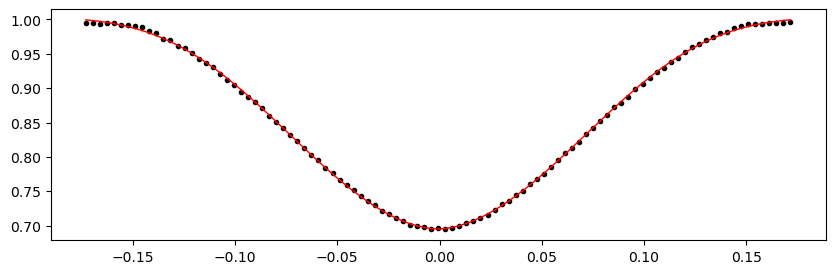

3127.4782800000003 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 346.20it/s]


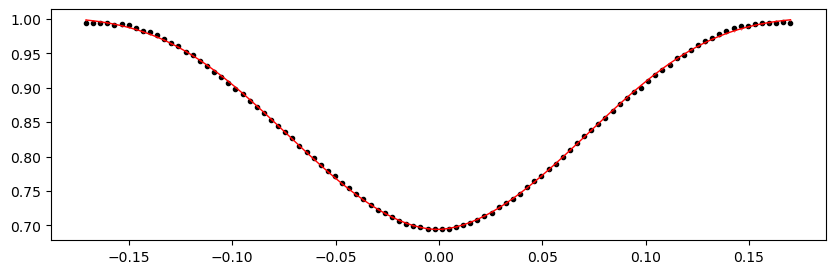

3128.1505399999996 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 348.26it/s]


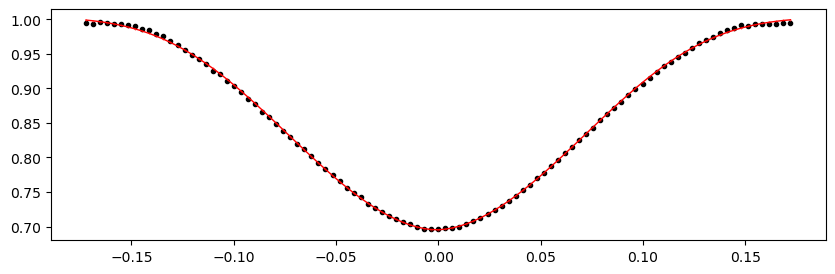

3128.8228 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 346.45it/s]


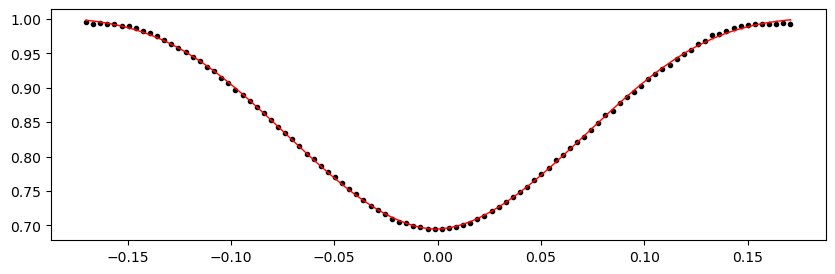

3129.49506 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 347.25it/s]


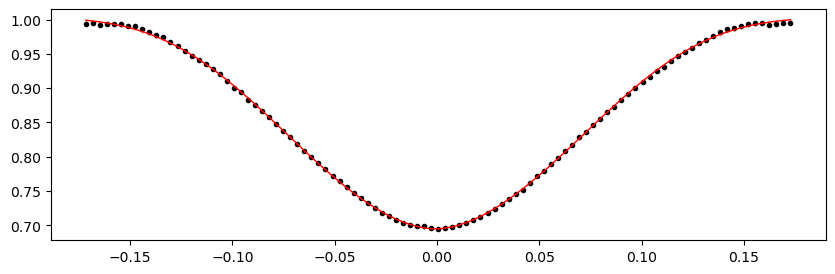

3130.16732 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 341.33it/s]


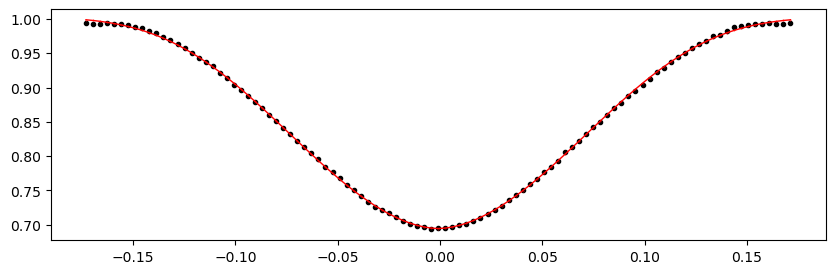

3130.83958 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 349.27it/s]


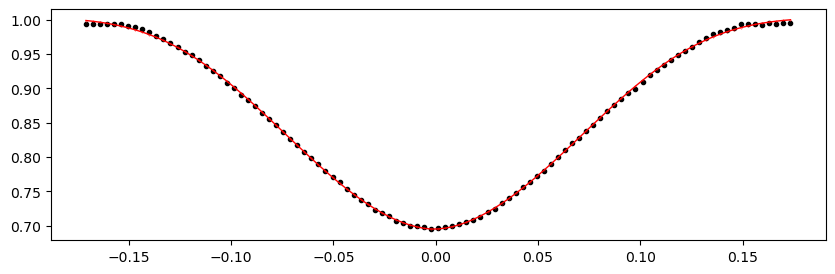

3131.51184 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 361.73it/s]


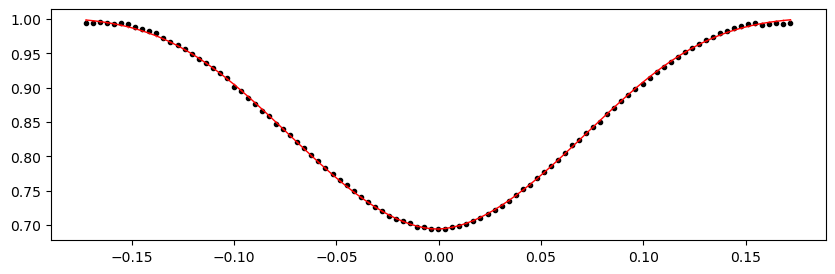

3132.1841 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 347.46it/s]


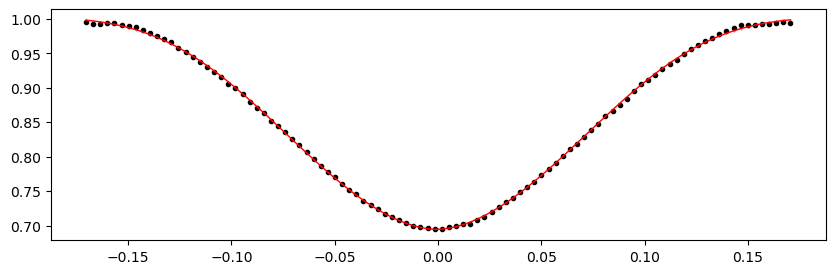

3132.8563599999998 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 360.33it/s]


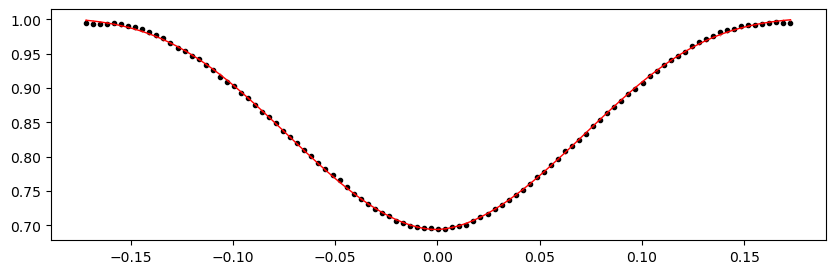

3133.52862 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 359.73it/s]


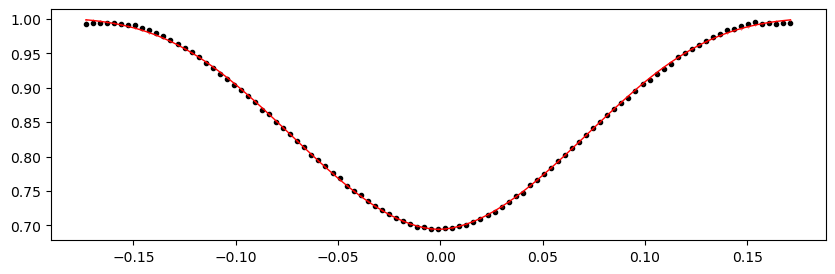

3134.20088 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 354.62it/s]


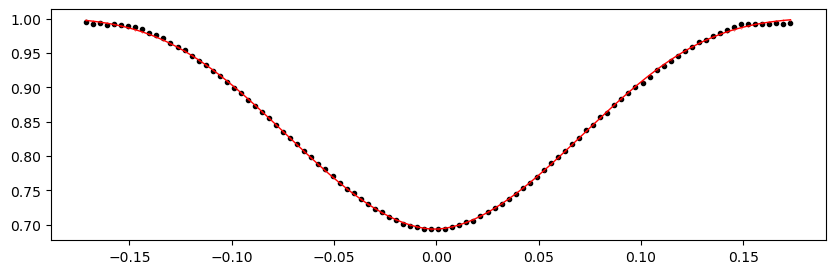

3140.92348 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 369.32it/s]


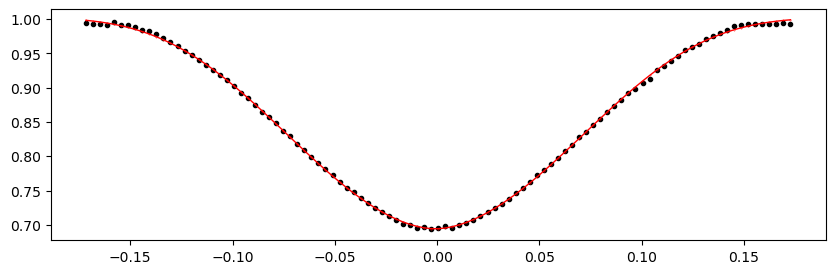

3141.5957399999998 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 360.53it/s]


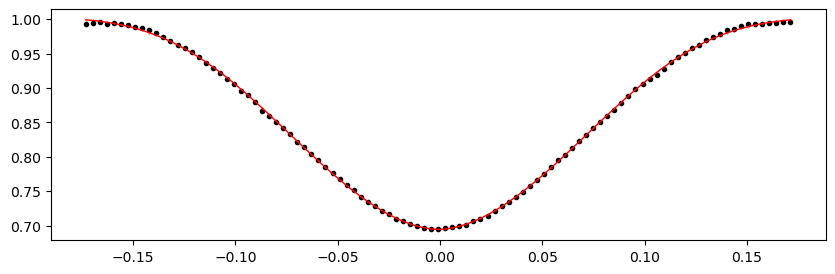

3142.268 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 365.08it/s]


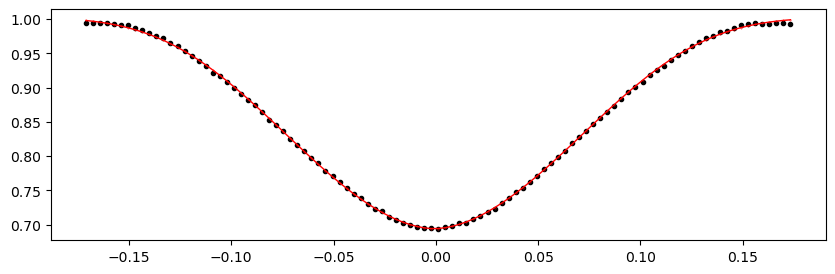

3142.94026 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 365.29it/s]


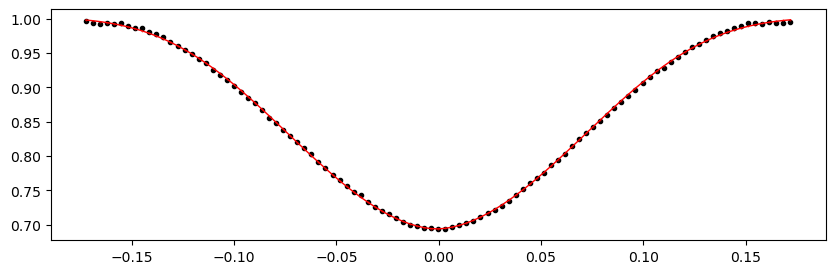

3143.6125199999997 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 364.25it/s]


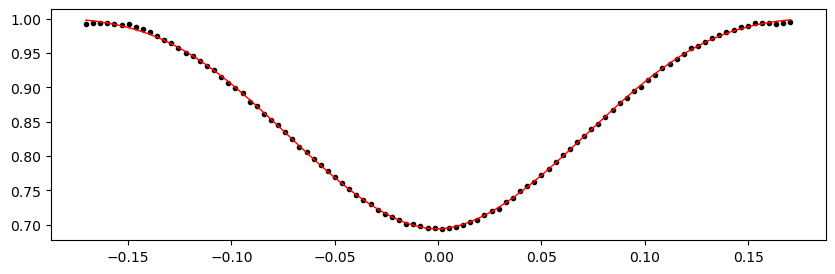

3144.28478 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 363.18it/s]


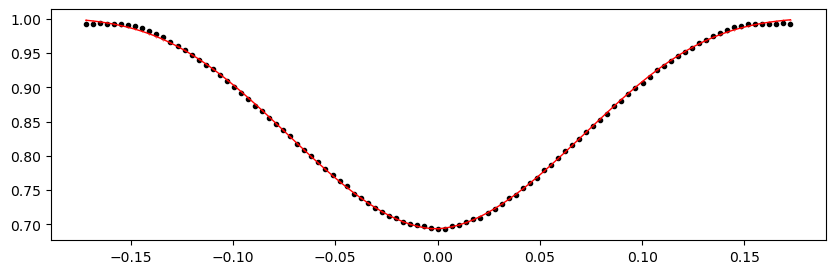

3144.9570400000002 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 362.39it/s]


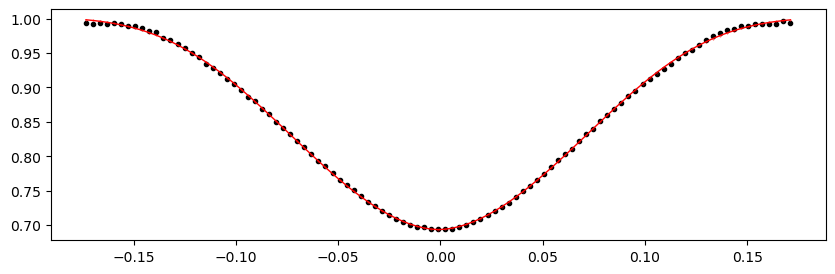

3145.6293 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 362.38it/s]


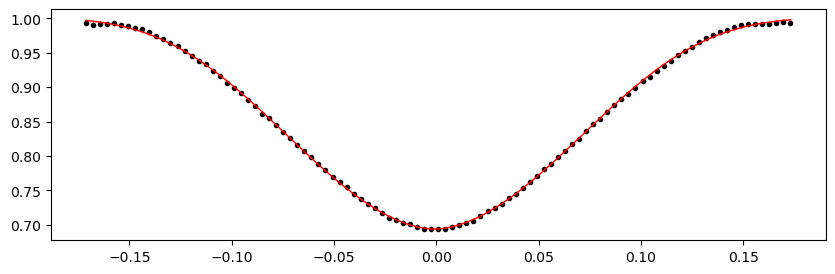

3146.30156 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 367.61it/s]


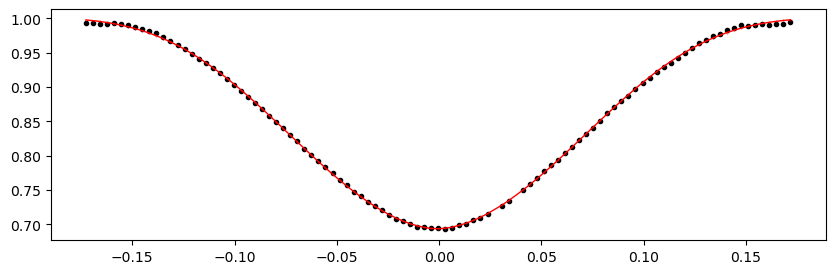

3146.97382 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 383.99it/s]


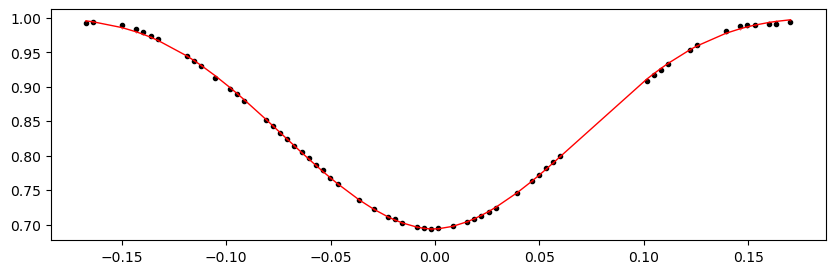

3147.64608 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 375.63it/s]


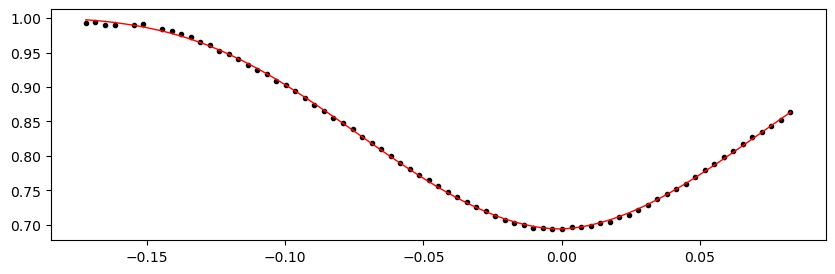

3148.31834 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 365.25it/s]


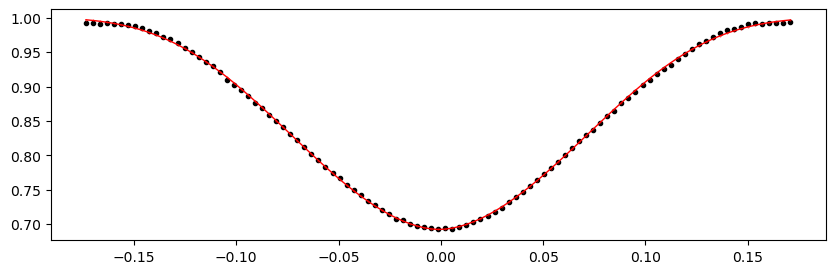

3148.9906 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 363.76it/s]


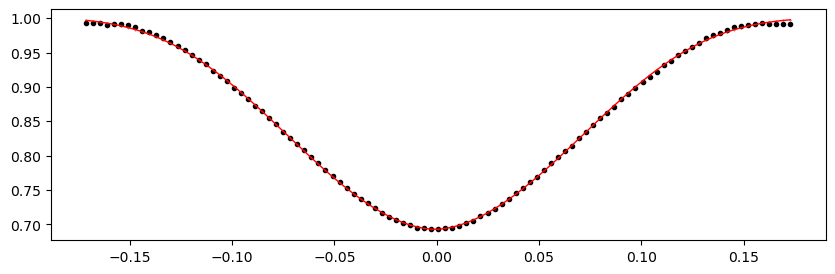

3155.04094 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.96it/s]


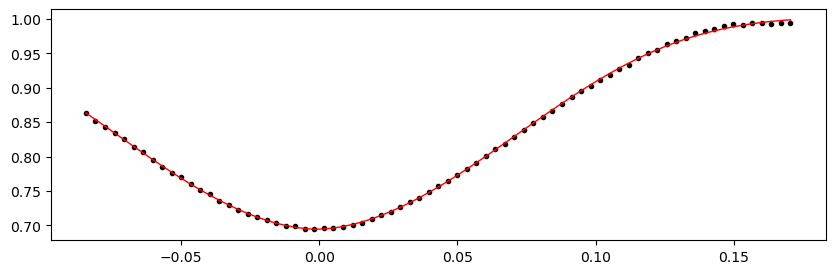

3155.7132 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 361.39it/s]


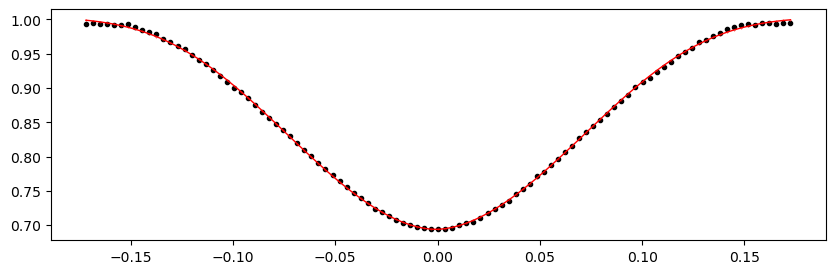

3156.38546 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 365.72it/s]


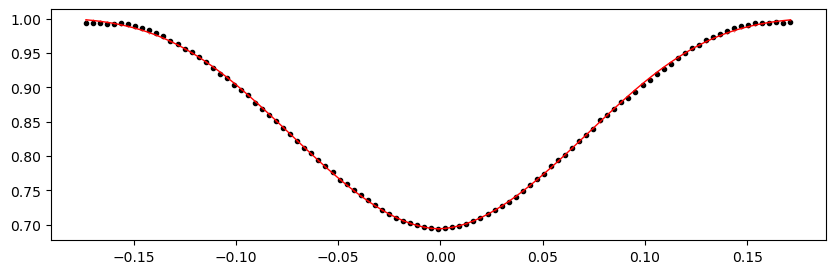

3157.05772 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 367.37it/s]


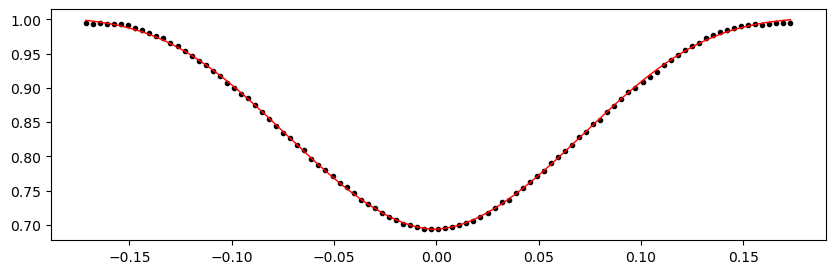

3157.72998 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 365.09it/s]


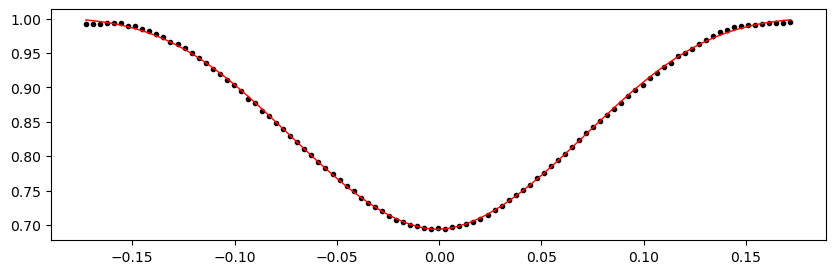

3158.40224 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 365.06it/s]


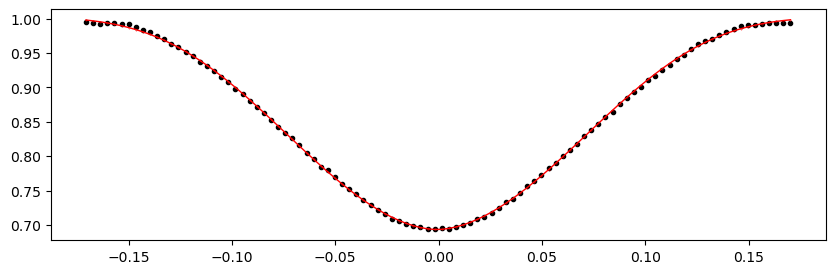

3159.0744999999997 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 363.32it/s]


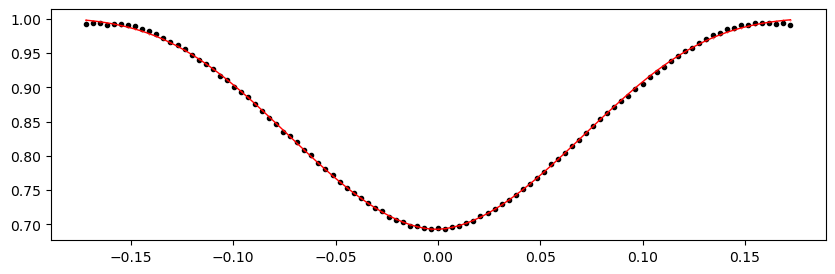

3159.74676 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 363.81it/s]


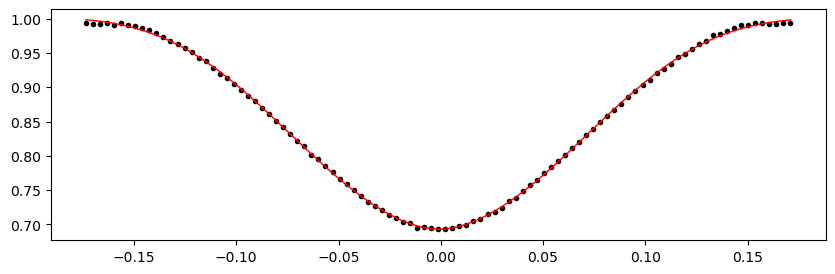

3160.4190200000003 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 364.66it/s]


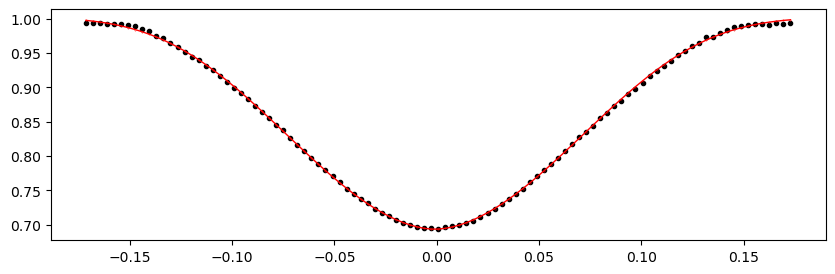

3161.0912799999996 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 365.04it/s]


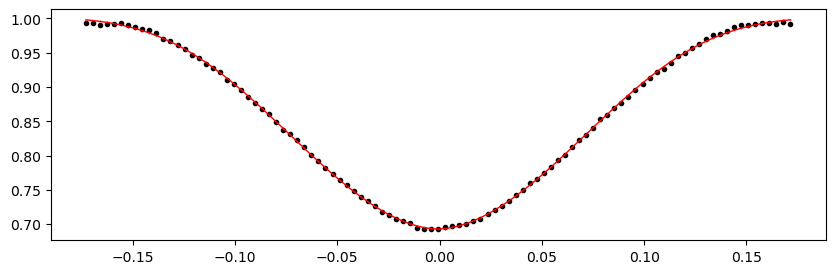

3161.76354 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 386.33it/s]


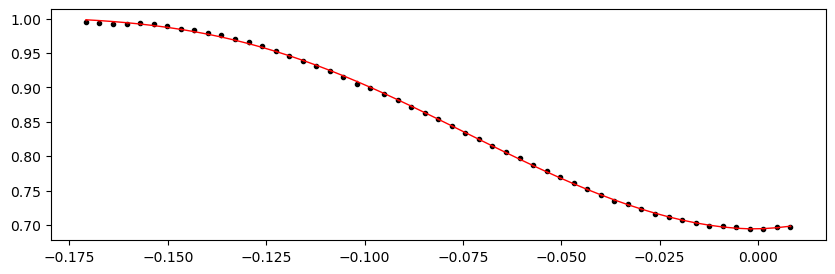

3162.4358 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 362.39it/s]


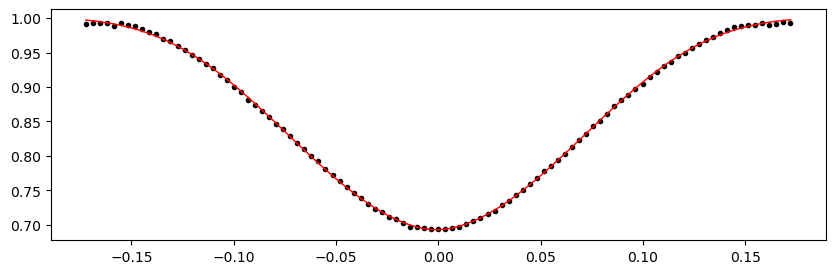

3163.10806 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 364.67it/s]


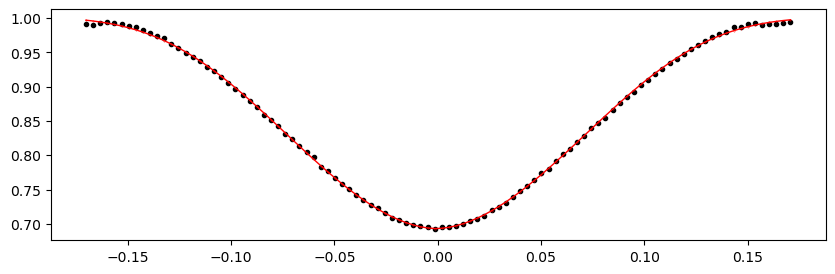

3163.78032 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 362.38it/s]


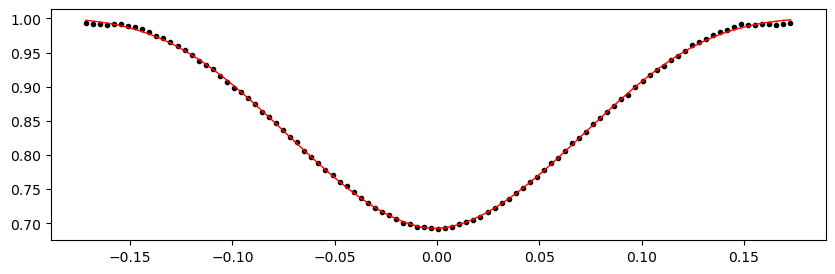

3164.45258 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 383.32it/s]


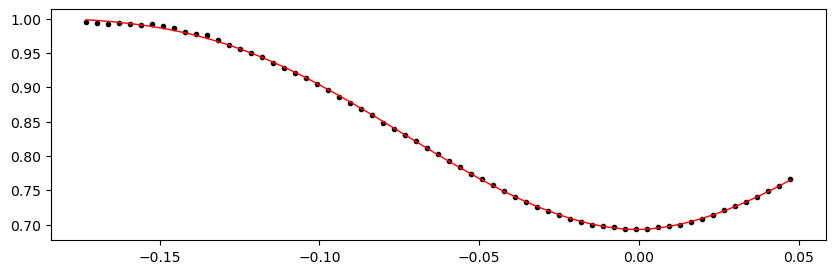

Time 3168.48614 does not have enough data points: 15
3169.1584000000003 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 362.75it/s]


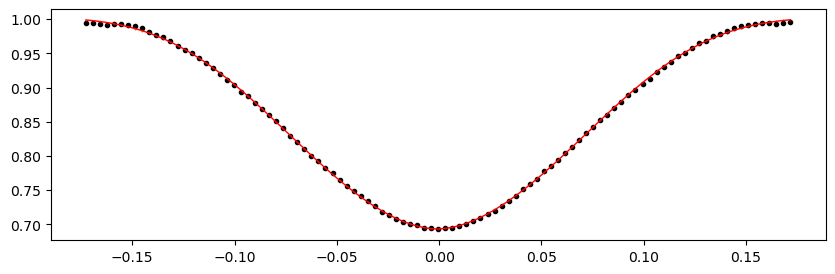

3169.8306599999996 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 363.61it/s]


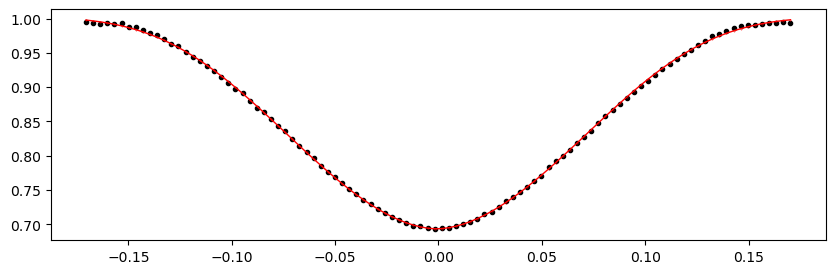

3170.50292 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 361.33it/s]


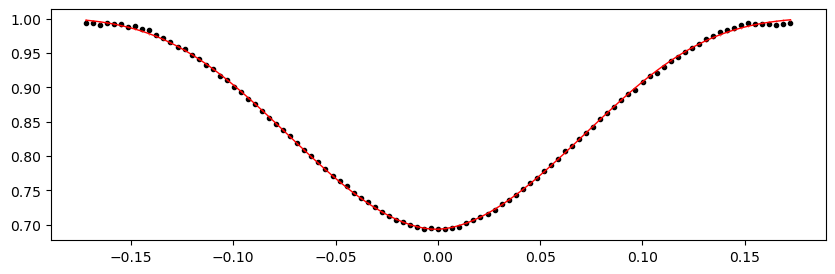

3171.17518 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 362.80it/s]


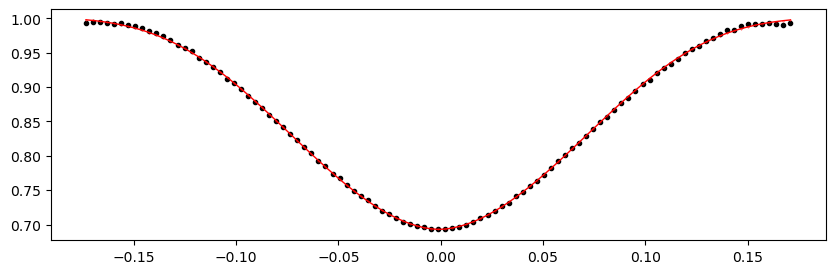

3171.84744 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 361.35it/s]


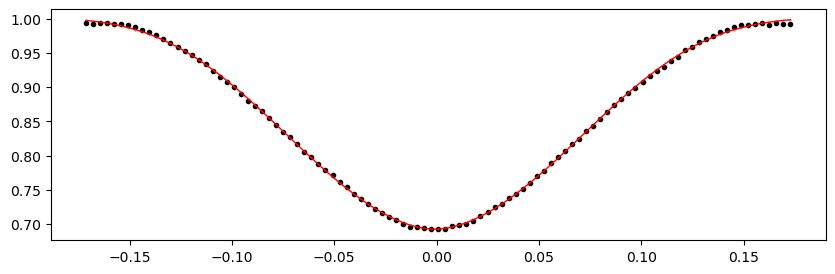

3172.5197 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 364.46it/s]


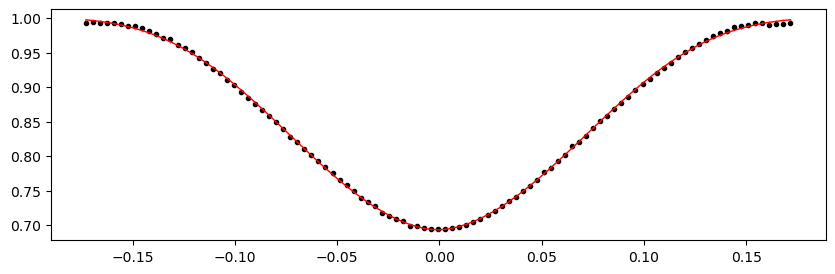

3173.19196 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 362.72it/s]


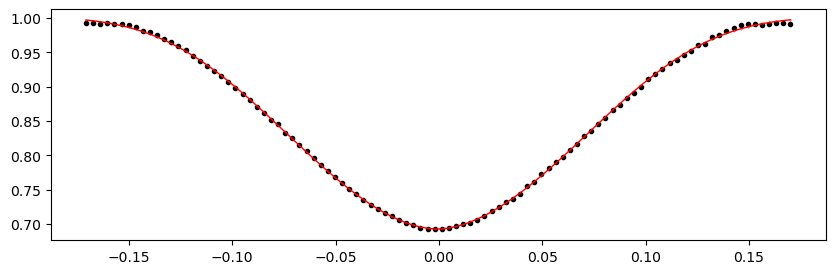

3173.86422 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 361.40it/s]


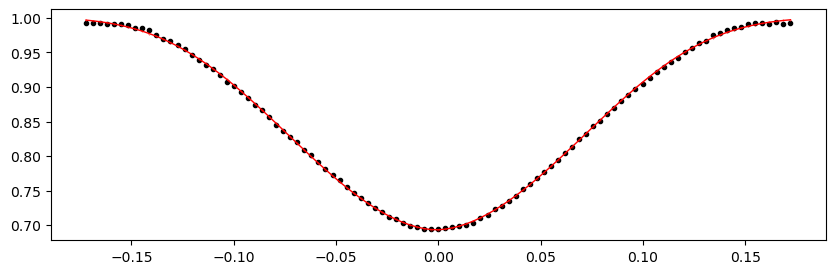

3174.5364799999998 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 368.42it/s]


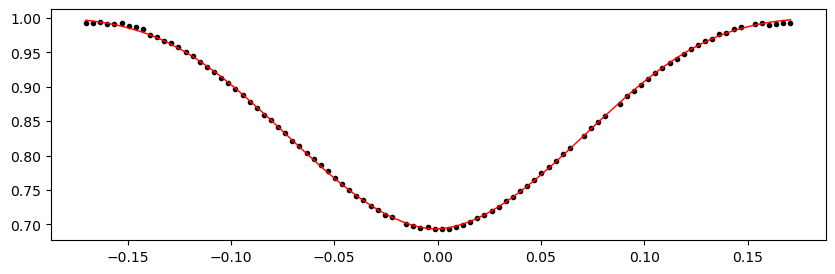

3175.20874 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 371.28it/s]


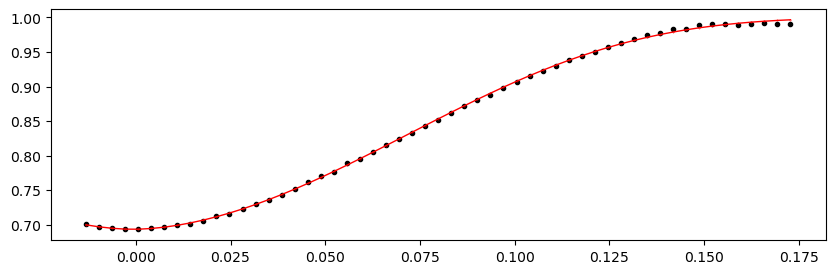

3175.881 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 362.61it/s]


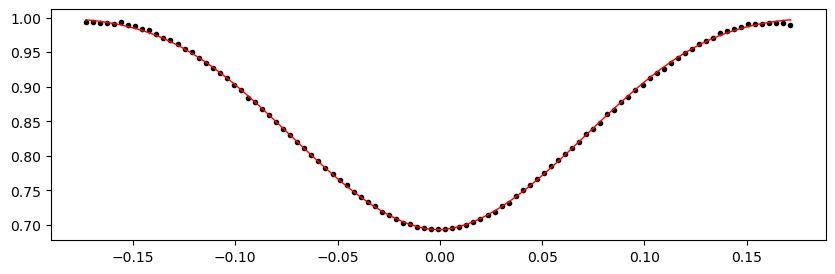

3176.5532599999997 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 367.03it/s]


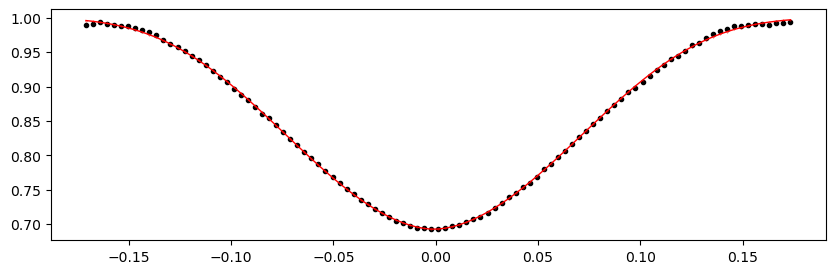

3177.22552 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 362.58it/s]


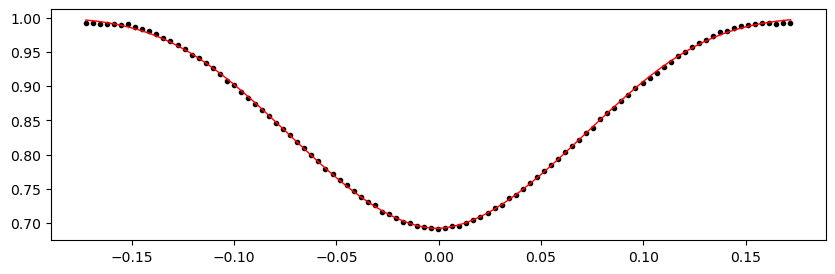

3177.8977800000002 1.0020241557448426 -0.30754700709979943 0.18582470803863016


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 362.36it/s]


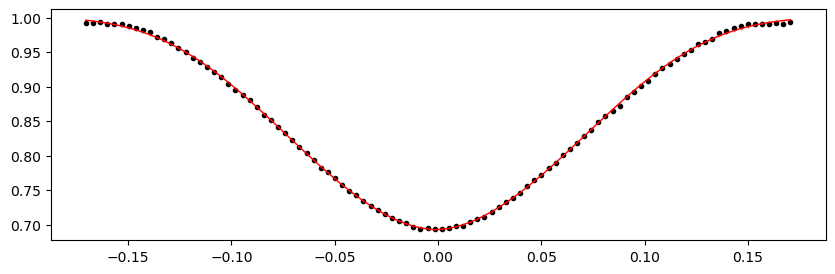

No secondary eclipses defined. No-Op.


In [19]:
%matplotlib inline

print("Fitting individual primary eclipses...")
etv_functions.fit_each_eclipse(data_primary, n_transits, t0_primary, period, mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau, outfile_path)
!$NOTIFY_CMD "Individual primary eclipses fit done"


# ---
%matplotlib inline

if t0_secondary is not None:
    print("Fitting individual secondary eclipses...")
    etv_functions.fit_each_eclipse(data_secondary, n_transits, t0_secondary, period, mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s, outfile_path_s)
    !$NOTIFY_CMD "Individual secondary eclipses fit done"
else:
    print("No secondary eclipses defined. No-Op.")


## ETV O-C plot

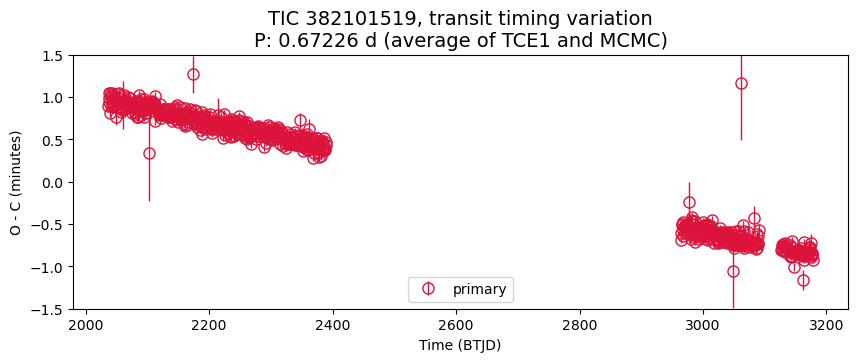

In [27]:
%matplotlib inline
# %matplotlib widget

#plot the extracted transit times to check for ETVs

num_rows = 2 if t0_secondary is not None else 1
figsize_y = 3.3 if num_rows == 1 else num_rows * 3.5

fig, axs = plt.subplots(num_rows, 1, figsize=(10, figsize_y), sharex=True)
if isinstance(axs, plt.Axes):  # handle edge case that num_rows == 1, returned axs is not a list
    axs = [axs]

in_df_primary = pd.read_csv(outfile_path)
in_df_primary['midpoint'] = in_df_primary['epoch'] + (in_df_primary['t0']*period)
in_df_primary['shift_mins'] = in_df_primary['t0']*period*24*60
in_df_primary['std_mins'] = in_df_primary['stdv_t0']*period*24*60


axs[0].errorbar(in_df_primary['epoch'], in_df_primary['shift_mins'], yerr = in_df_primary['std_mins'], 
             lw = 0, marker = 'o', elinewidth = 1, markersize = 8, color = 'None', ecolor='crimson', markeredgecolor = 'crimson', label="primary")

if t0_secondary is not None:
    in_df_secondary = pd.read_csv(outfile_path_s)
    in_df_secondary['midpoint'] = in_df_secondary['epoch'] + (in_df_secondary['t0']*period)
    in_df_secondary['shift_mins'] = in_df_secondary['t0']*period*24*60
    in_df_secondary['std_mins'] = in_df_secondary['stdv_t0']*period*24*60
    axs[1].errorbar(in_df_secondary['epoch'], in_df_secondary['shift_mins'], yerr = in_df_secondary['std_mins'], 
                 lw = 0, marker = 'x', elinewidth = 1, markersize = 9, color = 'navy', zorder = -2, label="secondary" );

for ax in axs:
    ax.set_ylabel("O - C (minutes)")
    ax.set_ylim(-1.5, 1.5)
    ax.legend();

axs[-1].set_xlabel("Time (BTJD)")
axs[0].set_title(f"TIC {ticid}, transit timing variation\nP: {period} d (average of TCE1 and MCMC)", fontsize=14)

plt.subplots_adjust(hspace=0.05)
plt.show()

### Results from TCE1 / MCMC Periods

Looking at the results from TCE1 Period and the one from MCMC Period above, it seems that there is a possiblity that the O-C shift is due to imprecise period.

with MCMC Period:

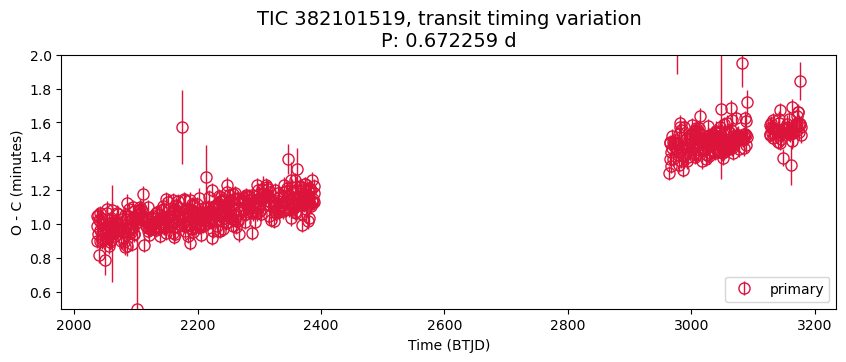


---

with TCE1 Period: 

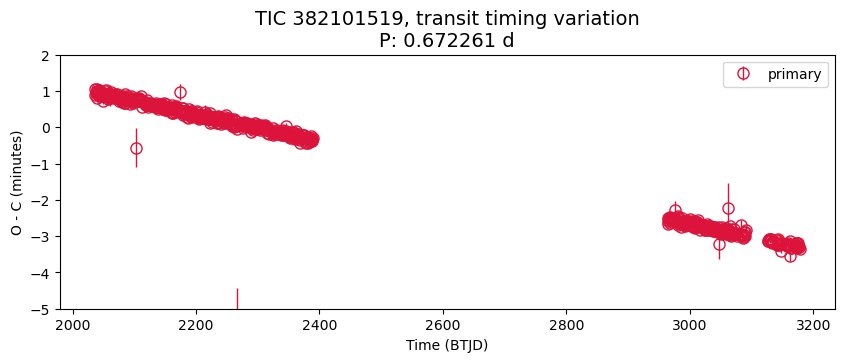


## make a periodogram 

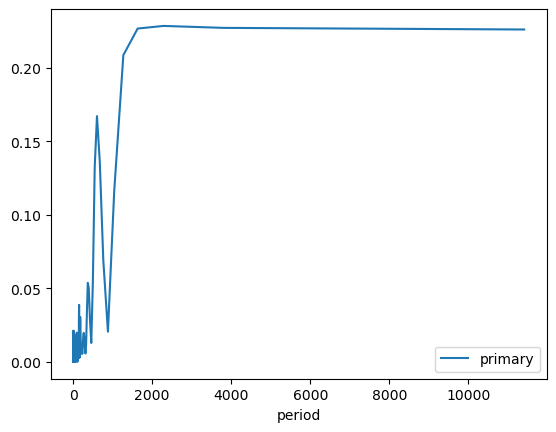

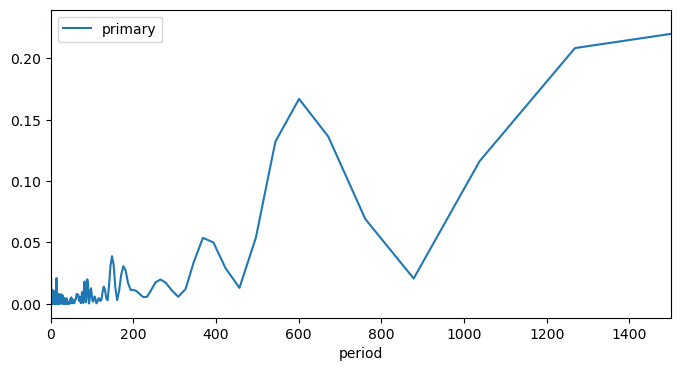

In [29]:
frequency, power = LombScargle(in_df_primary['epoch'], in_df_primary['shift_mins']).autopower()

fig, ax = plt.subplots()

plt.plot(1/frequency, power, label = 'primary')    

if t0_secondary is not None:
    frequency_s, power_s = LombScargle(in_df_secondary['epoch'], in_df_secondary['shift_mins']).autopower()
    plt.plot(1/frequency_s, power_s, label = 'secondary')    

plt.xlabel("period")

plt.legend()
plt.show()

if True:
    fig, ax = plt.subplots(figsize=(8, 4))
    
    plt.plot(1/frequency, power, label = 'primary')    
    
    if t0_secondary is not None:
        frequency_s, power_s = LombScargle(in_df_secondary['epoch'], in_df_secondary['shift_mins']).autopower()
        plt.plot(1/frequency_s, power_s, label = 'secondary')    
    
    plt.xlabel("period")
    
    plt.legend()
    plt.xlim(0, 1500)
    plt.show()

## Results Summary

In [30]:
# FILL-IN the ETV results / comments
has_etv = "?"
comments = "Steadily increasing O-C that appears to span over 1000 days (small amplitude, ~1min). Some chance due to imprecise period. Included 7 sectors of 200s TESS-SPOC data to increase the time span."

# Eclipse depth from the model
depth_pct_p = round(-mean_alpha1 * 100, 2)
if t0_secondary is not None:
    depth_pct_s = round(-mean_alpha1_s * 100, 2)
else:
    depth_pct_s = None

summary = {
    "tic": ticid,
    "has_etv": has_etv,
    "comments": comments,
    "period": period,  # the period used in ETV analysis
    "depth_pct_p": depth_pct_p,
    "depth_pct_s": depth_pct_s,
    "epoch_p": t0_primary,
    "epoch_s": t0_secondary,
    "num_sectors": len(sr),
    "time_span": round(time[-1] - time[0], 2),
    "time_start": round(time[0], 2),
    "time_end": round(time[-1], 2),
}

summary = pd.DataFrame.from_dict(summary, orient="index")
with pd.option_context('display.max_colwidth', None, 'display.max_rows', 999, 'display.max_columns', 99):
    display(summary);

# Single line to be added to a CSV
print("")
print(summary.transpose().to_csv(
    index=False,
    header=True, 
))

,0
tic,382101519
has_etv,?
comments,"Steadily increasing O-C that appears to span over 1000 days (small amplitude, ~1min). Some chance due to imprecise period. Included 7 sectors of 200s TESS-SPOC data to increase the time span."
period,0.67226
depth_pct_p,30.75
depth_pct_s,None
epoch_p,2036.4003
epoch_s,None
num_sectors,20
time_span,1145.86



tic,has_etv,comments,period,depth_pct_p,depth_pct_s,epoch_p,epoch_s,num_sectors,time_span,time_start,time_end
382101519,?,"Steadily increasing O-C that appears to span over 1000 days (small amplitude, ~1min). Some chance due to imprecise period. Included 7 sectors of 200s TESS-SPOC data to increase the time span.",0.67226,30.75,,2036.4003,,20,1145.86,2036.28,3182.14

